In [1]:
import sys
import os
sys.path.append(os.path.abspath("/home/jose/Dropbox/Doktorarbeit/"))
from collections import Counter
import matplotlib.pyplot as plt
%matplotlib inline
from reading_robot import load_data, describe_data, get_metadata, classify, st_tests, text2features, feature_analysis
import pandas as pd
import glob
import os
import re
import numpy as np
from scipy import stats

In [2]:
wdir = "/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/"

# Getting Data

In [3]:
corde_freq_df = pd.read_parquet(wdir + "corde_comp_low_7000.pqt")
corde_freq_df.shape

/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


(34152, 7000)

In [4]:
corde_freq_df.head()

token,de,se,una,para,la,",",en,el,y,a,...,pasamos,veinticinco,vol,tam,vertical,nº,pétalos,bsol,pereza,huellas
aazorin,2126.0,748.0,626.0,130.0,1560.0,3735.0,1274.0,1077.0,1700.0,980.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
abacca,4911.0,880.0,879.0,349.0,2808.0,6764.0,2075.0,1790.0,2313.0,1284.0,...,1.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0
abaddon,7327.0,2059.0,1395.0,808.0,4541.0,11181.0,3573.0,3594.0,4248.0,2978.0,...,1.0,2.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0
abadengo,5029.0,829.0,358.0,335.0,2155.0,7101.0,2156.0,2351.0,1839.0,1286.0,...,1.0,2.0,2.0,13.0,0.0,0.0,0.0,0.0,0.0,0.0
abajo,1786.0,551.0,300.0,129.0,1117.0,2664.0,625.0,728.0,1310.0,933.0,...,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
corde_metadatos_df = pd.read_csv(wdir + "corde_comp_metadatos.csv", sep = "\t", index_col = 0)
corde_metadatos_df.shape

(34155, 17)

In [6]:
corde_metadatos_df.index = corde_metadatos_df["archivo"]

In [7]:
corde_metadatos_df.head()

,archivo,titulo,autor,pais,fechacre,tema,medio,formas,tokens,types,prim_fecha,siglo,continente,matiz_fecha,prim_tema,secund_tema,abs_tema
archivo,,,,,,,,,,,,,,,,,
defunsio,defunsio,Defunsión de don Enrique de Villena,Marqués de Santillana (Íñigo López de Mendoza),España,1434,Verso lírico culto: Individual,Libro,1205,1404,680,1434,15,Europa,NaN,Verso lírico culto,Individual,Verso
docramirsub139,docramirsub139,Concesión del derecho de usufructo de una casa...,Anónimo,España,1094,Derecho: Documentos notariales,Libro,382,409,218,1094,11,Europa,NaN,Derecho,Documentos notariales,Técnico
rosagentsub25,rosagentsub25,Romance [Rosa gentil. Tercera parte de romance...,Anónimo,España,1573,Verso lírico culto: En obras colectivas,Libro,351,388,203,1573,16,Europa,NaN,Verso lírico culto,En obras colectivas,Verso
noticiersub11,noticiersub11,Sin título [El Noticiero Universal. Diario ind...,Anónimo,España,1899,Prensa,Prensa,73,84,56,1899,19,Europa,NaN,Prensa,Prensa,Técnico
heclesia,heclesia,Historia eclesiástica de España. Tomo I: El cr...,"García Villada, Zacarías",España,1929,Religión: Otros,Libro,266259,323574,29245,1929,20,Europa,NaN,Religión,Otros,Técnico


# Cleaning Data

In [8]:
documents_over_100_tokens_lt = list(corde_freq_df.sum(axis=1)[corde_freq_df.sum(axis=1) > 100].index)

In [9]:
len(documents_over_100_tokens_lt)

29867

In [10]:
corde_metadatos_long_doctuments_df = corde_metadatos_df.loc[documents_over_100_tokens_lt]

In [11]:
corde_metadatos_modern_df = corde_metadatos_long_doctuments_df.loc[corde_metadatos_long_doctuments_df["siglo"]>15].dropna(subset=["prim_tema"])

In [12]:
corde_modern_freq_df = corde_freq_df.loc[corde_metadatos_modern_df.index]

In [13]:
for text in corde_modern_freq_df.index.tolist():
    sum_ = corde_modern_freq_df.loc[text].sum()
    if sum_ > 1000 + corde_metadatos_modern_df.loc[text]["tokens"]:
        print(text)


cocina~1
floresta


In [14]:
corde_modern_freq_df = corde_modern_freq_df.drop(["cocina~1","floresta"])

In [15]:
corde_metadatos_modern_df = corde_metadatos_modern_df.drop(["cocina~1","floresta"])

In [16]:
corde_metadatos_modern_df.index.tolist() == corde_modern_freq_df.index.tolist()

True

In [17]:
corde_metadatos_modern_df.shape

(18709, 17)

In [18]:
corde_modern_freq_df.shape

(18709, 7000)

In [19]:
corde_modern_freq_df.sum().sum()

192404282.0

In [20]:
classes_lt = sorted(list(set(corde_metadatos_modern_df["prim_tema"])))

In [21]:
corde_metadatos_modern_df = pd.merge(corde_metadatos_modern_df,pd.get_dummies(corde_metadatos_modern_df[["prim_tema"]], prefix="", prefix_sep=""), left_index =True, right_index=True)

In [22]:
corde_metadatos_modern_df

,archivo,titulo,autor,pais,fechacre,tema,medio,formas,tokens,types,...,Prosa narrativa extensa,Religión,Sociedad,Verso dramático,Verso dramático breve,Verso dramático extenso,Verso lírico culto,Verso lírico tradicional,Verso narrativo culto,Verso narrativo tradicional
archivo,,,,,,,,,,,,,,,,,,,,,
aazorin,aazorin,Antonio Azorín,Azorín (José Martínez Ruiz),España,1903,Prosa narrativa extensa: Novela y otras formas...,Libro,46506,55549,9088,...,1,0,0,0,0,0,0,0,0,0
abacca,abacca,Invitación a filosofar,"García Bacca, Juan David",España,1940 1942,ciencias sociales y humanidades: Filosofía y é...,Libro,72409,86842,7569,...,0,0,0,0,0,0,0,0,0,0
abaddon,abaddon,Abaddón el exterminador,"Sábato, Ernesto",Argentina,1974,Prosa narrativa extensa: Novela y otras formas...,Libro,151432,176986,20650,...,1,0,0,0,0,0,0,0,0,0
abadengo,abadengo,El Abadengo de Sahagún. Contribución al estudi...,"Puyol y Alonso, Julio",España,1915,Prosa didáctica: Oratoria y discurso,Libro,77110,93321,13484,...,0,0,0,0,0,0,0,0,0,0
abajo,abajo,Los de abajo,"Azuela, Mariano",México,1916,Prosa narrativa extensa: Novela y otras formas...,Libro,35183,44511,7423,...,1,0,0,0,0,0,0,0,0,0
abate,abate,Cartas a su hermano don Carlos Andrés,"Andrés, Juan",España,1793,Historia y documentos: Cartas y relaciones,Libro,16514,18768,3270,...,0,0,0,0,0,0,0,0,0,0
abc1974sub10,abc1974sub10,"Yanguas Messía [ABC, 4 de julio de 1974]","Azcárraga, José Luis de",España,1974,Prensa,Prensa,789,960,428,...,0,0,0,0,0,0,0,0,0,0
abc1974sub100,abc1974sub100,Elección para cubrir concejalías vacantes [ABC...,Anónimo,España,1974,Prensa: Política y gobierno,Prensa,150,168,104,...,0,0,0,0,0,0,0,0,0,0
abc1974sub101,abc1974sub101,"Se hacen efectivos los despidos de Elsa [ABC, ...",Anónimo,España,1974,Prensa,Prensa,268,300,152,...,0,0,0,0,0,0,0,0,0,0


In [23]:
classes_lt

['Artes y espectáculos',
 'Ciencias aplicadas',
 'Ciencias exactas, físicas y naturales',
 'Ciencias sociales y humanidades',
 'Derecho',
 'Historia y documentos',
 'Prensa',
 'Prosa',
 'Prosa didáctica',
 'Prosa dramática',
 'Prosa dramática breve',
 'Prosa dramática extensa',
 'Prosa lírica',
 'Prosa narrativa breve',
 'Prosa narrativa extensa',
 'Religión',
 'Sociedad',
 'Verso dramático',
 'Verso dramático breve',
 'Verso dramático extenso',
 'Verso lírico culto',
 'Verso lírico tradicional',
 'Verso narrativo culto',
 'Verso narrativo tradicional']

In [24]:
len(classes_lt)

24

In [25]:
classification_results_df = pd.read_csv(wdir + "results.tsv", sep="\t", index_col = 0)

In [26]:
classification_results_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier
152,Prosa lírica,1.000,1.000,1.000,1.000,1.000,0.500,0.500,SVC,binary,2000,False,[1. 1. 0.67 1. 1. 0. 0. 1. 0. ...,1.404023e-04,archivo\ndocupintsub57 0\nplatero ...,30,10,5,"SVC(C=1.0, cache_size=200, class_weight=None, ..."
118,Prosa dramática,1.000,1.000,1.000,1.000,1.000,0.500,0.500,RF,tfidf,4000,False,[1. 0.67 1. 1. 1. 1. 1. 1. 1. ...,9.003515e-20,archivo\nvaldiviesub9 1\ncampeonsub13 ...,40,10,5,BaggingClassifier(base_estimator=DecisionTreeC...
555,Prosa dramática extensa,0.988,1.000,0.977,0.987,0.988,0.500,0.488,Ridge,log,3000,False,[1. 0.92 0.96 1. 1. 0.96 0.89 0.96 0.92 ...,5.674879e-58,archivo\nvalleincsub4 1\ncrxsub90 ...,244,10,5,"RidgeClassifier(alpha=1.0, class_weight=None, ..."
574,Prosa dramática extensa,0.988,0.992,0.985,0.987,0.988,0.500,0.488,Ridge,binary,4000,False,[1. 1. 1. 1. 1. 1. 1. 0.96 0.92 ...,1.355723e-63,archivo\namorpues 1\nlatigra ...,244,10,5,"RidgeClassifier(alpha=1.0, class_weight=None, ..."
548,Prosa dramática extensa,0.988,0.992,0.985,0.987,0.988,0.500,0.488,Ridge,binary,2000,True,[0.96 0.96 1. 0.96 1. 1. 1. 0.92 1. ...,5.374440e-61,archivo\ncansepulsub9 0\nelpublic ...,244,10,5,"RidgeClassifier(alpha=1.0, class_weight=None, ..."
113,"Ciencias exactas, físicas y naturales",0.986,0.981,0.992,0.986,0.986,0.500,0.486,LR,zscores,5000,True,[1. 1. 0.9 0.91 0.96 0.96 0.96 1. 1. ...,7.706524e-59,archivo\nobsastro 1\nromance1sub18 ...,216,10,5,"LogisticRegression(C=1.0, class_weight=None, d..."
133,Prosa dramática extensa,0.985,0.992,0.979,0.984,0.984,0.500,0.485,SVC,binary,1000,True,[1. 1. 0.96 1. 1. 0.92 1. 0.89 0.92 ...,4.131824e-59,archivo\ncuartopo 1\ntoreros ...,244,10,5,"SVC(C=1.0, cache_size=200, class_weight=None, ..."
136,Prosa dramática extensa,0.985,1.000,0.970,0.984,0.984,0.500,0.485,SVC,log,4000,True,[0.96 1. 1. 0.96 0.92 1. 1. 0.96 1. ...,2.722780e-61,archivo\nbodas 1\nelbaile ...,244,10,5,"SVC(C=1.0, cache_size=200, class_weight=None, ..."
137,Prosa dramática extensa,0.985,1.000,0.971,0.984,0.984,0.500,0.485,SVC,log,5000,True,[1. 0.96 0.96 1. 1. 1. 0.92 1. 0.96 ...,2.983320e-58,archivo\npresiden 1\nperiodissub178 ...,244,10,5,"SVC(C=1.0, cache_size=200, class_weight=None, ..."
575,Prosa dramática extensa,0.984,1.000,0.970,0.983,0.983,0.500,0.484,Ridge,binary,5000,False,[1. 1. 0.92 1. 1. 0.92 0.96 0.96 0.96 ...,6.981717e-62,archivo\ndocfilipsub138 0\nepisolmesub270 ...,244,10,5,"RidgeClassifier(alpha=1.0, class_weight=None, ..."


In [27]:
classification_results_df.shape

(5520, 19)

# Classifying by Decade

In [28]:
corde_metadatos_modern_df["decade"] = corde_metadatos_modern_df["prim_fecha"].astype(str).str.slice(0,3)+"0"

In [29]:
sorted(list(set(corde_metadatos_modern_df["prim_fecha"])))[-10:]

[1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974]

In [43]:
for decade_nr in sorted(list(set(corde_metadatos_modern_df["decade"]))):
    print("decade: ", decade_nr)
    
    texts_decade_lt = corde_metadatos_modern_df.loc[corde_metadatos_modern_df["decade"] == decade_nr].index.tolist()
    
    results_decade_df = classify.classify(wdir, freq_table = corde_modern_freq_df.loc[texts_decade_lt],
                  metadata = corde_metadatos_modern_df.loc[texts_decade_lt], classes = classes_lt,
                  methods = ["LR"], max_MFFs = [3000], 
                  text_representations=["log"],
                  under_sample_method = "lpc-max", typographies=[True],
                                 sampling_times = 3, maximum_cases = 1000)
    
    results_decade_df.to_csv(wdir + "results_1000_decade_"+str(decade_nr) + ".tsv", sep="\t")


decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0  203.0  160.0  4.0  84.0   
ahbilb2bsub19  268.0  28.0  0.0  29.0  124.0  329.0  154.0   96.0  1.0  56.0   
ahbilb2bsub20   96.0  11.0  0.0   2.0   34.0  116.0   31.0   25.0  0.0  14.0   
ahpg1500sub7    24.0   0.0  0.0   0.0    7.0   15.0    7.0    6.0  0.0   0.0   

token           ...     pasamos  veinticinco  vol  tam  vertical   nº  \
archivo         ...                                                     
ahbilb2bsub17   ...         0.0          0.0  0.0  0.0       0.0  0.0   
ahbilb2bsub18   ...         0.0          0.0  0.0  0.0       0.0  0.0   
ahbilb2bsub19   ...         0.0          0.0  0.0  0.0       0.0  0.0   
ahbilb2bsub20   ...         0.0          0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(595,)
(595, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(595,)
(595, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.264672753330416, pvalue=2.6797326694412942e-21)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.899
rec         0.900
prec        0.942
f1_macro    0.903
f1_micro    0.908
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.399


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 586, '1': 9})
Some 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.3097147320619795, pvalue=1.112843011387802e-06)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.889
rec         0.889
prec        0.889
f1_macro    0.926
f1_micro    0.944
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.389


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 593, '1': 2})
Some o

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(595,)
(595, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(595,)
(595, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.7905694150420949, pvalue=0.4650226382607571)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.465
Baseline: 		 0.5
LR
0.0


analysed class:	 Ciencias sociales y humanidades

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.8062430400804566, pvalue=0.014007122329599973)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.800
rec         0.800
prec        0.800
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.014
Baseline: 		 0.5
LR
0.30000000000000004


analysed class:	 Derecho
* Culling data
labels do

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (434,) (434, 3000) lpc-max
cross validation sampling of  Derecho
(595,)
(595, 3000)
undersampling lpc-max
undersampled (434,) (434, 3000) lpc-max
cross validation sampling of  Derecho
(595,)
(595, 3000)
undersampling lpc-max
undersampled (434,) (434, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=119.16682622963762, pvalue=1.4152415945730537e-40)
Class: 	 Derecho
Scores:
 	 f1          0.970
rec         0.972
prec        0.969
f1_macro    0.970
f1_micro    0.970
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.47


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 525, '1': 70})
All your class values had more than 10 examples.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (140,) (140, 3000) lpc-max
cross validation sampling of  Historia y documentos
(595,)
(595, 3000)
undersampling lpc-max
undersampled (140,) (140, 3000) lpc-max
cross validation sampling of  Historia y documentos
(595,)
(595, 3000)
undersampling lpc-max
undersampled (140,) (140, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=41.822665618758386, pvalue=1.7808104865956017e-27)
Class: 	 Historia y documentos
Scores:
 	 f1          0.941
rec         0.943
prec        0.948
f1_macro    0.942
f1_micro    0.943
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44099999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 595})
A

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 595})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  595
Labels shape (595,) 
 Data shape (595, 7000)
size after culling data: (595, 7000) (595,)
typography  True
textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 594, '1': 1})
Some of your class values have less than 10 examples. We are going to cul

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(595,)
(595, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(595,)
(595, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 591, '1': 4})
Some of your class values have less than 10 examples. We are

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(595,)
(595, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(595,)
(595, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 586, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mix

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.031128874149275, pvalue=0.00043103582668107415)
Class: 	 Sociedad
Scores:
 	 f1          0.852
rec         0.889
prec        0.833
f1_macro    0.815
f1_micro    0.833
dtype: float64
p-value:  0.0004
Baseline: 		 0.5
LR
0.352


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 595})
All your class values had more than 10 examples. Congrats :)
Least popupa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 592, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(595,)
(595, 7000)
Counter({'0': 592, '1': 3})
(595, 7000) (595,)
Least popupated class value:	  3
Labels shape (595,) 
 Data shape (595, 6333)
size after culling data: (595, 6333) (595,)
typography  True
textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersamp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(594, 6329)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['ven', 'males', 'pocas']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 531, '1': 64})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  64
Labels shape (595,) 
 Data shape (595, 7000)
size after culling data: (595, 7000) (595,)
typography  True
textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (128,) (128, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(595,)
(595, 3000)
undersampling lpc-max
undersampled (128,) (128, 3000) lpc-max
cross vali

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(595,)
(595, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.923284148787372, pvalue=2.149750972476267e-09)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.963
rec         1.000
prec        0.944
f1_macro    0.926
f1_micro    0.944
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46299999999999997


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(595,)
(595, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(595,)
(595, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.0, pvalue=1.0)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  1.0
Baseline: 		 0.5
LR
0.0


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 591, '1': 4})
Some of your class values have less than 10 e

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(595,)
(595, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(595,)
(595, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.574271077563377, pvalue=1.139882064396182e-06)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004
                                   class  mean_f1  mean_rec  mean_prec  \
0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(549,)
(549, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(549,)
(549, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(549,)
(549, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=52.5324729504115, pvalue=2.604080504713716e-30)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.980
rec         1.000
prec        0.967
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 548, '1': 1})
Some of y

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(548, 6260)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['anda', 'dineros', 'alcaldes']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 548, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['m18']
(549,)
(549, 7000)
Counter({'0': 548})
(548, 7000) (548,)
Least popupated class value:	  548
Labels shape (548,) 
 Data shape (548, 6280)
size after culling data: (548, 6280) (548,)
typography  True
textual representation:  log
Columns that are empty:  []
(548, 6280)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['quienes', 'oy', 'condición']
After culling the class Ci

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(549,)
(549, 3000)
undersampling lpc-max
undersampled (194,) (194, 3000) lpc-max
cross validation sampling of  Derecho
(549,)
(549, 3000)
undersampling lpc-max
undersampled (194,) (194, 3000) lpc-max
cross validation sampling of  Derecho
(549,)
(549, 3000)
undersampling lpc-max
undersampled (194,) (194, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=67.88598358964391, pvalue=1.628984057296896e-33)
Class: 	 Derecho
Scores:
 	 f1          0.966
rec         0.980
prec        0.953
f1_macro    0.964
f1_micro    0.964
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46599999999999997


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 544, '1': 5})
Some of your class values have less 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 6286)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['valle', 'voces', 'quienes']
method used:	 LR
(549,)
(549, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(549,)
(549, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(549,)
(549, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.4459412925079226, pvalue=0.6624587091730737)
Class: 	 Historia y documentos
Scores:
 	 f1          0.533
rec         0.600
prec        0.500
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.6625
Baseline: 		 0.5
LR
0.03300000000000003


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 549})
All your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 549})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  549
Labels shape (549,) 
 Data shape (549, 7000)
size after culling data: (549, 7000) (549,)
typography  True
textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 548, '1': 1})
Some of your class values have less than 10 examples. We are going to cul

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(548, 6269)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['junta', 'carrera', 'acto']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 545, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(549,)
(549, 7000)
Counter({'0': 545, '1': 4})
(549, 7000) (549,)
Least popupated class value:	  4
Labels shape (549,) 
 Data shape (549, 6286)
size after culling data: (549, 6286) (549,)
typography  True
textual representation:  log
Columns that are empty:  []
(549, 6286)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['valle', 'voces', 'quienes']
method used:	 LR
(549,)
(549, 3000)
undersampling lpc-max
undersampled (8

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 540, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(549,)
(549, 7000)
Counter({'0': 540, '1': 9})
(549, 7000) (549,)
Least popupated class value:	  9
Labels shape (549,) 
 Data shape (549, 6286)
size after culling data: (549, 6286) (549,)
typography  True
textual representation:  log
Columns that are empty:  []
(549, 6286)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['valle', 'voces', 'quienes']
method used:	 LR
(549,)
(549, 3000)
undersa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 6286)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['valle', 'voces', 'quienes']
method used:	 LR
(549,)
(549, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(549,)
(549, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(549,)
(549, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.999999999999993, pvalue=3.9603725947724346e-15)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 443, '1': 106})
All your cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(549,)
(549, 3000)
undersampling lpc-max
undersampled (212,) (212, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(549,)
(549, 3000)
undersampling lpc-max
undersampled (212,) (212, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(549,)
(549, 3000)
undersampling lpc-max
undersampled (212,) (212, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=102.86181960482136, pvalue=9.993474631418171e-39)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.985
rec         0.980
prec        0.992
f1_macro    0.985
f1_micro    0.985
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.485


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 545, '1': 4})
So

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 6286)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['valle', 'voces', 'quienes']
method used:	 LR
(549,)
(549, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(549,)
(549, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(549,)
(549, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.52693242584099, pvalue=0.004740328193977791)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0047
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 54

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 548, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['caraji']
(549,)
(549, 7000)
Counter({'0': 548})
(548, 7000) (548,)
Least popupated class value:	  548
Labels shape (548,) 
 Data shape (548, 6280)
size after culling data: (548, 6280) (548,)
typography  True
textual representation:  log
Columns that are empty:  []
(548, 6280)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['quienes', 'oy', 'condición']
After culling the class

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 6657)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(207,)
(207, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(207,)
(207, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.7905694150420949, pvalue=0.4650226382607571)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.465
Baseline: 		 0.5
LR
0.0


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 207})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 207})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  207
Labels shape (207,) 
 Data shape (207, 7000)
size after culling data: (207, 7000) (207,)
typography  True
textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored


analysed class:	 Derecho
* Culling data
labels done
Counter({'1': 133, '0': 74})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Historia y documentos
(207,)
(207, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Historia y documentos
(207,)
(207, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.3255086586837646, pvalue=0.1953504947652738)
Class: 	 Historia y documentos
Scores:
 	 f1          0.583
rec         0.600
prec        0.600
f1_macro    0.623
f1_micro    0.675
dtype: float64
p-value:  0.1954
Baseline: 		 0.5
LR
0.08299999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 207})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 207})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  207
Labels shape (207,) 
 Data shape (207, 7000)
size after culling data: (207, 7000) (207,)
typography  True
textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 205, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 207})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  207
Labels shape (207,) 
 Data shape (207, 7000)
size after culling data: (207, 7000) (207,)
typography  True
textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 205, '1': 2})
Some of your class values have less than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 206, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['ysopo']
(207,)
(207, 7000)
Counter({'0': 206})
(206, 7000) (206,)
Least popupated class value:	  206
Labels shape (206,) 
 Data shape (206, 6654)
size after culling data: (206, 6654) (206,)
typography  True
textual representation:  log
Columns that are empty:  []
(206, 6654)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
After culling the class Prosa narrativa breve  can

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 6657)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(207,)
(207, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(207,)
(207, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.8551861104941366, pvalue=0.4173225573006373)
Class: 	 Religión
Scores:
 	 f1          0.222
rec         0.333
prec        0.167
f1_macro    0.222
f1_micro    0.333
dtype: float64
p-value:  0.4173
Baseline: 		 0.5
LR
-0.278


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 202, '1': 5})
Some of your class values have less than 10 examples. We are going to cull t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 6657)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.6145625829189862, pvalue=0.020390852844521117)
Class: 	 Sociedad
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0204
Baseline: 		 0.5
LR
0.23299999999999998


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 207})
All your class values had more than 10 examples. Congrats

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 203, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(207,)
(207, 7000)
Counter({'0': 203, '1': 4})
(207, 7000) (207,)
Least popupated class value:	  4
Labels shape (207,) 
 Data shape (207, 6657)
size after culling data: (207, 6657) (207,)
typography  True
textual representation:  log
Columns that are empty:  []
(207, 6657)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 6657)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(207,)
(207, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(207,)
(207, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.5, pvalue=3.034697625269166e-18)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.952
rec         1.000
prec        0.929
f1_macro    0.905
f1_micro    0.929
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 195, '1': 12})
A

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(207,)
(207, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(207,)
(207, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.757238503569343, pvalue=4.979077858721788e-05)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.747
rec         0.800
prec        0.717
f1_macro    0.773
f1_micro    0.825
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.247


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 201, '1': 6})
Some of your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 6657)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(207,)
(207, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(207,)
(207, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.751271131668616, pvalue=4.0357583773129585e-11)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.889
rec         1.000
prec        0.833
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.389


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 207})
Al

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 207})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  207
Labels shape (207,) 
 Data shape (207, 7000)
size after culling data: (207, 7000) (207,)
typography  True
textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0   Artes y espectáculos    0.833     0.900     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 6630)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['julio', 'querer', 'enfermedad']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 476, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['hfoviedo']
(477,)
(477, 7000)
Counter({'0': 476})
(476, 7000) (476,)
Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 6580)
size after culling data: (476, 6580) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 6580)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['logar', 'humana', 'sueño']
After culling the cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (414,) (414, 3000) lpc-max
cross validation sampling of  Derecho
(477,)
(477, 3000)
undersampling lpc-max
undersampled (414,) (414, 3000) lpc-max
cross validation sampling of  Derecho
(477,)
(477, 3000)
undersampling lpc-max
undersampled (414,) (414, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=93.74457663120313, pvalue=1.4630300101639356e-37)
Class: 	 Derecho
Scores:
 	 f1          0.973
rec         0.980
prec        0.968
f1_macro    0.973
f1_micro    0.973
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.473


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 451, '1': 26})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
(477,)
(477, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
(477,)
(477, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.141242966408905, pvalue=9.664051410009317e-14)
Class: 	 Historia y documentos
Scores:
 	 f1          0.815
rec         0.800
prec        0.867
f1_macro    0.821
f1_micro    0.825
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.31499999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 477})
All your class value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 477})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  477
Labels shape (477,) 
 Data shape (477, 7000)
size after culling data: (477, 7000) (477,)
typography  True
textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 476, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(477,)
(477, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(477,)
(477, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.628823076220339, pvalue=2.593863946091858e-13)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.902
rec         0.900
prec        0.925
f1_macro    0.906
f1_micro    0.908
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.402


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 474, '1': 3})
Some of your cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 6633)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['volver', 'julio', 'querer']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(477,)
(477, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(477,)
(477, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 472, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'm

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 6633)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['volver', 'julio', 'querer']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.042887406959524, pvalue=4.900754900215708e-10)
Class: 	 Sociedad
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 477})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 476, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['eglparis']
(477,)
(477, 7000)
Counter({'0': 476})
(476, 7000) (476,)
Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 6633)
size after culling data: (476, 6633) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 6633)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['volver', 'julio', 'querer']
After culling the class Verso dramático breve 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (242,) (242, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(477,)
(477, 3000)
undersampling lpc-max
undersampled (242,) (242, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(477,)
(477, 3000)
undersampling lpc-max
undersampled (242,) (242, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=132.96290612728095, pvalue=5.937396383242152e-42)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.989
rec         1.000
prec        0.979
f1_macro    0.988
f1_micro    0.988
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.489


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 470, '1': 7})
Some of your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 6633)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['volver', 'julio', 'querer']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(477,)
(477, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(477,)
(477, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.250000000000002, pvalue=2.3155092238233756e-11)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.905
rec         1.000
prec        0.857
f1_macro    0.810
f1_micro    0.857
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.405


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 477})
All

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 477})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  477
Labels shape (477,) 
 Data shape (477, 7000)
size after culling data: (477, 7000) (477,)
typography  True
textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0             Artes y espectáculos    0.847      0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 341, '1': 2})
Some of your class values have less than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.0, pvalue=0.10193947882985828)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.1019
Baseline: 		 0.5
LR
0.0


analysed class:	 Ciencias sociales y humanidades
* Cull

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.1079078025403053, pvalue=0.0063952312186741096)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.778
rec         0.833
prec        0.750
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.0064
Baseline: 		 0.5
LR
0.278


analysed class:	 Derecho
* Culling data
labels done
Co

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (310,) (310, 3000) lpc-max
cross validation sampling of  Derecho
(343,)
(343, 3000)
undersampling lpc-max
undersampled (310,) (310, 3000) lpc-max
cross validation sampling of  Derecho
(343,)
(343, 3000)
undersampling lpc-max
undersampled (310,) (310, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.48523754832193, pvalue=5.849291116781559e-28)
Class: 	 Derecho
Scores:
 	 f1          0.936
rec         0.921
prec        0.958
f1_macro    0.938
f1_micro    0.938
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43600000000000005


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 301, '1': 42})
All your class values had more than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Historia y documentos
(343,)
(343, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Historia y documentos
(343,)
(343, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=24.86786654630447, pvalue=4.15869064739469e-21)
Class: 	 Historia y documentos
Scores:
 	 f1          0.903
rec         0.950
prec        0.873
f1_macro    0.890
f1_micro    0.893
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.403


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 343})
All your class values had more tha

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 343})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  343
Labels shape (343,) 
 Data shape (343, 7000)
size after culling data: (343, 7000) (343,)
typography  True
textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 337, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 342, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['pasos']
(343,)
(343, 7000)
Counter({'0': 342})
(342, 7000) (342,)
Least popupated class value:	  342
Labels shape (342,) 
 Data shape (342, 6670)
size after culling data: (342, 6670) (342,)
typography  True
textual representation:  log
Columns that are empty:  []
(342, 6670)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
After culling the class Prosa dramática br

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 341, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(343,)
(343, 7000)
Counter({'0': 341, '1': 2})
(343, 7000) (343,)
Least popupated class value:	  2
Labels shape (343,) 
 Data shape (343, 6672)
size after culling data: (343, 6672) (343,)
typography  True
textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling l

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.751271131668616, pvalue=4.0357583773129585e-11)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.944
rec         1.000
prec        0.917
f1_macro    0.889
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44399999999999995


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 339, '1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(343,)
(343, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(343,)
(343, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.865917579353056, pvalue=1.30559575305849e-07)
Class: 	 Religión
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 337, '1': 6})
Some of your class values have less than 10 examples. We are 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Sociedad
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Sociedad
(343,)
(343, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.074060992789991, pvalue=0.0007898207067694876)
Class: 	 Sociedad
Scores:
 	 f1          0.944
rec         1.000
prec        0.917
f1_macro    0.889
f1_micro    0.917
dtype: float64
p-value:  0.0008
Baseline: 		 0.5
LR
0.44399999999999995


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 343})
All your class values had more than 10 examples. Cong

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 340, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(343,)
(343, 7000)
Counter({'0': 340, '1': 3})
(343, 7000) (343,)
Least popupated class value:	  3
Labels shape (343,) 
 Data shape (343, 6672)
size after culling data: (343, 6672) (343,)
typography  True
textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersamplin

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.6854996561581048, pvalue=0.1527048880970376)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.1527
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 296, '1': 47})
All your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(343,)
(343, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(343,)
(343, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=36.671118460502655, pvalue=7.522159941006669e-26)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.926
rec         0.940
prec        0.930
f1_macro    0.926
f1_micro    0.927
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42600000000000005


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 335, '1': 8})
Some

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(343,)
(343, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(343,)
(343, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.158088471621767, pvalue=1.3265831174771587e-14)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.958
rec         1.000
prec        0.938
f1_macro    0.917
f1_micro    0.938
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45799999999999996


analysed class:	 Verso narrativo culto
* Culling data
labels done
Coun

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(343,)
(343, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.7905694150420949, pvalue=0.4650226382607571)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.0
rec         0.0
prec        0.0
f1_macro    0.0
f1_micro    0.0
dtype: float64
p-value:  0.465
Baseline: 		 0.5
LR
-0.5


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 343})
All your class values 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                                   class  mean_f1  mean_rec  mean_prec  \
0                   Artes y espectáculos    0.967     1.000      0.950   
1                     Ciencias aplicadas    1.000     1.000      1.000   
2  Ciencias exactas, físicas y naturales    0.500     0.500      0.500   
3        Ciencias sociales y humanidades    0.778     0.833      0.750   
4                                Derecho    0.936     0.921      0.958   

   f1_macro  f1_micro  baseline  f1-baseline classifier_name  \
0     0.933     0.950       0.5        0.467              LR   
1     1.000     1.000       0.5        0.500              LR   
2     0.667     0.750       0.5        0.000              LR   
3     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(560, 6717)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['sistema', 'segunt', 'señal']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 558, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(561,)
(561, 7000)
Counter({'0': 558, '1': 3})
(561, 7000) (561,)
Least popupated class value:	  3
Labels shape (561,) 
 Data shape (561, 6721)
size after culling data: (561, 6721) (561,)
typography  True
textual representation:  log
Columns that are empty:  []
(561, 6721)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['granada', 'querer', 'enfermedad']
method used:	 LR
(561,)
(5

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 6721)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['granada', 'querer', 'enfermedad']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(561,)
(561, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(561,)
(561, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.31622776601683805, pvalue=0.759922968348739)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.7599
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Derecho
* Culling data
labels 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
(561,)
(561, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
(561,)
(561, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.177259598159473, pvalue=2.151343841758935e-17)
Class: 	 Derecho
Scores:
 	 f1          0.911
rec         0.890
prec        0.942
f1_macro    0.912
f1_micro    0.912
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41100000000000003


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 521, '1': 40})
All your class values had more than 10 examples. Con

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Historia y documentos
(561,)
(561, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Historia y documentos
(561,)
(561, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=42.119309525704715, pvalue=1.4554473983585392e-27)
Class: 	 Historia y documentos
Scores:
 	 f1          0.956
rec         1.000
prec        0.920
f1_macro    0.949
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45599999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 561})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 561})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  561
Labels shape (561,) 
 Data shape (561, 7000)
size after culling data: (561, 7000) (561,)
typography  True
textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 555, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 561})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  561
Labels shape (561,) 
 Data shape (561, 7000)
size after culling data: (561, 7000) (561,)
typography  True
textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 557, '1': 4})
Some of your class values have less than 10 exam

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 556, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(561,)
(561, 7000)
Counter({'0': 556, '1': 5})
(561, 7000) (561,)
Least popupated class value:	  5
Labels shape (561,) 
 Data shape (561, 6721)
size after culling data: (561, 6721) (561,)
typography  True
textual representation:  log
Columns that are empty:  []
(561, 6721)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['granada', 'querer', 'enfermedad']
method used:	 LR
(561,)
(561, 3000)
undersampling lp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(561,)
(561, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(561,)
(561, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.130769099961018, pvalue=3.105925851507032e-21)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 551, '1': 10})
A

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Religión
(561,)
(561, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Religión
(561,)
(561, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.130769099961014, pvalue=3.105925851507054e-21)
Class: 	 Religión
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 558, '1': 3})
Some of your class values have less than 10 examples. We are g

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 6721)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['granada', 'querer', 'enfermedad']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Sociedad
(561,)
(561, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Sociedad
(561,)
(561, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.3779644730092274, pvalue=0.7152884465917277)
Class: 	 Sociedad
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.7153
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 561})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 552, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(561,)
(561, 7000)
Counter({'0': 552, '1': 9})
(561, 7000) (561,)
Least popupated class value:	  9
Labels shape (561,) 
 Data shape (561, 6721)
size after culling data: (561, 6721) (561,)
typography  True
textual representation:  log
Columns that are empty:  []
(561, 6721)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['granada', 'querer', 'enfermedad']
method used:	 LR
(561,)
(561, 3000)
undersampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 6721)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['granada', 'querer', 'enfermedad']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(561,)
(561, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(561,)
(561, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.0, pvalue=1.22913736391654e-10)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 298, '1': 263})
All your class values 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (526,) (526, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(561,)
(561, 3000)
undersampling lpc-max
undersampled (526,) (526, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(561,)
(561, 3000)
undersampling lpc-max
undersampled (526,) (526, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=84.5364017818597, pvalue=2.902818631205679e-36)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.958
rec         0.973
prec        0.945
f1_macro    0.956
f1_micro    0.956
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45799999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 445, '1': 116})


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (232,) (232, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(561,)
(561, 3000)
undersampling lpc-max
undersampled (232,) (232, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(561,)
(561, 3000)
undersampling lpc-max
undersampled (232,) (232, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=36.03275040155852, pvalue=1.2385712627111656e-25)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.923
rec         0.930
prec        0.925
f1_macro    0.921
f1_micro    0.922
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42300000000000004


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 561})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  561
Labels shape (561,) 
 Data shape (561, 7000)
size after culling data: (561, 7000) (561,)
typography  True
textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                                   class  mean_f1  mean_rec  mean_prec  \
0                   Artes y espectáculos    0.966     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 6611)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cambio', 'vale', 'especial']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(369,)
(369, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(369,)
(369, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 367, '1': 2})
Some of your class values have less than 10 examples. We

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 6611)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cambio', 'vale', 'especial']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(369,)
(369, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(369,)
(369, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.0, pvalue=1.0)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  1.0
Baseline: 		 0.5
LR
0.0


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Coun

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(368, 6606)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['especial', 'di', 'fray']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 213, '1': 156})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  156
Labels shape (369,) 
 Data shape (369, 7000)
size after culling data: (369, 7000) (369,)
typography  True
textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (312,) (312, 3000) lpc-max
cross validation sampling of  Derecho
(369,)
(369, 3000)
undersampling lpc-max
undersampled (312,) (312, 3000) lpc-max
cross validation sampling of  Derecho
(

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (144,) (144, 3000) lpc-max
cross validation sampling of  Historia y documentos
(369,)
(369, 3000)
undersampling lpc-max
undersampled (144,) (144, 3000) lpc-max
cross validation sampling of  Historia y documentos
(369,)
(369, 3000)
undersampling lpc-max
undersampled (144,) (144, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=23.21746737400976, pvalue=2.7783244839999845e-20)
Class: 	 Historia y documentos
Scores:
 	 f1          0.889
rec         0.900
prec        0.894
f1_macro    0.885
f1_micro    0.887
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.389


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 368, '1': 1})
Some of your class value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(368, 6611)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cambio', 'vale', 'especial']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 369})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  369
Labels shape (369,) 
 Data shape (369, 7000)
size after culling data: (369, 7000) (369,)
typography  True
textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 366, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 369})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  369
Labels shape (369,) 
 Data shape (369, 7000)
size after culling data: (369, 7000) (369,)
typography  True
textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 367, '1': 2})
Some of your class values have less than 10 examples. We

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 364, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(369,)
(369, 7000)
Counter({'0': 364, '1': 5})
(369, 7000) (369,)
Least popupated class value:	  5
Labels shape (369,) 
 Data shape (369, 6611)
size after culling data: (369, 6611) (369,)
typography  True
textual representation:  log
Columns that are empty:  []
(369, 6611)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cambio', 'vale', 'especial']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
under

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 357, '1': 12})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  12
Labels shape (369,) 
 Data shape (369, 7000)
size after culling data: (369, 7000) (369,)
typography  True
textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Religión
(369,)
(369, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Religión
(369,)
(369, 3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 6611)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cambio', 'vale', 'especial']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
(369,)
(369, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
(369,)
(369, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.2826577307580465, pvalue=0.04333332143930939)
Class: 	 Sociedad
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0433
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 369})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 369})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  369
Labels shape (369,) 
 Data shape (369, 7000)
size after culling data: (369, 7000) (369,)
typography  True
textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 368, '1': 1})
Some of your class values have less than 10 examples. We

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (116,) (116, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(369,)
(369, 3000)
undersampling lpc-max
undersampled (116,) (116, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(369,)
(369, 3000)
undersampling lpc-max
undersampled (116,) (116, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=100.85924121498005, pvalue=1.7646768042152204e-38)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.985
rec         1.000
prec        0.971
f1_macro    0.983
f1_micro    0.983
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.485


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 368, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(368, 6606)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['vale', 'especial', 'derecha']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 369})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  369
Labels shape (369,) 
 Data shape (369, 7000)
size after culling data: (369, 7000) (369,)
typography  True
textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                                   class  mean_f1  mean_rec  mean_prec  \
0                   Artes y espectáculos    0.961     0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 6731)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['vieron', 'diferentes', 'esso']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.0, pvalue=0.10193947882985828)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.1019
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 891, '1': 2})
Some of your class values have le

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 6731)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['vieron', 'diferentes', 'esso']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-inf, pvalue=0.0)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
-0.5


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels don

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(893,)
(893, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(893,)
(893, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.999999999999986, pvalue=4.178599944112038e-28)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 709, '1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (368,) (368, 3000) lpc-max
cross validation sampling of  Derecho
(893,)
(893, 3000)
undersampling lpc-max
undersampled (368,) (368, 3000) lpc-max
cross validation sampling of  Derecho
(893,)
(893, 3000)
undersampling lpc-max
undersampled (368,) (368, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=51.03550223086357, pvalue=5.970233303044781e-30)
Class: 	 Derecho
Scores:
 	 f1          0.938
rec         0.924
prec        0.955
f1_macro    0.940
f1_micro    0.940
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43799999999999994


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'1': 478, '0': 415})
All your class values had more than 10 exa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (830,) (830, 3000) lpc-max
cross validation sampling of  Historia y documentos
(893,)
(893, 3000)
undersampling lpc-max
undersampled (830,) (830, 3000) lpc-max
cross validation sampling of  Historia y documentos
(893,)
(893, 3000)
undersampling lpc-max
undersampled (830,) (830, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=78.71401715621067, pvalue=2.2792992284942094e-35)
Class: 	 Historia y documentos
Scores:
 	 f1          0.944
rec         0.952
prec        0.937
f1_macro    0.944
f1_micro    0.944
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44399999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 893})
All your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 893})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  893
Labels shape (893,) 
 Data shape (893, 7000)
size after culling data: (893, 7000) (893,)
typography  True
textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 891, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problem

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 893})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  893
Labels shape (893,) 
 Data shape (893, 7000)
size after culling data: (893, 7000) (893,)
typography  True
textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 893})
All your class values had more than 10 examples.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(892, 6723)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['fuente', 'cum', 'estados']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 880, '1': 13})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  13
Labels shape (893,) 
 Data shape (893, 7000)
size after culling data: (893, 7000) (893,)
typography  True
textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Religión
(893,)
(893, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Religión


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 6731)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['vieron', 'diferentes', 'esso']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.0, pvalue=1.0)
Class: 	 Sociedad
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  1.0
Baseline: 		 0.5
LR
0.0


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 893})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  893
Labels shape (89

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 881, '1': 12})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  12
Labels shape (893,) 
 Data shape (893, 7000)
size after culling data: (893, 7000) (893,)
typography  True
textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(893,)
(893, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(893,)
(893, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(893,)
(893, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.081318457076044, pvalue=7.636639021311812e-28)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.960
rec         1.000
prec        0.933
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 80

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (172,) (172, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(893,)
(893, 3000)
undersampling lpc-max
undersampled (172,) (172, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(893,)
(893, 3000)
undersampling lpc-max
undersampled (172,) (172, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=48.38942480644435, pvalue=2.7478445823638505e-29)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.970
rec         0.967
prec        0.978
f1_macro    0.971
f1_micro    0.971
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.47


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 872, '1': 21})
All your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(893,)
(893, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(893,)
(893, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.145744858437155, pvalue=2.2534866013007136e-17)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.907
rec         0.950
prec        0.900
f1_macro    0.893
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.40700000000000003


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter(

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 6731)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['vieron', 'diferentes', 'esso']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(893,)
(893, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso narrativo culto
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 893})
All your class values had more than 10 examples. Congrats 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                                   class  mean_f1  mean_rec  mean_prec  \
0                   Artes y espectáculos    0.928     0.940      0.926   
1                     Ciencias aplicadas    1.000     1.000      1.000   
2  Ciencias exactas, físicas y naturales    0.000     0.000      0.000   
3        Ciencias sociales y humanidades    1.000     1.000      1.000   
4                                Derecho    0.938     0.924      0.955   

   f1_macro  f1_micro  baseline  f1-baseline classifier_name  \
0     0.929      0.93       0.5        0.428              LR   
1     1.000      1.00       0.5        0.500              LR   
2     0.333      0.50       0.5       -0.500              LR   
3   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 6779)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['viaje', 'cum', 'fuente']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 752, '1': 3})
Some of your class values have less than 10 examples

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 6779)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['viaje', 'cum', 'fuente']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(755,)
(755, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(755,)
(755, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 75

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 6779)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['viaje', 'cum', 'fuente']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(755,)
(755, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(755,)
(755, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.999999999999996, pvalue=3.0319888917756613e-09)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 514, '1': 241})


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (482,) (482, 3000) lpc-max
cross validation sampling of  Derecho
(755,)
(755, 3000)
undersampling lpc-max
undersampled (482,) (482, 3000) lpc-max
cross validation sampling of  Derecho
(755,)
(755, 3000)
undersampling lpc-max
undersampled (482,) (482, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=64.94133078151236, pvalue=5.846453488656369e-33)
Class: 	 Derecho
Scores:
 	 f1          0.945
rec         0.934
prec        0.958
f1_macro    0.946
f1_micro    0.946
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44499999999999995


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 501, '1': 254})
All your class values had more than 10 example

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (508,) (508, 3000) lpc-max
cross validation sampling of  Historia y documentos
(755,)
(755, 3000)
undersampling lpc-max
undersampled (508,) (508, 3000) lpc-max
cross validation sampling of  Historia y documentos
(755,)
(755, 3000)
undersampling lpc-max
undersampled (508,) (508, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=75.70425048133404, pvalue=7.022989184256518e-35)
Class: 	 Historia y documentos
Scores:
 	 f1          0.937
rec         0.937
prec        0.939
f1_macro    0.937
f1_micro    0.937
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43700000000000006


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 755})
All your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 755})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  755
Labels shape (755,) 
 Data shape (755, 7000)
size after culling data: (755, 7000) (755,)
typography  True
textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 755})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  755
Labels sh

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Religión
(755,)
(755, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Religión
(755,)
(755, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.095418239538869, pvalue=0.004327967575803969)
Class: 	 Religión
Scores:
 	 f1          0.680
rec         0.750
prec        0.667
f1_macro    0.680
f1_micro    0.750
dtype: float64
p-value:  0.0043
Baseline: 		 0.5
LR
0.18000000000000005


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 748, '1': 7})
Some of your class values have less than 10 examples. We are 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 6779)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['viaje', 'cum', 'fuente']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
(755,)
(755, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
(755,)
(755, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Sociedad
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 755})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  755
Labels shape (755,) 
 Data

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 753, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(755,)
(755, 7000)
Counter({'0': 753, '1': 2})
(755, 7000) (755,)
Least popupated class value:	  2
Labels shape (755,) 
 Data shape (755, 6779)
size after culling data: (755, 6779) (755,)
typography  True
textual representation:  log
Columns that are empty:  []
(755, 6779)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['viaje', 'cum', 'fuente']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(755,)
(755, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(755,)
(755, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.76622905784658, pvalue=1.0807002756403498e-23)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.947
rec         1.000
prec        0.917
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 714, '

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (82,) (82, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(755,)
(755, 3000)
undersampling lpc-max
undersampled (82,) (82, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(755,)
(755, 3000)
undersampling lpc-max
undersampled (82,) (82, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.305934547559517, pvalue=1.0875867719636533e-18)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.835
rec         0.900
prec        0.805
f1_macro    0.808
f1_micro    0.818
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33499999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 708, '1': 47})
All 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(755,)
(755, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(755,)
(755, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=39.07462887195093, pvalue=1.2363786636101586e-26)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.971
rec         1.000
prec        0.947
f1_macro    0.967
f1_micro    0.968
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.471


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 743, '1': 12}

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(755,)
(755, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(755,)
(755, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.584248349609167, pvalue=3.25076960804256e-07)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.967
rec         0.950
prec        1.000
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 744, '1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(755,)
(755, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(755,)
(755, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.8576383546986035, pvalue=2.3554858673044247e-06)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.813
rec         0.900
prec        0.767
f1_macro    0.773
f1_micro    0.825
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.31299999999999994
                                   class  mean_f1  mean_rec  mean_pr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (140,) (140, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(421,)
(421, 3000)
undersampling lpc-max
undersampled (140,) (140, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(421,)
(421, 3000)
undersampling lpc-max
undersampled (140,) (140, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=68.53031957971034, pvalue=1.2406620643452333e-33)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.970
rec         0.957
prec        0.988
f1_macro    0.971
f1_micro    0.971
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.47


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 409, '1': 12})
All your clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(421,)
(421, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(421,)
(421, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.94378543654374, pvalue=9.189730124185069e-24)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 419, '1':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 6749)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(421,)
(421, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(421,)
(421, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.533985905294664, pvalue=0.002642605442044796)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0026
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Ciencias soci

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 6749)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(421,)
(421, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(421,)
(421, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 306, '1': 115})
All your class values had more t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (230,) (230, 3000) lpc-max
cross validation sampling of  Derecho
(421,)
(421, 3000)
undersampling lpc-max
undersampled (230,) (230, 3000) lpc-max
cross validation sampling of  Derecho
(421,)
(421, 3000)
undersampling lpc-max
undersampled (230,) (230, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=53.027926369998596, pvalue=1.9888685829309007e-30)
Class: 	 Derecho
Scores:
 	 f1          0.948
rec         0.948
prec        0.953
f1_macro    0.948
f1_micro    0.948
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44799999999999995


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 381, '1': 40})
All your class values had more than 10 example

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Historia y documentos
(421,)
(421, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Historia y documentos
(421,)
(421, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.283546723263395, pvalue=8.236185418905614e-17)
Class: 	 Historia y documentos
Scores:
 	 f1          0.858
rec         0.875
prec        0.870
f1_macro    0.860
f1_micro    0.862
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.358


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 420, '1': 1})
Some of your class values h

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(420, 6748)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 421})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  421
Labels shape (421,) 
 Data shape (421, 7000)
size after culling data: (421, 7000) (421,)
typography  True
textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 410, '1': 11})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  11


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 420, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['platillo']
(421,)
(421, 7000)
Counter({'0': 420})
(420, 7000) (420,)
Least popupated class value:	  420
Labels shape (420,) 
 Data shape (420, 6749)
size after culling data: (420, 6749) (420,)
typography  True
textual representation:  log
Columns that are empty:  []
(420, 6749)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
After culling the class Prosa dramática breve  c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 6749)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Religión
(421,)
(421, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Religión
(421,)
(421, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.759402897989855, pvalue=1.8622488267132267e-07)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 413, '1': 8})
Some of your class values have less than 10 examples. We are going to cull them.

Prob

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 6749)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
(421,)
(421, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
(421,)
(421, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.583779601881721, pvalue=1.0208716880015702e-06)
Class: 	 Sociedad
Scores:
 	 f1          0.833
rec         0.875
prec        0.812
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 421})
All your class values had more than 10 examples. Congrats :)


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 418, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(421,)
(421, 7000)
Counter({'0': 418, '1': 3})
(421, 7000) (421,)
Least popupated class value:	  3
Labels shape (421,) 
 Data shape (421, 6749)
size after culling data: (421, 6749) (421,)
typography  True
textual representation:  log
Columns that are empty:  []
(421, 6749)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(421,)
(421, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(421,)
(421, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=37.794602899993556, pvalue=3.190206764424887e-26)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.947
rec         0.950
prec        0.967
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 332, '1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (178,) (178, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(421,)
(421, 3000)
undersampling lpc-max
undersampled (178,) (178, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(421,)
(421, 3000)
undersampling lpc-max
undersampled (178,) (178, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=54.8993126060127, pvalue=7.344643810411563e-31)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.952
rec         0.989
prec        0.919
f1_macro    0.950
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 404, '1': 17})
Al

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(421,)
(421, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(421,)
(421, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.949710969482854, pvalue=1.3004970901740145e-19)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.947
rec         1.000
prec        0.917
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 6749)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(421,)
(421, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(421,)
(421, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.5976143046671966, pvalue=0.5666247661676083)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.556
rec         0.667
prec        0.500
f1_macro    0.556
f1_micro    0.667
dtype: float64
p-value:  0.5666
Baseline: 		 0.5
LR
0.05600000000000005


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 403, '1':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(421,)
(421, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(421,)
(421, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.889766240639876, pvalue=1.5156637697237874e-16)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.913
rec         1.000
prec        0.867
f1_macro    0.840
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41300000000000003
                                   class  mean_f1  mean_rec  mean_pre

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.465938008979119, pvalue=6.953351149064508e-06)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.833
rec         0.900
prec        0.800
f1_macro    0.800
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 637, '1': 6})
Some of y

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 6840)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fiel', 'fechos', 'coro']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(643,)
(643, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(643,)
(643, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.2943691096208303, pvalue=0.004281827612244949)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.778
rec         0.833
prec        0.750
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.0043
Baseline: 		 0.5
LR
0.278


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 641, '1': 2})
Some of

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 6840)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fiel', 'fechos', 'coro']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(643,)
(643, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(643,)
(643, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.533985905294663, pvalue=0.002642605442044798)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0026
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Culling d

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(643,)
(643, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(643,)
(643, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.6663604330667425, pvalue=3.992423096137426e-06)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.880
rec         0.900
prec        0.917
f1_macro    0.853
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.38


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 575,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (136,) (136, 3000) lpc-max
cross validation sampling of  Derecho
(643,)
(643, 3000)
undersampling lpc-max
undersampled (136,) (136, 3000) lpc-max
cross validation sampling of  Derecho
(643,)
(643, 3000)
undersampling lpc-max
undersampled (136,) (136, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=31.868676489755863, pvalue=4.005275105134459e-24)
Class: 	 Derecho
Scores:
 	 f1          0.905
rec         0.898
prec        0.923
f1_macro    0.905
f1_micro    0.906
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.405


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 558, '1': 85})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (170,) (170, 3000) lpc-max
cross validation sampling of  Historia y documentos
(643,)
(643, 3000)
undersampling lpc-max
undersampled (170,) (170, 3000) lpc-max
cross validation sampling of  Historia y documentos
(643,)
(643, 3000)
undersampling lpc-max
undersampled (170,) (170, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=34.80187459509908, pvalue=3.319647305865275e-25)
Class: 	 Historia y documentos
Scores:
 	 f1          0.909
rec         0.942
prec        0.892
f1_macro    0.903
f1_micro    0.905
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.40900000000000003


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 642, '1': 1})
Some of you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(642, 6839)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fechos', 'coro', 'conocido']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 643})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  643
Labels shape (643,) 
 Data shape (643, 7000)
size after culling data: (643, 7000) (643,)
typography  True
textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 635, '1': 8})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 630, '1': 13})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  13
Labels shape (643,) 
 Data shape (643, 7000)
size after culling data: (643, 7000) (643,)
typography  True
textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
(643,)
(643, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Prosa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(642, 6840)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fiel', 'fechos', 'coro']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 643})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  643
Labels shape (643,) 
 Data shape (643, 7000)
size after culling data: (643, 7000) (643,)
typography  True
textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 618, '1': 25})
All your class values had more than 10 examples. Congrats :)
Leas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(643,)
(643, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(643,)
(643, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.999999999999986, pvalue=4.178599944112038e-28)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 621, '1': 22})
All your class values had more 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Religión
(643,)
(643, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Religión
(643,)
(643, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.6053173769885305, pvalue=2.1965291265745505e-08)
Class: 	 Religión
Scores:
 	 f1          0.802
rec         0.850
prec        0.793
f1_macro    0.816
f1_micro    0.842
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.30200000000000005


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 615, '1': 28})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Sociedad
(643,)
(643, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Sociedad
(643,)
(643, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=22.4485370160905, pvalue=7.019690277143388e-20)
Class: 	 Sociedad
Scores:
 	 f1          0.926
rec         0.933
prec        0.942
f1_macro    0.922
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42600000000000005


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 643})
All your class values had more than 10 examples. Congrats :)
Least po

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 622, '1': 21})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  21
Labels shape (643,) 
 Data shape (643, 7000)
size after culling data: (643, 7000) (643,)
typography  True
textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(643,)
(643, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(643,)
(643, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(643,)
(643, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=40.89146221564647, pvalue=3.3855870028130984e-27)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.960
rec         1.000
prec        0.930
f1_macro    0.953
f1_micro    0.954
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 448, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (390,) (390, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(643,)
(643, 3000)
undersampling lpc-max
undersampled (390,) (390, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(643,)
(643, 3000)
undersampling lpc-max
undersampled (390,) (390, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=46.523771050034, pvalue=8.473968321124752e-29)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.915
rec         0.928
prec        0.905
f1_macro    0.912
f1_micro    0.912
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41500000000000004


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 580, '1': 63})
All yo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (126,) (126, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(643,)
(643, 3000)
undersampling lpc-max
undersampled (126,) (126, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(643,)
(643, 3000)
undersampling lpc-max
undersampled (126,) (126, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.848184772565787, pvalue=6.60057441133228e-23)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.969
rec         0.969
prec        0.969
f1_macro    0.969
f1_micro    0.969
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.469


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 633, '1': 10

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.503542069149511, pvalue=0.00010054582577832149)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.900
rec         0.900
prec        0.900
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.4


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 619, '1': 24})
All you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(643,)
(643, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(643,)
(643, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.501953636668588, pvalue=4.9034015651877074e-14)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.881
rec         0.967
prec        0.835
f1_macro    0.848
f1_micro    0.858
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.381
                                   class  mean_f1  mean_rec  mean_prec  \
0           

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['señal', 'política', 'maestre']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(494,)
(494, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(494,)
(494, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.2294816068526155, pvalue=0.05634253158018389)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.556
rec         0.667
prec        0.500
f1_macro    0.444
f1_micro    0.500
dtype: float64
p-value:  0.0563
Baseline: 		 0.5
LR
0.05600000000000005


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 491, '1': 3})
Some 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['señal', 'política', 'maestre']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(494,)
(494, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(494,)
(494, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.8029550685469656, pvalue=0.44519886946620324)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.4452
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 494})
Al

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 487, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(494,)
(494, 7000)
Counter({'0': 487, '1': 7})
(494, 7000) (494,)
Least popupated class value:	  7
Labels shape (494,) 
 Data shape (494, 6781)
size after culling data: (494, 6781) (494,)
typography  True
textual representation:  log
Columns that are empty:  []
(494, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['señal', 'política', 'maestre']
method used:	 LR
(494,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (306,) (306, 3000) lpc-max
cross validation sampling of  Derecho
(494,)
(494, 3000)
undersampling lpc-max
undersampled (306,) (306, 3000) lpc-max
cross validation sampling of  Derecho
(494,)
(494, 3000)
undersampling lpc-max
undersampled (306,) (306, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=70.4194682714435, pvalue=5.6642713089986235e-34)
Class: 	 Derecho
Scores:
 	 f1          0.952
rec         0.948
prec        0.957
f1_macro    0.952
f1_micro    0.952
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 403, '1': 91})
All your class values had more than 10 examples

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (182,) (182, 3000) lpc-max
cross validation sampling of  Historia y documentos
(494,)
(494, 3000)
undersampling lpc-max
undersampled (182,) (182, 3000) lpc-max
cross validation sampling of  Historia y documentos
(494,)
(494, 3000)
undersampling lpc-max
undersampled (182,) (182, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=41.200000554286, pvalue=2.732194270229663e-27)
Class: 	 Historia y documentos
Scores:
 	 f1          0.913
rec         0.934
prec        0.903
f1_macro    0.912
f1_micro    0.913
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41300000000000003


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 494})
All your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 494})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  494
Labels shape (494,) 
 Data shape (494, 7000)
size after culling data: (494, 7000) (494,)
typography  True
textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 490, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(493, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fácil', 'señal', 'política']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 486, '1': 8})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(494,)
(494, 7000)
Counter({'0': 486, '1': 8})
(494, 7000) (494,)
Least popupated class value:	  8
Labels shape (494,) 
 Data shape (494, 6781)
size after culling data: (494, 6781) (494,)
typography  True
textual representation:  log
Columns that are empty:  []
(494, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['señal', 'política', 'maestre']
method used:	 LR
(494,)
(494, 3000)
undersampling lp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 494})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  494
Labels shape (494,) 
 Data shape (494, 7000)
size after culling data: (494, 7000) (494,)
typography  True
textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 474, '1': 20})
All your class values had more than 10 examples. Congrats :

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(494,)
(494, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(494,)
(494, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.588596284301097, pvalue=3.212917728062936e-07)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.800
rec         0.900
prec        0.750
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.30000000000000004


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 482, '1': 12})
Al

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Religión
(494,)
(494, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Religión
(494,)
(494, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.130769099961018, pvalue=3.105925851507032e-21)
Class: 	 Religión
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 487, '1': 7})
Some of your class values have less than 10 examples. We are g

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['señal', 'política', 'maestre']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
(494,)
(494, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
(494,)
(494, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.564354645876383, pvalue=0.000188329318605602)
Class: 	 Sociedad
Scores:
 	 f1          0.857
rec         0.857
prec        0.857
f1_macro    0.905
f1_micro    0.929
dtype: float64
p-value:  0.0002
Baseline: 		 0.5
LR
0.357


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 493, '1': 1})
Some of your class values have less than 10 examples. We are goi

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(493, 6780)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fácil', 'señal', 'política']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 451, '1': 43})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  43
Labels shape (494,) 
 Data shape (494, 7000)
size after culling data: (494, 7000) (494,)
typography  True
textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(494,)
(494, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(494,)
(494, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(494,)
(494, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=48.8686286229717, pvalue=2.0717448021579947e-29)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.977
rec         0.975
prec        0.983
f1_macro    0.977
f1_micro    0.978
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.477


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 448, '1': 46})
All yo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (92,) (92, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(494,)
(494, 3000)
undersampling lpc-max
undersampled (92,) (92, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(494,)
(494, 3000)
undersampling lpc-max
undersampled (92,) (92, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.42490999318279, pvalue=3.614745957568498e-18)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.900
rec         0.935
prec        0.878
f1_macro    0.891
f1_micro    0.893
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 473, '1': 21})
All your class values 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(494,)
(494, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(494,)
(494, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.064427164578676, pvalue=6.809139386145561e-09)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.822
rec         0.850
prec        0.827
f1_macro    0.809
f1_micro    0.817
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.32199999999999995


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(494,)
(494, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(494,)
(494, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.7704187303274157, pvalue=0.009666851367750204)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.767
rec         0.750
prec        0.800
f1_macro    0.840
f1_micro    0.875
dtype: float64
p-value:  0.0097
Baseline: 		 0.5
LR
0.267


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 490, '1': 4})
Som

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['señal', 'política', 'maestre']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(494,)
(494, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(494,)
(494, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.287954837558043, pvalue=1.5666326413251085e-05)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.750
rec         1.000
prec        0.625
f1_macro    0.500
f1_micro    0.625
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.25
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0       

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.8462811274474324, pvalue=3.6631484595989775e-06)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.852
rec         0.889
prec        0.833
f1_macro    0.852
f1_micro    0.889
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.352


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 415, '1': 1})
Some of your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(415, 6758)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['juntos', 'sentencia', 'señal']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  416
Labels shape (416,) 
 Data shape (416, 7000)
size after culling data: (416, 7000) (416,)
typography  True
textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 410, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (284,) (284, 3000) lpc-max
cross validation sampling of  Derecho
(416,)
(416, 3000)
undersampling lpc-max
undersampled (284,) (284, 3000) lpc-max
cross validation sampling of  Derecho
(416,)
(416, 3000)
undersampling lpc-max
undersampled (284,) (284, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=66.23378122198305, pvalue=3.3136646432027135e-33)
Class: 	 Derecho
Scores:
 	 f1          0.964
rec         0.951
prec        0.979
f1_macro    0.965
f1_micro    0.965
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46399999999999997


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 303, '1': 113})
All your class values had more than 10 e

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (226,) (226, 3000) lpc-max
cross validation sampling of  Historia y documentos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (226,) (226, 3000) lpc-max
cross validation sampling of  Historia y documentos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (226,) (226, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=36.598601492641336, pvalue=7.957241884107855e-26)
Class: 	 Historia y documentos
Scores:
 	 f1          0.945
rec         0.938
prec        0.956
f1_macro    0.946
f1_micro    0.947
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44499999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 415, '1': 1})
S

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(415, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cortes', 'juntos', 'sentencia']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  416
Labels shape (416,) 
 Data shape (416, 7000)
size after culling data: (416, 7000) (416,)
typography  True
textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 412, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Probl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa dramática
(416,)
(416, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa dramática
(416,)
(416, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa dramática
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=33.705868082565615, pvalue=8.216692245053158e-25)
Class: 	 Prosa dramática
Scores:
 	 f1          0.980
rec         1.000
prec        0.967
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 411, '1': 5})
Some of your class values have 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.160386507015305, pvalue=7.886241272347398e-09)
Class: 	 Prosa dramática breve
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 416})
All your class

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  416
Labels shape (416,) 
 Data shape (416, 7000)
size after culling data: (416, 7000) (416,)
typography  True
textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 404, '1': 12})
All your class values had more than 10 examples. 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.791117117179136, pvalue=1.063097658223712e-10)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.907
rec         0.950
prec        0.900
f1_macro    0.893
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.40700000000000003


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 410, '1': 6}

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Religión
(416,)
(416, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Religión
(416,)
(416, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.999999999999993, pvalue=3.9603725947724346e-15)
Class: 	 Religión
Scores:
 	 f1          0.944
rec         1.000
prec        0.917
f1_macro    0.889
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44399999999999995


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 413, '1': 3})
Some of your class values have less than 10 examples. We a

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Sociedad
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Sociedad
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.7947827841910735, pvalue=0.023385190618173724)
Class: 	 Sociedad
Scores:
 	 f1          0.444
rec         0.667
prec        0.333
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0234
Baseline: 		 0.5
LR
-0.055999999999999994


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 examples. Congrats :)
L

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 403, '1': 13})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  13
Labels shape (416,) 
 Data shape (416, 7000)
size after culling data: (416, 7000) (416,)
typography  True
textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(416,)
(416, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(416,)
(416, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(416,)
(416, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=33.716464820618434, pvalue=8.143918202635961e-25)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.960
rec         1.000
prec        0.933
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(416,)
(416, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(416,)
(416, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.719864071907818, pvalue=1.7351249841319882e-19)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.881
rec         0.967
prec        0.817
f1_macro    0.864
f1_micro    0.867
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.381


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 407, '1': 9})
Some of your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(416,)
(416, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(416,)
(416, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.997179883052134, pvalue=1.9801476847334466e-07)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.852
rec         0.889
prec        0.833
f1_macro    0.852
f1_micro    0.889
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.352


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 408, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(416,)
(416, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(416,)
(416, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.411523371981435, pvalue=0.0002018451026948231)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.833
rec         0.875
prec        0.812
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0002
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.209364560120683, pvalue=0.0008744799562539268)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0009
Baseline: 		 0.5
LR
0.367
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(454, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 454, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['carpinte']
(455,)
(455, 7000)
Counter({'0': 454})
(454, 7000) (454,)
Least popupated class value:	  454
Labels shape (454,) 
 Data shape (454, 6661)
size after culling data: (454, 6661) (454,)
typography  True
textual representation:  log
Columns that are empty:  []
(454, 6661)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sentencia', 'jesús', 'señal']
After culling the class Ciencias aplicada

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (134,) (134, 3000) lpc-max
cross validation sampling of  Derecho
(455,)
(455, 3000)
undersampling lpc-max
undersampled (134,) (134, 3000) lpc-max
cross validation sampling of  Derecho
(455,)
(455, 3000)
undersampling lpc-max
undersampled (134,) (134, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=96.53227735439417, pvalue=6.270883292923707e-38)
Class: 	 Derecho
Scores:
 	 f1          0.992
rec         0.986
prec        1.000
f1_macro    0.993
f1_micro    0.993
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.492


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 421, '1': 34})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Historia y documentos
(455,)
(455, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Historia y documentos
(455,)
(455, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.067573412213864, pvalue=1.149148997633232e-16)
Class: 	 Historia y documentos
Scores:
 	 f1          0.946
rec         0.950
prec        0.955
f1_macro    0.945
f1_micro    0.946
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44599999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'1': 258, '0': 197})
All your 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (394,) (394, 3000) lpc-max
cross validation sampling of  Prensa
(455,)
(455, 3000)
undersampling lpc-max
undersampled (394,) (394, 3000) lpc-max
cross validation sampling of  Prensa
(455,)
(455, 3000)
undersampling lpc-max
undersampled (394,) (394, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=208.53426937956436, pvalue=1.2928870543359873e-47)
Class: 	 Prensa
Scores:
 	 f1          0.995
rec         1.000
prec        0.990
f1_macro    0.995
f1_micro    0.995
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.495


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 455})
All your class values had more than 10 examples. Congrats :)
Least popupated class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 451, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(455,)
(455, 7000)
Counter({'0': 451, '1': 4})
(455, 7000) (455,)
Least popupated class value:	  4
Labels shape (455,) 
 Data shape (455, 6662)
size after culling data: (455, 6662) (455,)
typography  True
textual representation:  log
Columns that are empty:  []
(455, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'jesús']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersample

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 455})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  455
Labels shape (455,) 
 Data shape (455, 7000)
size after culling data: (455, 7000) (455,)
typography  True
textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 455})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(455,)
(455, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(455,)
(455, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.404601609809943, pvalue=3.69550771064944e-08)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.833
rec         0.900
prec        0.800
f1_macro    0.800
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 451, '1': 4})
Som

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'jesús']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(455,)
(455, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(455,)
(455, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.8227533512074419, pvalue=0.42812396414683107)
Class: 	 Religión
Scores:
 	 f1          0.667
rec         0.750
prec        0.625
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.4281
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 450, '1': 5})
Some of your class values have less than 10 examples. We are go

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'jesús']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.499999999999993, pvalue=4.025677386029634e-12)
Class: 	 Sociedad
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 455})
All your class values had more than 10 examples. Congrats :)
Least popupated class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 440, '1': 15})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  15
Labels shape (455,) 
 Data shape (455, 7000)
size after culling data: (455, 7000) (455,)
typography  True
textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(455,)
(455, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(455,)
(455, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(455,)
(455, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=35.95534609417184, pvalue=1.316531874860681e-25)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.980
rec         1.000
prec        0.967
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 447, '1': 8})
Some of

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'jesús']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(455,)
(455, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(455,)
(455, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.616713136416054, pvalue=1.5898318196747407e-09)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.958
rec         1.000
prec        0.938
f1_macro    0.917
f1_micro    0.938
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45799999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 446, '1': 9})
So

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'jesús']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(455,)
(455, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(455,)
(455, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.855386021100411, pvalue=4.9224329803817524e-05)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.630
rec         0.778
prec        0.556
f1_macro    0.556
f1_micro    0.667
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.13


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 452, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'jesús']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(455,)
(455, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(455,)
(455, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso narrativo culto
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 454, '1': 1})
Some of your class values have less than 10 examples

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(454, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'jesús']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    0.852     0.889      0.833     0.852   
1                          Derecho    0.992     0.986      1.000     0.993   
2            Historia y documentos    0.946     0.950      0.955     0.945   
3                           Prensa    0.995     1.000      0.990     0.995   
4                  Prosa didáctica    1.000     1.000      1.000     1.000   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.889       0.5        0.352              LR                 log  3000   
1     0.993       0.5        0.492              LR                 log  3000

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.999999999999997, pvalue=0.000492906660572445)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.5


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 139, '1': 47})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  47
Labels shape (186,) 
 Data shape (186, 7000)
size after culling data: (186, 7000) (186,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
(186,)
(186, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
(186,)
(186, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=32.689253609440364, pvalue=1.9536078271213807e-24)
Class: 	 Derecho
Scores:
 	 f1          0.938
rec         0.910
prec        0.980
f1_macro    0.942
f1_micro    0.943
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43799999999999994


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 134, '1': 52})
All your class values had more than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (104,) (104, 3000) lpc-max
cross validation sampling of  Historia y documentos
(186,)
(186, 3000)
undersampling lpc-max
undersampled (104,) (104, 3000) lpc-max
cross validation sampling of  Historia y documentos
(186,)
(186, 3000)
undersampling lpc-max
undersampled (104,) (104, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.407228270665392, pvalue=5.852154280152066e-14)
Class: 	 Historia y documentos
Scores:
 	 f1          0.952
rec         0.960
prec        0.952
f1_macro    0.951
f1_micro    0.952
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 181, '1': 5})


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ciertos', 'ideas', 'defensa']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(186,)
(186, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(186,)
(186, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 186})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  186
Labels shape (186,) 
 Data shape (186, 70

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 183, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(186,)
(186, 7000)
Counter({'0': 183, '1': 3})
(186, 7000) (186,)
Least popupated class value:	  3
Labels shape (186,) 
 Data shape (186, 6643)
size after culling data: (186, 6643) (186,)
typography  True
textual representation:  log
Columns that are empty:  []
(186, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ciertos', 'ideas', 'defensa']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 186})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  186
Labels shape (186,) 
 Data shape (186, 7000)
size after culling data: (186, 7000) (186,)
typography  True
textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 186})
All your class values had more than 10 examp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ciertos', 'ideas', 'defensa']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(186,)
(186, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(186,)
(186, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.1235807588017876, pvalue=0.014151882766696627)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0142
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 182, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problem

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ciertos', 'ideas', 'defensa']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
(186,)
(186, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
(186,)
(186, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.0, pvalue=0.00040252981812451935)
Class: 	 Sociedad
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0004
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 186})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  186
Labels 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 146, '1': 40})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  40
Labels shape (186,) 
 Data shape (186, 7000)
size after culling data: (186, 7000) (186,)
typography  True
textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(186,)
(186, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validatio

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ciertos', 'ideas', 'defensa']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(186,)
(186, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(186,)
(186, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.158088471621767, pvalue=1.3265831174771587e-14)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.958
rec         1.000
prec        0.938
f1_macro    0.917
f1_micro    0.938
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45799999999999996


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 18

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ciertos', 'ideas', 'defensa']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(186,)
(186, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(186,)
(186, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-inf, pvalue=0.0)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
-0.5


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 178, '1': 8})
Some of your class values have less than 10 examples. We

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ciertos', 'ideas', 'defensa']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(186,)
(186, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(186,)
(186, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.696473204379282, pvalue=0.0128816132766013)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.708
rec         0.875
prec        0.625
f1_macro    0.542
f1_micro    0.625
dtype: float64
p-value:  0.0129
Baseline: 		 0.5
LR
0.20799999999999996


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ciertos', 'ideas', 'defensa']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(186,)
(186, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(186,)
(186, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-3.5, pvalue=0.017284431785293354)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0173
Baseline: 		 0.5
LR
-0.5


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 186})
All your class values had mor

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    1.000      1.00      1.000     1.000   
1                          Derecho    0.938      0.91      0.980     0.942   
2            Historia y documentos    0.952      0.96      0.952     0.951   
3                           Prensa    1.000      1.00      1.000     1.000   
4                  Prosa didáctica    1.000      1.00      1.000     1.000   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     1.000       0.5        0.500              LR                 log  3000   
1     0.943       0.5        0.438              LR                 log  30

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 177})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  177
Labels shape (177,) 
 Data shape (177, 7000)
size after culling data: (177, 7000) (177,)
typography  True
textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 175, '1': 2})

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (92,) (92, 3000) lpc-max
cross validation sampling of  Derecho
(177,)
(177, 3000)
undersampling lpc-max
undersampled (92,) (92, 3000) lpc-max
cross validation sampling of  Derecho
(177,)
(177, 3000)
undersampling lpc-max
undersampled (92,) (92, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=47.69171866595799, pvalue=4.165933375718291e-29)
Class: 	 Derecho
Scores:
 	 f1          0.978
rec         0.980
prec        0.980
f1_macro    0.977
f1_micro    0.978
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.478


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 144, '1': 33})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (66,) (66, 3000) lpc-max
cross validation sampling of  Historia y documentos
(177,)
(177, 3000)
undersampling lpc-max
undersampled (66,) (66, 3000) lpc-max
cross validation sampling of  Historia y documentos
(177,)
(177, 3000)
undersampling lpc-max
undersampled (66,) (66, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.364072077261515, pvalue=1.0212899815602971e-14)
Class: 	 Historia y documentos
Scores:
 	 f1          0.854
rec         0.825
prec        0.950
f1_macro    0.872
f1_micro    0.879
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.354


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 175, '1': 2})
Some of your class val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 6642)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['cortes', 'quod', 'fácil']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.533985905294663, pvalue=0.002642605442044798)
Class: 	 Prensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0026
Baseline: 		 0.5
LR
0.5


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 177})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  177
Labels shape (177

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 171, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(177,)
(177, 7000)
Counter({'0': 171, '1': 6})
(177, 7000) (177,)
Least popupated class value:	  6
Labels shape (177,) 
 Data shape (177, 6642)
size after culling data: (177, 6642) (177,)
typography  True
textual representation:  log
Columns that are empty:  []
(177, 6642)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['cortes', 'quod', 'fácil']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 6642)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['cortes', 'quod', 'fácil']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa dramática
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa dramática
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa dramática
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.29880715233359795, pvalue=0.777107654334882)
Class: 	 Prosa dramática
Scores:
 	 f1          0.333
rec         0.500
prec        0.250
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.7771
Baseline: 		 0.5
LR
-0.16699999999999998


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 177})
All your class values had more than

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 177})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  177
Labels shape (177,) 
 Data shape (177, 7000)
size after culling data: (177, 7000) (177,)
typography  True
textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 177})
All your class values had more than 10 examples. Co

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 6642)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['cortes', 'quod', 'fácil']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.6854996561581048, pvalue=0.1527048880970376)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.1527
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 169, '1': 8})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 6642)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['cortes', 'quod', 'fácil']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
(177,)
(177, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
(177,)
(177, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.3627366065316426, pvalue=0.026974404573367364)
Class: 	 Sociedad
Scores:
 	 f1          0.708
rec         0.750
prec        0.688
f1_macro    0.750
f1_micro    0.812
dtype: float64
p-value:  0.027
Baseline: 		 0.5
LR
0.20799999999999996


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 177})
All your class values had more than 10 examples. Congrats :)
Le

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 158, '1': 19})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  19
Labels shape (177,) 
 Data shape (177, 7000)
size after culling data: (177, 7000) (177,)
typography  True
textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(177,)
(177, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation samp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.94378543654375, pvalue=9.189730124185004e-24)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 156, '1': 21})
All your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(177,)
(177, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(177,)
(177, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.104834056936628, pvalue=8.10922289653749e-08)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.847
rec         0.900
prec        0.817
f1_macro    0.807
f1_micro    0.825
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.347


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 167, '1': 10})
All your class val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.56028706623775, pvalue=1.8888569045755034e-11)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.867
rec         0.900
prec        0.850
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 175, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 6642)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['cortes', 'quod', 'fácil']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(177,)
(177, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.6142951168339515, pvalue=0.5658929092440175)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.5659
Baseline: 		 0.5
LR
-0.5


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 177})
All your class value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0             Artes y espectáculos    0.852     0.889      0.833     0.852   
1  Ciencias sociales y humanidades    0.000     0.000      0.000     0.333   
2                          Derecho    0.978     0.980      0.980     0.977   
3            Historia y documentos    0.854     0.825      0.950     0.872   
4                           Prensa    1.000     1.000      1.000     1.000   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.889       0.5        0.352              LR                 log  3000   
1     0.500       0.5       -0.500              LR                 log  3000 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 183})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  183
Labels shape (183,) 
 Data shape (183, 7000)
size after culling data: (183, 7000) (183,)
typography  True
textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 182, '1': 1})
Some 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(183,)
(183, 3000)
undersampling lpc-max
undersampled (154,) (154, 3000) lpc-max
cross validation sampling of  Historia y documentos
(183,)
(183, 3000)
undersampling lpc-max
undersampled (154,) (154, 3000) lpc-max
cross validation sampling of  Historia y documentos
(183,)
(183, 3000)
undersampling lpc-max
undersampled (154,) (154, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=81.5960096124841, pvalue=8.070182310424144e-36)
Class: 	 Historia y documentos
Scores:
 	 f1          0.975
rec         0.986
prec        0.967
f1_macro    0.974
f1_micro    0.974
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.475


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 176, '1': 7})
Some of your class val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 6390)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['costumbre', 'caualleros', 'cambio']
method used:	 LR
(183,)
(183, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prensa
(183,)
(183, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prensa
(183,)
(183, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.401549378245342, pvalue=2.952589401597994e-15)
Class: 	 Prensa
Scores:
 	 f1          0.952
rec         1.000
prec        0.929
f1_macro    0.905
f1_micro    0.929
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 183})
All your class values had more than 10 examples. Congrats :)
Least pop

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 183})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  183
Labels shape (183,) 
 Data shape (183, 7000)
size after culling data: (183, 7000) (183,)
typography  True
textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 182, '1': 1})
Some of your class values have less than 10 examples. We are going to cull the

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 183})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  183
Labels shape (183,) 
 Data shape (183, 7000)
size after culling data: (183, 7000) (183,)
typography  True
textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 183})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  183
L

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 6390)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['costumbre', 'caualleros', 'cambio']
method used:	 LR
(183,)
(183, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(183,)
(183, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(183,)
(183, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.25098286304869, pvalue=2.679610681550127e-09)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 6390)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['costumbre', 'caualleros', 'cambio']
method used:	 LR
(183,)
(183, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(183,)
(183, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(183,)
(183, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.7872218936609648, pvalue=0.4477818956867402)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.250
rec         0.250
prec        0.250
f1_macro    0.417
f1_micro    0.500
dtype: float64
p-value:  0.4478
Baseline: 		 0.5
LR
-0.25


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 178, '1': 5})
Some of your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 6390)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['costumbre', 'caualleros', 'cambio']
method used:	 LR
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.490095645318662, pvalue=0.0005087479122638705)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Verso narrativo culto
* Culling data
labels done


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 183})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  183
Labels shape (183,) 
 Data shape (183, 7000)
size after culling data: (183, 7000) (183,)
typography  True
textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0     Artes y espectáculos    0.960     1.000   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 128, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['instmate']
(129,)
(129, 7000)
Counter({'0': 128})
(128, 7000) (128,)
Least popupated class value:	  128
Labels shape (128,) 
 Data shape (128, 6411)
size after culling data: (128, 6411) (128,)
typography  True
textual representation:  log
Columns that are empty:  []
(128, 6411)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['acá', 'presto', 'partida']
After culling the class Cien

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(129,)
(129, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Historia y documentos
(129,)
(129, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Historia y documentos
(129,)
(129, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=22.07699426049083, pvalue=1.1098549303464695e-19)
Class: 	 Historia y documentos
Scores:
 	 f1          0.907
rec         0.900
prec        0.922
f1_macro    0.912
f1_micro    0.912
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.40700000000000003


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 128, '1': 1})
Some of you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 6424)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['iban', 'debía', 'pequeño']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 129})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  129
Labels shape (129,) 
 Data shape (129, 7000)
size after culling data: (129, 7000) (129,)
typography  True
textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 129})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  129
Labels 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 6436)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['serán', 'larga', 'sevilla']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 129})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  129
Labels shape (129,) 
 Data shape (129, 7000)
size after culling data: (129, 7000) (129,)
typography  True
textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 79, '1': 50})
All your class values had more than 10 examples. Congrats :)
Least

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(129, 6438)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['licencia', 'larga', 'sevilla']
method used:	 LR
(129,)
(129, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(129,)
(129, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(129,)
(129, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.679900360969936, pvalue=0.0010710977305324447)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.704
rec         0.778
prec        0.667
f1_macro    0.667
f1_micro    0.722
dtype: float64
p-value:  0.0011
Baseline: 		 0.5
LR
0.20399999999999996


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(129, 6438)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['licencia', 'larga', 'sevilla']
method used:	 LR
(129,)
(129, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(129,)
(129, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(129,)
(129, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.9148542155126762, pvalue=0.08186423116569437)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0819
Baseline: 		 0.5
LR
0.25


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 126, '1': 3})
Some of your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(129, 6438)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['licencia', 'larga', 'sevilla']
method used:	 LR
(129,)
(129, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(129,)
(129, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(129,)
(129, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 129})
All your class values had m

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 129})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  129
Labels shape (129,) 
 Data shape (129, 7000)
size after culling data: (129, 7000) (129,)
typography  True
textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0   Artes y espectáculos    0.556     0.667     

textual representation:  log
Columns that are empty:  []
(81, 6362)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['testimonio', 'único', 'amistad']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 52, '1': 30})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  30
Labels shape (82,) 
 Data shape (82, 7000)
size after culling data: (82, 7000) (82,)
typography  True
textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Derecho
(82,)
(82, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Derecho
(82,)
(82,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Historia y documentos
(82,)
(82, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Historia y documentos
(82,)
(82, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.499999999999999, pvalue=0.0015244463146546101)
Class: 	 Historia y documentos
Scores:
 	 f1          0.733
rec         0.750
prec        0.750
f1_macro    0.740
f1_micro    0.775
dtype: float64
p-value:  0.0015
Baseline: 		 0.5
LR
0.23299999999999998


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 78, '1': 4})
Some of your class values have less than 10 example

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['amistad', 'destos', 'precio']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prensa
(82,)
(82, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prensa
(82,)
(82, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.287954837558043, pvalue=1.5666326413251085e-05)
Class: 	 Prensa
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 82})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  82
Labels shape (82,) 
 Data shape (82, 7000)
size after culling data: (82, 7

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 81, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['theatros']
(82,)
(82, 7000)
Counter({'0': 81})
(81, 7000) (81,)
Least popupated class value:	  81
Labels shape (81,) 
 Data shape (81, 6345)
size after culling data: (81, 6345) (81,)
typography  True
textual representation:  log
Columns that are empty:  []
(81, 6345)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['preso', 'vuelta', 'podido']
After culling the class Prosa didáctica  can't be divided in two groups. This cat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(82, 6363)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['amistad', 'destos', 'precio']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
(82,)
(82, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
(82,)
(82, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.29880715233359795, pvalue=0.777107654334882)
Class: 	 Sociedad
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.7771
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 82})
All your class values had more than 10 examples. Congrats :)
Least popupat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 76, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(82,)
(82, 7000)
Counter({'0': 76, '1': 6})
(82, 7000) (82,)
Least popupated class value:	  6
Labels shape (82,) 
 Data shape (82, 6363)
size after culling data: (82, 6363) (82,)
typography  True
textual representation:  log
Columns that are empty:  []
(82, 6363)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['amistad', 'destos', 'precio']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['amistad', 'destos', 'precio']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(82,)
(82, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(82,)
(82, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.865917579353056, pvalue=1.30559575305849e-07)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 68, '1': 14})
All your class values had more than 10 examples. Congrats :)
Least popupated cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(82,)
(82, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(82,)
(82, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.76622905784658, pvalue=1.0807002756403498e-23)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.960
rec         1.000
prec        0.933
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 82})
All your class values had 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 80, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(82,)
(82, 7000)
Counter({'0': 80, '1': 2})
(82, 7000) (82,)
Least popupated class value:	  2
Labels shape (82,) 
 Data shape (82, 6363)
size after culling data: (82, 6363) (82,)
typography  True
textual representation:  log
Columns that are empty:  []
(82, 6363)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['amistad', 'destos', 'precio']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0                Derecho    0.857      0.80      0.967     0.878     0.883   
1  Historia y documentos    0.733      0.75      0.750     0.740     0.775   
2                 Prensa    0.917      1.00      0.875     0.833     0.875   
3               Religión    0.750      0.75      0.750     0.833     0.875   
4               Sociedad    0.667      1.00      0.500     0.333     0.500   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5        0.357              LR                 log  3000   
1       0.5        0.233              LR                 log  3000   
2       0.5        0.417           

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 62, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['libasyfi']
(63,)
(63, 7000)
Counter({'0': 62})
(62, 7000) (62,)
Least popupated class value:	  62
Labels shape (62,) 
 Data shape (62, 6262)
size after culling data: (62, 6262) (62,)
typography  True
textual representation:  log
Columns that are empty:  []
(62, 6262)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['grandeza', 'atención', 'éstas']
After culling the class Cienci

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(63,)
(63, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Historia y documentos
(63,)
(63, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Historia y documentos
(63,)
(63, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.956927137781492, pvalue=8.936217966849268e-09)
Class: 	 Historia y documentos
Scores:
 	 f1          0.933
rec         0.950
prec        0.950
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 63})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  63
Labels shape (63,) 
 Data shape (63, 7000)
size after culling data: (63, 7000) (63,)
typography  True
textual represent

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 63})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  63
Labels shape (63,) 
 Data shape (63, 7000)
size after culling data: (63, 7000) (63,)
typography  True
textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 63})
All your class values had more than 10 examples. Congrats :)
Least popupated cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 63})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  63
Labels shape (63,) 
 Data shape (63, 7000)
size after culling data: (63, 7000) (63,)
typography  True
textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 63})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  63
Labels shape (63,) 
 Data shape (63, 7000)
size after culling data: (63,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(63,)
(63, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(63,)
(63, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.118033988749895, pvalue=0.3143726376470169)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.333
rec         0.500
prec        0.250
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.3144
Baseline: 		 0.5
LR
-0.16699999999999998


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 61, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(63,)
(63, 7000)
Counter({'0': 61, '1': 2})
(63, 7000) (63,)
Least popupated class value:	  2
Labels shape (63,) 
 Data shape 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sed', 'mandamos', 'lomo']
method used:	 LR
(63,)
(63, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(63,)
(63, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(63,)
(63, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.4999999999999992, pvalue=0.6382988716409296)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.6383
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 62, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(62, 6324)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['entra', 'mayo', 'fortaleza']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 61, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(63,)
(63, 7000)
Counter({'0': 61, '1': 2})
(63, 7000) (63,)
Least popupated class value:	  2
Labels shape (63,) 
 Data shape (63, 6348)
size after culling data: (63, 6348) (63,)
typography  True
textual representation:  log
Columns that are empty:  []
(63, 6348)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sed', 'mandamos', 'lomo']
method used:	 LR
(63,)
(63, 3000)
undersampling lpc-max
unde

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0     Artes y espectáculos    0.889     1.000      0.833     0.778     0.833   
1                  Derecho    0.935     0.933      0.960     0.928     0.933   
2    Historia y documentos    0.933     0.950      0.950     0.907     0.925   
3  Prosa narrativa extensa    0.833     1.000      0.750     0.667     0.750   
4    Verso dramático breve    0.847     0.900      0.817     0.840     0.875   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5        0.389              LR                 log  3000   
1       0.5        0.435              LR                 log  3000   
2       0.5        0.433              LR                 log  3000   
3       0.5       

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 278})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  278
Labels shape (278,) 
 Data shape (278, 7000)
size after culling data: (278, 7000) (278,)
typography  True
textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(278,)
(278, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Historia y documentos
(278,)
(278, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Historia y documentos
(278,)
(278, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.408973052986397, pvalue=1.5328211994059842e-17)
Class: 	 Historia y documentos
Scores:
 	 f1          0.947
rec         0.950
prec        0.967
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 277, '1': 1})
S

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(277, 6363)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['romanos', 'suma', 'diga']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 278})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  278
Labels shape (278,) 
 Data shape (278, 7000)
size after culling data: (278, 7000) (278,)
typography  True
textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 277, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Proble

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 278})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  278
Labels shape (278,) 
 Data shape (278, 7000)
size after culling data: (278, 7000) (278,)
typography  True
textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 278})
All your class values had more than 10 examples. Congrats :)
Least po

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(278,)
(278, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(278,)
(278, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(278,)
(278, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.94378543654375, pvalue=9.189730124185004e-24)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Verso narrativo culto
* Culling data
labels done
Coun

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(277, 6352)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['fruto', 'europa', 'villas']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 278})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  278
Labels shape (278,) 
 Data shape (278, 7000)
size after culling data: (278, 7000) (278,)
typography  True
textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0   Artes y espectáculos    1.000     1

Least popupated class value:	  216
Labels shape (216,) 
 Data shape (216, 5553)
size after culling data: (216, 5553) (216,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(216, 5553)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['espiritu', 'interesa', 'salimos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 217})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  217
Labels shape (217,) 
 Data shape (217, 7000)
size after culling data: (217, 7000) (217,)
typography  True
textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 21

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Historia y documentos
(217,)
(217, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Historia y documentos
(217,)
(217, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=31.263481044883996, pvalue=6.878540202698255e-24)
Class: 	 Historia y documentos
Scores:
 	 f1          0.951
rec         0.942
prec        0.975
f1_macro    0.953
f1_micro    0.954
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45099999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 217})
All your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 217})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  217
Labels shape (217,) 
 Data shape (217, 7000)
size after culling data: (217, 7000) (217,)
typography  True
textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 217})
All your class values had more than 10 examples. Congrats :)
Least popupated class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 216, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['romance2sub1']
(217,)
(217, 7000)
Counter({'0': 216})
(216, 7000) (216,)
Least popupated class value:	  216
Labels shape (216,) 
 Data shape (216, 5827)
size after culling data: (216, 5827) (216,)
typography  True
textual representation:  log
Columns that are empty:  []
(216, 5827)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['cayo', 'perdiendo', 'petrus']
After culling the class Ve

textual representation:  log
Columns that are empty:  []
(188, 6469)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['adonde', 'cuerpos', 'deja']
method used:	 LR
(188,)
(188, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(188,)
(188, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(188,)
(188, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.1079078025403053, pvalue=0.0063952312186741096)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.778
rec         0.833
prec        0.750
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.0064
Baseline: 		 0.5
LR
0.278


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 188})
All your class values 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 188})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  188
Labels shape (188,) 
 Data shape (188, 7000)
size after culling data: (188, 7000) (188,)
typography  True
textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 185, '1': 3})
Some of y

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(188,)
(188, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Derecho
(188,)
(188, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Derecho
(188,)
(188, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=26.981767690204162, pvalue=4.292130664102215e-22)
Class: 	 Derecho
Scores:
 	 f1          0.910
rec         0.925
prec        0.918
f1_macro    0.913
f1_micro    0.915
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41000000000000003


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 166, '1': 22})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(188,)
(188, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
(188,)
(188, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
(188,)
(188, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.09525910224745, pvalue=5.380340282297103e-16)
Class: 	 Historia y documentos
Scores:
 	 f1          0.947
rec         0.917
prec        1.000
f1_macro    0.956
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 188})
All your class values h

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 188})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  188
Labels shape (188,) 
 Data shape (188, 7000)
size after culling data: (188, 7000) (188,)
typography  True
textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 184, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 188})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  188
Labels shape (188,) 
 Data shape (188, 7000)
size after culling data: (188, 7000) (188,)
typography  True
textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 188})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(187, 6469)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['manda', 'adonde', 'cuerpos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 186, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(188,)
(188, 7000)
Counter({'0': 186, '1': 2})
(188, 7000) (188,)
Least popupated class value:	  2
Labels shape (188,) 
 Data shape (188, 6469)
size after culling data: (188, 6469) (188,)
typography  True
textual representation:  log
Columns that are empty:  []
(188, 6469)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['adonde', 'cuerpos', 'deja']
method used:	 LR
(188,)
(188, 3000)
undersampling lpc-max
undersampled (4,)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 187, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['mercurio']
(188,)
(188, 7000)
Counter({'0': 187})
(187, 7000) (187,)
Least popupated class value:	  187
Labels shape (187,) 
 Data shape (187, 6469)
size after culling data: (187, 6469) (187,)
typography  True
textual representation:  log
Columns that are empty:  []
(187, 6469)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['manda', 'adonde', 'cuerpos']
After culling the class Verso dramático breve  ca

textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(140,)
(140, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(140,)
(140, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(140,)
(140, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=61.03186781419104, pvalue=3.4943257870624766e-32)
Class: 	 Artes y espectáculos
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 140})
All your class values had more than 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 140})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  140
Labels shape (140,) 
 Data shape (140, 7000)
size after culling data: (140, 7000) (140,)
typography  True
textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 135, '1': 5})
Som

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(140,)
(140, 3000)
undersampling lpc-max
undersampled (138,) (138, 3000) lpc-max
cross validation sampling of  Derecho
(140,)
(140, 3000)
undersampling lpc-max
undersampled (138,) (138, 3000) lpc-max
cross validation sampling of  Derecho
(140,)
(140, 3000)
undersampling lpc-max
undersampled (138,) (138, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=38.950103376685, pvalue=1.3540203885797374e-26)
Class: 	 Derecho
Scores:
 	 f1          0.946
rec         0.926
prec        0.978
f1_macro    0.948
f1_micro    0.949
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44599999999999995


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 115, '1': 25})
All your class values had more than 10 examples

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(140,)
(140, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
(140,)
(140, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
(140,)
(140, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.608823333411731, pvalue=1.198381402348514e-15)
Class: 	 Historia y documentos
Scores:
 	 f1          0.913
rec         0.883
prec        0.967
f1_macro    0.923
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41300000000000003


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 140})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 140})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  140
Labels shape (140,) 
 Data shape (140, 7000)
size after culling data: (140, 7000) (140,)
typography  True
textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 134, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 140})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  140
Labels shape (140,) 
 Data shape (140, 7000)
size after culling data: (140, 7000) (140,)
typography  True
textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 140})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 140})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  140
Labels shape (140,) 
 Data shape (140, 7000)
size after culling data: (140, 7000) (140,)
typography  True
textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 140})
All your class values had more than 10 examples. Congr

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(158,)
(158, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(158,)
(158, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(158,)
(158, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Artes y espectáculos
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 158})
All your class values had more than 10 examples. Congrats :)
Least pop

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 158})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  158
Labels shape (158,) 
 Data shape (158, 7000)
size after culling data: (158, 7000) (158,)
typography  True
textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 124, '1': 34})
Al

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(158,)
(158, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Derecho
(158,)
(158, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Derecho
(158,)
(158, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.84164160796387, pvalue=1.4302493349901121e-21)
Class: 	 Derecho
Scores:
 	 f1          0.924
rec         0.926
prec        0.927
f1_macro    0.925
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42400000000000004


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 134, '1': 24})
All your class values had more than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(158,)
(158, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Historia y documentos
(158,)
(158, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Historia y documentos
(158,)
(158, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.663687101746316, pvalue=2.423177672474115e-13)
Class: 	 Historia y documentos
Scores:
 	 f1          0.866
rec         0.900
prec        0.892
f1_macro    0.836
f1_micro    0.858
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.366


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 158})
All your class values had more th

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 158})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  158
Labels shape (158,) 
 Data shape (158, 7000)
size after culling data: (158, 7000) (158,)
typography  True
textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 148, '1': 10})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  10

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 158})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  158
Labels shape (158,) 
 Data shape (158, 7000)
size after culling data: (158, 7000) (158,)
typography  True
textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 158})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 158})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  158
Labels shape (158,) 
 Data shape (158, 7000)
size after culling data: (158, 7000) (158,)
typography  True
textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 156, '1': 2})
Some of your class values have less than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(157, 6560)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['corona', 'iban', 'debía']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 158})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  158
Labels shape (158,) 
 Data shape (158, 7000)
size after culling data: (158, 7000) (158,)
typography  True
textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 158})
All your class values had more than 10 examples. 

(145,)
(145, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(145,)
(145, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=33.705868082565615, pvalue=8.216692245053158e-25)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.980
rec         1.000
prec        0.967
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 145})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  145
Labels shape (145,) 
 Data shape (145, 7000)
size after culling data: (145, 7000) (145,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 145})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  145
Labels shape (145,) 
 Data shape (145, 7000)
size after culling data: (145, 7000) (145,)
typography  True
textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 142, '1': 3})
Some of

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(145,)
(145, 3000)
undersampling lpc-max
undersampled (112,) (112, 3000) lpc-max
cross validation sampling of  Derecho
(145,)
(145, 3000)
undersampling lpc-max
undersampled (112,) (112, 3000) lpc-max
cross validation sampling of  Derecho
(145,)
(145, 3000)
undersampling lpc-max
undersampled (112,) (112, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.787080519920908, pvalue=4.854220962353109e-15)
Class: 	 Derecho
Scores:
 	 f1          0.849
rec         0.833
prec        0.883
f1_macro    0.847
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.349


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 92, '1': 53})
All your class values had more than 10 examples. Congrats :)
L

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(145,)
(145, 3000)
undersampling lpc-max
undersampled (106,) (106, 3000) lpc-max
cross validation sampling of  Historia y documentos
(145,)
(145, 3000)
undersampling lpc-max
undersampled (106,) (106, 3000) lpc-max
cross validation sampling of  Historia y documentos
(145,)
(145, 3000)
undersampling lpc-max
undersampled (106,) (106, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.679956490505477, pvalue=1.0646365856212336e-15)
Class: 	 Historia y documentos
Scores:
 	 f1          0.822
rec         0.870
prec        0.785
f1_macro    0.810
f1_micro    0.812
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.32199999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 145})
All your class

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 145})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  145
Labels shape (145,) 
 Data shape (145, 7000)
size after culling data: (145, 7000) (145,)
typography  True
textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 135, '1': 10})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  10
Lab

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 145})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  145
Labels shape (145,) 
 Data shape (145, 7000)
size after culling data: (145, 7000) (145,)
typography  True
textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 145})
All your class values had more than 10 examples. Congrats 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 6532)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['infante', 'dejar', 'brazos']
method used:	 LR
(145,)
(145, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(145,)
(145, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(145,)
(145, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 143, '1': 2})
Some of your class values hav

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 6532)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['infante', 'dejar', 'brazos']
method used:	 LR
(145,)
(145, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(145,)
(145, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(145,)
(145, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.5547001962252288, pvalue=0.6029972412234188)
Class: 	 Verso lírico culto
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.603
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 144, '1': 1})
Some of your class values have less t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(144, 6531)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejar', 'brazos', 'muertos']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 144, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['torear16']
(145,)
(145, 7000)
Counter({'0': 144})
(144, 7000) (144,)
Least popupated class value:	  144
Labels shape (144,) 
 Data shape (144, 6532)
size after culling data: (144, 6532) (144,)
typography  True
textual representation:  log
Columns that are empty:  []
(144, 6532)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['infante', 'dejar', 'brazos']
After culling the class Verso narrat

textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 712})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  712
Labels shape (712,) 
 Data shape (712, 7000)
size after culling data: (712, 7000) (712,)
typography  True
textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 688, '1': 24}

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (606,) (606, 3000) lpc-max
cross validation sampling of  Derecho
(712,)
(712, 3000)
undersampling lpc-max
undersampled (606,) (606, 3000) lpc-max
cross validation sampling of  Derecho
(712,)
(712, 3000)
undersampling lpc-max
undersampled (606,) (606, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=107.38171138507498, pvalue=2.8805938110491835e-39)
Class: 	 Derecho
Scores:
 	 f1          0.963
rec         0.944
prec        0.983
f1_macro    0.964
f1_micro    0.964
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46299999999999997


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 559, '1': 153})
All your class values had more than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (306,) (306, 3000) lpc-max
cross validation sampling of  Historia y documentos
(712,)
(712, 3000)
undersampling lpc-max
undersampled (306,) (306, 3000) lpc-max
cross validation sampling of  Historia y documentos
(712,)
(712, 3000)
undersampling lpc-max
undersampled (306,) (306, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=73.2269165344774, pvalue=1.8342023624053666e-34)
Class: 	 Historia y documentos
Scores:
 	 f1          0.966
rec         0.980
prec        0.953
f1_macro    0.964
f1_micro    0.964
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46599999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 712})
All your cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 712})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  712
Labels shape (712,) 
 Data shape (712, 7000)
size after culling data: (712, 7000) (712,)
typography  True
textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 710, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problemat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(711, 6480)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['andar', 'qu', 'ala']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 712})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  712
Labels shape (712,) 
 Data shape (712, 7000)
size after culling data: (712, 7000) (712,)
typography  True
textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 712})
All your class values had more than 10 examples. Congrats :

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(712,)
(712, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(712,)
(712, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.52396094979557, pvalue=3.1508193148676267e-18)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.960
rec         1.000
prec        0.933
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 698

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(712,)
(712, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(712,)
(712, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.130769099961018, pvalue=3.105925851507032e-21)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.967
rec         0.950
prec        1.000
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 712})
All your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 711, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['jovellan']
(712,)
(712, 7000)
Counter({'0': 711})
(711, 7000) (711,)
Least popupated class value:	  711
Labels shape (711,) 
 Data shape (711, 6473)
size after culling data: (711, 6473) (711,)
typography  True
textual representation:  log
Columns that are empty:  []
(711, 6473)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['venía', 'manda', 'adonde']
After culling the class Verso narrati

textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 488, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['insplant']
(489,)
(489, 7000)
Counter({'0': 488})
(488, 7000) (488,)
Least popupated class value:	  488
Labels shape (488,) 
 Data shape (488, 6507)
size after culling data: (488, 6507) (488,)
typography  True
textual representation:  log
Columns that are empty:  []
(488, 6507)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticia', 'silencio', 'peso']
After culling the class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (390,) (390, 3000) lpc-max
cross validation sampling of  Historia y documentos
(489,)
(489, 3000)
undersampling lpc-max
undersampled (390,) (390, 3000) lpc-max
cross validation sampling of  Historia y documentos
(489,)
(489, 3000)
undersampling lpc-max
undersampled (390,) (390, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=104.31307117242825, pvalue=6.663853703624566e-39)
Class: 	 Historia y documentos
Scores:
 	 f1          0.962
rec         0.969
prec        0.956
f1_macro    0.962
f1_micro    0.962
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46199999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 489})
All your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 489})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  489
Labels shape (489,) 
 Data shape (489, 7000)
size after culling data: (489, 7000) (489,)
typography  True
textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 485, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problemat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 489})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  489
Labels shape (489,) 
 Data shape (489, 7000)
size after culling data: (489, 7000) (489,)
typography  True
textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 489})
All your class values had more than 10 examples. C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 479, '1': 10})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  10
Labels shape (489,) 
 Data shape (489, 7000)
size after culling data: (489, 7000) (489,)
typography  True
textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Sociedad
(489,)
(489, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Sociedad
(489,)
(489, 30

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 471, '1': 18})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  18
Labels shape (489,) 
 Data shape (489, 7000)
size after culling data: (489, 7000) (489,)
typography  True
textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(489,)
(489, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation samp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (64,) (64, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(489,)
(489, 3000)
undersampling lpc-max
undersampled (64,) (64, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(489,)
(489, 3000)
undersampling lpc-max
undersampled (64,) (64, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=37.819419634855485, pvalue=3.1311999492066827e-26)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.986
rec         1.000
prec        0.975
f1_macro    0.983
f1_micro    0.983
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.486


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 465, '1': 24})
A

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(489,)
(489, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(489,)
(489, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=29.66847869315328, pvalue=3.003700304019518e-23)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.980
rec         0.967
prec        1.000
f1_macro    0.983
f1_micro    0.983
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 489})
All your class values had m

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 484, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(489,)
(489, 7000)
Counter({'0': 484, '1': 5})
(489, 7000) (489,)
Least popupated class value:	  5
Labels shape (489,) 
 Data shape (489, 6510)
size after culling data: (489, 6510) (489,)
typography  True
textual representation:  log
Columns that are empty:  []
(489, 6510)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['superior', 'pensar', 'noticia']
method used:	 LR
(489,)
(489, 3000)
under

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0                  Derecho    0.974     0.970      0.981     0.974     0.974   
1    Historia y documentos    0.962     0.969      0.956     0.962     0.962   
2          Prosa didáctica    0.417     0.500      0.375     0.417     0.500   
3  Prosa narrativa extensa    0.333     0.500      0.250     0.333     0.500   
4                 Sociedad    0.900     0.900      0.900     0.933     0.950   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5        0.474              LR                 log  3000   
1       0.5        0.462              LR                 log  3000   
2       0.5    

Least popupated class value:	  7
Labels shape (367,) 
 Data shape (367, 6468)
size after culling data: (367, 6468) (367,)
typography  True
textual representation:  log
Columns that are empty:  []
(367, 6468)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['penas', 'murió', 'veo']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(367,)
(367, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(367,)
(367, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.189736447522139, pvalue=0.004602747019083134)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.857
rec         0.857
prec        0.857
f1_macro    0.857
f1_m

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (220,) (220, 3000) lpc-max
cross validation sampling of  Derecho
(367,)
(367, 3000)
undersampling lpc-max
undersampled (220,) (220, 3000) lpc-max
cross validation sampling of  Derecho
(367,)
(367, 3000)
undersampling lpc-max
undersampled (220,) (220, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=41.28693725341681, pvalue=2.572730747599156e-27)
Class: 	 Derecho
Scores:
 	 f1          0.935
rec         0.918
prec        0.954
f1_macro    0.936
f1_micro    0.936
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43500000000000005


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 202, '1': 165})
All your class values had more than 10 examples

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (330,) (330, 3000) lpc-max
cross validation sampling of  Historia y documentos
(367,)
(367, 3000)
undersampling lpc-max
undersampled (330,) (330, 3000) lpc-max
cross validation sampling of  Historia y documentos
(367,)
(367, 3000)
undersampling lpc-max
undersampled (330,) (330, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=62.14645218790202, pvalue=2.0754224528904017e-32)
Class: 	 Historia y documentos
Scores:
 	 f1          0.938
rec         0.952
prec        0.928
f1_macro    0.937
f1_micro    0.937
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43799999999999994


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 367})
All your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 367})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  367
Labels shape (367,) 
 Data shape (367, 7000)
size after culling data: (367, 7000) (367,)
typography  True
textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 367})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  367
Labels shap

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 353, '1': 14})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  14
Labels shape (367,) 
 Data shape (367, 7000)
size after culling data: (367, 7000) (367,)
typography  True
textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Sociedad
(367,)
(367, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Sociedad
(367,)
(367, 3000)
unde

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 365, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(367,)
(367, 7000)
Counter({'0': 365, '1': 2})
(367, 7000) (367,)
Least popupated class value:	  2
Labels shape (367,) 
 Data shape (367, 6468)
size after culling data: (367, 6468) (367,)
typography  True
textual representation:  log
Columns that are empty:  []
(367, 6468)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['penas', 'murió', 'veo']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(367,)
(367, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(367,)
(367, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=53.33394430739784, pvalue=1.6859522362394445e-30)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.971
rec         1.000
prec        0.950
f1_macro    0.966
f1_micro    0.967
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.471


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 337, '1': 30})
All yo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(367,)
(367, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(367,)
(367, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.817609627052978, pvalue=8.477591414798275e-16)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.906
rec         0.900
prec        0.925
f1_macro    0.914
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.406


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 367})
All your class values had mor

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 363, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(367,)
(367, 7000)
Counter({'0': 363, '1': 4})
(367, 7000) (367,)
Least popupated class value:	  4
Labels shape (367,) 
 Data shape (367, 6468)
size after culling data: (367, 6468) (367,)
typography  True
textual representation:  log
Columns that are empty:  []
(367, 6468)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['penas', 'murió', 'veo']
method used:	 LR
(367,)
(367, 3000)
undersampling l

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    0.857     0.857      0.857     0.857   
1                          Derecho    0.935     0.918      0.954     0.936   
2            Historia y documentos    0.938     0.952      0.928     0.937   
3          Prosa narrativa extensa    1.000     1.000      1.000     1.000   
4                         Sociedad    0.980     1.000      0.967     0.973   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.857       0.5        0.357              LR                 log  3000   
1     0.936       0.5        0.435              LR                 log  3000   
2

(229,)
(229, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(229,)
(229, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 223, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(229,)
(229, 7000)
Counter({'0': 223, '1': 6})
(229, 7000) (229,)
Least popupated class value:	  6
Labels shape (229,) 
 Data 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 6534)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['autoridad', 'sitio', 'término']
method used:	 LR
(229,)
(229, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(229,)
(229, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(229,)
(229, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.7496411249087522, pvalue=0.01367828436110133)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.778
rec         0.833
prec        0.750
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.0137
Baseline: 		 0.5
LR
0.278


analysed class:	 Derecho
* Culling data
labels done
Counter

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
method used:	 LR
(229,)
(229, 3000)
undersampling lpc-max
undersampled (132,) (132, 3000) lpc-max
cross validation sampling of  Derecho
(229,)
(229, 3000)
undersampling lpc-max
undersampled (132,) (132, 3000) lpc-max
cross validation sampling of  Derecho
(229,)
(229, 3000)
undersampling lpc-max
undersampled (132,) (132, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=26.546240679533515, pvalue=6.75939490644334e-22)
Class: 	 Derecho
Scores:
 	 f1          0.910
rec         0.926
prec        0.903
f1_macro    0.909
f1_micro    0.910
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41000000000000003


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 184, '1': 45})
All your class values had more than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
method used:	 LR
(229,)
(229, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Historia y documentos
(229,)
(229, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Historia y documentos
(229,)
(229, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=24.361085019661804, pvalue=7.358779472836967e-21)
Class: 	 Historia y documentos
Scores:
 	 f1          0.900
rec         0.910
prec        0.906
f1_macro    0.895
f1_micro    0.898
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 223, '1': 6})
Some of your class val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 6534)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['autoridad', 'sitio', 'término']
method used:	 LR
(229,)
(229, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prensa
(229,)
(229, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prensa
(229,)
(229, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.105514107094134, pvalue=0.05041858320536118)
Class: 	 Prensa
Scores:
 	 f1          0.556
rec         0.667
prec        0.500
f1_macro    0.500
f1_micro    0.583
dtype: float64
p-value:  0.0504
Baseline: 		 0.5
LR
0.05600000000000005


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 229})
All your class values had more than 10 examples. Congrats :)
Least popupated

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 226, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(229,)
(229, 7000)
Counter({'0': 226, '1': 3})
(229, 7000) (229,)
Least popupated class value:	  3
Labels shape (229,) 
 Data shape (229, 6534)
size after culling data: (229, 6534) (229,)
typography  True
textual representation:  log
Columns that are empty:  []
(229, 6534)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['autoridad', 'sitio', 'término']
method used:	 LR
(229,)
(229, 3000)
undersampling lpc-max
under

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 229})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  229
Labels shape (229,) 
 Data shape (229, 7000)
size after culling data: (229, 7000) (229,)
typography  True
textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 227, '1': 2})
Some of your class values have less 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 229})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  229
Labels shape (229,) 
 Data shape (229, 7000)
size after culling data: (229, 7000) (229,)
typography  True
textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa extensa
* Culling data
labels done
Counter({'0': 228, '1': 1})
Some of your class values have less tha

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 228, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['petrcruz']
(229,)
(229, 7000)
Counter({'0': 228})
(228, 7000) (228,)
Least popupated class value:	  228
Labels shape (228,) 
 Data shape (228, 6533)
size after culling data: (228, 6533) (228,)
typography  True
textual representation:  log
Columns that are empty:  []
(228, 6533)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sitio', 'término', 'habla']
After culling the class Verso dramático br

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
method used:	 LR
(229,)
(229, 3000)
undersampling lpc-max
undersampled (154,) (154, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(229,)
(229, 3000)
undersampling lpc-max
undersampled (154,) (154, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(229,)
(229, 3000)
undersampling lpc-max
undersampled (154,) (154, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=73.15814277278537, pvalue=1.8846025352715335e-34)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.975
rec         0.975
prec        0.978
f1_macro    0.975
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.475


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 229})
All your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 227, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(229,)
(229, 7000)
Counter({'0': 227, '1': 2})
(229, 7000) (229,)
Least popupated class value:	  2
Labels shape (229,) 
 Data shape (229, 6534)
size after culling data: (229, 6534) (229,)
typography  True
textual representation:  log
Columns that are empty:  []
(229, 6534)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['autoridad', 'sitio', 'término']
method used:	 LR
(229,)
(229, 3000)
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                                   class  mean_f1  mean_rec  mean_prec  \
0  Ciencias exactas, físicas y naturales    1.000     1.000      1.000   
1        Ciencias sociales y humanidades    0.778     0.833      0.750   
2                                Derecho    0.910     0.926      0.903   
3                  Historia y documentos    0.900     0.910      0.906   
4                                 Prensa    0.556     0.667      0.500   

   f1_macro  f1_micro  baseline  f1-baseline classifier_name  \
0     1.000     1.000       0.5        0.500              LR   
1     0.778     0.833       0.5        0.278              LR   
2     0.909     0.910       0.5        0.410              LR   
3 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 6442)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['licencia', 'derecha', 'larga']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(215,)
(215, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(215,)
(215, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.6644794391276474, pvalue=0.13458372041831096)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.1346
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 214, '1': 1})
Some of your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(214, 6429)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['corona', 'iban', 'debía']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 200, '1': 15})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  15
Labels shape (215,) 
 Data shape (215, 7000)
size after culling data: (215, 7000) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(215,)
(215, 3000)
undersampling lpc-max
undersampled (30,) (3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Derecho
(215,)
(215, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Derecho
(215,)
(215, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=23.287790790098164, pvalue=2.55605174326399e-20)
Class: 	 Derecho
Scores:
 	 f1          0.892
rec         0.955
prec        0.848
f1_macro    0.880
f1_micro    0.882
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.392


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 155, '1': 60})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (120,) (120, 3000) lpc-max
cross validation sampling of  Historia y documentos
(215,)
(215, 3000)
undersampling lpc-max
undersampled (120,) (120, 3000) lpc-max
cross validation sampling of  Historia y documentos
(215,)
(215, 3000)
undersampling lpc-max
undersampled (120,) (120, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=34.253339388201695, pvalue=5.206964881816995e-25)
Class: 	 Historia y documentos
Scores:
 	 f1          0.919
rec         0.933
prec        0.912
f1_macro    0.916
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41900000000000004


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 206, '1': 9})
Som

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 6442)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['licencia', 'derecha', 'larga']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prensa
(215,)
(215, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prensa
(215,)
(215, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.8462811274474324, pvalue=3.6631484595989775e-06)
Class: 	 Prensa
Scores:
 	 f1          0.889
rec         0.889
prec        0.889
f1_macro    0.926
f1_micro    0.944
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.389


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 213, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(215,)
(215, 7000)
Counter({'0': 213, '1': 2})
(215, 7000) (215,)
Least popupated class value:	  2
Labels shape (215,) 
 Data shape (215, 6442)
size after culling data: (215, 6442) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 6442)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['licencia', 'derecha', 'larga']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersamp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  215
Labels shape (215,) 
 Data shape (215, 7000)
size after culling data: (215, 7000) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 214, '1': 1})
Some of your class values have less than 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  215
Labels shape (215,) 
 Data shape (215, 7000)
size after culling data: (215, 7000) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 211, '1': 4})
Some of your class values have less than 10 examples. We are going to cull 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 213, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(215,)
(215, 7000)
Counter({'0': 213, '1': 2})
(215, 7000) (215,)
Least popupated class value:	  2
Labels shape (215,) 
 Data shape (215, 6442)
size after culling data: (215, 6442) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 6442)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['licencia', 'derecha', 'larga']
method used:	 LR
(215,)
(215, 3000)
undersampling l

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(215,)
(215, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(215,)
(215, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.647439658691878, pvalue=1.9705740801279908e-08)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.947
rec         1.000
prec        0.917
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 168

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(215,)
(215, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(215,)
(215, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.38745316941269, pvalue=6.23793495429844e-28)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.958
rec         0.940
prec        0.980
f1_macro    0.960
f1_micro    0.960
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45799999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 214, '1': 1})
Some 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(214, 6441)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fray', 'serán', 'larga']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 213, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(215,)
(215, 7000)
Counter({'0': 213, '1': 2})
(215, 7000) (215,)
Least popupated class value:	  2
Labels shape (215,) 
 Data shape (215, 6442)
size after culling data: (215, 6442) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 6442)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['licencia', 'derecha', 'larga']
method used:	 LR
(215,)
(215, 3000)
undersampli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0             Artes y espectáculos    1.000     1.000      1.000     1.000   
1               Ciencias aplicadas    1.000     1.000      1.000     1.000   
2  Ciencias sociales y humanidades    0.900     0.900      0.900     0.900   
3                          Derecho    0.892     0.955      0.848     0.880   
4            Historia y documentos    0.919     0.933      0.912     0.916   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     1.000       0.5        0.500              LR                 log  3000   
1     1.000       0.5        0.500              LR                 log  3000 

textual representation:  log
Columns that are empty:  []
(179, 6431)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['veo', 'sic', 'qu']
method used:	 LR
(179,)
(179, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(179,)
(179, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(179,)
(179, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.0, pvalue=0.006390331325917715)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.708
rec         0.750
prec        0.688
f1_macro    0.750
f1_micro    0.812
dtype: float64
p-value:  0.0064
Baseline: 		 0.5
LR
0.20799999999999996


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 92, '1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
method used:	 LR
(179,)
(179, 3000)
undersampling lpc-max
undersampled (174,) (174, 3000) lpc-max
cross validation sampling of  Derecho
(179,)
(179, 3000)
undersampling lpc-max
undersampled (174,) (174, 3000) lpc-max
cross validation sampling of  Derecho
(179,)
(179, 3000)
undersampling lpc-max
undersampled (174,) (174, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=36.04883639273543, pvalue=1.2229776395810946e-25)
Class: 	 Derecho
Scores:
 	 f1          0.934
rec         0.919
prec        0.959
f1_macro    0.937
f1_micro    0.938
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43400000000000005


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 143, '1': 36})
All your class values had more than 10

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
method used:	 LR
(179,)
(179, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(179,)
(179, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(179,)
(179, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.56160527395486, pvalue=2.991027297685313e-18)
Class: 	 Historia y documentos
Scores:
 	 f1          0.865
rec         0.883
prec        0.872
f1_macro    0.859
f1_micro    0.862
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.365


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 178, '1': 1})
Some of your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(178, 6429)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['género', 'venía', 'manda']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 179})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  179
Labels shape (179,) 
 Data shape (179, 7000)
size after culling data: (179, 7000) (179,)
typography  True
textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 170, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problem

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 179})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  179
Labels shape (179,) 
 Data shape (179, 7000)
size after culling data: (179, 7000) (179,)
typography  True
textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 179})
All your class values had more than 10 e

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(178, 6431)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['veo', 'sic', 'qu']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 177, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(179,)
(179, 7000)
Counter({'0': 177, '1': 2})
(179, 7000) (179,)
Least popupated class value:	  2
Labels shape (179,) 
 Data shape (179, 6431)
size after culling data: (179, 6431) (179,)
typography  True
textual representation:  log
Columns that are empty:  []
(179, 6431)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['veo', 'sic', 'qu']
method used:	 LR
(179,)
(179, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 179})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  179
Labels shape (179,) 
 Data shape (179, 7000)
size after culling data: (179, 7000) (179,)
typography  True
textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 178, '1': 1})
Some of your class values have l

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 178, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['barpepi']
(179,)
(179, 7000)
Counter({'0': 178})
(178, 7000) (178,)
Least popupated class value:	  178
Labels shape (178,) 
 Data shape (178, 6431)
size after culling data: (178, 6431) (178,)
typography  True
textual representation:  log
Columns that are empty:  []
(178, 6431)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['partido', 'género', 'venía']
After culling the class Verso n

textual representation:  log
Columns that are empty:  []
(475, 6434)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ejército', 'acá', 'semejantes']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 7000)
size after culling data: (476, 7000) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 405, '1': 71})


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Derecho
(476,)
(476, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Derecho
(476,)
(476, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.497777016716505, pvalue=2.814260856970524e-16)
Class: 	 Derecho
Scores:
 	 f1          0.835
rec         0.867
prec        0.842
f1_macro    0.830
f1_micro    0.833
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33499999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 264, '1': 212})
All your class values had more than 10 examples. Con

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (424,) (424, 3000) lpc-max
cross validation sampling of  Historia y documentos
(476,)
(476, 3000)
undersampling lpc-max
undersampled (424,) (424, 3000) lpc-max
cross validation sampling of  Historia y documentos
(476,)
(476, 3000)
undersampling lpc-max
undersampled (424,) (424, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=92.89367516595703, pvalue=1.9042525775769053e-37)
Class: 	 Historia y documentos
Scores:
 	 f1          0.960
rec         0.963
prec        0.959
f1_macro    0.960
f1_micro    0.960
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 411, '1': 65})
All yo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Prensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Prensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=37.101289425823765, pvalue=5.400434555698959e-26)
Class: 	 Prensa
Scores:
 	 f1          0.950
rec         0.983
prec        0.921
f1_macro    0.946
f1_micro    0.946
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44999999999999996


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)
Least popupated

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 468, '1': 8})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(476,)
(476, 7000)
Counter({'0': 468, '1': 8})
(476, 7000) (476,)
Least popupated class value:	  8
Labels shape (476,) 
 Data shape (476, 6435)
size after culling data: (476, 6435) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 6435)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ejército', 'acá', 'semejantes']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 7000)
size after culling data: (476, 7000) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 7000)
size after culling data: (476, 7000) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 474, '1': 2})
Some of your class values have less than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(476,)
(476, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(476,)
(476, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.582521272646982, pvalue=2.4593589464061855e-16)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.893
rec         0.900
prec        0.933
f1_macro    0.893
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.393


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 417, '1': 59})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(476,)
(476, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(476,)
(476, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=63.73555742372211, pvalue=1.0031030061853873e-32)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.977
rec         0.983
prec        0.975
f1_macro    0.974
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.477


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 475, '1'

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(475, 6435)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ejército', 'acá', 'semejantes']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 475, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['bhidalgo']
(476,)
(476, 7000)
Counter({'0': 475})
(475, 7000) (475,)
Least popupated class value:	  475
Labels shape (475,) 
 Data shape (475, 6434)
size after culling data: (475, 6434) (475,)
typography  True
textual representation:  log
Columns that are empty:  []
(475, 6434)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ejército', 'acá', 'semejantes']
After culling the class Ver

(300,)
(300, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.6854996561581053, pvalue=0.15270488809703753)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.333
rec         0.500
prec        0.250
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.1527
Baseline: 		 0.5
LR
-0.16699999999999998


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 300})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  300
Labels shape (300,) 
 Data shape (300, 7000)
size after culling data: (300, 7000) (300,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 264, '1': 36})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  36
Labels shape (300,) 
 Data shape (300, 7000)
size after culling data: (300, 7000) (300,)
typography  True
textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(300,)
(300, 3000)
undersampling lpc-max
undersamp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Derecho
(300,)
(300, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Derecho
(300,)
(300, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.717971587030693, pvalue=1.7392686745556522e-19)
Class: 	 Derecho
Scores:
 	 f1          0.947
rec         1.000
prec        0.917
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 265, '1': 35})
All your class values had more than 10 examp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (70,) (70, 3000) lpc-max
cross validation sampling of  Historia y documentos
(300,)
(300, 3000)
undersampling lpc-max
undersampled (70,) (70, 3000) lpc-max
cross validation sampling of  Historia y documentos
(300,)
(300, 3000)
undersampling lpc-max
undersampled (70,) (70, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.49332663950464, pvalue=2.086176605265085e-21)
Class: 	 Historia y documentos
Scores:
 	 f1          0.949
rec         0.975
prec        0.935
f1_macro    0.945
f1_micro    0.946
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44899999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 300})
All your class

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 300})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  300
Labels shape (300,) 
 Data shape (300, 7000)
size after culling data: (300, 7000) (300,)
typography  True
textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 161, '1': 139})
All your class values had more than 10 examples. Congrats :)
Least popupated clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 300})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  300
Labels shape (300,) 
 Data shape (300, 7000)
size after culling data: (300, 7000) (300,)
typography  True
textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 288, '1': 12})
All your class values had more th

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 293, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(300,)
(300, 7000)
Counter({'0': 293, '1': 7})
(300, 7000) (300,)
Least popupated class value:	  7
Labels shape (300,) 
 Data shape (300, 6440)
size after culling data: (300, 6440) (300,)
typography  True
textual representation:  log
Columns that are empty:  []
(300, 6440)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['julio', 'quod', 'fácil']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-ma

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 6440)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['julio', 'quod', 'fácil']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(300,)
(300, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(300,)
(300, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.693182879212223, pvalue=2.3896449238470828e-05)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 299, '1': 1})
Some of your class values have less 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(299, 6440)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['volver', 'grave', 'quod']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 286, '1': 14})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  14
Labels shape (300,) 
 Data shape (300, 7000)
size after culling data: (300, 7000) (300,)
typography  True
textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Sociedad
(300,)
(300, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Sociedad
(300,)
(300, 30

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 296, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(300,)
(300, 7000)
Counter({'0': 296, '1': 4})
(300, 7000) (300,)
Least popupated class value:	  4
Labels shape (300,) 
 Data shape (300, 6440)
size after culling data: (300, 6440) (300,)
typography  True
textual representation:  log
Columns that are empty:  []
(300, 6440)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['julio', 'quod', 'fácil']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(300,)
(300, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(300,)
(300, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.965277442228036, pvalue=7.402199883944911e-10)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.867
rec         0.900
prec        0.850
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 279, '1': 21})

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(300,)
(300, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(300,)
(300, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=52.5324729504115, pvalue=2.604080504713716e-30)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.980
rec         1.000
prec        0.967
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 300})
All your class values ha

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 299, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['exposito']
(300,)
(300, 7000)
Counter({'0': 299})
(299, 7000) (299,)
Least popupated class value:	  299
Labels shape (299,) 
 Data shape (299, 6439)
size after culling data: (299, 6439) (299,)
typography  True
textual representation:  log
Columns that are empty:  []
(299, 6439)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['grave', 'quod', 'fácil']
After culling the class Verso narra

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 217})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  217
Labels shape (217,) 
 Data shape (217, 7000)
size after culling data: (217, 7000) (217,)
typography  True
textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 194, '1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Derecho
(217,)
(217, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Derecho
(217,)
(217, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.65041303567635, pvalue=1.8940855871531962e-19)
Class: 	 Derecho
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 146, '1': 71})
All your class values had more than 10 example

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (142,) (142, 3000) lpc-max
cross validation sampling of  Historia y documentos
(217,)
(217, 3000)
undersampling lpc-max
undersampled (142,) (142, 3000) lpc-max
cross validation sampling of  Historia y documentos
(217,)
(217, 3000)
undersampling lpc-max
undersampled (142,) (142, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=32.57176021068748, pvalue=2.1628340029174766e-24)
Class: 	 Historia y documentos
Scores:
 	 f1          0.939
rec         0.914
prec        0.975
f1_macro    0.943
f1_micro    0.944
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43899999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 217})
All your

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 216, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['tiposmat']
(217,)
(217, 7000)
Counter({'0': 216})
(216, 7000) (216,)
Least popupated class value:	  216
Labels shape (216,) 
 Data shape (216, 6442)
size after culling data: (216, 6442) (216,)
typography  True
textual representation:  log
Columns that are empty:  []
(216, 6442)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'nueve', 'creer']
After culling the class Prosa  can't be divided in two groups. Thi

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 217})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  217
Labels shape (217,) 
 Data shape (217, 7000)
size after culling data: (217, 7000) (217,)
typography  True
textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 216, '1': 1})
Some of your class values have less 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(217,)
(217, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(217,)
(217, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.777622458748915, pvalue=5.824451075126747e-19)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 216, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(216, 6445)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'nueve', 'creer']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 213, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(217,)
(217, 7000)
Counter({'0': 213, '1': 4})
(217, 7000) (217,)
Least popupated class value:	  4
Labels shape (217,) 
 Data shape (217, 6445)
size after culling data: (217, 6445) (217,)
typography  True
textual representation:  log
Columns that are empty:  []
(217, 6445)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['enfermedad', 'realidad', 'nueve']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersample

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 214, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(217,)
(217, 7000)
Counter({'0': 214, '1': 3})
(217, 7000) (217,)
Least popupated class value:	  3
Labels shape (217,) 
 Data shape (217, 6445)
size after culling data: (217, 6445) (217,)
typography  True
textual representation:  log
Columns that are empty:  []
(217, 6445)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['enfermedad', 'realidad', 'nueve']
method used:	 LR
(217,)
(217, 3000)
undersamp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(217,)
(217, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(217,)
(217, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.53245847728996, pvalue=8.987028674426259e-23)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.947
rec         1.000
prec        0.917
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(217,)
(217, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(217,)
(217, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=49.648766349225646, pvalue=1.315665335750976e-29)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.950
rec         0.980
prec        0.931
f1_macro    0.944
f1_micro    0.945
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44999999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 216, '1': 1})


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(216, 6444)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['creer', 'viaje', 'rodrigo']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 211, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(217,)
(217, 7000)
Counter({'0': 211, '1': 6})
(217, 7000) (217,)
Least popupated class value:	  6
Labels shape (217,) 
 Data shape (217, 6445)
size after culling data: (217, 6445) (217,)
typography  True
textual representation:  log
Columns that are empty:  []
(217, 6445)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['enfermedad', 'realidad', 'nueve']
method used:	 LR
(217,)
(217, 3000)
under

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    0.866     0.867      0.908     0.870   
1                          Derecho    0.967     1.000      0.950     0.933   
2            Historia y documentos    0.939     0.914      0.975     0.943   
3                  Prosa didáctica    0.829     0.817      0.892     0.836   
4            Prosa narrativa breve    0.762     0.857      0.714     0.714   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.875       0.5        0.366              LR                 log  3000   
1     0.950       0.5        0.467              LR                 log  30

textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(156,)
(156, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(156,)
(156, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.149058768844153, pvalue=1.6761288131163173e-05)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.727
rec         0.800
prec        0.733
f1_macro    0.693
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.22699999999999998


analysed class:	 Derecho
* Culling d

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Derecho
(156,)
(156, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Derecho
(156,)
(156, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.368855607526216, pvalue=2.8355751837617334e-10)
Class: 	 Derecho
Scores:
 	 f1          0.893
rec         0.900
prec        0.933
f1_macro    0.893
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.393


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 134, '1': 22})
All your class values had more than 10 examples. Co

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
(156,)
(156, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
(156,)
(156, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.944593855915329, pvalue=0.0004649229812968967)
Class: 	 Historia y documentos
Scores:
 	 f1          0.663
rec         0.683
prec        0.700
f1_macro    0.699
f1_micro    0.725
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.16300000000000003


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 156})
All

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 156})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  156
Labels shape (156,) 
 Data shape (156, 7000)
size after culling data: (156, 7000) (156,)
typography  True
textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 135, '1': 21})
All your class values had more than 10 examples. Congrats :)
Least

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 156})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  156
Labels shape (156,) 
 Data shape (156, 7000)
size after culling data: (156, 7000) (156,)
typography  True
textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 156})
All your class values had 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(156,)
(156, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(156,)
(156, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 155, '1': 1})
Some of your class values have less than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(155, 6538)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['cambio', 'especial', 'basta']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 150, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(156,)
(156, 7000)
Counter({'0': 150, '1': 6})
(156, 7000) (156,)
Least popupated class value:	  6
Labels shape (156,) 
 Data shape (156, 6539)
size after culling data: (156, 6539) (156,)
typography  True
textual representation:  log
Columns that are empty:  []
(156, 6539)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['provincias', 'altura', 'estudio']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
unders

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 156})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  156
Labels shape (156,) 
 Data shape (156, 7000)
size after culling data: (156, 7000) (156,)
typography  True
textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 151, '1': 5})
Some of your class

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 6539)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['provincias', 'altura', 'estudio']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(156,)
(156, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(156,)
(156, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.250000000000002, pvalue=2.3155092238233756e-11)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.905
rec         1.000
prec        0.857
f1_macro    0.810
f1_micro    0.857
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.405


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 122, '1': 34})
All your 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(156,)
(156, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(156,)
(156, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=63.93326302647257, pvalue=9.174975492912005e-33)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.975
rec         1.000
prec        0.955
f1_macro    0.970
f1_micro    0.971
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.475


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 6539)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['provincias', 'altura', 'estudio']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.6286185570937123, pvalue=0.5397200132659137)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.600
rec         0.600
prec        0.600
f1_macro    0.667
f1_micro    0.700
dtype: float64
p-value:  0.5397
Baseline: 		 0.5
LR
0.09999999999999998


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(155, 6539)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['cambio', 'especial', 'basta']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    0.727     0.800      0.733     0.693   
1                          Derecho    0.893     0.900      0.933     0.893   
2            Historia y documentos    0.663     0.683      0.700     0.699   
3                  Prosa didáctica    0.767     0.783      0.817     0.752   
4            Prosa narrativa breve    0.933     1.000      0.900     0.867   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.750       0.5        0.227              LR                 log  3000   
1     0.900       0.5        0.393              LR                 log  3000 

(161,)
(161, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(161,)
(161, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.919147157004812, pvalue=1.326250012292025e-07)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.790
rec         0.850
prec        0.800
f1_macro    0.750
f1_micro    0.775
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.29000000000000004


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 145, '1': 16})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  16
Labels shape (161,) 
 Data shape (161, 7000)
size after culling data: (161, 7000) (161,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Derecho
(161,)
(161, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Derecho
(161,)
(161, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.104742685169157, pvalue=6.151507905837313e-09)
Class: 	 Derecho
Scores:
 	 f1          0.860
rec         0.900
prec        0.833
f1_macro    0.880
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.36


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 141, '1': 20})
All your class values had more than 10 examples. Congrats :)
Leas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Historia y documentos
(161,)
(161, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Historia y documentos
(161,)
(161, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.58954504354563, pvalue=1.6931650742598377e-10)
Class: 	 Historia y documentos
Scores:
 	 f1          0.830
rec         0.800
prec        0.917
f1_macro    0.843
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.32999999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 148, '1': 13})
All your 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Prensa
(161,)
(161, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Prensa
(161,)
(161, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.370907688289634, pvalue=3.8968322053201956e-18)
Class: 	 Prensa
Scores:
 	 f1          0.947
rec         1.000
prec        0.917
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 161})
All your class values had more than 10 examples. Congrats :)
Least popupated 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 144, '1': 17})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  17
Labels shape (161,) 
 Data shape (161, 7000)
size after culling data: (161, 7000) (161,)
typography  True
textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(161,)
(161, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Prosa didácti

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 160, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['undrama']
(161,)
(161, 7000)
Counter({'0': 160})
(160, 7000) (160,)
Least popupated class value:	  160
Labels shape (160,) 
 Data shape (160, 6424)
size after culling data: (160, 6424) (160,)
typography  True
textual representation:  log
Columns that are empty:  []
(160, 6424)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['prueba', 'vivo', 'diferencia']
After culling the class Prosa dramática bre

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 119, '1': 42})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  42
Labels shape (161,) 
 Data shape (161, 7000)
size after culling data: (161, 7000) (161,)
typography  True
textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(161,)
(161, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation samplin

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 6424)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['suma', 'diga', 'fruto']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(161,)
(161, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(161,)
(161, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 161})
All your class values had more than 10 examples. Congrats :)
Least popup

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 152, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(161,)
(161, 7000)
Counter({'0': 152, '1': 9})
(161, 7000) (161,)
Least popupated class value:	  9
Labels shape (161,) 
 Data shape (161, 6424)
size after culling data: (161, 6424) (161,)
typography  True
textual representation:  log
Columns that are empty:  []
(161, 6424)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['suma', 'diga', 'fruto']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (18,) (

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 161})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  161
Labels shape (161,) 
 Data shape (161, 7000)
size after culling data: (161, 7000) (161,)
typography  True
textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 160, '1': 1})
Some of your class values have less than 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 6424)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['suma', 'diga', 'fruto']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(161,)
(161, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(161,)
(161, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.4443707614569483, pvalue=0.18663337102526914)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.333
rec         0.333
prec        0.333
f1_macro    0.556
f1_micro    0.667
dtype: float64
p-value:  0.1866
Baseline: 		 0.5
LR
-0.16699999999999998


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 159, '

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 6424)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['suma', 'diga', 'fruto']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(161,)
(161, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(161,)
(161, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.2285902336679024, pvalue=0.2738937828454586)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.333
rec         0.500
prec        0.250
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.2739
Baseline: 		 0.5
LR
-0.16699999999999998


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 160, '1': 1}

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(160, 6422)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fruto', 'europa', 'villas']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    0.790      0.85      0.800     0.750   
1                          Derecho    0.860      0.90      0.833     0.880   
2            Historia y documentos    0.830      0.80      0.917     0.843   
3                           Prensa    0.947      1.00      0.917     0.907   
4                  Prosa didáctica    0.760      0.80      0.733     0.780   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.775       0.5        0.290              LR                 log  3000   
1     0.900       0.5        0.360              LR                 log  3000   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(283, 6544)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['acuerdo', 'habrá', 'caballos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 269, '1': 15})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  15
Labels shape (284,) 
 Data shape (284, 7000)
size after culling data: (284, 7000) (284,)
typography  True
textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(284,)
(284, 3000)
undersampling lpc-max
undersampled (30,) (

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
(284,)
(284, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
(284,)
(284, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=33.95118651098248, pvalue=6.691876754342686e-25)
Class: 	 Derecho
Scores:
 	 f1          0.966
rec         0.975
prec        0.963
f1_macro    0.965
f1_micro    0.965
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46599999999999997


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 231, '1': 53})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (106,) (106, 3000) lpc-max
cross validation sampling of  Historia y documentos
(284,)
(284, 3000)
undersampling lpc-max
undersampled (106,) (106, 3000) lpc-max
cross validation sampling of  Historia y documentos
(284,)
(284, 3000)
undersampling lpc-max
undersampled (106,) (106, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.59900764165182, pvalue=7.367386692353051e-19)
Class: 	 Historia y documentos
Scores:
 	 f1          0.901
rec         0.867
prec        0.963
f1_macro    0.911
f1_micro    0.913
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.401


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 239, '1': 45})
All your class values

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Prensa
(284,)
(284, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Prensa
(284,)
(284, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.792095568185577, pvalue=1.5843545063628334e-19)
Class: 	 Prensa
Scores:
 	 f1          0.929
rec         0.930
prec        0.943
f1_macro    0.929
f1_micro    0.930
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42900000000000005


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 284})
All your class values had more than 10 examples. Congrats :)
Least popupated clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 270, '1': 14})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  14
Labels shape (284,) 
 Data shape (284, 7000)
size after culling data: (284, 7000) (284,)
typography  True
textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(284,)
(284, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(284,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 284})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  284
Labels shape (284,) 
 Data shape (284, 7000)
size after culling data: (284, 7000) (284,)
typography  True
textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 283, '1': 1})
Some of your class values have less than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (66,) (66, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(284,)
(284, 3000)
undersampling lpc-max
undersampled (66,) (66, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(284,)
(284, 3000)
undersampling lpc-max
undersampled (66,) (66, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=24.25819654310083, pvalue=8.273664134868002e-21)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.956
rec         0.967
prec        0.947
f1_macro    0.954
f1_micro    0.954
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45599999999999996


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 282, '1': 2})
Some

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 6549)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['patria', 'acuerdo', 'habrá']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
(284,)
(284, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
(284,)
(284, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.0, pvalue=0.10193947882985828)
Class: 	 Religión
Scores:
 	 f1          0.0
rec         0.0
prec        0.0
f1_macro    0.0
f1_micro    0.0
dtype: float64
p-value:  0.1019
Baseline: 		 0.5
LR
-0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 262, '1': 22})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  22
Labels s

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Sociedad
(284,)
(284, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Sociedad
(284,)
(284, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.14258722987594, pvalue=7.340849784802926e-08)
Class: 	 Sociedad
Scores:
 	 f1          0.770
rec         0.767
prec        0.817
f1_macro    0.802
f1_micro    0.825
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.27


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 284})
All your class values had more than 10 examples. Congrats :)
Least popupated clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 283, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['recreo']
(284,)
(284, 7000)
Counter({'0': 283})
(283, 7000) (283,)
Least popupated class value:	  283
Labels shape (283,) 
 Data shape (283, 6549)
size after culling data: (283, 6549) (283,)
typography  True
textual representation:  log
Columns that are empty:  []
(283, 6549)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['puertas', 'patria', 'acuerdo']
After culling the class Verso dramático breve  c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(284,)
(284, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(284,)
(284, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.69871983929623, pvalue=4.3835394660377524e-17)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.901
rec         0.950
prec        0.867
f1_macro    0.889
f1_micro    0.892
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.401


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 283, '1': 1})
Some of your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(283, 6549)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['puertas', 'patria', 'acuerdo']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 280, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(284,)
(284, 7000)
Counter({'0': 280, '1': 4})
(284, 7000) (284,)
Least popupated class value:	  4
Labels shape (284,) 
 Data shape (284, 6549)
size after culling data: (284, 6549) (284,)
typography  True
textual representation:  log
Columns that are empty:  []
(284, 6549)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['patria', 'acuerdo', 'habrá']
method used:	 LR
(284,)
(284, 3000)
undersa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 6549)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['patria', 'acuerdo', 'habrá']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(284,)
(284, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(284,)
(284, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0               Ciencias aplicadas    0.667     1.000 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['miembros', 'aves', 'duro']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 517, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(520,)
(520, 7000)
Counter({'0': 517, '1': 3})
(520, 7000) (520,)
Least popupated class value:	  3
Labels shape (520,) 
 Data shape (520, 6845)
size after culling data: (520, 6845) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aves', 'duro', 'onde']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aves', 'duro', 'onde']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.042887406959524, pvalue=4.900754900215708e-10)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Cullin

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(520,)
(520, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(520,)
(520, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.566940005875918, pvalue=0.0012778834463039292)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.713
rec         0.800
prec        0.667
f1_macro    0.707
f1_micro    0.775
dtype: float64
p-value:  0.0013
Baseline: 		 0.5
LR
0.21299999999999997


analysed class:	 Derecho
* Culling data
labels done
C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (116,) (116, 3000) lpc-max
cross validation sampling of  Derecho
(520,)
(520, 3000)
undersampling lpc-max
undersampled (116,) (116, 3000) lpc-max
cross validation sampling of  Derecho
(520,)
(520, 3000)
undersampling lpc-max
undersampled (116,) (116, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=53.371183333817456, pvalue=1.6524956569265273e-30)
Class: 	 Derecho
Scores:
 	 f1          0.958
rec         0.963
prec        0.961
f1_macro    0.956
f1_micro    0.957
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45799999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'1': 292, '0': 228})
All your class values had more than 10 examples.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (456,) (456, 3000) lpc-max
cross validation sampling of  Historia y documentos
(520,)
(520, 3000)
undersampling lpc-max
undersampled (456,) (456, 3000) lpc-max
cross validation sampling of  Historia y documentos
(520,)
(520, 3000)
undersampling lpc-max
undersampled (456,) (456, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=93.10077495556499, pvalue=1.7855330454339377e-37)
Class: 	 Historia y documentos
Scores:
 	 f1          0.961
rec         0.939
prec        0.986
f1_macro    0.963
f1_micro    0.963
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46099999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 493, '1': 27})
All your 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Prensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Prensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.235271451240212, pvalue=8.87010154886803e-17)
Class: 	 Prensa
Scores:
 	 f1          0.879
rec         0.917
prec        0.885
f1_macro    0.867
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.379


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 519, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problemati

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['miembros', 'aves', 'duro']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 506, '1': 14})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  14
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(520,)
(520, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(520,)


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  520
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=40.98530567435371, pvalue=3.1713094602969917e-27)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.951
rec         0.967
prec        0.950
f1_macro    0.949
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45099999999999996


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 519, '1': 1})
Some o

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['miembros', 'aves', 'duro']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 501, '1': 19})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  19
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Sociedad
(520,)
(520, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Sociedad
(520,)
(520, 3000)
unders

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  520
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 519, '1': 1})
Some of your class values have less than 10 examples. We

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aves', 'duro', 'onde']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  520
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 519, '1': 1})
Some of your class values have less than 10

textual representation:  log
Columns that are empty:  []
(464, 6537)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['qualquier', 'respecto', 'propósito']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(464,)
(464, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(464,)
(464, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.7905694150420945, pvalue=0.465022638260757)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.465
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 451, '1': 13})
All your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(464,)
(464, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(464,)
(464, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.99999999999999, pvalue=4.178599944112038e-28)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Ciencias social

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(464,)
(464, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(464,)
(464, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.595798920846542, pvalue=7.789779732447279e-05)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.677
rec         0.700
prec        0.683
f1_macro    0.737
f1_micro    0.775
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.17700000000000005


analysed class:	 Derecho
* Culling data
labels done
C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Derecho
(464,)
(464, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Derecho
(464,)
(464, 3000)
undersampling lpc-max
undersampled (90,) (90, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=29.054180221609105, pvalue=5.405903259337384e-23)
Class: 	 Derecho
Scores:
 	 f1          0.956
rec         0.955
prec        0.967
f1_macro    0.957
f1_micro    0.957
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45599999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 277, '1': 187})
All your class values had more than 10 examples. Congra

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (374,) (374, 3000) lpc-max
cross validation sampling of  Historia y documentos
(464,)
(464, 3000)
undersampling lpc-max
undersampled (374,) (374, 3000) lpc-max
cross validation sampling of  Historia y documentos
(464,)
(464, 3000)
undersampling lpc-max
undersampled (374,) (374, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=70.99163437359366, pvalue=4.4853294570968005e-34)
Class: 	 Historia y documentos
Scores:
 	 f1          0.954
rec         0.952
prec        0.958
f1_macro    0.955
f1_micro    0.955
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45399999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 423, '1': 41})
All your 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (82,) (82, 3000) lpc-max
cross validation sampling of  Prensa
(464,)
(464, 3000)
undersampling lpc-max
undersampled (82,) (82, 3000) lpc-max
cross validation sampling of  Prensa
(464,)
(464, 3000)
undersampling lpc-max
undersampled (82,) (82, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=24.194954282671393, pvalue=8.89359038859879e-21)
Class: 	 Prensa
Scores:
 	 f1          0.879
rec         0.925
prec        0.870
f1_macro    0.873
f1_micro    0.878
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.379


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 464})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  464
Labe

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 435, '1': 29})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  29
Labels shape (464,) 
 Data shape (464, 7000)
size after culling data: (464, 7000) (464,)
typography  True
textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(464,)
(464, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(464,)
(464

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 464})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  464
Labels shape (464,) 
 Data shape (464, 7000)
size after culling data: (464, 7000) (464,)
typography  True
textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 459, '1': 5})
Some of your class values have less than 10 examples. We

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 396, '1': 68})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  68
Labels shape (464,) 
 Data shape (464, 7000)
size after culling data: (464, 7000) (464,)
typography  True
textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (136,) (136, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(464,)
(464, 3000)
undersampling lpc-max
undersampled (136,) (136, 3000) lpc-max
cross validation sampling of  Pros

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(464,)
(464, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(464,)
(464, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=71.36123848554242, pvalue=3.86147900265254e-34)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.989
rec         1.000
prec        0.980
f1_macro    0.987
f1_micro    0.988
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.489


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 464})
All your class values had more

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 457, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(464,)
(464, 7000)
Counter({'0': 457, '1': 7})
(464, 7000) (464,)
Least popupated class value:	  7
Labels shape (464,) 
 Data shape (464, 6537)
size after culling data: (464, 6537) (464,)
typography  True
textual representation:  log
Columns that are empty:  []
(464, 6537)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['qualquier', 'respecto', 'propósito']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 464})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  464
Labels shape (464,) 
 Data shape (464, 7000)
size after culling data: (464, 7000) (464,)
typography  True
textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 463, '1': 1})
Some of your class values have less than 10 examples. We

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(463, 6537)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['qualquier', 'respecto', 'propósito']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 464})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  464
Labels shape (464,) 
 Data shape (464, 7000)
size after culling data: (464, 7000) (464,)
typography  True
textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 464})
All your class values had more than 1

textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 471, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(476,)
(476, 7000)
Counter({'0': 471, '1': 5})
(476, 7000) (476,)
Least popupated class value:	  5
Labels shape (476,) 
 Data shape (476, 6884)
size after culling data: (476, 6884) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 6884)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'moneda', 'mozo']
method used:	 LR
(476,)
(476, 3000)


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(476,)
(476, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(476,)
(476, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.2354456932199955, pvalue=0.00021038283242945008)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.767
rec         0.800
prec        0.750
f1_macro    0.800
f1_micro    0.850
dtype: float64
p-value:  0.0002
Baseline: 		 0.5
LR
0.267


analysed class:	 Derecho
* Culling data
labels done
Counte

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (144,) (144, 3000) lpc-max
cross validation sampling of  Derecho
(476,)
(476, 3000)
undersampling lpc-max
undersampled (144,) (144, 3000) lpc-max
cross validation sampling of  Derecho
(476,)
(476, 3000)
undersampling lpc-max
undersampled (144,) (144, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=66.41388214653097, pvalue=3.0642564131544535e-33)
Class: 	 Derecho
Scores:
 	 f1          0.971
rec         0.959
prec        0.988
f1_macro    0.972
f1_micro    0.972
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.471


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 277, '1': 199})
All your class values had more than 10 examples. Congrat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (398,) (398, 3000) lpc-max
cross validation sampling of  Historia y documentos
(476,)
(476, 3000)
undersampling lpc-max
undersampled (398,) (398, 3000) lpc-max
cross validation sampling of  Historia y documentos
(476,)
(476, 3000)
undersampling lpc-max
undersampled (398,) (398, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=86.04527563477414, pvalue=1.74125080668821e-36)
Class: 	 Historia y documentos
Scores:
 	 f1          0.966
rec         0.950
prec        0.986
f1_macro    0.967
f1_micro    0.967
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46599999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 436, '1': 40})
All 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Prensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Prensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (80,) (80, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=35.92115003921549, pvalue=1.352572874094624e-25)
Class: 	 Prensa
Scores:
 	 f1          0.942
rec         0.975
prec        0.915
f1_macro    0.937
f1_micro    0.938
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44199999999999995


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)
Least popupated cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 448, '1': 28})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  28
Labels shape (476,) 
 Data shape (476, 7000)
size after culling data: (476, 7000) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(476,)
(476, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Prosa didácti

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 7000)
size after culling data: (476, 7000) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 467, '1': 9})
Some of your class values have less than 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 449, '1': 27})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  27
Labels shape (476,) 
 Data shape (476, 7000)
size after culling data: (476, 7000) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(476,)
(476, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation samplin

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=38.22829296402264, pvalue=2.3059869716994688e-26)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.986
rec         1.000
prec        0.975
f1_macro    0.983
f1_micro    0.983
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.486


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 473, '1': 3})
Some of your 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 6884)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'moneda', 'mozo']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(476,)
(476, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(476,)
(476, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.499999999999996, pvalue=1.5697770737012841e-06)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 456, '1': 20})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Sociedad
(476,)
(476, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Sociedad
(476,)
(476, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.90711042769866, pvalue=4.917537932175201e-19)
Class: 	 Sociedad
Scores:
 	 f1          0.907
rec         0.950
prec        0.900
f1_macro    0.893
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.40700000000000003


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 7000)
size after culling data: (476, 7000) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 7000)
size after culling data: (476, 7000) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 476})
All your class values had more than 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6829)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ciertas', 'piedras', 'elementos']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 413, '1': 3})
Some of your class values have less than 10 example

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6829)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ciertas', 'piedras', 'elementos']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.9999999999999998, pvalue=0.34659350708733405)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.3466
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Ciencias

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(416,)
(416, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(416,)
(416, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.37083158742919, pvalue=2.822433726318328e-10)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.863
rec         0.900
prec        0.867
f1_macro    0.830
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.363


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Derecho
(416,)
(416, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Derecho
(416,)
(416, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.841922081029125, pvalue=1.4298173611051708e-21)
Class: 	 Derecho
Scores:
 	 f1          0.946
rec         0.933
prec        0.975
f1_macro    0.949
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44599999999999995


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 288, '1': 128})
All your class values had more than 10 examples. C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (256,) (256, 3000) lpc-max
cross validation sampling of  Historia y documentos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (256,) (256, 3000) lpc-max
cross validation sampling of  Historia y documentos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (256,) (256, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=76.26910460517162, pvalue=5.666979832376481e-35)
Class: 	 Historia y documentos
Scores:
 	 f1          0.968
rec         0.946
prec        0.992
f1_macro    0.969
f1_micro    0.969
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46799999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 335, '1': 81})
All yo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (162,) (162, 3000) lpc-max
cross validation sampling of  Prensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (162,) (162, 3000) lpc-max
cross validation sampling of  Prensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (162,) (162, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=29.099378383263534, pvalue=5.175104691658863e-23)
Class: 	 Prensa
Scores:
 	 f1          0.917
rec         0.939
prec        0.905
f1_macro    0.913
f1_micro    0.914
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 examples. Congrats :)
Least popupate

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 377, '1': 39})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  39
Labels shape (416,) 
 Data shape (416, 7000)
size after culling data: (416, 7000) (416,)
typography  True
textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (78,) (78, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(416,)
(416, 3000)
undersampling lpc-max
undersampled (78,) (78, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(41

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 403, '1': 13})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  13
Labels shape (416,) 
 Data shape (416, 7000)
size after culling data: (416, 7000) (416,)
typography  True
textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
(416,)
(416, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling o

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6829)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ciertas', 'piedras', 'elementos']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.34454765433026, pvalue=1.607596085691635e-13)
Class: 	 Prosa dramática extensa
Scores:
 	 f1          0.952
rec         1.000
prec        0.929
f1_macro    0.905
f1_micro    0.929
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 409, '

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6829)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ciertas', 'piedras', 'elementos']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa lírica
(416,)
(416, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa lírica
(416,)
(416, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa lírica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.308451292191597, pvalue=0.03178535920797087)
Class: 	 Prosa lírica
Scores:
 	 f1          0.714
rec         0.714
prec        0.714
f1_macro    0.810
f1_micro    0.857
dtype: float64
p-value:  0.0318
Baseline: 		 0.5
LR
0.21399999999999997


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 390, '1': 26})
All your class values had

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(416,)
(416, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(416,)
(416, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.540720662640046, pvalue=2.324143586052038e-12)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.850
rec         0.900
prec        0.833
f1_macro    0.805
f1_micro    0.825
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.35


analysed class:	 Prosa narrativa extensa
* Culling data
labels done
Counter({'0': 396, '1': 20})
All your 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.352656609819977, pvalue=2.4330040053276523e-21)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.940
rec         1.000
prec        0.900
f1_macro    0.920
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43999999999999995


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 413, '1': 3})
S

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6829)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ciertas', 'piedras', 'elementos']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
(416,)
(416, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 414, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other'

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 6829)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ciertas', 'piedras', 'elementos']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
(416,)
(416, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
(416,)
(416, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.2285902336679024, pvalue=0.2738937828454586)
Class: 	 Sociedad
Scores:
 	 f1          0.333
rec         0.500
prec        0.250
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.2739
Baseline: 		 0.5
LR
-0.16699999999999998


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  416
Labels shape (416,) 
 Data shape (416, 7000)
size after culling data: (416, 7000) (416,)
typography  True
textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 413, '1': 3})
Some of your class values have less than 10 exam

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(416,)
(416, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(416,)
(416, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.07112290985333, pvalue=7.688450507237566e-28)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.980
rec         0.967
prec        1.000
f1_macro    0.983
f1_micro    0.983
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 416})
All your class values had more

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  416
Labels shape (416,) 
 Data shape (416, 7000)
size after culling data: (416, 7000) (416,)
typography  True
textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 416})
All your class values had more than 10 exam

Least popupated class value:	  1180
Labels shape (1180,) 
 Data shape (1180, 6683)
size after culling data: (1180, 6683) (1180,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1180, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'maestre', 'tercero']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 1140, '1': 41})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  41
Labels shape (1181,) 
 Data shape (1181, 7000)
size after culling data: (1181, 7000) (1181,)
typography  True
textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (82,) (82, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (82

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (294,) (294, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (294,) (294, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (294,) (294, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=95.292142986787, pvalue=9.113427011370031e-38)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.969
rec         0.967
prec        0.974
f1_macro    0.969
f1_micro    0.970
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.469


analysed class:	 Derecho
* Culling data
labels done
Counte

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Derecho
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Derecho
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.94378543654374, pvalue=9.189730124185069e-24)
Class: 	 Derecho
Scores:
 	 f1          0.967
rec         0.950
prec        1.000
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 982, '1': 199})
All your class values had more than 10 examples.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (398,) (398, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (398,) (398, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (398,) (398, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=96.11869187867266, pvalue=7.099732307157514e-38)
Class: 	 Historia y documentos
Scores:
 	 f1          0.969
rec         0.954
prec        0.985
f1_macro    0.970
f1_micro    0.970
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.469


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 903, '1': 278})
All your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (556,) (556, 3000) lpc-max
cross validation sampling of  Prensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (556,) (556, 3000) lpc-max
cross validation sampling of  Prensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (556,) (556, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=67.681878397043, pvalue=1.7766843475922042e-33)
Class: 	 Prensa
Scores:
 	 f1          0.921
rec         0.925
prec        0.922
f1_macro    0.921
f1_micro    0.921
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42100000000000004


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 1181})
All your class values had more than 10 examples. Congrats :)
Least popup

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 1156, '1': 25})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  25
Labels shape (1181,) 
 Data shape (1181, 7000)
size after culling data: (1181, 7000) (1181,)
typography  True
textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Prosa didáctic

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1180, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'maestre', 'tercero']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 1181})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1181
Labels shape (1181,) 
 Data shape (1181, 7000)
size after culling data: (1181, 7000) (1181,)
typography  True
textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 1169, '1': 12})
All your class values had more than

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'maestre', 'tercero']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa lírica
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa lírica
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa lírica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.8461141122266491, pvalue=0.4117182807288644)
Class: 	 Prosa lírica
Scores:
 	 f1          0.533
rec         0.600
prec        0.500
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.4117
Baseline: 		 0.5
LR
0.03300000000000003


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 1174, '1': 7})
Some of your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'maestre', 'tercero']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.91396897503261, pvalue=2.6756913771823653e-12)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.905
rec         1.000
prec        0.857
f1_macro    0.810
f1_micro    0.857
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.405


analysed class:	 Prosa narrativa extensa
* Culling data
labels done
Counter({'0': 794, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (774,) (774, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (774,) (774, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (774,) (774, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=153.55771850303026, pvalue=9.170661463250919e-44)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.986
rec         0.984
prec        0.987
f1_macro    0.986
f1_micro    0.986
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.486


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 1180, '1': 1})
Some 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1180, 6667)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['salvo', 'à', 'vecinos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 1179, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(1181,)
(1181, 7000)
Counter({'0': 1179, '1': 2})
(1181, 7000) (1181,)
Least popupated class value:	  2
Labels shape (1181,) 
 Data shape (1181, 6683)
size after culling data: (1181, 6683) (1181,)
typography  True
textual representation:  log
Columns that are empty:  []
(1181, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'maestre', 'tercero']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
und

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 1181})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1181
Labels shape (1181,) 
 Data shape (1181, 7000)
size after culling data: (1181, 7000) (1181,)
typography  True
textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 1178, '1': 3})
Some of your class values have less than 10 e

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=44.857531957165136, pvalue=2.4062425192523076e-28)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.975
rec         0.975
prec        0.980
f1_macro    0.975
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.475


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 1180, '1': 1})
Some of your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1180, 6680)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['maestre', 'tercero', 'breve']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 1181})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1181
Labels shape (1181,) 
 Data shape (1181, 7000)
size after culling data: (1181, 7000) (1181,)
typography  True
textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 1181})
All your class values had more tha

Least popupated class value:	  2
Labels shape (1120,) 
 Data shape (1120, 6538)
size after culling data: (1120, 6538) (1120,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 1118, '1': 2})
Some of your class values have less than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.0, pvalue=0.10193947882985828)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.1019
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Culling dat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.064367742449924, pvalue=3.3426692742311403e-21)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.924
rec         0.917
prec        0.938
f1_macro    0.925
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42400000000000004


analysed class:	 Derecho
* Culli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Derecho
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Derecho
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.5976143046671966, pvalue=0.5666247661676083)
Class: 	 Derecho
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.5666
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 1002, '1': 118})
All your class values had more than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (236,) (236, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (236,) (236, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (236,) (236, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=56.50458113033944, pvalue=3.2080337595927607e-31)
Class: 	 Historia y documentos
Scores:
 	 f1          0.952
rec         0.942
prec        0.967
f1_macro    0.954
f1_micro    0.954
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 564, '1'

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (1112,) (1112, 3000) lpc-max
cross validation sampling of  Prensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (1112,) (1112, 3000) lpc-max
cross validation sampling of  Prensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (1112,) (1112, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=141.0144755377685, pvalue=1.0820331325814858e-42)
Class: 	 Prensa
Scores:
 	 f1          0.929
rec         0.919
prec        0.940
f1_macro    0.930
f1_micro    0.930
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42900000000000005


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 1119, '1': 1})
Some of your class values have less than 10 exam

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1119, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 1094, '1': 26})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  26
Labels shape (1120,) 
 Data shape (1120, 7000)
size after culling data: (1120, 7000) (1120,)
typography  True
textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 1120})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1120
Labels shape (1120,) 
 Data shape (1120, 7000)
size after culling data: (1120, 7000) (1120,)
typography  True
textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 1109, '1': 11})
All your class values had mo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 1115, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(1120,)
(1120, 7000)
Counter({'0': 1115, '1': 5})
(1120, 7000) (1120,)
Least popupated class value:	  5
Labels shape (1120,) 
 Data shape (1120, 6538)
size after culling data: (1120, 6538) (1120,)
typography  True
textual representation:  log
Columns that are empty:  []
(1120, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
method used:	 LR
(1120,)
(1120, 3000)
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=100.30632845063411, pvalue=2.0687460375187116e-38)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.978
rec         0.992
prec        0.964
f1_macro    0.977
f1_micro    0.977
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.478


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 1116, '1': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 1113, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'o

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.053580318264387, pvalue=6.07733101277366e-05)
Class: 	 Sociedad
Scores:
 	 f1          0.905
rec         1.000
prec        0.857
f1_macro    0.810
f1_micro    0.857
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.405


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 1120})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 1119, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['quienteh']
(1120,)
(1120, 7000)
Counter({'0': 1119})
(1119, 7000) (1119,)
Least popupated class value:	  1119
Labels shape (1119,) 
 Data shape (1119, 6538)
size after culling data: (1119, 6538) (1119,)
typography  True
textual representation:  log
Columns that are empty:  []
(1119, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
After culling the class Ver

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.909489243266655, pvalue=6.21892532424957e-23)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.971
rec         0.975
prec        0.975
f1_macro    0.970
f1_micro    0.971
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.471


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 1120})
All your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 1119, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['barcelon']
(1120,)
(1120, 7000)
Counter({'0': 1119})
(1119, 7000) (1119,)
Least popupated class value:	  1119
Labels shape (1119,) 
 Data shape (1119, 6538)
size after culling data: (1119, 6538) (1119,)
typography  True
textual representation:  log
Columns that are empty:  []
(1119, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
After culling the 

Least popupated class value:	  4
Labels shape (471,) 
 Data shape (471, 6784)
size after culling data: (471, 6784) (471,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(471,)
(471, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(471,)
(471, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.287954837558045, pvalue=1.5666326413251028e-05)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 468, '1': 3})
Some of your

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(471,)
(471, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(471,)
(471, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.008327554319918, pvalue=0.00032040734637043107)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.889
rec         1.000
prec        0.833
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.0003
Baseline: 		 0.5
LR
0.389


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 468, '1': 3})
Some of your

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(471,)
(471, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(471,)
(471, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 443,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(471,)
(471, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(471,)
(471, 3000)
undersampling lpc-max
undersampled (56,) (56, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.557699814641836, pvalue=2.98148421362856e-13)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.832
rec         0.850
prec        0.895
f1_macro    0.827
f1_micro    0.842
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33199999999999996


analysed class:	 Derecho
* Culling data
labels done
C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Derecho
(471,)
(471, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Derecho
(471,)
(471, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Derecho
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 330, '1': 141})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  141
Labels shape (47

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (282,) (282, 3000) lpc-max
cross validation sampling of  Historia y documentos
(471,)
(471, 3000)
undersampling lpc-max
undersampled (282,) (282, 3000) lpc-max
cross validation sampling of  Historia y documentos
(471,)
(471, 3000)
undersampling lpc-max
undersampled (282,) (282, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=69.05287009158553, pvalue=9.966601615763602e-34)
Class: 	 Historia y documentos
Scores:
 	 f1          0.956
rec         0.930
prec        0.986
f1_macro    0.958
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45599999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 277, '1': 194})
All yo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (388,) (388, 3000) lpc-max
cross validation sampling of  Prensa
(471,)
(471, 3000)
undersampling lpc-max
undersampled (388,) (388, 3000) lpc-max
cross validation sampling of  Prensa
(471,)
(471, 3000)
undersampling lpc-max
undersampled (388,) (388, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=88.88467235754092, pvalue=6.814921187499891e-37)
Class: 	 Prensa
Scores:
 	 f1          0.978
rec         0.995
prec        0.962
f1_macro    0.976
f1_micro    0.976
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.478


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 471})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 441, '1': 30})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  30
Labels shape (471,) 
 Data shape (471, 7000)
size after culling data: (471, 7000) (471,)
typography  True
textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(471,)
(471, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(471,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 471})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  471
Labels shape (471,) 
 Data shape (471, 7000)
size after culling data: (471, 7000) (471,)
typography  True
textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 464, '1': 7})
Some of your class values have less than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(470, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 459, '1': 12})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  12
Labels shape (471,) 
 Data shape (471, 7000)
size after culling data: (471, 7000) (471,)
typography  True
textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(471,)
(471, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Pro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(471,)
(471, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(471,)
(471, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.87422260903032, pvalue=9.533986556058467e-12)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 467, '1': 4})
Some of your class values have

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(471,)
(471, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
(471,)
(471, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.999999999999996, pvalue=3.0319888917756613e-09)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 464, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
(471,)
(471, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
(471,)
(471, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.570034191894731, pvalue=1.881507011920696e-05)
Class: 	 Sociedad
Scores:
 	 f1          0.810
rec         0.857
prec        0.786
f1_macro    0.810
f1_micro    0.857
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.31000000000000005


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 471})
All your class values had more than 10 examples. Congrats :)
Least

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 471})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  471
Labels shape (471,) 
 Data shape (471, 7000)
size after culling data: (471, 7000) (471,)
typography  True
textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 471})
All your class values had more than 10 examples. Congrats 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(470, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 470, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['toledo36']
(471,)
(471, 7000)
Counter({'0': 470})
(470, 7000) (470,)
Least popupated class value:	  470
Labels shape (470,) 
 Data shape (470, 6784)
size after culling data: (470, 6784) (470,)
typography  True
textual representation:  log
Columns that are empty:  []
(470, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
After culling the class Verso narrativo cult

textual representation:  log
Columns that are empty:  []
(447, 6649)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['reinos', 'debajo', 'ciencia']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 435, '1': 13})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  13
Labels shape (448,) 
 Data shape (448, 7000)
size after culling data: (448, 7000) (448,)
typography  True
textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(448,)
(448, 3000)
undersampling lpc-max
undersampled (26,) (

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 6649)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['reinos', 'debajo', 'ciencia']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Derecho
(448,)
(448, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Derecho
(448,)
(448, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.2247448713915887, pvalue=0.2555081504311323)
Class: 	 Derecho
Scores:
 	 f1          0.556
rec         0.667
prec        0.500
f1_macro    0.556
f1_micro    0.667
dtype: float64
p-value:  0.2555
Baseline: 		 0.5
LR
0.05600000000000005


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 351, '1': 97})
All your class values had more than 10 examples. Congra

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (194,) (194, 3000) lpc-max
cross validation sampling of  Historia y documentos
(448,)
(448, 3000)
undersampling lpc-max
undersampled (194,) (194, 3000) lpc-max
cross validation sampling of  Historia y documentos
(448,)
(448, 3000)
undersampling lpc-max
undersampled (194,) (194, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=53.24913976062044, pvalue=1.7647829995859314e-30)
Class: 	 Historia y documentos
Scores:
 	 f1          0.968
rec         0.950
prec        0.991
f1_macro    0.970
f1_micro    0.970
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46799999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'1': 227, '0': 221})
All 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (442,) (442, 3000) lpc-max
cross validation sampling of  Prensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (442,) (442, 3000) lpc-max
cross validation sampling of  Prensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (442,) (442, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=121.87659222763156, pvalue=7.382335670312942e-41)
Class: 	 Prensa
Scores:
 	 f1          0.980
rec         0.986
prec        0.975
f1_macro    0.980
f1_micro    0.980
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 441, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.



/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 6649)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['reinos', 'debajo', 'ciencia']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prosa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.454456212862555, pvalue=0.02339509225263465)
Class: 	 Prosa
Scores:
 	 f1          0.667
rec         0.714
prec        0.643
f1_macro    0.714
f1_micro    0.786
dtype: float64
p-value:  0.0234
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 436, '1': 12})
All your class values had more than 10 examples. Congrats :)
Le

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(448,)
(448, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(448,)
(448, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.431337084818846, pvalue=2.9192957751641023e-12)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.980
rec         1.000
prec        0.967
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 448})
All your class values had more than 10 examples. 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 447, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['valija']
(448,)
(448, 7000)
Counter({'0': 447})
(447, 7000) (447,)
Least popupated class value:	  447
Labels shape (447,) 
 Data shape (447, 6649)
size after culling data: (447, 6649) (447,)
typography  True
textual representation:  log
Columns that are empty:  []
(447, 6649)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['reinos', 'debajo', 'ciencia']
After culling the class Prosa dramática breve  c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 439, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(448,)
(448, 7000)
Counter({'0': 439, '1': 9})
(448, 7000) (448,)
Least popupated class value:	  9
Labels shape (448,) 
 Data shape (448, 6649)
size after culling data: (448, 6649) (448,)
typography  True
textual representation:  log
Columns that are empty:  []
(448, 6649)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['reinos', 'debajo', 'ciencia']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (62,) (62, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=24.62322784332807, pvalue=5.470413256922355e-21)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.917
rec         0.967
prec        0.887
f1_macro    0.892
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 446, '1': 2})
Som

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 6649)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['reinos', 'debajo', 'ciencia']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
(448,)
(448, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
(448,)
(448, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.47213595499958, pvalue=0.006566271827563005)
Class: 	 Religión
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0066
Baseline: 		 0.5
LR
0.5


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 439, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problemat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 6649)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['reinos', 'debajo', 'ciencia']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
(448,)
(448, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
(448,)
(448, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.518681031105157, pvalue=0.00011975139625002232)
Class: 	 Sociedad
Scores:
 	 f1          0.815
rec         0.889
prec        0.778
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.31499999999999995


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 448})
All your class values had more than 10 examples. Congrats

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 448})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  448
Labels shape (448,) 
 Data shape (448, 7000)
size after culling data: (448, 7000) (448,)
typography  True
textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 448})
All your class values had more than 10 examples. Congrat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(447, 6634)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['vale', 'especial', 'di']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 448})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  448
Labels shape (448,) 
 Data shape (448, 7000)
size after culling data: (448, 7000) (448,)
typography  True
textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 448})
All your class values had more than 10 exampl

Least popupated class value:	  6
Labels shape (372,) 
 Data shape (372, 6675)
size after culling data: (372, 6675) (372,)
typography  True
textual representation:  log
Columns that are empty:  []
(372, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.672382795444811, pvalue=4.350764232455292e-10)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.944
rec         1.000
prec        0.917
f1_macro    0.889
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(372,)
(372, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(372,)
(372, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.865917579353056, pvalue=1.30559575305849e-07)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Culling dat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(372,)
(372, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(372,)
(372, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.232232038696065, pvalue=5.7992736933369994e-08)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.813
rec         0.900
prec        0.767
f1_macro    0.773
f1_micro    0.825
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.31299999999999994


analysed class:	 Derecho
* Culling data
labe

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.1079078025403053, pvalue=0.0063952312186741096)
Class: 	 Derecho
Scores:
 	 f1          0.667
rec         0.833
prec        0.583
f1_macro    0.556
f1_micro    0.667
dtype: float64
p-value:  0.0064
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 366, '1': 6})
Some of your class values have less than 10 examples

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Historia y documentos
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Historia y documentos
(372,)
(372, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.34211048934387356, pvalue=0.7364607254747584)
Class: 	 Historia y documentos
Scores:
 	 f1          0.556
rec         0.667
prec        0.500
f1_macro    0.556
f1_micro    0.667
dtype: float64
p-value:  0.7365
Baseline: 		 0.5
LR
0.05600000000000005


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 217, '1': 155})
All your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (310,) (310, 3000) lpc-max
cross validation sampling of  Prensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (310,) (310, 3000) lpc-max
cross validation sampling of  Prensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (310,) (310, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=74.91022317938918, pvalue=9.520596693236597e-35)
Class: 	 Prensa
Scores:
 	 f1          0.960
rec         0.987
prec        0.935
f1_macro    0.958
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 362, '1': 10})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.101580379889448, pvalue=1.0421171705198482e-13)
Class: 	 Prosa
Scores:
 	 f1          0.900
rec         0.900
prec        0.900
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 351, '1': 21})
All your class values had more than 10 examples. Congrats :)
Least popupat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(372,)
(372, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(372,)
(372, 3000)
undersampling lpc-max
undersampled (42,) (42, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.192743892906272, pvalue=2.4153780982247574e-15)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.879
rec         0.900
prec        0.908
f1_macro    0.876
f1_micro    0.883
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.379


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 372})
All your class values had more than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 370, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(372,)
(372, 7000)
Counter({'0': 370, '1': 2})
(372, 7000) (372,)
Least popupated class value:	  2
Labels shape (372,) 
 Data shape (372, 6675)
size after culling data: (372, 6675) (372,)
typography  True
textual representation:  log
Columns that are empty:  []
(372, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.53245847728996, pvalue=8.987028674426259e-23)
Class: 	 Prosa dramática extensa
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 371, '

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(371, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 311, '1': 61})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  61
Labels shape (372,) 
 Data shape (372, 7000)
size after culling data: (372, 7000) (372,)
typography  True
textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (122,) (122, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(372,)
(372, 3000)
undersampling lpc-max
undersampled (122,) (122, 3000) lpc-max
cross validation samp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=45.79251993809921, pvalue=1.3335956086775297e-28)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.975
rec         1.000
prec        0.955
f1_macro    0.970
f1_micro    0.971
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.475


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 365, '1': 7})
Some of y

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Religión
(372,)
(372, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Religión
(372,)
(372, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.34454765433026, pvalue=1.607596085691635e-13)
Class: 	 Religión
Scores:
 	 f1          0.952
rec         1.000
prec        0.929
f1_macro    0.905
f1_micro    0.929
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 359, '1': 13})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Sociedad
(372,)
(372, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Sociedad
(372,)
(372, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.721458659873287, pvalue=5.498778530622049e-05)
Class: 	 Sociedad
Scores:
 	 f1          0.647
rec         0.750
prec        0.617
f1_macro    0.580
f1_micro    0.650
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.14700000000000002


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 372})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 372})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  372
Labels shape (372,) 
 Data shape (372, 7000)
size after culling data: (372, 7000) (372,)
typography  True
textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 372})
All your class values had more than 10 exa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(372,)
(372, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(372,)
(372, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.999999999999997, pvalue=0.000492906660572445)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 372})
All your class values had 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 372})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  372
Labels shape (372,) 
 Data shape (372, 7000)
size after culling data: (372, 7000) (372,)
typography  True
textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                                   class  mean_f1  mean_rec  mean_prec  \
0                     Ciencias aplicadas

(332,)
(332, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(332,)
(332, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.651065483392117, pvalue=4.7096643203271393e-17)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          0.912
rec         0.917
prec        0.942
f1_macro    0.912
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41200000000000003


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 331, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['aromati']
(332,)
(332, 7000)
Counter({'0': 331})
(331, 7000) (331,)
Least popupated class value:	  331
Labels

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(331, 6552)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['corona', 'iban', 'debía']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 300, '1': 32})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  32
Labels shape (332,) 
 Data shape (332, 7000)
size after culling data: (332, 7000) (332,)
typography  True
textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (64,) (64, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(332,)
(332, 3000)
undersampling lpc-max
undersampled (64,) (64,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 6552)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['iban', 'debía', 'pequeño']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Derecho
(332,)
(332, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Derecho
(332,)
(332, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.8297084310253506, pvalue=0.002795810454850304)
Class: 	 Derecho
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0028
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 322, '1': 10})
All your class values had more than 10 examples. Congrat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
(332,)
(332, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
(332,)
(332, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.08167492130967, pvalue=6.108941223004759e-12)
Class: 	 Historia y documentos
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'1': 199, '0': 133})
All your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Prensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Prensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=69.63240300984525, pvalue=7.832456333595046e-34)
Class: 	 Prensa
Scores:
 	 f1          0.942
rec         0.934
prec        0.960
f1_macro    0.944
f1_micro    0.944
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44199999999999995


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 332})
All your class values had more than 10 examples. Congrats :)
Least popupate

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 328, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(332,)
(332, 7000)
Counter({'0': 328, '1': 4})
(332, 7000) (332,)
Least popupated class value:	  4
Labels shape (332,) 
 Data shape (332, 6552)
size after culling data: (332, 6552) (332,)
typography  True
textual representation:  log
Columns that are empty:  []
(332, 6552)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['iban', 'debía', 'pequeño']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (8

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 330, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(332,)
(332, 7000)
Counter({'0': 330, '1': 2})
(332, 7000) (332,)
Least popupated class value:	  2
Labels shape (332,) 
 Data shape (332, 6552)
size after culling data: (332, 6552) (332,)
typography  True
textual representation:  log
Columns that are empty:  []
(332, 6552)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['iban', 'debía', 'pequeño']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 6552)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['iban', 'debía', 'pequeño']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.042887406959524, pvalue=4.900754900215708e-10)
Class: 	 Prosa dramática extensa
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 332})
All yo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 312, '1': 20})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  20
Labels shape (332,) 
 Data shape (332, 7000)
size after culling data: (332, 7000) (332,)
typography  True
textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(332,)
(332, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=26.646971660110054, pvalue=6.081710693083563e-22)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.913
rec         0.950
prec        0.917
f1_macro    0.880
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41300000000000003


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 331, '1': 1})
S

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(331, 6546)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['llega', 'nuevas', 'montes']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 324, '1': 8})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(332,)
(332, 7000)
Counter({'0': 324, '1': 8})
(332, 7000) (332,)
Least popupated class value:	  8
Labels shape (332,) 
 Data shape (332, 6552)
size after culling data: (332, 6552) (332,)
typography  True
textual representation:  log
Columns that are empty:  []
(332, 6552)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['iban', 'debía', 'pequeño']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (16,) 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 332})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  332
Labels shape (332,) 
 Data shape (332, 7000)
size after culling data: (332, 7000) (332,)
typography  True
textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 332})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 332})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  332
Labels shape (332,) 
 Data shape (332, 7000)
size after culling data: (332, 7000) (332,)
typography  True
textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 331, '1': 1})
Some of your class values have le

In [30]:
i = 0
import os
import glob 
for doc_str in sorted(glob.glob(wdir + "*.tsv")):
    if "results_1000_decade_" in doc_str:
        print(doc_str)
        results_df = pd.read_csv(doc_str, sep="\t", index_col=0)

        decade_str = re.findall(r"results_1000_decade_(\d+)", doc_str)[0]

        results_df["decade"] = int(decade_str)
        if i == 0:
            results_total_df = results_df
        else:
            results_total_df = pd.concat([results_total_df,results_df])
        i += 1
print(i)

results_total_df.sort_values(by="decade", inplace=True)

/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1500.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1510.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1520.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1530.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1540.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1550.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1560.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1570.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_1000_decade_1580.tsv
/home/jose/Dropbox/

In [31]:
results_total_df.shape

(566, 20)

In [32]:
results_total_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier,decade
10,Verso dramático breve,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,[1. 0.67 1. 1. 1. 1. 1. 1. 1. ],1.569777e-06,archivo\nrepelon 1\ndocurel2sub879 ...,6,3,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
6,Prosa narrativa breve,0.333,0.500,0.250,0.333,0.500,0.5,-0.167,LR,log,3000,True,[0. 0. 0. 0. 0. 0.67],1.728443e-02,archivo\ndocurel2sub863 0\ngodocar ...,4,2,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
2,"Ciencias exactas, físicas y naturales",0.500,0.500,0.500,0.667,0.750,0.5,0.000,LR,log,3000,True,[0. 1. 0. 0. 0. 1.],4.650226e-01,archivo\ndocurel2sub901 0\nrom ...,4,2,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
13,Verso narrativo culto,0.500,0.500,0.500,0.667,0.750,0.5,0.000,LR,log,3000,True,[1. 0. 1. 0. 1. 0.],1.000000e+00,archivo\nsigloorosub16 0\nvergdisc ...,4,2,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
3,Ciencias sociales y humanidades,0.800,0.800,0.800,0.867,0.900,0.5,0.300,LR,log,3000,True,[1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0.],1.400712e-02,archivo\ngentiles 1\nsilvvar1sub115 ...,10,5,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
9,Sociedad,0.852,0.889,0.833,0.815,0.833,0.5,0.352,LR,log,3000,True,[1. 0.67 0. 1. 0.67 1. 1. 0.67 1. ...,4.310358e-04,archivo\ncofradiasub6 1\narmas ...,18,9,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
0,Artes y espectáculos,0.899,0.900,0.942,0.903,0.908,0.5,0.399,LR,log,3000,True,[1. 1. 1. 1. 0.86 1. 1. 1. 1. ...,2.679733e-21,archivo\ndocupintsub16 1\ngrancasub7 ...,50,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
1,Ciencias aplicadas,0.889,0.889,0.889,0.926,0.944,0.5,0.389,LR,log,3000,True,[1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. ...,1.112843e-06,archivo\ndocupintsub22 0\ndocmal2sub104 ...,18,9,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
5,Historia y documentos,0.941,0.943,0.948,0.942,0.943,0.5,0.441,LR,log,3000,True,[1. 1. 1. 0.93 1. 0.83 1. 1. 1. ...,1.780810e-27,archivo\ncarcolonsub96 1\ndocurel2sub863 ...,140,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
11,Verso lírico culto,0.952,0.955,0.957,0.953,0.954,0.5,0.452,LR,log,3000,True,[0.92 1. 0.93 1. 1. 1. 1. 1. 1. ...,2.014843e-30,archivo\ngarcisansub6 1\nsilvvar1sub113 ...,128,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500


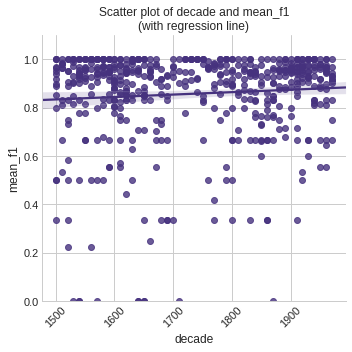

In [33]:
describe_data.describe_corpus_scatter(results_total_df, wdir, "decade", "mean_f1", "CORDE by decades")

In [34]:
stats.linregress(results_total_df["decade"], results_total_df["mean_f1"])

LinregressResult(slope=0.00010048535004241958, intercept=0.6833772816103267, rvalue=0.07743087030818899, pvalue=0.06564635758983087, stderr=5.448076832204126e-05)

In [51]:
positive_categories_lt = []
for category in list(set(results_total_df["class"].tolist())):
    
    slope, intercept, r_value, p_value, std_err =  stats.linregress(results_total_df.loc[results_total_df["class"] == category]["decade"], results_total_df.loc[results_total_df["class"] == category]["mean_f1"])
    if p_value < 0.05 and results_total_df.loc[results_total_df["class"] == category].shape[0]>2:
        print(category, "yes!", r_value, p_value, results_total_df.loc[results_total_df["class"] == category].shape)
        positive_categories_lt.append(category)
    else:
        print(category, "nop!")

Prosa lírica nop!
Religión nop!
Sociedad nop!
Prosa didáctica nop!
Verso dramático breve nop!
Ciencias exactas, físicas y naturales yes! 0.5256846762593744 0.030215374932408747 (17, 21)
Verso dramático extenso nop!
Prosa narrativa extensa nop!
Prosa dramática nop!
Verso narrativo tradicional nop!
Prensa nop!
Artes y espectáculos nop!
Prosa narrativa breve yes! 0.5596237238044474 0.0024043814221227323 (27, 21)
Ciencias aplicadas nop!
Derecho yes! -0.3871860939360442 0.006553271328445805 (48, 21)
Verso lírico tradicional nop!
Prosa nop!
Prosa dramática extensa nop!
Historia y documentos nop!
Verso lírico culto nop!
Prosa dramática breve nop!
Ciencias sociales y humanidades nop!
Verso narrativo culto nop!


In [36]:
positive_categories_lt

['Ciencias exactas, físicas y naturales', 'Prosa narrativa breve', 'Derecho']

In [37]:
results_total_df

dict_values = {'Derecho': "#9467bd", 'Ciencias exactas, físicas y naturales': "#ff7f0e", 'Prosa narrativa breve':"#17becf"}

results_total_df["class_nr"] = 0
results_total_df["class_nr"] = results_total_df["class"].map(dict_values).fillna("yellow")


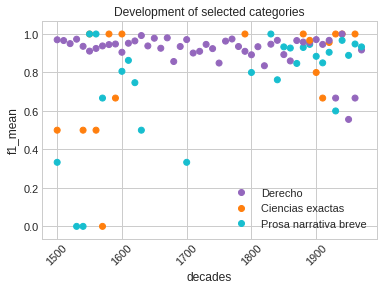

In [50]:
from matplotlib.legend_handler import HandlerLine2D, Line2D

fig, ax = plt.subplots()
ax.scatter(results_total_df.loc[results_total_df["class"].isin(positive_categories_lt)]["decade"], results_total_df.loc[results_total_df["class"].isin(positive_categories_lt)]["mean_f1"], c = results_total_df.loc[results_total_df["class"].isin(positive_categories_lt)]["class_nr"], cmap="Paired")

legend_elements = [
                    Line2D([], [], linewidth= 0, marker='o', color='#9467bd', label='Derecho'),
                    Line2D([], [], linewidth= 0, marker='o', color='#ff7f0e', label='Ciencias exactas'),
                    Line2D([], [], linewidth= 0, marker='o', color='#17becf', label='Prosa narrativa breve'),
]

ax.legend(handles=legend_elements, loc='bottom right')
ax.set_title("Development of selected categories")
ax.set_ylabel("f1_mean")
ax.set_xlabel("decades")
plt.xticks(rotation=45)
plt.show()

fig.tight_layout()
    
fig.savefig(wdir+"/visualisations/positive_classes_development.png", dpi=300, format="png")


ValueError: 'c' argument must either be valid as mpl color(s) or as numbers to be mapped to colors. Here c = class_nr.

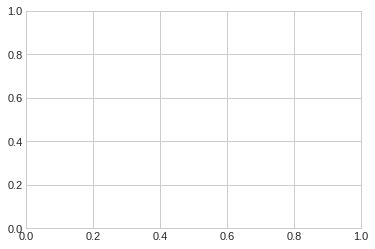

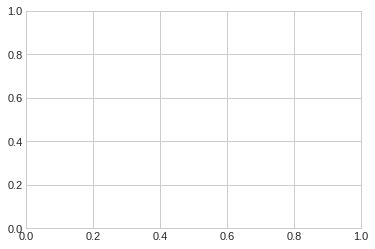

In [87]:

describe_data.scatter_color(results_total_df.loc[results_total_df["class"].isin(positive_categories_lt)], wdir, "decade", "mean_f1", "class_nr", "positive categories", do_cull = False)

# Classification by Decades Controlling the Sample Size

In [31]:
corde_metadatos_modern_df["decade"] = corde_metadatos_modern_df["prim_fecha"].astype(str).str.slice(0,3)+"0"

In [32]:
sorted(list(set(corde_metadatos_modern_df["prim_fecha"])))[-10:]

[1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974]

In [33]:
for decade_nr in sorted(list(set(corde_metadatos_modern_df["decade"]))):
    i = 0
    for texts_class_str in classes_lt:
        try:
            print("decade: ", decade_nr)

            texts_decade_lt = corde_metadatos_modern_df.loc[corde_metadatos_modern_df["decade"] == decade_nr].index.tolist()

            results_decade_class_df = classify.classify(wdir, freq_table = corde_modern_freq_df.loc[texts_decade_lt],
                          metadata = corde_metadatos_modern_df.loc[texts_decade_lt], classes = [texts_class_str],
                          methods = ["LR"], max_MFFs = [3000], 
                          text_representations=["log"],
                          under_sample_method = "lpc-max", typographies=[True],
                                         sampling_times = 3, maximum_cases = 10, minimal_value_samples = 10)
            results_decade_class_df["decade"] = decade_nr
            if i == 0:
                results_decade_df = results_decade_class_df
            else:
                results_decade_df = pd.concat([results_decade_df,results_decade_class_df])
        
        except:
            print("Problems with ", decade_nr, texts_class_str)
        i += 1

    results_decade_df.to_csv(wdir + "by decade/results_10_decade_"+str(decade_nr) + " .tsv", sep="\t")
        

decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0  203.0  160.0  4.0  84.0   
ahbilb2bsub19  268.0  28.0  0.0  29.0  124.0  329.0  154.0   96.0  1.0  56.0   
ahbilb2bsub20   96.0  11.0  0.0   2.0   34.0  116.0   31.0   25.0  0.0  14.0   
ahpg1500sub7    24.0   0.0  0.0   0.0    7.0   15.0    7.0    6.0  0.0   0.0   

token           ...     pasamos  veinticinco  vol  tam  vertical   nº  \
archivo         ...                                                     
ahbilb2bsub17   ...         0.0          0.0  0.0  0.0       0.0  0.0   
ahbilb2bsub18   ...         0.0          0.0  0.0  0.0       0.0  0.0   
ahbilb2bsub19   ...         0.0          0.0  0.0  0.0       0.0  0.0   
ahbilb2bsub20   ...         0.0          0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos


/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.5590631215256825, pvalue=0.15004063502589368)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.800
f1_micro    0.889
dtype: float64
p-value:  0.15
Baseline: 		 0.7
LR
-0.03299999999999992
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y espectáculos    0.667     0.667      0.667       0.8     0.889   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.7       -0.033              LR                 log  3000   

   typography                                                f1s  \
0        True  [0.8, 1.0, 0.67, 1.0, 1.0, 0.8, 1.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(586, 6257)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['çibdad', 'único', 'amistad']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0  203.0  160.0  4.0  84.0   
ahbilb2bsub19  268.0  28.0  0.0  29.0  124.0  329.0  154.0   96.0  1.0  56.0   
ahbilb2bsub20   96.0  11.0 

Least popupated class value:	  590
Labels shape (590,) 
 Data shape (590, 6294)
size after culling data: (590, 6294) (590,)
typography  True
textual representation:  log
Columns that are empty:  []
(590, 6294)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['valle', 'capitanes', 'imperio']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.5061698254578618, pvalue=0.622727856988578)
Class: 	 Historia y documentos
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.6227
Baseline: 		 0.6
LR
0.31700000000000006
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  H

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0  203.0  160.0  4.0  84.0   
ahbilb2bsub19  268.0  28.0  0.0  29.0  124.0  329.0  154.0   96.0  1.0  56.0   
ahbilb2bsub20   96.0  11.0  0.0

Least popupated class value:	  594
Labels shape (594,) 
 Data shape (594, 6333)
size after culling data: (594, 6333) (594,)
typography  True
textual representation:  log
Columns that are empty:  []
(594, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0 

textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0  203.0  160.0  4.0  84.0   
ahbilb2bsub19  268.0  28.0  0.0  29.0  124.0  329.0  154.0   96.0  1.0  56.0   
ahbilb2bsub20   

textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0  203.0  160.0  4.0  84.0   
ahbilb2bsub19  268.0  28.0  0.0  29.0  124.0  329.0  154.0   96.0  1.0  56.0   
ahbilb2bsub20   96.0  11.

Least popupated class value:	  589
Labels shape (589,) 
 Data shape (589, 6282)
size after culling data: (589, 6282) (589,)
typography  True
textual representation:  log
Columns that are empty:  []
(589, 6282)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podemos', 'tomado', 'amistad']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  

Least popupated class value:	  586
Labels shape (586,) 
 Data shape (586, 6327)
size after culling data: (586, 6327) (586,)
typography  True
textual representation:  log
Columns that are empty:  []
(586, 6327)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['ven', 'males', 'pocas']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0  203.0  1

Least popupated class value:	  592
Labels shape (592,) 
 Data shape (592, 6326)
size after culling data: (592, 6326) (592,)
typography  True
textual representation:  log
Columns that are empty:  []
(592, 6326)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['ven', 'males', 'pocas']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  57

textual representation:  log
Columns that are empty:  []
(595, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(595,)
(595, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.405968881971912, pvalue=0.005866886208708393)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0059
Baseline: 		 0.5
LR
0.367
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    0.867 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(586, 6329)
MFW 3000
The three first MFWs:  [',', 'de', 'e']
The three last MFWs:  ['valle', 'males', 'pocas']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1500
cut_raw_features  token             de    se  una  para     la      ,     en     el    y     a  \
archivo                                                                        
ahbilb2bsub17   36.0   2.0  0.0   2.0   16.0   58.0   23.0   16.0  1.0   7.0   
ahbilb2bsub18  407.0  20.0  0.0  32.0  203.0  570.0  203.0  160.0  4.0  84.0   
ahbilb2bsub19  268.0  28.0  0.0  29.0  124.0  329.0  154.0   96.0  1.0  56.0   
ahbilb2bsub20   96.0  11.0

Least popupated class value:	  591
Labels shape (591,) 
 Data shape (591, 6333)
size after culling data: (591, 6333) (591,)
typography  True
textual representation:  log
Columns that are empty:  []
(591, 6333)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['traer', 'valle', 'males']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0 

Least popupated class value:	  548
Labels shape (548,) 
 Data shape (548, 6260)
size after culling data: (548, 6260) (548,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(548, 6260)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['anda', 'dineros', 'alcaldes']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0   517.0   518.0   
arderiq       6436.0  1760.0  339.0  524.0  3521.0  11598.0  2764.0  3013.0   
aritmet       8326.0   549.0   

textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(549,)
(549, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
Problems with  1510 Ciencias sociales y humanidades
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0   517.0   518.0   
arderiq       6436.0  1760.0  339.0  524.0  3521.0  11598.0  2764.0  3013.0   
aritmet       8326.0   549.0    5.0  532.0  4144.0  13271.0  2130.0  3213.0   
autonasc        79.0    19.0    0.0   11.0    40.0    338.0    38.0    63.0   

token              y   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(544, 6216)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['voces', 'quienes', 'abajo']
After culling the class Historia y documentos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0   517.0   518.0   
arderiq       6436.0  1760.0  339.0  524.0  3521.0  11598.0  2764.0  3013.0   
aritmet       8326.0   549.0  

textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0   517.0   518.0   
arderiq       6436.0  1760.0  339.0  524.0  3521.0  11598.0  2764.0  3013.0   
aritmet       8326.0   549.0    5.0  

textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0   517.0   518.0   
arderiq       6436.0  1760.0  339.0  524.0  3521.0  11598.0  2764.0  3013.0   
aritmet       8326.0   549.

Least popupated class value:	  548
Labels shape (548,) 
 Data shape (548, 6282)
size after culling data: (548, 6282) (548,)
typography  True
textual representation:  log
Columns that are empty:  []
(548, 6282)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['voces', 'quienes', 'oy']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499

textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0   517.0   518.0   
arderiq       6436.0  1760.0  339.0  524.0  3521.0  11598.0  2764.0  3013.0   
aritmet       8326.0 

Least popupated class value:	  548
Labels shape (548,) 
 Data shape (548, 6269)
size after culling data: (548, 6269) (548,)
typography  True
textual representation:  log
Columns that are empty:  []
(548, 6269)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['junta', 'carrera', 'acto']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0  

textual representation:  log
Columns that are empty:  []
(549, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0   517.0   518.0   
arderiq       6436.0  1760.0  339.0  524.0  3521.0  11598.0  2764.0  3013.0   
aritmet       8326.0   549.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['propalsub1', 'propalsub2', 'propalsub3', 'propalsub4', 'propalsub5', 'propalsub6']
(549,)
(549, 7000)
Counter({'0': 543})
(543, 7000) (543,)
Least popupated class value:	  543
Labels shape (543,) 
 Data shape (543, 6276)
size after culling data: (543, 6276) (543,)
typography  True
textual representation:  log
Columns that are empty:  []
(543, 6276)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['çibdad', 'esposa', 'condición']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de  

Counter({'0': 545})
(545, 7000) (545,)
Least popupated class value:	  545
Labels shape (545,) 
 Data shape (545, 6284)
size after culling data: (545, 6284) (545,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(545, 6284)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['voces', 'quienes', 'abajo']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1510
cut_raw_features  token             de      se    una   para      la        ,      en      el  \
archivo                                                                       
ahpg1500sub8    49.0     1.0    1.0    8.0     9.0     40.0     9.0     5.0   
alberca       1370.0   217.0   58.0  190.0   499.0   1209.0   517.0   518.0   
arderiq       6436.0  1760.0  339.0  524.0  3521.0  11598.0  2764.0  3013.0   
aritmet       8326.0   549.

Least popupated class value:	  548
Labels shape (548,) 
 Data shape (548, 6280)
size after culling data: (548, 6280) (548,)
typography  True
textual representation:  log
Columns that are empty:  []
(548, 6280)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['quienes', 'oy', 'condición']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0

Least popupated class value:	  205
Labels shape (205,) 
 Data shape (205, 6656)
size after culling data: (205, 6656) (205,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(205, 6656)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.0     53.0      4.0   
ahpg1500sub9      38.0     1.0     1.0     4.0     13.0     37.0      7.0   
alumbra          235.0    56.0    15.0    

textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.0     53.0      4.0   
ahpg1500sub9      38.0     1.0     1.0     4.0     13.0     37.0      7.0   
alumbra          235.0    56.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.245911317719116, pvalue=0.04137155766266952)
Class: 	 Historia y documentos
Scores:
 	 f1          0.400
rec         0.600
prec        0.300
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0414
Baseline: 		 0.5
LR
-0.09999999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.0     53.0      4.0   
ahpg1500sub9      38.0     1.0     1.0     4.0     13.0     37.0      7.0   
alumbra          235.0    56.0    15.0    22.0    136.0  

textual representation:  log
Columns that are empty:  []
(205, 6650)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['lleno', 'defensa', 'vieja']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.0     53.0      4.0   
ahpg1500sub9      38.0     1.0     1.0     4.0     13.0     37.0      7.0   
alumbra          235.0    56.0    15.0    22.0

textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.0     53.0      4.0   
ahpg1500sub9      38.0     1.0     1.0     4.0     13.0     37.0      7.0   
alumbra          235.0    56.0    15.0    

textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.0     53.0      4.0   
ahpg1500sub9      38.0     1.0     1.0     4.0     13.0     37.0      7.0   
alumbra          235.0    56.0    15.0    22.0    1

Least popupated class value:	  200
Labels shape (200,) 
 Data shape (200, 6638)
size after culling data: (200, 6638) (200,)
typography  True
textual representation:  log
Columns that are empty:  []
(200, 6638)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['grave', 'quod', 'fácil']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.

Least popupated class value:	  202
Labels shape (202,) 
 Data shape (202, 6643)
size after culling data: (202, 6643) (202,)
typography  True
textual representation:  log
Columns that are empty:  []
(202, 6643)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['señal', 'jesús', 'faze']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.0     53.0     

Least popupated class value:	  203
Labels shape (203,) 
 Data shape (203, 6656)
size after culling data: (203, 6656) (203,)
typography  True
textual representation:  log
Columns that are empty:  []
(203, 6656)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['podían', 'lleno', 'defensa']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     1

textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
method used:	 LR
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(207,)
(207, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.108541328204857, pvalue=0.0003394870803384136)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.819
rec         1.000
prec        0.694
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.0003
Baseline: 		 0.7
LR
0.119
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    0.819       1.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(201, 6653)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['armada', 'par', 'importancia']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1520
cut_raw_features  token               de      se     una    para       la        ,       en  \
archivo                                                                     
abecedar        8901.0  2766.0   306.0  1102.0   6644.0  14407.0   4846.0   
ahpg1500sub28     43.0     2.0     2.0     4.0     14.0     53.0      4.0   
ahpg1500sub9      38.0     1.0     1.0     4.0     13.0     37.0      7.0   
alumbra          235.0    56.0    

textual representation:  log
Columns that are empty:  []
(207, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pluma', 'vea', 'yglesia']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.0    996.0  1005.0   784.0   
artemar        773.0   200.0   72.0   102.0   538.0   1326.0   430.0   338.0   
barcatsub7      36.0 

Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 6630)
size after culling data: (476, 6630) (476,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 6630)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['julio', 'querer', 'enfermedad']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.0    996.0  1005.0   784.0   
artemar        773.0   200.0   72.0   102.0   538.0   1326.0   430.0   338.0   
barcatsub7      36.0    

Counter({'0': 474})
(474, 7000) (474,)
Least popupated class value:	  474
Labels shape (474,) 
 Data shape (474, 6627)
size after culling data: (474, 6627) (474,)
typography  True
textual representation:  log
Columns that are empty:  []
(474, 6627)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['julio', 'querer', 'enfermedad']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5

textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.0089741553448464, pvalue=0.3301083659787004)
Class: 	 Historia y documentos
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.3301
Baseline: 		 0.5
LR
0.23299999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y d

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.0    996.0  1005.0   784.0   
artemar        773.0   200.0   72.0   102.0   538.0   1326.0   430.0   338.0   
barcatsub7      36.0     5.0    1.0     6.0

Least popupated class value:	  476
Labels shape (476,) 
 Data shape (476, 6630)
size after culling data: (476, 6630) (476,)
typography  True
textual representation:  log
Columns that are empty:  []
(476, 6630)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['volver', 'julio', 'querer']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.

textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.0    996.0  1005.0   784.0   
artemar        773.0   200.0   72.0   102.0   538.0   1326.0   430.0   338.0   
barcatsub7      36.0     5.0

textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.0    996.0  1005.0   784.0   
artemar        773.0   200.0   72.0   102.0   538.0   1326.0   430.0   338.0   
barcatsub7      36.0     5.0    1.0  

textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(477,)
(477, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.7718980336095624, pvalue=0.09983379946848901)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0998
Baseline: 		 0.5
LR
0.43300000000000005
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  P

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(474, 6610)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['diziendo', 'nueve', 'creer']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.0    996.0  1005.0   784.0   
artemar        773.0   200.0   72.0   102.0   538.0   1326.0   430.0   338.0   
barcatsub7      36.0     5.0    1.0  

textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.0    996.0  1005.0   784.0   
artemar        773.0   200.0   72.0   102.0   538.0   1326.0   430.0   338.0   
barcatsub7      36.0     5.0    1.

Least popupated class value:	  474
Labels shape (474,) 
 Data shape (474, 6631)
size after culling data: (474, 6631) (474,)
typography  True
textual representation:  log
Columns that are empty:  []
(474, 6631)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['volver', 'julio', 'querer']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.

Least popupated class value:	  470
Labels shape (470,) 
 Data shape (470, 6633)
size after culling data: (470, 6633) (470,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(470, 6633)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['volver', 'julio', 'querer']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1530
cut_raw_features  token             de      se    una    para      la        ,      en      el  \
archivo                                                                        
abecedai      8747.0  2841.0  372.0  1542.0  5909.0  16346.0  5195.0  5189.0   
arquitec      2107.0   619.0  278.0   281.0  1273.0    996.0  1005.0   784.0   
artemar        773.0   200.0   72.0   102.0   538.0   1326.0   430.0   338.0   
barcatsub7      36.0  

textual representation:  log
Columns that are empty:  []
(477, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0   

Least popupated class value:	  341
Labels shape (341,) 
 Data shape (341, 6658)
size after culling data: (341, 6658) (341,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(341, 6658)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['cortes', 'grave', 'conocimiento']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0   

textual representation:  log
Columns that are empty:  []
(337, 6662)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(343,)
(343, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(343,)
(343, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.4025701302598135, pvalue=0.18833229525383396)
Class: 	 Historia y documentos
Scores:
 	 f1          0.333
rec         0.333
prec        0.333
f1_macro    0.600
f1_micro    0.778
dtype: float64
p-value:  0.1883
Baseline: 		 0.7
LR
-0.36699999999999994
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Histori

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0   634.0    776.0   39

textual representation:  log
Columns that are empty:  []
(337, 6645)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['acerca', 'conocer', 'debajo']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0   634.0  

textual representation:  log
Columns that are empty:  []
(342, 6670)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hubiese', 'almas', 'quinientos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0 

textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0   634.0    776.

Least popupated class value:	  337
Labels shape (337,) 
 Data shape (337, 6658)
size after culling data: (337, 6658) (337,)
typography  True
textual representation:  log
Columns that are empty:  []
(337, 6658)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['almas', 'reinos', 'dioses']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515

textual representation:  log
Columns that are empty:  []
(337, 6646)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['viaje', 'rodrigo', 'acerca']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0   634.0    776.0 

textual representation:  log
Columns that are empty:  []
(340, 6670)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dello', 'hubiese', 'almas']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0   634

textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(343,)
(343, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(343,)
(343, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
Problems with  1540 Verso lírico culto
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   291

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(335, 6672)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['doce', 'cortes', 'juntos']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1540
cut_raw_features  token         de      se    una    para      la        ,      en      el  \
archivo                                                                    
abcesp6   5240.0  1129.0  169.0   644.0  3260.0   8189.0  2413.0  2572.0   
abespi5   9840.0  2752.0  399.0  1636.0  6725.0  20515.0  4973.0  6339.0   
alcala    1018.0   528.0   32.0   123.0   693.0   2914.0   629.0   793.0   
anonreci  1501.0   179.0  181.0    83.0   6

textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   750.0  1010.0   
anfitri    309.0    33.0   21.0   50.0   164.0   855.0   177.0   130.0   
antonio   3515.0  1256.0    4.0  749.0  1920.0  65

Counter({'0': 560})
(560, 7000) (560,)
Least popupated class value:	  560
Labels shape (560,) 
 Data shape (560, 6717)
size after culling data: (560, 6717) (560,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(560, 6717)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['sistema', 'segunt', 'señal']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   750.0  1010.0   
anfitri    309.0    33.0   21.0   50.0   164.0   855.0   177.0   130.0   
antonio   3515.0  1256.0    4.0  749.0  1920.0  6511.0  1

Least popupated class value:	  558
Labels shape (558,) 
 Data shape (558, 6719)
size after culling data: (558, 6719) (558,)
typography  True
textual representation:  log
Columns that are empty:  []
(558, 6719)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['julio', 'sistema', 'segunt']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  364

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.6293109955894046, pvalue=0.5419945004638225)
Class: 	 Historia y documentos
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.542
Baseline: 		 0.6
LR
0.15000000000000002
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y do

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   750.0  1010.0   
anfitri    309.0    33.0   21.0   50.0   164.0   855.0   177.0   130.0   
antonio   3515.0  1256.0    4.0  749.0  1920.0  6511.0  1852.0  1040.0   

The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['dioses', 'reinos', 'uos']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   750.0  1010.0   
anfitri    309.0    33.0   21.0   50.0   164.0   855.0   177.0   130.0   
antonio   3515.0  1256.0    4.0  749.0  1920.0  6511.0  1852.0  1040.0   
aparicio   132.0    29.0    5.0    5.0    87.0   481.0    73.0    9

Least popupated class value:	  557
Labels shape (557,) 
 Data shape (557, 6718)
size after culling data: (557, 6718) (557,)
typography  True
textual representation:  log
Columns that are empty:  []
(557, 6718)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['julio', 'sistema', 'segunt']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   75

Least popupated class value:	  556
Labels shape (556,) 
 Data shape (556, 6714)
size after culling data: (556, 6714) (556,)
typography  True
textual representation:  log
Columns that are empty:  []
(556, 6714)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['querer', 'sistema', 'fácil']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   750.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Religión
(561,)
(561, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Religión
(561,)
(561, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.65041303567635, pvalue=1.8940855871531962e-19)
Class: 	 Religión
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005
      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Religión    0.933       1.0        0.9     0.867       0.9       0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(558, 6718)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['julio', 'sistema', 'cuyos']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   750.0  1010.0   
anfitri    309.0    33.0   21.0   50.0   164.0   855.0   177.0   130.0   
antonio   3515.0  1256.0    4.0  749.0  1920.0  6511.0  1852.0  1040

textual representation:  log
Columns that are empty:  []
(552, 6721)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['granada', 'querer', 'enfermedad']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   750.0  1010.0   
anfitri    309.0    33.0   21.0   50.0   164.0   855.0   177.0   130.0   
antonio   3515.0  1256.0    4.0  749.0  1920.0  6

textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.1091025494343025, pvalue=0.2933458822023451)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.800
f1_micro    0.889
dtype: float64
p-value:  0.2933
Baseline: 		 0.7
LR
-0.03299999999999992
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    0.66

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(561,)
(561, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.11109062181644155, pvalue=0.9137425480714167)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.250
rec         0.500
prec        0.167
f1_macro    0.292
f1_micro    0.417
dtype: float64
p-value:  0.9137
Baseline: 		 0.6
LR
-0.35
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso líri

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(561, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1550
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alarquin   232.0    50.0   16.0   35.0   163.0   799.0   108.0   105.0   
alcazar   1331.0   274.0  156.0  132.0   956.0  3647.0   750.0  1010.0   
anfitri    309.0    33.0   21.0   50.0   164.0   855.0   177.0   130.0   
antonio   3515.0  1256.0    4.0  749.0  1920.0  6511.0  18

textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(369,)
(369, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(369,)
(369, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.540924832432473, pvalue=0.15159451343480412)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.1516
Baseline: 		 0.5
LR
0.43300000000000005
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y espectáculos 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(366, 6598)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['breve', 'volvió', 'humana']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0    2

textual representation:  log
Columns that are empty:  []
(368, 6606)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['especial', 'di', 'fray']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(369,)
(369, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(369,)
(369, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(369,)
(369, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-5.4, pvalue=0.001008483635157762)
Class: 	 Historia y documentos
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.444
f1_micro    0.800
dtype: float64
p-value:  0.001
Baseline: 		 0.8
LR
-0.8
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos      0.0       0.0    

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(368, 6611)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cambio', 'vale', 'especial']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0    2.0    12.0 

textual representation:  log
Columns that are empty:  []
(366, 6602)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['derecha', 'caballeros', 'secreto']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0 

textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0    2.0

textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0    2.0    12.0 

textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0    2

Least popupated class value:	  365
Labels shape (365,) 
 Data shape (365, 6600)
size after culling data: (365, 6600) (365,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(365, 6600)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['caballos', 'habrá', 'llega']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0    2.0    12.

textual representation:  log
Columns that are empty:  []
(369, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0    2.0

textual representation:  log
Columns that are empty:  []
(362, 6578)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['delas', 'trata', 'nuevas']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0    2.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(368, 6606)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['vale', 'especial', 'derecha']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1560
cut_raw_features  token              de     se    una   para      la       ,      en      el  \
archivo                                                                      
abencerr        375.0   85.0   37.0   28.0   187.0   661.0   186.0   166.0   
ahpg1500sub10    55.0    1.0    2.0    5.0    15.0    29.0     7.0    15.0   
ahpg1500sub4     19.0    2.0    0.0    1.0     4.0    24.0    10.0     9.0   
ahpg1500sub6     38.0    0.0    1.0

textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.3803018619593868, pvalue=0.005465107248450413)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0055
Baseline: 		 0.6
LR
0.15000000000000002
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y esp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(891, 6721)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['cum', 'estados', 'hierro']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0     0.0     1.0      8.0     21.0      8.0   
analara        88120.0  18529.0  1405.0

textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(893,)
(893, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(893,)
(893, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.99999999999999, pvalue=4.178599944112038e-28)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997
                             class  mean_f1  mean_

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.6791759713064064, pvalue=0.5099144748738874)
Class: 	 Derecho
Scores:
 	 f1          0.417
rec         0.500
prec        0.375
f1_macro    0.600
f1_micro    0.708
dtype: float64
p-value:  0.5099
Baseline: 		 0.6
LR
-0.183
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.417       0.5      0.375       0.6     0.708       0.6   

   f1-bas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
Problems with  1570 Historia y documentos
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0     0.0     1.0      8.0     21.0      8.0   
analara        88120.0  18529.0  1405.0  5637.0  

textual representation:  log
Columns that are empty:  []
(891, 6709)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['ciencia', 'vecinos', 'señal']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0     0.0     1.0      8.0     21.0      8.0   
analara        88120.0  18529.0  1405.0

textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0     0.0     1.0      8.0     21.0      8.0   
analara        88120.0  18529.0  1

textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0     0.0     1.0      8.0     21.0      8.0   
analara        88120.0  18529.0  1405.0  56

textual representation:  log
Columns that are empty:  []
(892, 6723)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['fuente', 'cum', 'estados']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0     0.0     1.0      8.0     21.0      8.0   
analara        88120.0  18529.0  1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(891, 6730)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['vieron', 'diferentes', 'esso']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0     0.0     1.0      8.0     21.0      8.0   
analara        88120.0  18529.0  1405.0  5637

textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.0, pvalue=3.7983029624866676e-11)
Class: 	 Verso dramático breve
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático breve      1.0       1.0       

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.8, pvalue=0.0029432820787081474)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0029
Baseline: 		 0.6
LR
0.4
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático extenso      1.0    

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.449489742783178, pvalue=0.03678749787978613)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.444
f1_micro    0.800
dtype: float64
p-value:  0.0368
Baseline: 		 0.8
LR
-0.8
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto      0.0       0.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(893, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['engaño', 'conoce', 'dejado']
method used:	 LR
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(893,)
(893, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.6004442799572104, pvalue=0.5615705936398037)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.167
rec         0.333
prec        0.111
f1_macro    0.433
f1_micro    0.611
dtype: float64
p-value:  0.5616
Baseline: 		 0.7
LR
-0.5329999999999999
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(891, 6727)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['diferentes', 'esso', 'fuente']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1570
cut_raw_features  token               de       se     una    para       la        ,       en  \
archivo                                                                      
agar              52.0     15.0     1.0     8.0     29.0    193.0     19.0   
ahpg1500sub11     40.0      3.0     1.0     2.0     23.0     37.0     17.0   
ahpg1500sub12     38.0      4.0     0.0     1.0      8.0     21.0      8.0   
analara        88120.0  18529.0 

textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.33918195588691735, pvalue=0.7432045175866575)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.7432
Baseline: 		 0.6
LR
0.23299999999999998
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y espectác

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(750, 6773)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['rodrigo', 'alcalde', 'espacio']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1580
cut_raw_features  token         de      se    una   para      la        ,      en      el  \
archivo                                                                   
amilitar   574.0   213.0   43.0   85.0   292.0    889.0   268.0   236.0   
angelica  3030.0  1051.0  217.0  183.0  2342.0  11311.0  1864.0  2561.0   
antiglen  2553.0   477.0  117.0   60.0  1353.0   4301.0  1097.0   718.0   
araucan3  1105.0   178.0   87.0   63.0  1066.0   

textual representation:  log
Columns that are empty:  []
(751, 6774)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['esso', 'diferentes', 'malo']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1580
cut_raw_features  token         de      se    una   para      la        ,      en      el  \
archivo                                                                   
amilitar   574.0   213.0   43.0   85.0   292.0    889.0   268.0   236.0   
angelica  3030.0  1051.0  217.0  183.0  2342.0  11311.0  1864.0  2561.0   
antiglen  2553.0   477.0  117.0   60.0  1353.0   4301.0  1097.0   718.0   
araucan3  1105.0   178.0   87.0   63.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.11468108376172086, pvalue=0.9115239981747361)
Class: 	 Historia y documentos
Scores:
 	 f1          0.333
rec         0.333
prec        0.333
f1_macro    0.600
f1_micro    0.778
dtype: float64
p-value:  0.9115
Baseline: 		 0.7
LR
-0.36699999999999994
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1580
cut_raw_features  token         de      se    una   para      la        ,      en      el  \
archivo                                                                   
amilitar   574.0   213.0   43.0   85.0   292.0    889.0   268.0   236.0   
angelica  3030.0  1051.0  217.0  183.0  2342.0  11311.0  1864.0  2561.0   
antiglen  2553.0   477.0  117.0   60.0  1353.0   4301.0  1097.0   718.0   
araucan3  1105.0   178.0   87.0   63.0  1066.0   2639.0   646.0   89

cut_raw_features after relative normalization token           de        se       una      para        la         ,  \
archivo                                                                
amilitar  0.058351  0.021653  0.004371  0.008641  0.029684  0.090373   
angelica  0.034209  0.011866  0.002450  0.002066  0.026441  0.127703   
antiglen  0.072590  0.013563  0.003327  0.001706  0.038470  0.122292   
araucan3  0.039899  0.006427  0.003141  0.002275  0.038491  0.095288   
arguijo   0.039601  0.006055  0.001145  0.000736  0.034282  0.089593   

token           en        el         y         a   ...      pasamos  \
archivo                                            ...                
amilitar  0.027244  0.023991  0.067297  0.019010   ...     0.000000   
angelica  0.021045  0.028914  0.059781  0.019882   ...     0.000000   
antiglen  0.031191  0.020415  0.041086  0.014103   ...     0.000000   
araucan3  0.023326  0.032425  0.060083  0.019823   ...     0.000072   
arguijo   0.024464  0.0

textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1580
cut_raw_features  token         de      se    una   para      la        ,      en      el  \
archivo                                                                   
amilitar   574.0   213.0   43.0   85.0   292.0    889.0   268.0   236.0   
angelica  3030.0  1051.0  217.0  183.0  2342.0  11311.0  1864.0  2561.0   
antiglen  2553.0   477.0  117.0   60.0  1353.0   4301.0  1097.0   718.0   
araucan3  1105.0   178.0   87.0   63.0  1066.0   26

The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['viaje', 'cum', 'fuente']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1580
cut_raw_features  token         de      se    una   para      la        ,      en      el  \
archivo                                                                   
amilitar   574.0   213.0   43.0   85.0   292.0    889.0   268.0   236.0   
angelica  3030.0  1051.0  217.0  183.0  2342.0  11311.0  1864.0  2561.0   
antiglen  2553.0   477.0  117.0   60.0  1353.0   4301.0  1097.0   718.0   
araucan3  1105.0   178.0   87.0   63.0  1066.0   2639.0   646.0   898.0   
arguijo    484.0    74.0   14.0    9.0   419.0   1095.0 

The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.9742662618621813, pvalue=0.06841716354056897)
Class: 	 Religión
Scores:
 	 f1          0.800
rec         0.800
prec        0.800
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0684
Baseline: 		 0.5
LR
0.30000000000000004
      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Religión      0.8       0.8        0.8     0.867       0.9       0.5   

   f1-baseline classifier_name text_representation   MFW  typography  \

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(748, 6770)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['malo', 'sombra', 'espacio']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1580
cut_raw_features  token         de      se    una   para      la        ,      en      el  \
archivo                                                                   
amilitar   574.0   213.0   43.0   85.0   292.0    889.0   268.0   236.0   
angelica  3030.0  1051.0  217.0  183.0  2342.0  11311.0  1864.0  2561.0   
antiglen  2553.0   477.0  117.0   60.0  1353.0   4301.0  1097.0   718.0   
araucan3  1105.0   178.0   87.0   63.0  1066.0   2639.0   646.0

The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['viaje', 'cum', 'fuente']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1580
cut_raw_features  token         de      se    una   para      la        ,      en      el  \
archivo                                                                   
amilitar   574.0   213.0   43.0   85.0   292.0    889.0   268.0   236.0   
angelica  3030.0  1051.0  217.0  183.0  2342.0  11311.0  1864.0  2561.0   
antiglen  2553.0   477.0  117.0   60.0  1353.0   4301.0  1097.0   718.0   
araucan3  1105.0   178.0   87.0   63.0  1066.0   2639.0   646.0   898.0   
arguijo    484.0    74.0   14.0    9.0   419.0   1095.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.7592866831960856, pvalue=0.10627476026347339)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.6
rec         0.8
prec        0.5
f1_macro    0.4
f1_micro    0.5
dtype: float64
p-value:  0.1063
Baseline: 		 0.5
LR
0.09999999999999998
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto      0.6       0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.1540351966136222, pvalue=0.2817941658313069)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.867
rec         1.000
prec        0.778
f1_macro    0.600
f1_micro    0.778
dtype: float64
p-value:  0.2818
Baseline: 		 0.7
LR
0.16700000000000004
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.2269796535970197, pvalue=0.04777829210480422)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.917
rec         0.875
prec        1.000
f1_macro    0.917
f1_micro    0.917
dtype: float64
p-value:  0.0478
Baseline: 		 0.6
LR
0.31700000000000006
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso narra

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(755, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(755,)
(755, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.0835721971210917, pvalue=0.0613183979780287)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.75
rec         0.75
prec        0.75
f1_macro    0.75
f1_micro    0.75
dtype: float64
p-value:  0.0613
Baseline: 		 0.6
LR
0.15000000000000002
                         class  mean_f1  mean_rec  mean_prec  f1_macro  \


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.9491525423728806, pvalue=0.01624328483544969)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.0162
Baseline: 		 0.7
LR
-0.7
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y espectáculos      0.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.499999999999993, pvalue=4.025677386029634e-12)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Ciencias aplicadas      1.0       1.0        1.0      

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(419, 6740)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['alcalde', 'clara', 'ducados']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4    5.0

textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
Problems with  1590 Derecho
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.182178902359924, pvalue=0.05697185168431814)
Class: 	 Historia y documentos
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.057
Baseline: 		 0.7
LR
-0.7
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos      0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(420, 6748)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4    5.0    3.0   0.0   3.0    2.0    17

textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.845512041006012, pvalue=0.014745093549397407)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0147
Baseline: 		 0.5
LR
0.23299999999999998
             class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa didáctica    0.733       0.8        

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4    5.0    3.0   0.0   3.0    2.0

textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4    5.0    3.0   0.0   3.

textual representation:  log
Columns that are empty:  []
(420, 6749)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['clase', 'alcalde', 'vieron']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4    5.0    3.0   0.0   3

textual representation:  log
Columns that are empty:  []
(414, 6732)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['alcalde', 'clara', 'ducados']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4    5.0    3.0   0.0   3.0    2.0   

textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4    5.0    3.0   0.0   3.0    2.0

textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.7
LR
0.30000000000000004
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático extenso      1.0       1.0    

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.0, pvalue=1.0)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.8
rec         1.0
prec        0.7
f1_macro    0.6
f1_micro    0.7
dtype: float64
p-value:  1.0
Baseline: 		 0.5
LR
0.30000000000000004
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto      0.8       1.0        0.7       0.6       0.7   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(421, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(421,)
(421, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.6225430174794668, pvalue=0.546273548958514)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.742
rec         0.875
prec        0.667
f1_macro    0.496
f1_micro    0.625
dtype: float64
p-value:  0.5463
Baseline: 		 0.6
LR
0.14200000000000002
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(418, 6748)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['auia', 'malo', 'cabildo']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1590
cut_raw_features  token            de     se   una  para     la       ,     en     el      y  \
archivo                                                                      
acam          843.0  135.0  45.0  65.0  396.0  1966.0  404.0  439.0  689.0   
actanoc1sub1  261.0   62.0  16.0  32.0  199.0   459.0   84.0  107.0  270.0   
actanoc1sub3    6.0    0.0   4.0   1.0    8.0    20.0    4.0    3.0    8.0   
actanoc1sub4    5.0    3.0   0.0   3.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.593719679644819, pvalue=7.834754670650065e-05)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.700
rec         0.800
prec        0.650
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.19999999999999996
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y espectáculo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(637, 6820)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['julio', 'querer', 'enfermedad']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1600
cut_raw_features  token             de     se   una   para     la       ,      en      el  \
archivo                                                                   
abcespir        73.0    8.0   0.0   17.0   29.0   331.0    65.0    41.0   
acer           594.0  100.0  61.0   61.0  319.0  1788.0   265.0   286.0   
actacabisub1  2759.0  403.0  45.0  301.0  568.0  2493.0   643.0   810.0   
actacabisub2  4240.0  741.0  75.0  433.0  867.0  34

textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.0098765432098764, pvalue=0.346180881874569)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.378
f1_micro    0.611
dtype: float64
p-value:  0.3462
Baseline: 		 0.7
LR
-0.7
                             class  mean_f1  mean_rec  mean_prec  f1_mac

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.9420054679650096, pvalue=0.3664182826896909)
Class: 	 Derecho
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.3664
Baseline: 		 0.7
LR
0.30000000000000004
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho      1.0       1.0        1.0       1.0       1.0       0.7   

   f1-baseline

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.6022227715290402, pvalue=0.5618892371410855)
Class: 	 Historia y documentos
Scores:
 	 f1          0.667
rec         0.800
prec        0.600
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.5619
Baseline: 		 0.5
LR
0.16700000000000004
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y docum

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(642, 6839)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fechos', 'coro', 'conocido']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1600
cut_raw_features  token             de     se   una   para     la       ,      en      el  \
archivo                                                                   
abcespir        73.0    8.0   0.0   17.0   29.0   331.0    65.0    41.0   
acer           594.0  100.0  61.0   61.0  319.0  1788.0   265.0   286.0   
actacabisub1  2759.0  403.0  45.0  301.0  568.0  2493.0   643.0   810.0   
actacabisub2  4240.0  741.0  75.0  433.0  867.0  3458.0  1013.0  1

Least popupated class value:	  635
Labels shape (635,) 
 Data shape (635, 6835)
size after culling data: (635, 6835) (635,)
typography  True
textual representation:  log
Columns that are empty:  []
(635, 6835)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['conocido', 'vestido', 'ciertas']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1600
cut_raw_features  token             de     se   una   para     la       ,      en      el  \
archivo                                                                   
abcespir        73.0    8.0   0.0   17.0   29.0   331.0    65.0    41.0   
acer           594.0  100.0  61.0   61.0  319.0  1788.0   265.

textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.924606552829935, pvalue=2.1061020646272516e-08)
Class: 	 Prosa dramática breve
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa dramática

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(642, 6840)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fiel', 'fechos', 'coro']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1600
cut_raw_features  token             de     se   una   para     la       ,      en      el  \
archivo                                                                   
abcespir        73.0    8.0   0.0   17.0   29.0   331.0    65.0    41.0   
acer           594.0  100.0  61.0   61.0  319.0  1788.0   265.0   286.0   
actacabisub1  2759.0  403.0  45.0  301.0  568.0  2493.0   643.0   810.0   
actacabisub2  4240.0  741.0  75.0  433.0  867.0  3458

textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-4.978620960332958, pvalue=0.0004163456527328224)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.367
f1_micro    0.583
dtype: float64
p-value:  0.0004
Baseline: 		 0.6
LR
-0.6
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa breve      0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=29.000000000000018, pvalue=9.638614574821346e-12)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa extensa      1.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.1744126046908847, pvalue=0.05237283310275411)
Class: 	 Religión
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0524
Baseline: 		 0.5
LR
0.23299999999999998
      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Religión    0.733       0.8        0.7     0.733       0.8       0.5  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.2115083609991686, pvalue=0.0490889608241232)
Class: 	 Sociedad
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.810
f1_micro    0.917
dtype: float64
p-value:  0.0491
Baseline: 		 0.7
LR
-0.03299999999999992
      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Sociedad    0.667     0.667      0.667      0.81     0.917       0.7  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1600
cut_raw_features  token             de     se   una   para     la       ,      en      el  \
archivo                                                                   
abcespir        73.0    8.0   0.0   17.0   29.0   331.0    65.0    41.0   
acer           594.0  100.0  61.0   61.0  319.0  1788.0   265.0   286.0   
actacabisub1  2759.0  403.0  45.0  301.0  568.0  2493.0   643.0   810.0   
actacabisub2  4240.0  741.0  75.0  433.0  867.0  3458.0  1013.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.2094863136295273, pvalue=0.26100234920733856)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.261
Baseline: 		 0.6
LR
0.4
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático extenso      1.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.9290011604068176, pvalue=0.002002285181662885)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.667
rec         0.800
prec        0.600
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.002
Baseline: 		 0.5
LR
0.16700000000000004
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    0.667   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.285449612859226, pvalue=0.7806029974501953)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.167
rec         0.250
prec        0.125
f1_macro    0.433
f1_micro    0.583
dtype: float64
p-value:  0.7806
Baseline: 		 0.6
LR
-0.43299999999999994
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  V

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(643,)
(643, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.08289337727497, pvalue=2.014570970849992e-05)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.900
rec         0.900
prec        0.900
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso narrativo culto      0.9    

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(643, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(643,)
(643, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.3605551275463988, pvalue=0.7246989731808171)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.222
rec         0.333
prec        0.167
f1_macro    0.498
f1_micro    0.694
dtype: float64
p-value:  0.7247
Baseline: 		 0.7
LR
-0.478
                         class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Verso na

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(491, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['maestre', 'tercero', 'breve']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1610
cut_raw_features  token              de     se   una   para     la       ,     en     el      y  \
archivo                                                                         
adonis          740.0  177.0  36.0   37.0  566.0  1829.0  346.0  462.0  506.0   
aforismo       1281.0  364.0  45.0  212.0  459.0  1501.0  441.0  565.0  949.0   
ahpg1500sub15    32.0   10.0   0.0    5.0   14.0    47.0   14.0   11.0   46.0   
ahpg1500sub2     27.0

textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1610
cut_raw_features  token              de     se   una   para     la       ,     en     el      y  \
archivo                                                                         
adonis          740.0  177.0  36.0   37.0  566.0  1829.0  346.0  462.0  506.0   
aforismo       1281.0  364.0  45.0  212.0  459.0  1501.0  441.0  565.0  949.0   
ahpg1500sub15    32.0   10.0   0.0    5.0   14.0    47.0   14.0   11.0   46.0   
ahpg150

textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.259145217422302, pvalue=0.04743731451846767)
Class: 	 Derecho
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0474
Baseline: 		 0.5
LR
0.43300000000000005
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.933       1.0        0.9     0.867       0.9       0.5   



/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.3321055820775359, pvalue=0.7466656573368573)
Class: 	 Historia y documentos
Scores:
 	 f1          0.600
rec         0.800
prec        0.500
f1_macro    0.467
f1_micro    0.600
dtype: float64
p-value:  0.7467
Baseline: 		 0.5
LR
0.09999999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1610
cut_raw_features  token              de     se   una   para     la       ,     en     el      y  \
archivo                                                                         
adonis          740.0  177.0  36.0   37.0  566.0  1829.0  346.0  462.0  506.0   
aforismo       1281.0  364.0  45.0  212.0  459.0  1501.0  441.0  565.0  949.0   
ahpg1500sub15    32.0   10.0   0.0    5.0   14.0    47.0   14.0   11.0   46.0   
ahpg1500sub2     27.0    0.0   3.0    

Least popupated class value:	  490
Labels shape (490,) 
 Data shape (490, 6744)
size after culling data: (490, 6744) (490,)
typography  True
textual representation:  log
Columns that are empty:  []
(490, 6744)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['antiguos', 'pequeña', 'volver']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1610
cut_raw_features  token              de     se   una   para     la       ,     en     el      y  \
archivo                                                                         
adonis          740.0  177.0  36.0   37.0  566.0  1829.0  346.0  462.0  506.0   
aforismo       1281.0  364.0  45.0  212.0  45

Least popupated class value:	  486
Labels shape (486,) 
 Data shape (486, 6781)
size after culling data: (486, 6781) (486,)
typography  True
textual representation:  log
Columns that are empty:  []
(486, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fácil', 'señal', 'política']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1610
cut_raw_features  token              de     se   una   para     la       ,     en     el      y  \
archivo                                                                         
adonis          740.0  177.0  36.0   37.0  566.0  1829.0  346.0  462.0  506.0   
aforismo       1281.0  364.0  45.0  212.0 

textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1610
cut_raw_features  token              de     se   una   para     la       ,     en     el      y  \
archivo                                                                         
adonis          740.0  177.0  36.0   37.0  566.0  1829.0  346.0  462.0  506.0   
aforismo       1281.0  364.0  45.0  212.0  459.0  1501.0  441.0  565.0  949.0   
ahpg1500sub15    32.0   10.0   0.0    5.0   14.0    47.0   14.0   11.0   46.0   
ahpg1500sub2     27.0    0.0   3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.277769807095889, pvalue=0.04873991874641193)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0487
Baseline: 		 0.6
LR
0.4
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa extensa     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.47219128924647, pvalue=3.14208239345276e-08)
Class: 	 Religión
Scores:
 	 f1          0.950
rec         1.000
prec        0.917
f1_macro    0.850
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.35
      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Religión     0.95       1.0      0.917      0.85     0.917       0.6   

   f1-basel

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(487, 6775)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['señal', 'política', 'maestre']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1610
cut_raw_features  token              de     se   una   para     la       ,     en     el      y  \
archivo                                                                         
adonis          740.0  177.0  36.0   37.0  566.0  1829.0  346.0  462.0  506.0   
aforismo       1281.0  364.0  45.0  212.0  459.0  1501.0  441.0  565.0  949.0   
ahpg1500sub15    32.0   10.0   0.0    5.0   14.0    47.0   14.0   11.0   46.0   
ahpg1500sub2     27.0    0.0   3

textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.0772998705168773, pvalue=0.00882400793405755)
Class: 	 Verso dramático breve
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0088
Baseline: 		 0.5
LR
0.23299999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramá

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.503520894391629, pvalue=0.17111266344734022)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.810
f1_micro    0.917
dtype: float64
p-value:  0.1711
Baseline: 		 0.7
LR
-0.03299999999999992
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  V

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.7334027925774894, pvalue=0.4763313014843308)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.4763
Baseline: 		 0.6
LR
-0.09999999999999998
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto      0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.33842000798232563, pvalue=0.7428077650415662)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.222
rec         0.333
prec        0.167
f1_macro    0.511
f1_micro    0.694
dtype: float64
p-value:  0.7428
Baseline: 		 0.7
LR
-0.478
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lí

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(494, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['coro', 'fechos', 'amores']
method used:	 LR
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(494,)
(494, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.5948354062513357, pvalue=0.5630020519561852)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.0
rec         0.0
prec        0.0
f1_macro    0.2
f1_micro    0.3
dtype: float64
p-value:  0.563
Baseline: 		 0.5
LR
-0.5
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso narrativo culto      0.0       

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(490, 6781)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['breve', 'secreto', 'verde']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   729.0  187.0  236.0   203.0   
amistad    477.0   69.0   22.0   50.0   368.0  1413.0  266.0  359.0   353.0   
anticris   491.0   69.0   

Least popupated class value:	  415
Labels shape (415,) 
 Data shape (415, 6758)
size after culling data: (415, 6758) (415,)
typography  True
textual representation:  log
Columns that are empty:  []
(415, 6758)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['juntos', 'sentencia', 'señal']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   7

Least popupated class value:	  410
Labels shape (410,) 
 Data shape (410, 6729)
size after culling data: (410, 6729) (410,)
typography  True
textual representation:  log
Columns that are empty:  []
(410, 6729)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['di', 'anterior', 'provincias']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.1464936768849041, pvalue=0.2811573110800633)
Class: 	 Historia y documentos
Scores:
 	 f1          0.700
rec         0.750
prec        0.667
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.2812
Baseline: 		 0.6
LR
0.09999999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Histori

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(415, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cortes', 'juntos', 'sentencia']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   729.0  187.0  236.0   203.0   
amistad    477.0   69.0   22.0   50.0   368.0  1413.0  266.0  359.0   353.0   
anticris   491.0   69.0   42.0   34.0   332

textual representation:  log
Columns that are empty:  []
(412, 6758)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['juntos', 'sentencia', 'señal']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   729.0  187.0  236.0   203.0   
amistad    477.0   69.0   22.0   50.0   368.0  1413.0  266.0  359.0   353.0   
anticris   491.0   69.0   42.0   34

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(411, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'tenia']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   729.0  187.0  236.0   203.0   
amistad    477.0   69.0   22.0   50.0   368.0  1413.0  266.0  359.0   353.0   
anticris   491.0   69.0   42.0

The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   729.0  187.0  236.0   203.0   
amistad    477.0   69.0   22.0   50.0   368.0  1413.0  266.0  359.0   353.0   
anticris   491.0   69.0   42.0   34.0   332.0  1435.0  381.0  418.0   510.0   
antojos   2105.0  520.0  161.0  311.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.435516278555653, pvalue=2.2551641955948763e-07)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(410, 6758)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sentencia', 'jesús', 'faze']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   729.0  187.0  236.0   203.0   
amistad    477.0   69.0   22.0   50.0   368.0  1413.0  266.0  359.0   353.0   
anticris   491.0   69.0   42.0   34.0   332.

textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   729.0  187.0  236.0   203.0   
amistad    477.0   69.0   22.0   50.0   368.0  1413.0  266.0  359.0   353.0   
anticris   491.0   69.0   42.0   3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.044265663913551, pvalue=3.414355350838047e-07)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.4
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático extenso

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reynos', 'dormir', 'maravedís']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.2147467868233124, pvalue=0.24782508135257403)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.333
rec         0.400
prec        0.300
f1_macro    0.333
f1_micro    0.400
dtype: float64
p-value:  0.2478
Baseline: 		 0.5
LR
-0.16699999999999998
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(407, 6761)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['tenia', 'christo', 'vieja']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1620
cut_raw_features  token         de     se    una   para      la       ,     en     el       y  \
archivo                                                                       
ahurtado   752.0   95.0   41.0   18.0   400.0  1148.0  218.0  231.0   481.0   
almudena   391.0   65.0    4.0   20.0   278.0   729.0  187.0  236.0   203.0   
amistad    477.0   69.0   22.0   50.0   368.0  1413.0  266.0  359.0   353.0   
anticris   491.0   69.0   42.

textual representation:  log
Columns that are empty:  []
(411, 6760)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['tenia', 'christo', 'vieja']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  2326.0  304.0  351.0  443.0   
ahpg1500sub16   30.0    1.0   0.0   1.0    4.0    31.0    8.0    7.0   16.0   
ahpg1500sub17   36.0    1.

Least popupated class value:	  454
Labels shape (454,) 
 Data shape (454, 6661)
size after culling data: (454, 6661) (454,)
typography  True
textual representation:  log
Columns that are empty:  []
(454, 6661)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sentencia', 'jesús', 'señal']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  23

textual representation:  log
Columns that are empty:  []
(446, 6632)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['alas', 'cambio', 'vale']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  2326.0  304.0  351.0  443.0   
ahpg1500sub16   30.0    1.0   0.0   1.0    4.0    31.0    8.0    7.0   16.0   
ahpg1500sub17   36.0    1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.7303347063298865, pvalue=0.4819449337085172)
Class: 	 Historia y documentos
Scores:
 	 f1          0.886
rec         1.000
prec        0.806
f1_macro    0.610
f1_micro    0.806
dtype: float64
p-value:  0.4819
Baseline: 		 0.7
LR
0.18600000000000005
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.2647856370002528, pvalue=0.24154668008926944)
Class: 	 Prensa
Scores:
 	 f1          0.333
rec         0.333
prec        0.333
f1_macro    0.600
f1_micro    0.778
dtype: float64
p-value:  0.2415
Baseline: 		 0.7
LR
-0.36699999999999994
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.333     0.333      0.333       0.6     0.778       0.7   

  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  2326.0  304.0  351.0  443.0   
ahpg1500sub16   30.0    1.0   0.0   1.0    4.0    31.0    8.0    7.0   16.0   
ahpg1500sub17   36.0    1.0   2.0   4.0   11.0  

textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  2326.0  304.0  351.0  443.0   
ahpg1500sub16   30.0    1.0   0.0   1.0    4.0    31.0    8.0    7.0   16.0   
ahpg1500sub17   36.0    1.0   2.0   4.

textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  2326.0  304.0  351.0  443.0   
ahpg1500sub16   30.0    1.0   0.0   1.0    4.0    31.0    8.0    7.0   16.0   
ahpg1500sub17   36.0    1.0   

Least popupated class value:	  453
Labels shape (453,) 
 Data shape (453, 6662)
size after culling data: (453, 6662) (453,)
typography  True
textual representation:  log
Columns that are empty:  []
(453, 6662)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'jesús']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(451, 6657)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['jesús', 'señal', 'fácil']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  2326.0  304.0  351.0  443.0   
ahpg1500sub16   30.0    1.0   0.0   1.0    4.0    31.0    8.0    7.0   16.0   
ahpg1500sub17   36.0    1.0   2.0   4.0   11.0 

textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  2326.0  304.0  351.0  443.0   
ahpg1500sub16   30.0    1.0   0.0   1.0    4.0    31.0    8.0    7.0   16.0   
ahpg1500sub17   36.0    1.0   2.0   4.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(455, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(455,)
(455, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.658259689411202, pvalue=0.00047683698432366545)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.933
rec         1.000
prec        0.889
f1_macro    0.800
f1_micro    0.889
dtype: float64
p-value:  0.0005
Baseline: 		 0.7
LR
0.2330000000000001
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(447, 6651)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['grave', 'conocimiento', 'caualleros']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0  2326.0  304.0  351.0  443.0   
ahpg1500sub16   30.0    1.0   0.0   1.0    4.0    31.0    8.0    7.0   16.0   
ahpg1500sub17   36.0    1

Least popupated class value:	  452
Labels shape (452,) 
 Data shape (452, 6658)
size after culling data: (452, 6658) (452,)
typography  True
textual representation:  log
Columns that are empty:  []
(452, 6658)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juntos', 'sentencia', 'fácil']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1630
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
abcamor         91.0    5.0   0.0   9.0   38.0   347.0   49.0   24.0   62.0   
absalon        591.0  123.0  72.0  39.0  384.0

textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0   15.0    15.0    8.0    5.0    15.0   
agresub10    30.0    7.0   1.0    4.0    7.0    36.0   11.0    8.0    28.0   
agresub11    50.0   13.0   0.0   

Least popupated class value:	  184
Labels shape (184,) 
 Data shape (184, 6621)
size after culling data: (184, 6621) (184,)
typography  True
textual representation:  log
Columns that are empty:  []
(184, 6621)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['vieja', 'dende', 'conciencia']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(186,)
(186, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(186,)
(186, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.4530502351829682, pvalue=0.6601837722874031)
Class: 	 Historia y documentos
Scores:
 	 f1          0.417
rec         0.500
prec        0.375
f1_macro    0.533
f1_micro    0.708
dtype: float64
p-value:  0.6602
Baseline: 		 0.6
LR
-0.183
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documen

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(181, 6627)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['doce', 'cortes', 'fig']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0   15.0    15.0    8.0    5.0    15.0   
agresub10    30.0    7.0   1.0    4.0    7.0    36.0   11.0    8.0    28.0   
agresub11    50.0   13.0   0.0    7.0   27.0    49.0   1

textual representation:  log
Columns that are empty:  []
(183, 6630)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cortes', 'fig', 'juntos']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0   15.0    15.0    8.0    5.0    15.0   
agresub10    30.0    7.0   1.0    4.0    7.0    36.0   11.0    8.0    28.0   
agresub11    50.0   13.0   0.0    7.0   27.0 

textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0   15.0    15.0    8.0    5.0    15.0   
agresub10    30.0    7.0   1.0    4.0    7.0    36.0   11.0    8.0    28.0   
agresub11    50.0   13.0   0.0

textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(186,)
(186, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(186,)
(186, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(186,)
(186, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.246786295976139, pvalue=8.111572313312952e-07)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.867
rec         0.900
prec        0.850
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narra

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 6638)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['mirar', 'cortes', 'costumbres']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0   15.0    15.0    8.0    5.0    15.0   
agresub10    30.0    7.0   1.0    4.0    7.0    36.0   11.0    8.0    28.0   
agresub11    50.0   13.0   0.0    7.0   27.0  

textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0   15.0    15.0    8.0    5.0    15.0   
agresub10    30.0    7.0   1.0    4.0    7.0    36.0   11.0    8.0    28.0   
agresub11    50.0   13.0   0.0    7.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(178, 6636)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['árboles', 'algun', 'dello']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0   15.0    15.0    8.0    5.0    15.0   
agresub10    30.0    7.0   1.0    4.0    7.0    36.0   11.0    8.0    28.0   
agresub11    50.0   13.0   0.0    7

textual representation:  log
Columns that are empty:  []
(178, 6633)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ideas', 'pecados', 'conciencia']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1640
cut_raw_features  token          de     se   una   para     la       ,     en     el       y  \
archivo                                                                      
advert     1462.0  461.0  97.0  275.0  851.0  2441.0  555.0  777.0  1421.0   
agresub1     28.0    2.0   1.0    3.0   15.0    15.0    8.0    5.0    15.0   
agresub10    30.0    7.0   1.0    4.0    7.0    36.0   11.0    8.0    28.0   
agresub11    50.0   13.0   0.

textual representation:  log
Columns that are empty:  []
(186, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39  

textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39  57.0  14.0  

textual representation:  log
Columns that are empty:  []
(175, 6631)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['señal', 'política', 'maestre']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(177,)
(177, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(177,)
(177, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.8315527516834067, pvalue=0.42507223129258054)
Class: 	 Historia y documentos
Scores:
 	 f1          0.222
rec         0.333
prec        0.167
f1_macro    0.511
f1_micro    0.694
dtype: float64
p-value:  0.4251
Baseline: 		 0.7
LR
-0.478
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documento

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(175, 6604)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['salvo', 'à', 'vecinos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39  57.0  14.0  2.0   7.0  33.0  5

textual representation:  log
Columns that are empty:  []
(175, 6641)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conocimiento', 'grave', 'quod']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39  57.0  14.0  2

textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39  57.0  14.0  2.0   

textual representation:  log
Columns that are empty:  []
(172, 6610)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['tercero', 'breve', 'secreto']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39  57.0  1

textual representation:  log
Columns that are empty:  []
(169, 6633)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['conocimiento', 'grave', 'quod']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39  57.0  14.0  2.0   7.

(177,)
(177, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(177,)
(177, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.2749833009033553, pvalue=0.2285867501252899)
Class: 	 Verso dramático breve
Scores:
 	 f1          0.889
rec         1.000
prec        0.800
f1_macro    0.444
f1_micro    0.800
dtype: float64
p-value:  0.2286
Baseline: 		 0.8
LR
0.08899999999999997
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático breve    0.889       1.0        0.8     0.444       0.8   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.8        0.089              LR                 log  3000   

   typography                                                f1s  \
0        True  [0.0, 0.67, 0.0, 1.0, 0.0, 0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.999999999999986, pvalue=4.178599944112038e-28)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático extenso  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(177,)
(177, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(177,)
(177, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.6123724356957945, pvalue=0.5554454421055857)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.333
rec         0.333
prec        0.333
f1_macro    0.610
f1_micro    0.806
dtype: float64
p-value:  0.5554
Baseline: 		 0.7
LR
-0.36699999999999994
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fechos', 'fiel', 'dirección']
method used:	 LR
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(177,)
(177, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.266551326067667, pvalue=4.508141350558783e-18)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(175, 6636)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['grave', 'quod', 'fácil']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1650
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub36  44.0   7.0  1.0   7.0  40.0  55.0  27.0   8.0  53.0  19.0   ...      
agresub37  35.0   8.0  0.0   9.0  18.0  37.0   7.0  11.0  21.0  19.0   ...      
agresub38  29.0   7.0  0.0   5.0   9.0  30.0  11.0  13.0  21.0   9.0   ...      
agresub39  57.0  14.0  2.

(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.251038676017911, pvalue=0.00014944889576886994)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.950
rec         1.000
prec        0.917
f1_macro    0.850
f1_micro    0.917
dtype: float64
p-value:  0.0001
Baseline: 		 0.6
LR
0.35
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y espectáculos     0.95       1.0      0.917      0.85     0.917   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.6         0.35              LR                 log  3000   

   typography                                                f1s  \
0        True  [0.89, 0.89, 0.8, 0.8, 0.67, 0.67, 1.0, 0.8, 1...   

   test_result_pvalue                                             labels  \
0            0.000149  archivo
docuine2sub32  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1660
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub59  36.0   6.0  0.0   4.0   9.0  25.0  11.0  12.0  23.0  13.0   ...      
agresub60  55.0   6.0  1.0   7.0  25.0  32.0  10.0  12.0  41.0  17.0   ...      
agresub61  18.0   0.0  1.0   2.0  10.0  37.0   6.0   5.0  15.0  18.0   ...      
agresub62  60.0  19.0  0.0

textual representation:  log
Columns that are empty:  []
(182, 6328)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['felipe', 'enfermo', 'hermosura']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1660
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub59  36.0   6.0  0.0   4.0   9.0  25.0  11.0  12.0  23.0  13.0   ...      
agresub60  55.0   6.0  1.0   7.0  25.0  32.0  10.0  12.0  41.0  17.0   ...      
agresub61  18.0   0.0  1.0   2.0  10.0  37.0   6.0   5.0  15.0  18.0   ...      
agres

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.282657730758045, pvalue=0.04333332143930942)
Class: 	 Historia y documentos
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0433
Baseline: 		 0.5
LR
0.367
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos    0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(176, 6377)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['diga', 'fruto', 'europa']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1660
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub59  36.0   6.0  0.0   4.0   9.0  25.0  11.0  12.0  23.0  13.0   ...      
agresub60  55.0   6.0  1.0   7.0  25.0  32.0  10.0  12.0  41.0  17.0   ...      
agresub61  18.0   0.0  1.0   2.0  10.0  37.0   6.0   5.0  15.0  18.0   ...      
agresub62  60.0  19.0  0.0   7.0  23.

textual representation:  log
Columns that are empty:  []
(182, 6390)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['santos', 'cambio', 'especial']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1660
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub59  36.0   6.0  0.0   4.0   9.0  25.0  11.0  12.0  23.0  13.0   ...      
agresub60  55.0   6.0  1.0   7.0  25.0  32.0  10.0  12.0  41.0  17.0   ...      
agresub61  18.0   0.0  1.0   2.0  10.0  37.0   6.0   5.0  15.0  18.0   ...      
agresub62  60.0  19.0  

textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1660
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub59  36.0   6.0  0.0   4.0   9.0  25.0  11.0  12.0  23.0  13.0   ...      
agresub60  55.0   6.0  1.0   7.0  25.0  32.0  10.0  12.0  41.0  17.0   ...      
agresub61  18.0   0.0  1.0   2.0  10.0  37.0   6.0   5.0  15.0  18.0   ...      
agresub62  60.0  19.0  0.0   7.0

textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1660
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub59  36.0   6.0  0.0   4.0   9.0  25.0  11.0  12.0  23.0  13.0   ...      
agresub60  55.0   6.0  1.0   7.0  25.0  32.0  10.0  12.0  41.0  17.0   ...      
agresub61  18.0   0.0  1.0   2.0  10.0  37.0   6.0   5.0  15.0  18.0   ...      
agresub62  60.0  19.0  0.0   7.0  23

textual representation:  log
Columns that are empty:  []
(183, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(183,)
(183, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.464555503736316, pvalue=0.0007729690311500592)
Class: 	 Verso dramático breve
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0008
Baseline: 		 0.5
LR
0.43300000000000005
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dram

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(177, 6328)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['islas', 'presentes', 'antiguo']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1660
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub59  36.0   6.0  0.0   4.0   9.0  25.0  11.0  12.0  23.0  13.0   ...      
agresub60  55.0   6.0  1.0   7.0  25.0  32.0  10.0  12.0  41.0  17.0   ...      
agresub61  18.0   0.0  1.0   2.0  10.0  37.0   6.0   5.0  15.0  18.0   ...      
agresub62  60.

textual representation:  log
Columns that are empty:  []
(178, 6376)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['villas', 'prueba', 'vivo']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1660
cut_raw_features  token        de    se  una  para    la     ,    en    el     y     a   ...     \
archivo                                                                ...      
agresub59  36.0   6.0  0.0   4.0   9.0  25.0  11.0  12.0  23.0  13.0   ...      
agresub60  55.0   6.0  1.0   7.0  25.0  32.0  10.0  12.0  41.0  17.0   ...      
agresub61  18.0   0.0  1.0   2.0  10.0  37.0   6.0   5.0  15.0  18.0   ...      
agresub62  60.0  1

textual representation:  log
Columns that are empty:  []
(126, 6423)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['debía', 'pequeño', 'montes']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39

textual representation:  log
Columns that are empty:  []
(128, 6411)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['acá', 'presto', 'partida']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         9

textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.7484492043243453, pvalue=0.46989006928070665)
Class: 	 Derecho
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.4699
Baseline: 		 0.6
LR
0.23299999999999998
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.833       1.0       0.75     0.667      0.75       0.6   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.620498198558555, pvalue=8.3325819840258e-05)
Class: 	 Historia y documentos
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0001
Baseline: 		 0.6
LR
0.31700000000000006
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 6424)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['iban', 'debía', 'pequeño']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39.0  85.0  863.0 

textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39.0  85.

textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39.

textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39.0  85.0  

textual representation:  log
Columns that are empty:  []
(128, 6398)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['ala', 'venía', 'manda']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39.0

textual representation:  log
Columns that are empty:  []
(128, 6436)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['serán', 'larga', 'sevilla']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39.0  85.0  863

textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(129,)
(129, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-5.0, pvalue=0.0007389679098032424)
Class: 	 Verso dramático breve
Scores:
 	 f1          0.250
rec         0.250
prec        0.250
f1_macro    0.517
f1_micro    0.667
dtype: float64
p-value:  0.0007
Baseline: 		 0.6
LR
-0.35
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático breve     0.25      

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(120, 6419)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['iban', 'debía', 'pequeño']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39

textual representation:  log
Columns that are empty:  []
(126, 6437)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['norte', 'serán', 'larga']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1670
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
ahpg1500sub24   56.0    5.0   1.0   5.0   19.0    48.0   14.0    7.0   45.0   
aprojimo       449.0   56.0  23.0  51.0  294.0  1454.0  257.0  375.0  375.0   
autoraco        44.0   10.0   0.0   5.0   29.0    98.0   20.0   23.0   32.0   
barrio         997.0  228.0  39

textual representation:  log
Columns that are empty:  []
(129, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356

textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  17954.0  64

textual representation:  log
Columns that are empty:  []
(81, 6362)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['testimonio', 'único', 'amistad']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(82,)
(82, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(82,)
(82, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.1975906456500108, pvalue=0.8469692507012153)
Class: 	 Historia y documentos
Scores:
 	 f1          0.250
rec         0.250
prec        0.250
f1_macro    0.496
f1_micro    0.625
dtype: float64
p-value:  0.847
Baseline: 		 0.6
LR
-0.35
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos     0.25      0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(78, 6361)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sed', 'mandamos', 'lomo']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  17954.0  6412.0   
a

textual representation:  log
Columns that are empty:  []
(81, 6345)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['preso', 'vuelta', 'podido']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  17954.0  

textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  17954.0 

textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  17954.0  6412.0  

textual representation:  log
Columns that are empty:  []
(81, 6352)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['precio', 'preso', 'vuelta']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  1

textual representation:  log
Columns that are empty:  []
(80, 6234)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['atención', 'éstas', 'presidente']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  17954.0  6

textual representation:  log
Columns that are empty:  []
(76, 6337)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sabio', 'yr', 'esposa']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  17954.0

textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(82,)
(82, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(82,)
(82, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(82,)
(82, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.2874568822267789, pvalue=0.7786662997370324)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.542
rec         0.750
prec        0.458
f1_macro    0.562
f1_micro    0.625
dtype: float64
p-value:  0.7787
Baseline: 		 0.6
LR
-0.05799999999999994
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    0.542      0.7

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1680
cut_raw_features  token               de      se    una    para      la        ,      en  \
archivo                                                                  
ahpg1500sub14     61.0     4.0    1.0     3.0    10.0     43.0    16.0   
airetier         741.0   143.0   48.0    35.0   369.0   1813.0   361.0   
amarmuer         459.0    96.0   36.0    32.0   339.0   1503.0   274.0   
amazona        16813.0  3341.0  530.0  2029.0  6356.0  17954

textual representation:  log
Columns that are empty:  []
(82, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5.0 

textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5

textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
method used:	 LR
(63,)
(63, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(63,)
(63, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(63,)
(63, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.6661331198291621, pvalue=0.5169731194184457)
Class: 	 Historia y documentos
Scores:
 	 f1          0.417
rec         0.500
prec        0.375
f1_macro    0.583
f1_micro    0.667
dtype: float64
p-value:  0.517
Baseline: 		 0.6
LR
-0.183
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos    0.417       0.5      0.375     0.583     0.667   

   baseline  f1-baseline 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5.0   1.0   5

textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5.0 

textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0 

textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5.0   1

textual representation:  log
Columns that are empty:  []
(61, 6308)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['amo', 'mayo', 'vivo']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5.0   1.0

textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5.0   1.0  

textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
method used:	 LR
(63,)
(63, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(63,)
(63, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(63,)
(63, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.2, pvalue=0.05899390791582341)
Class: 	 Verso dramático breve
Scores:
 	 f1          0.333
rec         0.333
prec        0.333
f1_macro    0.600
f1_micro    0.778
dtype: float64
p-value:  0.059
Baseline: 		 0.7
LR
-0.36699999999999994
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático breve   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(61, 6341)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['yr', 'sed', 'mandamos']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5.0   1

textual representation:  log
Columns that are empty:  []
(62, 6324)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['entra', 'mayo', 'fortaleza']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1690
cut_raw_features  token            de    se   una  para    la      ,    en    el      y     a  \
archivo                                                                       
ahpg1500sub25  68.0  19.0   1.0  11.0  19.0  112.0  21.0   9.0  100.0  26.0   
ahpg1500sub26  79.0   2.0  12.0   2.0   9.0   77.0  30.0   4.0   48.0  11.0   
ahpg1500sub27  25.0   5.0   1.0   4.0  10.0   25.0  12.0  13.0   16.0  10.0   
amoralca       15.0   2.0   5

textual representation:  log
Columns that are empty:  []
(63, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     2.0   

textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(278,)
(278, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(278,)
(278, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(278,)
(278, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.706232429022176, pvalue=0.11877424747023008)
Class: 	 Historia y documentos
Scores:
 	 f1          0.819
rec         1.000
prec        0.694
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.1188
Baseline: 		 0.7
LR
0.119
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y docu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(277, 6363)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['romanos', 'suma', 'diga']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     2.0    0.0    0.0     3.0    

textual representation:  log
Columns that are empty:  []
(277, 6272)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['precio', 'preso', 'vuelta']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     2.0    0.0    0.0 

textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     2.0

textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     2.0    0.0  

textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     2

textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     2.0    0.0    0.

cut_raw_features after relative normalization token               de        se       una      para        la         ,  \
archivo                                                                    
alcaba2sub1   0.100244  0.015892  0.000000  0.011002  0.029340  0.057457   
arpoto        0.066553  0.016343  0.003752  0.005715  0.027847  0.075992   
biblia        0.036544  0.012546  0.002273  0.002358  0.034608  0.066858   
bocangsub116  0.156716  0.014925  0.000000  0.000000  0.022388  0.022388   
bocangsub117  0.096433  0.011889  0.000000  0.011889  0.036988  0.010568   

token               en        el         y         a   ...      pasamos  \
archivo                                                ...                
alcaba2sub1   0.034230  0.013447  0.079462  0.011002   ...     0.000000   
arpoto        0.025395  0.024095  0.046910  0.024759   ...     0.000018   
biblia        0.016672  0.037723  0.007073  0.032587   ...     0.000084   
bocangsub116  0.029851  0.037313  0.044776  0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(278, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(278,)
(278, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(278,)
(278, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(278,)
(278, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.968939703624311, pvalue=3.912573418523981e-06)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.833
rec         0.875
prec        0.875
f1_macro    0.750
f1_micro    0.792
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.23299999999999998
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(277, 6352)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['fruto', 'europa', 'villas']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1700
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
alcaba2sub1     82.0    13.0    0.0    9.0    24.0    47.0    28.0    11.0   
arpoto        7220.0  1773.0  407.0  620.0  3021.0  8244.0  2755.0  2614.0   
biblia         434.0   149.0   27.0   28.0   411.0   794.0   198.0   448.0   
bocangsub116    21.0     2.0    0.0  

textual representation:  log
Columns that are empty:  []
(215, 5774)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['nombramiento', 'senda', 'abundantes']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0   

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartula

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.07492686492653525, pvalue=0.9415074941417928)
Class: 	 Derecho
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.9415
Baseline: 		 0.6
LR
-0.09999999999999998
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho      0.5       0.5        0.5     0.683     0.792  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.2747548783981966, pvalue=0.22652634282868556)
Class: 	 Historia y documentos
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.2265
Baseline: 		 0.5
LR
0.23299999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  H

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0    3.0   2.0   4.

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0    3.0  

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0   

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0    3.0   2.

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0 

Least popupated class value:	  216
Labels shape (216,) 
 Data shape (216, 5824)
size after culling data: (216, 5824) (216,)
typography  True
textual representation:  log
Columns that are empty:  []
(216, 5824)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['franqueza', 'promesas', 'panes']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0   

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0   

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0    3.

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['pasión', 'exactamente', 'audiencia']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1710
cut_raw_features  token             de     se   una  para     la       ,     en     el      y  \
archivo                                                                       
amorarte       492.0  103.0  31.0  66.0  304.0  1467.0  249.0  322.0  364.0   
bocangsub119    21.0    1.0   1.0   0.0    4.0     0.0    6.0    1.0   16.0   
cartularsub20   49.0   15.0   2.0   2.0   10.0    19.0   15.0   18.0   27.0   
cartularsub21   38.0   

Least popupated class value:	  182
Labels shape (182,) 
 Data shape (182, 6425)
size after culling data: (182, 6425) (182,)
typography  True
textual representation:  log
Columns that are empty:  []
(182, 6425)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['fiesta', 'niños', 'tienpo']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0 

textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.

textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(188,)
(188, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(188,)
(188, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
Problems with  1720 Derecho
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    19.0    75.0   24.0    9.0   
cartularsub50    91.0   12.0    1.0    5.0    38.0   130.0   22.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(188,)
(188, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(188,)
(188, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(188,)
(188, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.5544159532159295, pvalue=0.5894777830788436)
Class: 	 Historia y documentos
Scores:
 	 f1          0.600
rec         0.800
prec        0.500
f1_macro    0.467
f1_micro    0.600
dtype: float64
p-value:  0.5895
Baseline: 		 0.5
LR
0.09999999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y doc

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    19.0    75.0   24.0

textual representation:  log
Columns that are empty:  []
(184, 6319)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hermosura', 'presentes', 'antiguo']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0   

textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    19.0

textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    19.0    75.0 

textual representation:  log
Columns that are empty:  []
(185, 6413)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['suele', 'ánimo', 'servir']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    

textual representation:  log
Columns that are empty:  []
(186, 6467)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['adonde', 'cuerpos', 'deja']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    19.0    75.0  

textual representation:  log
Columns that are empty:  []
(187, 6469)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['manda', 'adonde', 'cuerpos']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    

textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    19.0   

textual representation:  log
Columns that are empty:  []
(188, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1720
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
abece          1390.0  543.0  188.0  178.0  1268.0  3889.0  691.0  528.0   
ahablar        1624.0  471.0  228.0  171.0   879.0  2415.0  717.0  709.0   
cartularsub48    36.0   16.0    0.0    9.0    19.0    30.0   11.0    9.0   
cartularsub49    47.0    8.0    0.0    2.0    19.0

textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(140,)
(140, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(140,)
(140, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(140,)
(140, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.42045567361678, pvalue=2.7397416612209753e-06)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y espectáculos    0.867  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0    0.

textual representation:  log
Columns that are empty:  []
(135, 6326)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['llena', 'cincuenta', 'deuen']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(140,)
(140, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(140,)
(140, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(140,)
(140, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.62599074017086, pvalue=0.543044568621347)
Class: 	 Historia y documentos
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.543
Baseline: 		 0.6
LR
-0.09999999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y do

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0    0.0    3.0    

textual representation:  log
Columns that are empty:  []
(134, 6375)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['diferencia', 'hacían', 'alcaldes']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0  

textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0   

textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0    0.0    3

textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0 

textual representation:  log
Columns that are empty:  []
(137, 6471)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['género', 'escrito', 'sevilla']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0    0.0    3.

textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0   

textual representation:  log
Columns that are empty:  []
(139, 6491)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hermana', 'costumbre', 'vaya']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0   

textual representation:  log
Columns that are empty:  []
(140, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1730
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
anatvill       5055.0  1033.0  417.0  339.0  3645.0  8398.0  2303.0  2577.0   
antonico        415.0    55.0   32.0   35.0   174.0   520.0   165.0   112.0   
carencin       1110.0   281.0   90.0  117.0   665.0  1806.0   504.0   663.0   
cartularsub68    23.0     7.0   

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.724294960313832, pvalue=0.000625091733906802)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.819
rec         1.000
prec        0.694
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.0006
Baseline: 		 0.7
LR
0.119
                  class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Artes y espectáculos    0.819

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         9337.0  2

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.7348034446274876, pvalue=0.4778322869781788)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.700
rec         0.875
prec        0.667
f1_macro    0.433
f1_micro    0.583
dtype: float64
p-value:  0.4778
Baseline: 		 0.6
LR
0.09999999999999998
                             class  mean_f1  mean_re

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.9354885221072848, pvalue=0.08168896119036911)
Class: 	 Derecho
Scores:
 	 f1          0.819
rec         1.000
prec        0.694
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.0817
Baseline: 		 0.7
LR
0.119
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.819       1.0      0.694      0.41     0.694       0.7   

   f1-baseli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(158,)
(158, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.3382407126012738, pvalue=0.7421757294665119)
Class: 	 Historia y documentos
Scores:
 	 f1          0.756
rec         0.889
prec        0.667
f1_macro    0.378
f1_micro    0.611
dtype: float64
p-value:  0.7422
Baseline: 		 0.7
LR
0.05600000000000005
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         9337.0  2030.0  740.0

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(158,)
(158, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(158,)
(158, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(158,)
(158, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.999999999999986, pvalue=4.178599944112038e-28)
Class: 	 Prosa didáctica
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
             class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa didáctica      1.0       1.0        1.0       1.0       1.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         9337.0  2030

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         9337

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         9337.0

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         9337.0  2030.0  740

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         9337.0  2030

textual representation:  log
Columns that are empty:  []
(156, 6531)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['centro', 'aragón', 'hígado']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         933

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1740
cut_raw_features  token               de      se    una   para      la        ,      en      el  \
archivo                                                                         
anigiges         555.0   156.0   65.0   62.0   296.0   1560.0   292.0   311.0   
bejar             25.0    13.0    1.0    3.0    46.0    183.0    26.0    52.0   
cartas1         8618.0  1974.0  724.0  795.0  5031.0  14151.0  3595.0  4779.0   
cartas2         933

textual representation:  log
Columns that are empty:  []
(158, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49.0     7.

Least popupated class value:	  142
Labels shape (142,) 
 Data shape (142, 6523)
size after culling data: (142, 6523) (142,)
typography  True
textual representation:  log
Columns that are empty:  []
(142, 6523)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['muertos', 'martín', 'sacar']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  11

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(145,)
(145, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(145,)
(145, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(145,)
(145, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.2077459603811302, pvalue=0.009367788712557022)
Class: 	 Historia y documentos
Scores:
 	 f1          0.933
rec         0.889
prec        1.000
f1_macro    0.911
f1_micro    0.917
dtype: float64
p-value:  0.0094
Baseline: 		 0.7
LR
0.2330000000000001
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y d

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49.0     7.0     2.0   

textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(145,)
(145, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(145,)
(145, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(145,)
(145, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.246786295976138, pvalue=8.111572313312952e-07)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.833
rec         0.900
prec        0.800
f1_macro    0.800
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33299999999999996
             class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa didáctica    0.833       0.9        0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49.0     7.0  

textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49.0  

textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49.0    

textual representation:  log
Columns that are empty:  []
(144, 6526)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['brazos', 'muertos', 'martín']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49.0     7.0     

textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49.0     7.0  

textual representation:  log
Columns that are empty:  []
(143, 6532)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['infante', 'dejar', 'brazos']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49.

textual representation:  log
Columns that are empty:  []
(144, 6531)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejar', 'brazos', 'muertos']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1750
cut_raw_features  token             de      se     una    para      la        ,      en      el  \
archivo                                                                         
boda            38.0    20.0     4.0     9.0    32.0    119.0    15.0    49.0   
campazas     13864.0  3868.0  1174.0  1719.0  7429.0  22576.0  5926.0  6234.0   
caranadsub1     48.0    10.0     4.0     7.0    37.0     71.0    24.0    20.0   
caranadsub2     49

textual representation:  log
Columns that are empty:  []
(145, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   0.0   9.0   11.0   8.0    4.0   14.0  6.0   
alcal        122.0  39.0   7.0  10.0  70.0  298.0  50.0  104.0  126.0  9.0   
avaricia      48.0  13.0   7.0  1

textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   0.0   9.0   11.0   8.0    4.0   14.0  6.0   
alcal        122.0  39.0   7.0  10.0  70.0  298.0  50.0  104.0  126.0  9.0   
avaricia      48.0  13.0   7.0  12.0  

textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.388583239002873, pvalue=0.03595135762265864)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.036
Baseline: 		 0.5
LR
0.5
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.1590199871772075, pvalue=0.8765351902738693)
Class: 	 Derecho
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.8765
Baseline: 		 0.7
LR
0.30000000000000004
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho      1.0       1.0        1.0       1.0       1.0       0.7   

   f1-b

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.21160368475757946, pvalue=0.8371303582595547)
Class: 	 Historia y documentos
Scores:
 	 f1          0.250
rec         0.250
prec        0.250
f1_macro    0.517
f1_micro    0.667
dtype: float64
p-value:  0.8371
Baseline: 		 0.6
LR
-0.35
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   0.0   9.0   11.0   8.0    4.0   14.0  6.0   
alcal        122.0  39.0   7.0  10.0  70.0  298.0  50.0  104.0  126.0  9.0   
avaricia      48.0  13.0   7.0  12.0  34.0  189.0 

textual representation:  log
Columns that are empty:  []
(710, 6472)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['venía', 'manda', 'adonde']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   0.0   9.0   11.0   8.0    4.0   14.0  6.0   
alcal        122.0  39.0   7.0  10.0  70.0  298.0  50.0  104.0  126.0  9.0   
avaricia      48.0  13.0   7.0  12.0  34.0  

textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   0.0   9.0   11.0   8.0    4.0   14.0  6.0   
alcal        122.0  39.0   7.0  10.0  70.0  298.0  50.0  104.0  126.0  9.0   
avaricia      48.0  13.0   7.0  12.

textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   0.0   9.0   11.0   8.0    4.0   14.0  6.0   
alcal        122.0  39.0   7.0  10.0  70.0  298.0  50.0  104.0  126.0  9.0   
avaricia      48.0  13.0   7.0  12.0  34.0  

textual representation:  log
Columns that are empty:  []
(711, 6468)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['manda', 'adonde', 'cuerpos']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   0.0   9.0   11.0   8.0    4.0   14.0  6.0   
alcal        122.0  39.0   7.0  10.0  70.0  298.0  50.0  104.0  126.0  9.0   
avaricia      48.0  13.0   7.0  12

Counter({'0': 711})
(711, 7000) (711,)
Least popupated class value:	  711
Labels shape (711,) 
 Data shape (711, 6481)
size after culling data: (711, 6481) (711,)
typography  True
textual representation:  log
Columns that are empty:  []
(711, 6481)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['andar', 'qu', 'ala']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   

textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso dramático breve
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.4
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático breve      1.0       1.0        1.0       1.0       

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.157060015205728, pvalue=0.26976163043366774)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.333
rec         0.333
prec        0.333
f1_macro    0.550
f1_micro    0.667
dtype: float64
p-value:  0.2698
Baseline: 		 0.7
LR
-0.36699999999999994
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(712,)
(712, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.5384184425762035, pvalue=0.6020661185014956)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.889
rec         1.000
prec        0.800
f1_macro    0.444
f1_micro    0.800
dtype: float64
p-value:  0.6021
Baseline: 		 0.8
LR
0.08899999999999997
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1760
cut_raw_features  token           de    se   una  para    la      ,    en     el      y    a  \
archivo                                                                      
agente        87.0  24.0  14.0  14.0  52.0  118.0  34.0   42.0   64.0  2.0   
alcaba2sub7   26.0   1.0   2.0   0.0   9.0   11.0   8.0    4.0   14.0  6.0   
alcal        122.0  39.0   7.0  10.0  70.0  298.0  50.0  104.0  126.0  9.0   
avaricia      48.0  13.0   7.0  

textual representation:  log
Columns that are empty:  []
(712, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   242.0   349.0   
bandos      83.0    16.0    7.0    14.0    40.0   241.0    44.0    72.0   
brizuela   844.0   226.0   44.0    95.0   30

textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   242.0   349.0   
bandos      83.0    16.0    7.0    14.0    40.0   241.0    44.0    72.0   
brizuela   844.0   226.0   44.0    95.0   306.0  1302

Least popupated class value:	  488
Labels shape (488,) 
 Data shape (488, 6508)
size after culling data: (488, 6508) (488,)
typography  True
textual representation:  log
Columns that are empty:  []
(488, 6508)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['superior', 'pensar', 'noticia']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.9148542155126762, pvalue=0.08186423116569437)
Class: 	 Historia y documentos
Scores:
 	 f1          0.400
rec         0.400
prec        0.400
f1_macro    0.533
f1_micro    0.600
dtype: float64
p-value:  0.0819
Baseline: 		 0.5
LR
-0.09999999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Histor

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   242.0   349.0   
bandos      83.0    16.0    7.0    14.0    40.0   241.0    44.0    72.0   
brizuela   844.0   226.0   44.0    95.0   306.0  1302.0   264.0  

Least popupated class value:	  485
Labels shape (485,) 
 Data shape (485, 6477)
size after culling data: (485, 6477) (485,)
typography  True
textual representation:  log
Columns that are empty:  []
(485, 6477)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['qu', 'ala', 'venía']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   242.0   349.0   

textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   242.0   349.0   
bandos      83.0    16.0    7.0    14.0    40.0   241.0    44.0    72.0   
brizuela   844.0   226.0   44.0    95.0   306.0  1

textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   242.0   349.0   
bandos      83.0    16.0    7.0    14.0    40.0   241.0    44.0    72.0   
brizuela   844.0   226.0   44.0    95.0   306.0  1302.0   2

Least popupated class value:	  487
Labels shape (487,) 
 Data shape (487, 6501)
size after culling data: (487, 6501) (487,)
typography  True
textual representation:  log
Columns that are empty:  []
(487, 6501)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['silencio', 'peso', 'llega']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   2

textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Sociedad
(489,)
(489, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Sociedad
(489,)
(489, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.463266165323033, pvalue=4.5064744528318474e-07)
Class: 	 Sociedad
Scores:
 	 f1          0.9
rec         0.9
prec        0.9
f1_macro    0.9
f1_micro    0.9
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4
      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Sociedad      0.9       0.9        0.9       0.9       0.9       0.5   

   f1-baseline cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   242.0   349.0   
bandos      83.0    16.0    7.0    14.0    40.0   241.0    44.0    72.0   
brizuela   844.0   226.0   44.0    95.0   306.0  1302.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.428571428571427, pvalue=3.963638507892254e-06)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.4
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático extenso   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(489,)
(489, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.6754974385735917, pvalue=0.12477377744509821)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.1248
Baseline: 		 0.7
LR
-0.7
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto      0.0       0.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1770
cut_raw_features  token         de      se    una    para      la       ,      en      el  \
archivo                                                                   
aburrido    71.0    40.0   10.0    12.0    51.0   136.0    30.0    32.0   
artepute   526.0   115.0   40.0    38.0   447.0  1072.0   242.0   349.0   
bandos      83.0    16.0    7.0    14.0    40.0   241.0    44.0    72.0   
brizuela   844.0   226.0   44.0    95.0   306.0

textual representation:  log
Columns that are empty:  []
(489, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388

textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388.0  1628.0  4

textual representation:  log
Columns that are empty:  []
(360, 6443)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['habrá', 'caballos', 'honor']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.1260813910154865, pvalue=0.29277509680633523)
Class: 	 Historia y documentos
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.378
f1_micro    0.611
dtype: float64
p-value:  0.2928
Baseline: 		 0.7
LR
-0.7
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388.0  1628.0  4094.0  872.0

textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388.0  1628.0  4094

textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388.0  1628.0

textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388.0  1628.0  4094.0 

textual representation:  log
Columns that are empty:  []
(365, 6452)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['vuestros', 'rico', 'varias']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388.0 

textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.8003541041690674, pvalue=0.09925722615272407)
Class: 	 Sociedad
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0993
Baseline: 		 0.6
LR
0.31700000000000006
      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Sociedad    0.917       1.0      0.875     0.833     0.875       0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388.0  1628.0  4094

textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.237435410705345, pvalue=5.844787988835635e-07)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Ver

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(367,)
(367, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.2277933585986494, pvalue=0.8248977409006271)
Class: 	 Verso lírico culto
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.8249
Baseline: 		 0.7
LR
0.30000000000000004
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto      1.0       1.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1780
cut_raw_features  token             de     se    una   para      la       ,     en      el  \
archivo                                                                    
alcaba2sub5     67.0   12.0    2.0    3.0    25.0    40.0   18.0    14.0   
alcaba2sub8     22.0    2.0    1.0    0.0     5.0     5.0    7.0     1.0   
arcecu          54.0    8.0    3.0    9.0    16.0    84.0   16.0    28.0   
basilio       2617.0  771.0  309.0  388.0  162

textual representation:  log
Columns that are empty:  []
(367, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.0   14.0   83.0    89.0   62.0   50.0  103.0   
alcaba2sub11   281.0   39.0    5.0   14.0  126.0   148.0   91.0   65.0  115.0   
alcaba2sub2     88

textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.0   14.0   83.0    89.0   62.0   50.0  103.0   
alcaba2sub11   281.0   39.0    5.0   14.0  126.0   148.0   91.0   65.0  115.0   
alcaba2sub2     88.0

Least popupated class value:	  223
Labels shape (223,) 
 Data shape (223, 6526)
size after culling data: (223, 6526) (223,)
typography  True
textual representation:  log
Columns that are empty:  []
(223, 6526)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['término', 'habla', 'mitad']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
method used:	 LR
(229,)
(229, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(229,)
(229, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(229,)
(229, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.0660544719539895, pvalue=0.057846063208554774)
Class: 	 Historia y documentos
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0578
Baseline: 		 0.5
LR
0.23299999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Hist

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(223, 6533)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['mitad', 'hermosa', 'propósito']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.0   14.0   83.0    89.0   62.0   50.0  103.0   
alcaba2sub11   281.0   39.0    5.0   14.0  126.0   148.0   91.0   65.0  115.0   
alcaba2sub2     88.0   23.0    1.

Least popupated class value:	  226
Labels shape (226,) 
 Data shape (226, 6523)
size after culling data: (226, 6523) (226,)
typography  True
textual representation:  log
Columns that are empty:  []
(226, 6523)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['hermosa', 'propósito', 'acción']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.0   14.0   

textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.0   14.0   83.0    89.0   62.0   50.0  103.0   
alcaba2sub11   281.0   39.0    5.0   14.0  126.0   148.0   91.0   65.0  115.0   
alcaba2sub2     8

textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.0   14.0   83.0    89.0   62.0   50.0  103.0   
alcaba2sub11   281.0   39.0    5.0   14.0  126.0   148.0   91.0   65.0  115.0   
alcaba2sub2     88.0   23.

textual representation:  log
Columns that are empty:  []
(228, 6533)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sitio', 'término', 'habla']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.0   14.0   83.0    89.0   62.0   50.0  103.0   
alcaba2sub11   281.0   39.0    5.0   14.0  126.0   148.0   91.0   65.0  115.0   
alcaba2sub2     88.0

Counter({'0': 226, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['magica', 'memespec', 'tipograf']
(229,)
(229, 7000)
Counter({'0': 226})
(226, 7000) (226,)
Least popupated class value:	  226
Labels shape (226,) 
 Data shape (226, 6516)
size after culling data: (226, 6516) (226,)
typography  True
textual representation:  log
Columns that are empty:  []
(226, 6516)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sueño', 'medios', 'sabía']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cu

(228, 7000) (228,)
Least popupated class value:	  228
Labels shape (228,) 
 Data shape (228, 6533)
size after culling data: (228, 6533) (228,)
typography  True
textual representation:  log
Columns that are empty:  []
(228, 6533)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['sitio', 'término', 'habla']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
method used:	 LR
(229,)
(229, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(229,)
(229, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(229,)
(229, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.8368377876491527, pvalue=0.4347411207549554)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.810
f1_micro    0.917
dtype: float64
p-value:  0.4347
Baseline: 		 0.7
LR
-0.03299999999999992
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1790
cut_raw_features  token             de     se    una   para     la       ,     en     el      y  \
archivo                                                                         
abate         1141.0  168.0  115.0  107.0  483.0  1527.0  518.0  355.0  756.0   
alcaba2sub10   167.0   31.0    1.0   14.0   83.0    89.0   62.0   50.0  103.0   
alcaba2sub11   281.0   39.0    5.0   14.0  126.0   148.0   91.0   65.0  115.0   
alcaba2sub2   

textual representation:  log
Columns that are empty:  []
(229, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['diese', 'pérez', 'particulares']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1800
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
anomon     199.0   148.0   42.0   49.0    67.0   247.0    70.0    45.0   
apendesc   655.0   106.0   33.0   50.0   347.0   529.0   236.0   208.0   
apfacil   3958.0  1003.0  554.0  400.0  2127.0  7086.0  1688.0  1680.0   
arzoca     120.0     7.0    1.0    6.0    45.0

textual representation:  log
Columns that are empty:  []
(212, 6424)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['debía', 'pequeño', 'montes']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1800
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
anomon     199.0   148.0   42.0   49.0    67.0   247.0    70.0    45.0   
apendesc   655.0   106.0   33.0   50.0   347.0   529.0   236.0   208.0   
apfacil   3958.0  1003.0  554.0  400.0  2127.0  7086.0  1688.0  1680.0   
arzoca     120.0     7.0    1.0    6.0    45.0    79.0    2

textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.9689627902499096, pvalue=0.35541501126691366)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.3554
Baseline: 		 0.7
LR
0.30000000000000004
                             class  mean_f1  mean_rec  mean

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.9443230547572331, pvalue=0.36726098578071287)
Class: 	 Derecho
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.3673
Baseline: 		 0.6
LR
-0.09999999999999998
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho      0.5       0.5        0.5     0.683     0.792       0.6

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.2237152412210281, pvalue=0.24662526251007164)
Class: 	 Historia y documentos
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.2466
Baseline: 		 0.7
LR
-0.7
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(206, 6442)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['indias', 'sociedad', 'juicio']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1800
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
anomon     199.0   148.0   42.0   49.0    67.0   247.0    70.0    45.0   
apendesc   655.0   106.0   33.0   50.0   347.0   529.0   236.0   208.0   
apfacil   3958.0  1003.0  554.0  400.0  2127.0  7086.0  1688.0  1680.0   
arzoca     120.0     7.0    1.0    6.0    45.0    79.0    25.0    19.

textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1800
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
anomon     199.0   148.0   42.0   49.0    67.0   247.0    70.0    45.0   
apendesc   655.0   106.0   33.0   50.0   347.0   529.0   236.0   208.0   
apfacil   3958.0  1003.0  554.0  400.0  2127.0  7086.0  1688.0  1680.0   
arzoca     120.0     7.0    1.0    6.0    45.0    79.0    25.

textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1800
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
anomon     199.0   148.0   42.0   49.0    67.0   247.0    70.0    45.0   
apendesc   655.0   106.0   33.0   50.0   347.0   529.0   236.0   208.0   
apfacil   3958.0  1003.0  554.0  400.0  2127.0  7086.0  1688.0  1680.0   
arzoca     120.0     7.0    1.0    6.0    45.0    79.0    25.0  

textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1800
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
anomon     199.0   148.0   42.0   49.0    67.0   247.0    70.0    45.0   
apendesc   655.0   106.0   33.0   50.0   347.0   529.0   236.0   208.0   
apfacil   3958.0  1003.0  554.0  400.0  2127.0  7086.0  1688.0  1680.0   
arzoca     120.0     7.0    1.0    6.0    45.0    79.0    25.0    19

Least popupated class value:	  213
Labels shape (213,) 
 Data shape (213, 6441)
size after culling data: (213, 6441) (213,)
typography  True
textual representation:  log
Columns that are empty:  []
(213, 6441)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['caballeros', 'escrito', 'género']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1800
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
anomon     199.0   148.0   42.0   49.0    67.0   247.0    70.0    45.0   
apendesc   655.0   106.0   33.0   50.0   347.0   529.0   2

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(215,)
(215, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.3897004364148673, pvalue=0.0379780312687292)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.038
Baseline: 		 0.6
LR
0.15000000000000002
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto     0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(214, 6441)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['fray', 'serán', 'larga']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1800
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
anomon     199.0   148.0   42.0   49.0    67.0   247.0    70.0    45.0   
apendesc   655.0   106.0   33.0   50.0   347.0   529.0   236.0   208.0   
apfacil   3958.0  1003.0  554.0  400.0  2127.0  7086.0  1688.0  1680.0   
arzoca     120.0     7.0    1.0    6.0    45.0    79.0   

textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1810
cut_raw_features  token        de     se   una   para     la       ,     en     el      y  \
archivo                                                                   
alfe      220.0   33.0   2.0   16.0   66.0   138.0   78.0   56.0  124.0   
argel     904.0  221.0  84.0  102.0  423.0   763.0  463.0  344.0  371.0   
argelin   603.0  152.0  54.0  113.0  492.0   941.0  247.0  312.0  487.0   
arinfo   1137.0  249.0  85.0  144.0  793.0  10

textual representation:  log
Columns that are empty:  []
(171, 6388)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['sevilla', 'larga', 'tienes']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1810
cut_raw_features  token        de     se   una   para     la       ,     en     el      y  \
archivo                                                                   
alfe      220.0   33.0   2.0   16.0   66.0   138.0   78.0   56.0  124.0   
argel     904.0  221.0  84.0  102.0  423.0   763.0  463.0  344.0  371.0   
argelin   603.0  152.0  54.0  113.0  492.0   941.0  247.0  312.0  487.0   
arinfo   1137.0  249.0  85.0  144.0  793.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
method used:	 LR
(179,)
(179, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(179,)
(179, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(179,)
(179, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.233708137422564, pvalue=0.000976326192227945)
Class: 	 Historia y documentos
Scores:
 	 f1          0.800
rec         0.800
prec        0.800
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.001
Baseline: 		 0.5
LR
0.30000000000000004
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Hist

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(178, 6429)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['género', 'venía', 'manda']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1810
cut_raw_features  token        de     se   una   para     la       ,     en     el      y  \
archivo                                                                   
alfe      220.0   33.0   2.0   16.0   66.0   138.0   78.0   56.0  124.0   
argel     904.0  221.0  84.0  102.0  423.0   763.0  463.0  344.0  371.0   
argelin   603.0  152.0  54.0  113.0  492.0   941.0  247.0  312.0  487.0   
arinfo   1137.0  249.0  85.0  144.0  793.0  1098.0  478.0  315.0  78

textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1810
cut_raw_features  token        de     se   una   para     la       ,     en     el      y  \
archivo                                                                   
alfe      220.0   33.0   2.0   16.0   66.0   138.0   78.0   56.0  124.0   
argel     904.0  221.0  84.0  102.0  423.0   763.0  463.0  344.0  371.0   
argelin   603.0  152.0  54.0  113.0  492.0   941.0  247.0  312.0  487.0   
arinfo   1137.0  249.0  85.0  144.0  793.0  1098.0 

textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1810
cut_raw_features  token        de     se   una   para     la       ,     en     el      y  \
archivo                                                                   
alfe      220.0   33.0   2.0   16.0   66.0   138.0   78.0   56.0  124.0   
argel     904.0  221.0  84.0  102.0  423.0   763.0  463.0  344.0  371.0   
argelin   603.0  152.0  54.0  113.0  492.0   941.0  247.0  312.0  487.0   
arinfo   1137.0  249.0  85.0  144.0  793.0  1098.0  47

textual representation:  log
Columns that are empty:  []
(178, 6431)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['veo', 'sic', 'qu']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1810
cut_raw_features  token        de     se   una   para     la       ,     en     el      y  \
archivo                                                                   
alfe      220.0   33.0   2.0   16.0   66.0   138.0   78.0   56.0  124.0   
argel     904.0  221.0  84.0  102.0  423.0   763.0  463.0  344.0  371.0   
argelin   603.0  152.0  54.0  113.0  492.0   941.0  247.0  312.0  487.0   
arinfo   1137.0  249.0  85.0  144.0  793.0  1098.0  478.0  315.0  783.0   

textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1810
cut_raw_features  token        de     se   una   para     la       ,     en     el      y  \
archivo                                                                   
alfe      220.0   33.0   2.0   16.0   66.0   138.0   78.0   56.0  124.0   
argel     904.0  221.0  84.0  102.0  423.0   763.0  463.0  344.0  371.0   
argelin   603.0  152.0  54.0  113.0  492.0   941.0  247.0  312.0  487.0   
arinfo   1137.0  249.0  85.0  144.0  793.0  1

(179,)
(179, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(179,)
(179, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.3633566268031885, pvalue=0.035831911698927785)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0358
Baseline: 		 0.6
LR
0.15000000000000002
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto     0.75      0.75       0.75     0.833     0.875   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.6         0.15              LR                 log  3000   

   typography                                                f1s  \
0        True  [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(179, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1810
cut_raw_features  token        de     se   una   para     la       ,     en     el      y  \
archivo                                                                   
alfe      220.0   33.0   2.0   16.0   66.0   138.0   78.0   56.0  124.0   
argel     904.0  221.0  84.0  102.0  423.0   763.0  463.0  344.0  371.0   
argelin   603.0  152.0  54.0  113.0  492.0   941.0  247.0  312.0  487.0   
arinfo   1137.0  249.0  85.0  144.0  793.0

cut_raw_features after relative normalization token           de        se       una      para        la         ,  \
archivo                                                                
advviejo  0.059173  0.015147  0.006512  0.005804  0.044592  0.096687   
alzami    0.071758  0.017536  0.005076  0.008537  0.037379  0.094370   
apertura  0.070500  0.011243  0.004884  0.006175  0.052898  0.069026   
apumorat  0.056350  0.022551  0.007767  0.005089  0.033317  0.105148   
armistic  0.082861  0.024788  0.006374  0.013456  0.031161  0.059490   

token           en        el         y         a   ...     pasamos  \
archivo                                            ...               
advviejo  0.026048  0.024632  0.035674  0.001699   ...         0.0   
alzami    0.032649  0.027803  0.034495  0.032072   ...         0.0   
apertura  0.030965  0.034743  0.041471  0.000092   ...         0.0   
apumorat  0.021479  0.026407  0.048637  0.000536   ...         0.0   
armistic  0.019122  0.027620 

textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1820
cut_raw_features  token         de     se    una  para     la       ,     en     el      y  \
archivo                                                                    
advviejo   418.0  107.0   46.0  41.0  315.0   683.0  184.0  174.0  252.0   
alzami     622.0  152.0   44.0  74.0  324.0   818.0  283.0  241.0  299.0   
apertura   765.0  122.0   53.0  67.0  574.0   749.0  336.0  377.0  450.0   
apumorat  1052.0  421.0  145.0  9

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.39362013091006, pvalue=3.4347377788210134e-05)
Class: 	 Derecho
Scores:
 	 f1          0.867
rec         1.000
prec        0.792
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.267
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.867       1.0      0.792     0.683     0.792       0.6   

   f1-baseline c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.9409046771487315, pvalue=0.36695761411677996)
Class: 	 Historia y documentos
Scores:
 	 f1          0.333
rec         0.400
prec        0.300
f1_macro    0.400
f1_micro    0.500
dtype: float64
p-value:  0.367
Baseline: 		 0.5
LR
-0.16699999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y d

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.8085816934646564, pvalue=0.10063480666214698)
Class: 	 Prensa
Scores:
 	 f1          0.667
rec         0.750
prec        0.625
f1_macro    0.750
f1_micro    0.792
dtype: float64
p-value:  0.1006
Baseline: 		 0.6
LR
0.06700000000000006
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.667      0.75      0.625      0.75     0.792       0.6   

   f1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1820
cut_raw_features  token         de     se    una  para     la       ,     en     el      y  \
archivo                                                                    
advviejo   418.0  107.0   46.0  41.0  315.0   683.0  184.0  174.0  252.0   
alzami     622.0  152.0   44.0  74.0  324.0   818.0  283.0  241.0  299.0   
apertura   765.0  122.0   53.0  67.0  574.0   749.0  336.0  377.0  450.0   
apumorat  1052.0  421.0  145.0  95.0  622.0  1963.0  401.0  493.0

The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1820
cut_raw_features  token         de     se    una  para     la       ,     en     el      y  \
archivo                                                                    
advviejo   418.0  107.0   46.0  41.0  315.0   683.0  184.0  174.0  252.0   
alzami     622.0  152.0   44.0  74.0  324.0   818.0  283.0  241.0  299.0   
apertura   765.0  122.0   53.0  67.0  574.0   749.0  336.0  377.0  450.0   
apumorat  1052.0  421.0  145.0  95.0  622.0  1963.0  401.0  493.0  908.0   
armistic   117.0   35.0    9.0  19.0   44.0    84.0   27.

textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1820
cut_raw_features  token         de     se    una  para     la       ,     en     el      y  \
archivo                                                                    
advviejo   418.0  107.0   46.0  41.0  315.0   683.0  184.0  174.0  252.0   
alzami     622.0  152.0   44.0  74.0  324.0   818.0  283.0  241.0  299.0   
apertura   765.0  122.0   53.0  67.0  574.0   749.0  336.0  377.0  450.0   
apumorat  1052.0  421.0  145.0  95.0  622.0  1963.0  401.0

Least popupated class value:	  475
Labels shape (475,) 
 Data shape (475, 6435)
size after culling data: (475, 6435) (475,)
typography  True
textual representation:  log
Columns that are empty:  []
(475, 6435)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ejército', 'acá', 'semejantes']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1820
cut_raw_features  token         de     se    una  para     la       ,     en     el      y  \
archivo                                                                    
advviejo   418.0  107.0   46.0  41.0  315.0   683.0  184.0  174.0  252.0   
alzami     622.0  152.0   44.0  74.0  324.0   818.0  283.0  241.0  

textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1820
cut_raw_features  token         de     se    una  para     la       ,     en     el      y  \
archivo                                                                    
advviejo   418.0  107.0   46.0  41.0  315.0   683.0  184.0  174.0  252.0   
alzami     622.0  152.0   44.0  74.0  324.0   818.0  283.0  241.0  299.0   
apertura   765.0  122.0   53.0  67.0  574.0   749.0  336.0  377.0  450.0   
apumorat  1052.0  421.0  145.0  95.0  622.0  1963.0  40

textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.704840949554265, pvalue=0.4955625833510131)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.886
rec         1.000
prec        0.806
f1_macro    0.610
f1_micro    0.806
dtype: float64
p-value:  0.4956
Baseline: 		 0.7
LR
0.18600000000000005
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    0.886  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.456620158789899, pvalue=0.0004021893320867577)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.700
rec         0.875
prec        0.667
f1_macro    0.433
f1_micro    0.583
dtype: float64
p-value:  0.0004
Baseline: 		 0.6
LR
0.09999999999999998
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(475, 6435)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ejército', 'acá', 'semejantes']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1820
cut_raw_features  token         de     se    una  para     la       ,     en     el      y  \
archivo                                                                    
advviejo   418.0  107.0   46.0  41.0  315.0   683.0  184.0  174.0  252.0   
alzami     622.0  152.0   44.0  74.0  324.0   818.0  283.0  241.0  299.0   
apertura   765.0  122.0   53.0  67.0  574.0   749.0  336.0  377.0  450.0   
apumorat  1052.0  421.0  145.0  95.0  622.0

textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1830
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alcalde     85.0    18.0    5.0   12.0    47.0   169.0    35.0    51.0   
alvaro     844.0   229.0  138.0   95.0   607.0  2037.0   413.0   616.0   
angelis    691.0   108.0   56.0   47.0   364.0   925.0   252.0   277.0   
apunt      111.0    34.0   12.0    9.0    65.0   171

textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1830
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alcalde     85.0    18.0    5.0   12.0    47.0   169.0    35.0    51.0   
alvaro     844.0   229.0  138.0   95.0   607.0  2037.0   413.0   616.0   
angelis    691.0   108.0   56.0   47.0   364.0   925.0   252.0   277.0   
apunt      111.0    34.0   12.0    

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.848566748139432, pvalue=7.830176484518068e-06)
Class: 	 Derecho
Scores:
 	 f1          0.783
rec         1.000
prec        0.667
f1_macro    0.517
f1_micro    0.667
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.18300000000000005
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.783       1.0      0.667     0.517     0.667       0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.8607599926290552, pvalue=0.0019670050209922617)
Class: 	 Historia y documentos
Scores:
 	 f1          0.8
rec         1.0
prec        0.7
f1_macro    0.6
f1_micro    0.7
dtype: float64
p-value:  0.002
Baseline: 		 0.5
LR
0.30000000000000004
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y do

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1830
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alcalde     85.0    18.0    5.0   12.0    47.0   169.0    35.0    51.0   
alvaro     844.0   229.0  138.0   95.0   607.0  2037.0   413.0   616.0   
angelis    691.0   108.0   56.0   47.0   364.0   925.0   252.0   277.0   
apunt      111.0    34.0   12.0    9.0    65.0   171.0    80.0    

(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-3.237177800695298, pvalue=0.008911916345023082)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.0089
Baseline: 		 0.7
LR
-0.7
             class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa didáctica      0.0       0.0        0.0      0.41     0.694   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.7         -0.7              LR                 log  3000   

   typography                                                f1s  \
0        True  [0.0, 0.0, 0.0, 0.0, 1.0, 0.5, 1.0, 0.67, 0.0,...   

   test_result_pva

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1830
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alcalde     85.0    18.0    5.0   12.0    47.0   169.0    35.0    51.0   
alvaro     844.0   229.0  138.0   95.0   607.0  2037.0   413.0   616.0   
angelis    691.0   108.0   56.0   47.0   364.0   925.0   252.0   277.0   
apunt      111.0    34.0   12.0    9.0    65.0   171.0   

textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.3479132574764084, pvalue=0.7381327941494757)
Class: 	 Prosa dramática extensa
Scores:
 	 f1          0.889
rec         1.000
prec        0.833
f1_macro    0.889
f1_micro    0.889
dtype: float64
p-value:  0.7381
Baseline: 		 0.7
LR
0.18900000000000006
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1830
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alcalde     85.0    18.0    5.0   12.0    47.0   169.0    35.0    51.0   
alvaro     844.0   229.0  138.0   95.0   607.0  2037.0   413.0   616.0   
angelis    691.0   108.0   56.0   47.0   364.0   925.0   252.0   277.0   
apunt      111.0    34.0   12.0    9.0    65.0   171.0    80

textual representation:  log
Columns that are empty:  []
(297, 6433)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['grave', 'quod', 'fácil']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1830
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alcalde     85.0    18.0    5.0   12.0    47.0   169.0    35.0    51.0   
alvaro     844.0   229.0  138.0   95.0   607.0  2037.0   413.0   616.0   
angelis    691.0   108.0   56.0   47.0   364.0   925.0   252.0   277.0   
apunt      111.0    34.0   12.0    9.0    65.0   171.0    

textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.5259717918243845, pvalue=0.1529327915091849)
Class: 	 Sociedad
Scores:
 	 f1          0.617
rec         0.750
prec        0.542
f1_macro    0.433
f1_micro    0.542
dtype: float64
p-value:  0.1529
Baseline: 		 0.6
LR
0.017000000000000015
      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Sociedad    0.617      0.75      0.542     0.433     0.542 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1830
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alcalde     85.0    18.0    5.0   12.0    47.0   169.0    35.0    51.0   
alvaro     844.0   229.0  138.0   95.0   607.0  2037.0   413.0   616.0   
angelis    691.0   108.0   56.0   47.0   364.0   925.0   252.0   277.0   
apunt      111.0    34.0   12.0    9.0    65.0   171.0   

textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.553105449115935, pvalue=0.0008259208564842578)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0008
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático ext

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
method used:	 LR
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(300,)
(300, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.7459228481772167, pvalue=0.0024463885647318267)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.917
rec         0.875
prec        1.000
f1_macro    0.917
f1_micro    0.917
dtype: float64
p-value:  0.0024
Baseline: 		 0.6
LR
0.31700000000000006
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico cult

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1830
cut_raw_features  token         de      se    una   para      la       ,      en      el  \
archivo                                                                  
alcalde     85.0    18.0    5.0   12.0    47.0   169.0    35.0    51.0   
alvaro     844.0   229.0  138.0   95.0   607.0  2037.0   413.0   616.0   
angelis    691.0   108.0   56.0   47.0   364.0   925.0   252.0   277.0   
apunt      111.0    34.0   12.0    9.0    65.0  

textual representation:  log
Columns that are empty:  []
(300, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['noticias', 'contenido', 'escena']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         1844.0  392.0  184.0  200.0  1448.0  2383.0  777.0  673.0   
artisomosub10    77.0   13.0    7.0    3.0    36.0   124.0   47.0   42.0   
artisomosub11    98.0   12.0    5.0

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         1844.0  392.0  184.0  200.0  1448.0  2383.0  777.0  673.0   
artisomosub10    77.0   13.0    7.0    3.0    36.0   124.0   47.0   42.0   
artisomosub11    98.0   12.0    5.0    7.0   

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-2.821223551153186, pvalue=0.022451536357023225)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.0225
Baseline: 		 0.7
LR
-0.7
                             class  mean_f1  mean_rec  mean_

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Derecho
(217,)
(217, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Derecho
(217,)
(217, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.930285549745875, pvalue=8.052512352434465e-10)
Class: 	 Derecho
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.933       1.0        0.9     0.867       0.9       0.5

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.811457149606042, pvalue=4.397362096936627e-07)
Class: 	 Historia y documentos
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Histori

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         1844.0  392.0  184.0  200.0  1448.0  2383.0  777.0  673.0   
artisomosub10    77.0   13.0    7.0    3.0    36.0   124.0   47.0   42.0   
artisomosub11    98.0   12.0    5.0    7.0    35.0   113.

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.5315458317264262, pvalue=0.6066456187140066)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.667
f1_micro    0.700
dtype: float64
p-value:  0.6066
Baseline: 		 0.5
LR
0.23299999999999998
             class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa didáctica    0.733       0.8  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         1844.0  392.0  184.0  200.0  1448.0  2383.0  777.0  673.0   
artisomosub10    77.0   13.0    7.0    3.0    36.0   124.0   47.0   42.0   
artisomosub11    98.0   12.0    5.0    7.0    35

textual representation:  log
Columns that are empty:  []
(216, 6445)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'nueve', 'creer']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         1844.0  392.0  184.0  200.0  1448.0  2383.0  777.0  673.0   
artisomosub10    77.0   13.0    7.0    3.0    36.0   124.0   47.0   42.0   
artisomosub11    98.0   12.0    5.0    7.0  

Counter({'0': 210})
(210, 7000) (210,)
Least popupated class value:	  210
Labels shape (210,) 
 Data shape (210, 6434)
size after culling data: (210, 6434) (210,)
typography  True
textual representation:  log
Columns that are empty:  []
(210, 6434)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'nueve', 'creer']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         184

Least popupated class value:	  216
Labels shape (216,) 
 Data shape (216, 6445)
size after culling data: (216, 6445) (216,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(216, 6445)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'nueve', 'creer']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         1844.0  392.0  184.0  200.0  1448.0  2383.0  777.0  673.0   
artisomosub10    77.0   13.0    7.0    3.0    36.0   124.0   47.0   42.0   
artisomosub11    98.0   12.0    5.0    7.0    35.0   113.0 

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         1844.0  392.0  184.0  200.0  1448.0  2383.0  777.0  673.0   
artisomosub10    77.0   13.0    7.0    3.0    36.0   124.0   47.0   42.0   
artisomosub11    98.0   12.0    5.0    7.0    35

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.183322798141592, pvalue=4.399656382340848e-08)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso dramático extens

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
method used:	 LR
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(217,)
(217, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.3803018619593868, pvalue=0.005465107248450413)
Class: 	 Verso lírico culto
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0055
Baseline: 		 0.6
LR
0.4
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto      1.0       1.0        

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(216, 6444)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['creer', 'viaje', 'rodrigo']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1840
cut_raw_features  token              de     se    una   para      la       ,     en     el  \
archivo                                                                    
alvareda       1678.0  590.0  352.0  195.0  1401.0  3567.0  842.0  962.0   
alvera         1844.0  392.0  184.0  200.0  1448.0  2383.0  777.0  673.0   
artisomosub10    77.0   13.0    7.0    3.0    36.0   124.0   47.0   42.0   
artisomosub11    98.0   12.0    5.0    7.0  

textual representation:  log
Columns that are empty:  []
(217, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['riquezas', 'francesa', 'existe']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0

textual representation:  log
Columns that are empty:  []
(155, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['especial', 'anterior', 'suelen']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0    29.0 

textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.4957215979558327, pvalue=0.16285370666720198)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.667
rec         0.750
prec        0.625
f1_macro    0.750
f1_micro    0.792
dtype: float64
p-value:  0.1629
Baseline: 		 0.6
LR
0.06700000000000006
                             class  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.2275847180525899, pvalue=0.8245547142475267)
Class: 	 Derecho
Scores:
 	 f1          0.819
rec         1.000
prec        0.694
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.8246
Baseline: 		 0.7
LR
0.119
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.819       1.0      0.694      0.41     0.694       0.7   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.1692868075960139, pvalue=0.26499031672178364)
Class: 	 Historia y documentos
Scores:
 	 f1          0.733
rec         1.000
prec        0.583
f1_macro    0.367
f1_micro    0.583
dtype: float64
p-value:  0.265
Baseline: 		 0.6
LR
0.133
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0    29.0    

textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.0021767117869858, pvalue=0.3398913603149797)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.3399
Baseline: 		 0.7
LR
-0.7
             class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa didáctica      0.0       0.0       

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0   

textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17   

textual representation:  log
Columns that are empty:  []
(151, 6538)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conocer', 'volver', 'debajo']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0    29.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(155, 6538)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['cambio', 'especial', 'basta']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0    29.0    5.0   13

textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0   

textual representation:  log
Columns that are empty:  []
(151, 6537)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['querer', 'maneras', 'alas']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0    29.

textual representation:  log
Columns that are empty:  []
(156, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['disposición', 'valladolid', 'esfuerzo']
method used:	 LR
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(156,)
(156, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
Problems with  1850 Verso lírico tradicional
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0    29.0    5.0   13.0    50.0    96.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(151, 6534)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['respuesta', 'vale', 'especial']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1850
cut_raw_features  token              de      se    una   para      la       ,      en      el  \
archivo                                                                       
amargura       6277.0  1023.0  637.0  452.0  3012.0  5609.0  2245.0  2658.0   
ambarina       5630.0   791.0  631.0  651.0  3730.0  5953.0  2258.0  2214.0   
apuntgra       7443.0   962.0  822.0  683.0  6783.0  8844.0  2881.0  3655.0   
artisomosub17    76.0    2

textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1860
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
adelan    3467.0  699.0  441.0  312.0  2732.0  5685.0  1423.0  1868.0  2177.0   
altamira  2607.0  690.0  510.0  350.0  1419.0  4263.0  1190.0  1138.0  1806.0   
amimadre    77.0   23.0    6.0    3.0    67.0   220.0    60.0    48.0    77.0   
amornino   200.0   40

textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.141798451436901, pvalue=0.2777838997512208)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.667
rec         0.800
prec        0.600
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.2778
Baseline: 		 0.5
LR
0.16700000000000004
                             class  mean_f1  mean_r

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.8062430400804574, pvalue=0.02050247653192991)
Class: 	 Derecho
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0205
Baseline: 		 0.6
LR
0.4
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho      1.0       1.0        1.0       1.0       1.0       0.6   

   f1-baseline classif

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.45455833772005627, pvalue=0.6575401594968244)
Class: 	 Historia y documentos
Scores:
 	 f1          0.819
rec         1.000
prec        0.694
f1_macro    0.410
f1_micro    0.694
dtype: float64
p-value:  0.6575
Baseline: 		 0.7
LR
0.119
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
method used:	 LR
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.5668657344781481, pvalue=0.5833044208393651)
Class: 	 Prensa
Scores:
 	 f1          0.817
rec         1.000
prec        0.708
f1_macro    0.533
f1_micro    0.708
dtype: float64
p-value:  0.5833
Baseline: 		 0.6
LR
0.21699999999999997
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.817       1.0      0.708     0.533     0.708       0.6   

   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1860
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
adelan    3467.0  699.0  441.0  312.0  2732.0  5685.0  1423.0  1868.0  2177.0   
altamira  2607.0  690.0  510.0  350.0  1419.0  4263.0  1190.0  1138.0  1806.0   
amimadre    77.0   23.0    6.0    3.0    67.0   220.0    60.0    48.0    77.0   
amornino   200.0   40.0   42.0   13.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(161, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virrey', 'varones', 'llorar']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1860
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
adelan    3467.0  699.0  441.0  312.0  2732.0  5685.0  1423.0  1868.0  2177.0   
altamira  2607.0  690.0  510.0  350.0  1419.0  4263.0  1190.0  1138.0  1806.0   
amimadre    77.0   23.0    6.0    3.0    67.0   220.0    60.0    48.0    77.0   
amornino   200.0   40.0   

textual representation:  log
Columns that are empty:  []
(159, 6424)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fuero', 'romanos', 'suma']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1860
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
adelan    3467.0  699.0  441.0  312.0  2732.0  5685.0  1423.0  1868.0  2177.0   
altamira  2607.0  690.0  510.0  350.0  1419.0  4263.0  1190.0  1138.0  1806.0   
amimadre    77.0   23.0    6.0    3.0    67.0   220.0    60.0    48.0    77.0   
amornino   200.0   40

(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(161,)
(161, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.3228756555322951, pvalue=0.20867539800370158)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.2087
Baseline: 		 0.5
LR
0.23299999999999998
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa breve    0.733       0.8        0.7     0.733       0.8   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5        0.233              LR                 log  3000   

   typography                                                f1s  \
0        True  [0.0, 0.0, 0.0, 0.0, 1.0, 0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(152, 6411)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['u', 'fueren', 'instante']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1860
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
adelan    3467.0  699.0  441.0  312.0  2732.0  5685.0  1423.0  1868.0  2177.0   
altamira  2607.0  690.0  510.0  350.0  1419.0  4263.0  1190.0  1138.0  1806.0   
amimadre    77.0   23.0    6.0    3.0    67.0   220.0    60.0    48.0    77.0   
amornino   200.0   40.

textual representation:  log
Columns that are empty:  []
(152, 6413)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['tomado', 'sr', 'amo']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1860
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
adelan    3467.0  699.0  441.0  312.0  2732.0  5685.0  1423.0  1868.0  2177.0   
altamira  2607.0  690.0  510.0  350.0  1419.0  4263.0  1190.0  1138.0  1806.0   
amimadre    77.0   23.0    6.0    3.0    67.0   220.0    60.0    48.0    77.0   
amornino   200.0   40.0   42.0   13.0   1

textual representation:  log
Columns that are empty:  []
(160, 6424)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['diga', 'fruto', 'europa']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1860
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
adelan    3467.0  699.0  441.0  312.0  2732.0  5685.0  1423.0  1868.0  2177.0   
altamira  2607.0  690.0  510.0  350.0  1419.0  4263.0  1190.0  1138.0  1806.0   
amimadre    77.0   23.0    6.0    3.0    67.0   220.0    60.0    48.0    77.0   
amornino   200.0   40.

textual representation:  log
Columns that are empty:  []
(158, 6419)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['alegre', 'esposa', 'república']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1860
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
adelan    3467.0  699.0  441.0  312.0  2732.0  5685.0  1423.0  1868.0  2177.0   
altamira  2607.0  690.0  510.0  350.0  1419.0  4263.0  1190.0  1138.0  1806.0   
amimadre    77.0   23.0    6.0    3.0    67.0   220.0    60.0    48.0    77.0   
amornino   200.

textual representation:  log
Columns that are empty:  []
(160, 6422)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['fruto', 'europa', 'villas']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  61

textual representation:  log
Columns that are empty:  []
(282, 6548)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['doctrina', 'puertas', 'patria']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  6103.0 

textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.4669055692407549, pvalue=0.16617285718321217)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.800
rec         0.800
prec        0.800
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.1662
Baseline: 		 0.5
LR
0.30000000000000004
                             class  mean_f1  mean_rec

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.847973192274137, pvalue=2.7716077036174325e-05)
Class: 	 Derecho
Scores:
 	 f1          0.867
rec         1.000
prec        0.792
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.267
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.867       1.0      0.792     0.683     0.792       0.6   

   f1-baseline 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.470476839388196, pvalue=0.029467740443377775)
Class: 	 Historia y documentos
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0295
Baseline: 		 0.6
LR
0.4
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos      1.0       1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.7649635702676613, pvalue=0.46387873419193304)
Class: 	 Prensa
Scores:
 	 f1          0.500
rec         0.500
prec        0.500
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.4639
Baseline: 		 0.6
LR
-0.09999999999999998
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa      0.5       0.5        0.5     0.683     0.792       0.6   

   f

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  6103.0  2072.0  1321.0  19

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  6103.0  2072.0  

textual representation:  log
Columns that are empty:  []
(283, 6549)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['doctrina', 'puertas', 'patria']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  61

textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.196086123998619, pvalue=1.6967733851156112e-06)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.4
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa breve      1.0       1.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(284,)
(284, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.899999999999999, pvalue=4.574847582684856e-06)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.7
LR
0.30000000000000004
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativ

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(282, 6540)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['acuerdo', 'habrá', 'caballos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  6103.0  2072.0  13

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(284, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  6103.0  2072.0  

textual representation:  log
Columns that are empty:  []
(282, 6549)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['doctrina', 'puertas', 'patria']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  61

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(283, 6549)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['puertas', 'patria', 'acuerdo']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1870
cut_raw_features  token          de      se     una    para       la        ,       en      el  \
archivo                                                                        
actfinan   3020.0   453.0   229.0   437.0   1832.0   3423.0   1330.0  1284.0   
alpujarr   9060.0  1244.0   755.0   553.0   4490.0  11728.0   3243.0  3093.0   
alt869      277.0    59.0     6.0    19.0    123.0    202.0    119.0   138.0   
anatomia  21837.0  61

textual representation:  log
Columns that are empty:  []
(282, 6546)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['puertas', 'patria', 'acuerdo']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0   492.0   145.0   151.0   
allerres      3968.0  1125.0  343.0  564.0  2544.0  3038.0  1676.0  1466.0   
antigra       4348.0   722.0

Least popupated class value:	  517
Labels shape (517,) 
 Data shape (517, 6845)
size after culling data: (517, 6845) (517,)
typography  True
textual representation:  log
Columns that are empty:  []
(517, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aves', 'duro', 'onde']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0   492.0  

textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.880512305360495, pvalue=0.08452276739966136)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.833
rec         0.875
prec        0.875
f1_macro    0.750
f1_micro    0.792
dtype: float64
p-value:  0.0845
Baseline: 		 0.6
LR
0.23299999999999998
                             class  mean_f1  mean_rec  me

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.553105449115935, pvalue=0.0008259208564842578)
Class: 	 Derecho
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0008
Baseline: 		 0.5
LR
0.5
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho      1.0       1.0        1.0       1.0       1.0       0.5   

   f1-baseline classifier_na

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.428270334062214, pvalue=0.029239908524783337)
Class: 	 Historia y documentos
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0292
Baseline: 		 0.5
LR
0.43300000000000005
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y docu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.707344358456358, pvalue=0.0004097488021015071)
Class: 	 Prensa
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0004
Baseline: 		 0.5
LR
0.367
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.867       1.0        0.8     0.733       0.8       0.5   

   f1-baseline classif

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['miembros', 'aves', 'duro']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0   492.0   145.0   151.0   
allerres      3968.0  1125.0  343.0  564.0  2544.0  3038.0  1676.0  1466.0   
antigra       4348.0   722.0  213.0  404.0  2291.0  53

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0   492.0   145.0   151.0   
allerres      3968.0  1125.0  343.0  564.0  2544.0  3038.0  1676.0  1466.0   
antigra       4348.0   722.0  213.0  404.0  2291

textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0   492.0   145.0   151.0   
allerres      3968.0  1125.0  343.0  564.0  2544.0  3038.0  1676.0  1466.0   
antigra       4348.0   722.0  213.0  404

textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.40264249856653, pvalue=0.19099824704201904)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.944
rec         1.000
prec        0.900
f1_macro    0.722
f1_micro    0.900
dtype: float64
p-value:  0.191
Baseline: 		 0.8
LR
0.1439999999999999
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa br

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.000000000000007, pvalue=1.4266930554364028e-08)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.4
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa extensa      1.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['miembros', 'aves', 'duro']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0   492.0   145.0   151.0   
allerres      3968.0  1125.0  343.0  564.0  2544.0  3038.0  1676.0  1466.0   
antigra       4348.0   722.0  213.0  404.0  2291.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0   492.0   145.0   151.0   
allerres      3968.0  1125.0  343.0  564.0  2544.0  3038.0  1676.0  1466.0   
antigra       4348.0   722.0  213.0  404.0  2291

Least popupated class value:	  519
Labels shape (519,) 
 Data shape (519, 6845)
size after culling data: (519, 6845) (519,)
typography  True
textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['miembros', 'aves', 'duro']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aves', 'duro', 'onde']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1880
cut_raw_features  token             de      se    una   para      la       ,      en      el  \
archivo                                                                      
abrojos        142.0    39.0   24.0   16.0    99.0   329.0    72.0   100.0   
alfajor        455.0    63.0   19.0   29.0   178.0   492.0   145.0   151.0   
allerres      3968.0  1125.0  343.0  564.0  2544.0  3038.0  1676.0  1466.0   
antigra       4348.0   722.0  213.0  40

Least popupated class value:	  519
Labels shape (519,) 
 Data shape (519, 6845)
size after culling data: (519, 6845) (519,)
typography  True
textual representation:  log
Columns that are empty:  []
(519, 6845)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['miembros', 'aves', 'duro']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0 

Least popupated class value:	  462
Labels shape (462,) 
 Data shape (462, 6537)
size after culling data: (462, 6537) (462,)
typography  True
textual representation:  log
Columns that are empty:  []
(462, 6537)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['virtudes', 'carácter', 'hermosa']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.9814954576223639, pvalue=0.34949758287790667)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.800
f1_micro    0.889
dtype: float64
p-value:  0.3495
Baseline: 		 0.7
LR
-0.03299999999999992
                             class  mean_f1  mean_rec 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.562814603776239, pvalue=0.0005325528162747074)
Class: 	 Derecho
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.23299999999999998
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.733       0.8        0.7     0.733       0.8       0.5   

  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
Problems with  1890 Historia y documentos
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0   387.0  1256.0   202.0   179.0   417.0   
angular   2793.0  677.0  344.0  226.0  2146.0  4841.0  1083.0  1503.0  1876.0   
atribuci   874.0  172.0   18.0   77.0   342.0   500.0   286.0   241.0   224.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.401388774085705, pvalue=7.7103773596415e-07)
Class: 	 Prensa
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.867       1.0        0.8     0.733       0.8       0.5   

   f1-baseline classifier_n

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0   387.0  1256.0   202.0   179.0   417.0   
angular   2793.0  677.0  344.0  226.0  2146.0  4841.0  1083.0  1503.0  1876.0   
atribuci   874.0  172.0   18.0   77.0   342

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0   387.0  1256.0   202.0   179.0   417.0   
angular   2793.0  677.0  344.0  226.0  2146.0  4841.0  1083.0  1503.0  1876.0   
atribuci   874.0  172.0   18.0   

The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['espacio', 'suso', 'mitad']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0   387.0  1256.0   202.0   179.0   417.0   
angular   2793.0  677.0  344.0  226.0  2146.0  4841.0  1083.0  1503.0  1876.0   
atribuci   874.0  172.0   18.0   77.0   342.0   500.0   286.0   241.0   224.0   
barraca   3083.0  

(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.13881259506036145, pvalue=0.8923538997484994)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.167
rec         0.250
prec        0.125
f1_macro    0.367
f1_micro    0.583
dtype: float64
p-value:  0.8924
Baseline: 		 0.6
LR
-0.43299999999999994
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa breve    0.167      0.25      0.125     0.367     0.583   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.6       -0.433              LR                 log  3000   

   typography                                                f1s  \
0        True  [0.86, 0.8, 0.8, 1.0, 1.0, 0.67, 1.0, 0.0, 0.0...   

   test_result_pvalue                                             labels  \
0            0.892354  archi

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.077050456584014, pvalue=0.0022248673929237887)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0022
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa extensa      1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0   387.0  1256.0   202.0   179.0   417.0   
angular   2793.0  677.0  344.0  226.0  2146.0  4841.0  1083.0  1503.0  1876.0   
atribuci   874.0  172.0   18.0   77.0   

The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0   387.0  1256.0   202.0   179.0   417.0   
angular   2793.0  677.0  344.0  226.0  2146.0  4841.0  1083.0  1503.0  1876.0   
atribuci   874.0  172.0   18.0   77.0   342.0   500.0   286.0   241.0   224.0   
barraca   3083.0  617.0  391.0

textual representation:  log
Columns that are empty:  []
(464, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sois', 'feliz', 'vel']
method used:	 LR
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(464,)
(464, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.2839583136354342, pvalue=0.041381148418986505)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.850
f1_micro    0.917
dtype: float64
p-value:  0.0414
Baseline: 		 0.6
LR
0.15000000000000002
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto     0.75  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(463, 6537)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['qualquier', 'respecto', 'propósito']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1890
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abuelo    2658.0  687.0  361.0  358.0  2183.0  5588.0  1207.0  2523.0  1936.0   
adrimar    571.0  147.0   84.0   58.0   387.0  1256.0   202.0   179.0   417.0   
angular   2793.0  677.0  344.0  226.0  2146.0  4841.0  1083.0  1503.0  1876.0   
atribuci  

Least popupated class value:	  475
Labels shape (475,) 
 Data shape (475, 6876)
size after culling data: (475, 6876) (475,)
typography  True
textual representation:  log
Columns that are empty:  []
(475, 6876)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['mozo', 'quinto', 'pierna']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697.0  6307.0  1936.0

Least popupated class value:	  471
Labels shape (471,) 
 Data shape (471, 6882)
size after culling data: (471, 6882) (471,)
typography  True
textual representation:  log
Columns that are empty:  []
(471, 6882)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['figuras', 'moneda', 'mozo']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.117467897156859, pvalue=0.06329741606037453)
Class: 	 Derecho
Scores:
 	 f1          0.867
rec         1.000
prec        0.792
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.0633
Baseline: 		 0.6
LR
0.267
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.867       1.0      0.792     0.683     0.792       0.6   

   f1-basel

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.3689543417211638, pvalue=0.20420473732861505)
Class: 	 Historia y documentos
Scores:
 	 f1          0.950
rec         1.000
prec        0.917
f1_macro    0.850
f1_micro    0.917
dtype: float64
p-value:  0.2042
Baseline: 		 0.6
LR
0.35
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.2970615926915463, pvalue=0.21899408837865159)
Class: 	 Prensa
Scores:
 	 f1          0.417
rec         0.500
prec        0.375
f1_macro    0.600
f1_micro    0.708
dtype: float64
p-value:  0.219
Baseline: 		 0.6
LR
-0.183
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.417       0.5      0.375       0.6     0.708       0.6   

   f1-baseline c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697.0  6307.0  1936.0  2160.0   
albumsub10    11.0    0.0    1.0    0.0     9.0    10.0     2.0    10.0   
albumsub11     5.0    0.0    0.0    0.0     5.0    14.0     2.0   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697.0  6307.0  1936.0  2160.0   
albumsub10    11.0    0.0    1.0    0.0     9.0    10.0     2.0    10.0   
albumsub11     5.0    0.0    0.0    0.0     5.0    14.0 

Least popupated class value:	  467
Labels shape (467,) 
 Data shape (467, 6883)
size after culling data: (467, 6883) (467,)
typography  True
textual representation:  log
Columns that are empty:  []
(467, 6883)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dirección', 'amores', 'figuras']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697.0  6307.

textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.3601785666836204, pvalue=0.005672317399203357)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.667
rec         0.800
prec        0.600
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.0057
Baseline: 		 0.5
LR
0.16700000000000004
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa n

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(476,)
(476, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa extensa      1.0       1.0        1.0     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(473, 6883)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['figuras', 'moneda', 'mozo']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697.0  6307.0  1936.0  2160.0   
albumsub10    11.0    0.0    1.0    0.0     9.0    10.0     2.0    10.0   
albumsub11     5.0    0.0    0.0    0.0     5.0    14.0     2.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697.0  6307.0  1936.0  2160.0   
albumsub10    11.0    0.0    1.0    0.0     9.0    10.0     2.0    10.0   
albumsub11     5.0    0.0    0.0    0.0     5.0    14.0 

textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697.0  6307.0  1936.0  2160.0   
albumsub10    11.0    0.0    1.0    0.0     9.0    10.0     2.0    10.0   
albumsub11     5.0    0.0    0.0    0.0     5.0 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1900
cut_raw_features  token           de     se    una   para      la       ,      en      el  \
archivo                                                                   
aazorin     2126.0  748.0  626.0  130.0  1560.0  3735.0  1274.0  1077.0   
aitatt      4604.0  798.0  302.0  485.0  2697.0  6307.0  1936.0  2160.0   
albumsub10    11.0    0.0    1.0    0.0     9.0    10.0     2.0    10.0   
albumsub11     5.0    0.0    0.0    0.0     5.0

textual representation:  log
Columns that are empty:  []
(476, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  1117.0  2664.0   625.0   728.0  1310.0   
abelsanc  1278.0  343.0  154.0  170.0   721.0  2864.0   442.0   520.0  1025.0   
abismos   4405

Least popupated class value:	  413
Labels shape (413,) 
 Data shape (413, 6828)
size after culling data: (413, 6828) (413,)
typography  True
textual representation:  log
Columns that are empty:  []
(413, 6828)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['elementos', 'calidad', 'hablando']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  

textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.4690415759823429, pvalue=0.6481988968133103)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.6482
Baseline: 		 0.6
LR
0.15000000000000002
                             class  mean_f1  mean_rec

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.510504332743098, pvalue=4.364529822793732e-05)
Class: 	 Derecho
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.31700000000000006
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.917       1.0      0.875     0.833     0.875       0.6   

 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.876314501113769, pvalue=0.0004897516646345798)
Class: 	 Historia y documentos
Scores:
 	 f1          0.867
rec         1.000
prec        0.792
f1_macro    0.683
f1_micro    0.792
dtype: float64
p-value:  0.0005
Baseline: 		 0.6
LR
0.267
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.952847075210471, pvalue=0.0014436623040078188)
Class: 	 Prensa
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0014
Baseline: 		 0.5
LR
0.367
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.867       1.0        0.8     0.733       0.8       0.5   

   f1-baseline cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  1117.0  2664.0   625.0   728.0  1310.0   
abelsanc  1278.0  343.0  154.0  170.0   721.0  2864.0   442.0   520.0  1025.0   
abismos   4405.0  416.0  540.0  363.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  1117.0  2664.0   625.0   728.0  1310.0   
abelsanc  1278.0  343.0  154.0  170.0   721.0  2864.0   442.0   520.0  1025.0   
abismos   4405.0  416.0  540.

Least popupated class value:	  409
Labels shape (409,) 
 Data shape (409, 6829)
size after culling data: (409, 6829) (409,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(409, 6829)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sabía', 'dije', 'querer']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  1117.0  2664.0   625.0   728.0  1310.0   
abelsanc  1278.0  343.0  154.0  170.0   721.0  2864.0   442.0   520.0  1025.0   
abismos   4405.0  416.

textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.077853116640997, pvalue=7.985225065067294e-05)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.867
rec         0.875
prec        0.917
f1_macro    0.767
f1_micro    0.833
dtype: float64
p-value:  0.0001
Baseline: 		 0.6
LR
0.267
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa breve   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(416,)
(416, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.042887406959524, pvalue=4.900754900215708e-10)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa extensa     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(413, 6826)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['calidad', 'hablando', 'enfermedad']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  1117.0  2664.0   625.0   728.0  1310.0   
abelsanc  1278.0  343.0  154.0  170.0   721.0  2864.0   442.0   520.0  1025.0   
abismos   4405.0  416.0  54

textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  1117.0  2664.0   625.0   728.0  1310.0   
abelsanc  1278.0  343.0  154.0  170.0   721.0  2864.0   442.0   520.0  1025.0   
abismos   4405.0  416.0  540.

textual representation:  log
Columns that are empty:  []
(413, 6827)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['calidad', 'hablando', 'enfermedad']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  1117.0  2664.0   625.0   728.0  1310.0   
abelsanc  1278.0  343.0  154.0  170.0   721.0  2864.0   442.0   520.0  1025.0   
abismos   44

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1910
cut_raw_features  token         de     se    una   para      la       ,      en      el       y  \
archivo                                                                         
abadengo  5029.0  829.0  358.0  335.0  2155.0  7101.0  2156.0  2351.0  1839.0   
abajo     1786.0  551.0  300.0  129.0  1117.0  2664.0   625.0   728.0  1310.0   
abelsanc  1278.0  343.0  154.0  170.0   721.0  2864.0   442.0   520.0  1025.0   
abismos   4405.0  41

textual representation:  log
Columns that are empty:  []
(416, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0    

textual representation:  log
Columns that are empty:  []
(1180, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'maestre', 'tercero']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0    1.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.083969773719807, pvalue=0.008085754428000807)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0081
Baseline: 		 0.5
LR
0.5
                             class  mean_f1  mean_rec  mean_prec  f1_macro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.499999999999997, pvalue=7.2336712847239086e-06)
Class: 	 Derecho
Scores:
 	 f1          0.783
rec         1.000
prec        0.667
f1_macro    0.517
f1_micro    0.667
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.18300000000000005
     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Derecho    0.783       1.0      0.667     0.517     0.667       0.6 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.4738066793847515, pvalue=0.16856656060616362)
Class: 	 Historia y documentos
Scores:
 	 f1          0.950
rec         1.000
prec        0.917
f1_macro    0.850
f1_micro    0.917
dtype: float64
p-value:  0.1686
Baseline: 		 0.6
LR
0.35
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Historia y documentos 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.47935325662101974, pvalue=0.6410756016147281)
Class: 	 Prensa
Scores:
 	 f1          0.417
rec         0.500
prec        0.375
f1_macro    0.583
f1_micro    0.667
dtype: float64
p-value:  0.6411
Baseline: 		 0.6
LR
-0.183
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.417       0.5      0.375     0.583     0.667       0.6   

   f1-baseline

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0    1.0     9.0      4.0    

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1180, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['realidad', 'maestre', 'tercero']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0    1.0  

textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prosa dramática extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa dramática extensa      1.0       1.0        1.0    

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1176, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['enfermedad', 'política', 'maestre']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0    1.0  

textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(1181,)
(1181, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.7581863309830899, pvalue=0.10416858195478206)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.533
rec         0.600
prec        0.500
f1_macro    0.533
f1_micro    0.600
dtype: float64
p-value:  0.1042
Baseline: 		 0.5
LR
0.03300000000000003
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1180, 6667)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['salvo', 'à', 'vecinos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0    1.0     9.0      4.0 

textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0    1.0     9.0   

textual representation:  log
Columns that are empty:  []
(1178, 6683)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['sistema', 'faze', 'política']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0    

Least popupated class value:	  1180
Labels shape (1180,) 
 Data shape (1180, 6680)
size after culling data: (1180, 6680) (1180,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1180, 6680)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['maestre', 'tercero', 'breve']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1920
cut_raw_features  token           de      se    una   para      la        ,      en      el  \
archivo                                                                     
aguila      8302.0  1837.0  749.0  810.0  4642.0  10816.0  3403.0  3393.0   
albumsub31     5.0     1.0    0.0    0.0     5.0      8.0     4.0     5.0   
albumsub36     3.0     1.0    1.0    1.0     7.0      9.0     4.0     7.0   
albumsub38     9.0     1.0    0.0   

textual representation:  log
Columns that are empty:  []
(1181, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  196.0  

textual representation:  log
Columns that are empty:  []
(1118, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  196.0  98

textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.1741756787594284, pvalue=0.26752909818183146)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.250
rec         0.250
prec        0.250
f1_macro    0.533
f1_micro    0.708
dtype: float64
p-value:  0.2675
Baseline: 		 0.6
LR
-0.35
                             class  mean_f1  mean_rec

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1117, 6537)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
After culling the class Derecho  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  196.0  988.0  2051.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.19908326484529865, pvalue=0.8452775753142195)
Class: 	 Prensa
Scores:
 	 f1          0.333
rec         0.400
prec        0.300
f1_macro    0.467
f1_micro    0.600
dtype: float64
p-value:  0.8453
Baseline: 		 0.5
LR
-0.16699999999999998
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.333       0.4        0.3     0.467       0.6      

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1119, 6538)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verdadero', 'entrada', 'enla']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  196.0  988.0  2051.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  196.0  988.

(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.499999999999993, pvalue=4.025677386029634e-12)
Class: 	 Prosa dramática extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa dramática extensa      1.0       1.0        1.0       1.0       1.0   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5          0.5              LR                 log  3000   

   typography                                                f1s  \
0        True  [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  196.0  988.0  

textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.2672612419124242, pvalue=0.7938058883554534)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.600
rec         0.600
prec        0.600
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.7938
Baseline: 		 0.5
LR
0.09999999999999998
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_m

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1116, 6465)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['cuerpos', 'deja', 'ejército']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  196.0  988.0  2051.0

textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  196.0  988.

Least popupated class value:	  1116
Labels shape (1116,) 
 Data shape (1116, 6535)
size after culling data: (1116, 6535) (1116,)
typography  True
textual representation:  log
Columns that are empty:  []
(1116, 6535)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['entrada', 'enla', 'lejos']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1930
cut_raw_features  token         de     se    una   para     la       ,     en     el      y  \
archivo                                                                     
abelcain   361.0   55.0   25.0   46.0  217.0   435.0  140.0  138.0  190.0   
ageconf    211.0  108.0   36.0   44.0  185.0   301.0  122.0  133.0  116.0   
alba       433.0  177.0   82.0   76.0  341.0   380.0  184.0  210.0  316.0   
alimenta  1620.0  646.0  264.0  19

textual representation:  log
Columns that are empty:  []
(1120, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['trato', 'secretario', 'pasión']
method used:	 LR
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(1120,)
(1120, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.8094130659429326, pvalue=0.002168224916019039)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0022
Baseline: 		 0.5
LR
0.367
                         class  mean_f1  mean_rec  mean_prec  f1_macr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(467, 6704)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vale', 'secreto', 'verde']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.0  497.0  709.0  3680.0  8134.0  3486.0  2418.0  4018.0   
aguside  1046.0   173.0  149.0  104.0   973.0  1211.0   540.0   486.0   457.0   
aleph    2164.0   331.0 

Least popupated class value:	  468
Labels shape (468,) 
 Data shape (468, 6784)
size after culling data: (468, 6784) (468,)
typography  True
textual representation:  log
Columns that are empty:  []
(468, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secreto', 'quinientos', 'verde']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.

Least popupated class value:	  463
Labels shape (463,) 
 Data shape (463, 6783)
size after culling data: (463, 6783) (463,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(463, 6783)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['quinientos', 'verde', 'salvo']
After culling the class Derecho  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.0  497.0  709.0  3680.0  8134.0  3486.0  2418.0  4018.0   
aguside  1046.0   173.0  149.0  104.0   973.0  1211.0   540.0   486.0   457.0   
aleph    2164.0   331.0  453.0  1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.2029405759853695, pvalue=5.0670518156188266e-05)
Class: 	 Prensa
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0001
Baseline: 		 0.6
LR
0.31700000000000006
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.917       1.0      0.875     0.833     0.875       0.6   

   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.0  497.0  709.0  3680.0  8134.0  3486.0  2418.0  4018.0   
aguside  1046.0   173.0  149.0  104.0   973.0  1211.0   540.0   486.0   457.0   
aleph    2164.0   331.0  453.0  182.0  1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.0  497.0  709.0  3680.0  8134.0  3486.0  2418.0  4018.0   
aguside  1046.0   173.0  149.0  104.0   973.0  1211.0   540.0   486.0   457.0   
aleph    2164.0   331.0  453.0

textual representation:  log
Columns that are empty:  []
(464, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['interior', 'secreto', 'verde']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.0  497.0  709.0  3680.0  8134.0  3486.0  2418.0  4018.0   
aguside  1046.0   173.0  149.0  104.0   973.0  1211.0   540.0   486.0   457.0   
aleph    2164.0  

The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=13.983621371685754, pvalue=3.270190146826059e-09)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa breve    0.933       1.0        0.9     0.867       0.9   

   baseline  f1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.079217421257243, pvalue=0.00021131052070118332)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0002
Baseline: 		 0.5
LR
0.23299999999999998
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(467, 6781)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['breve', 'secreto', 'verde']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.0  497.0  709.0  3680.0  8134.0  3486.0  2418.0  4018.0   
aguside  1046.0   173.0  149.0  104.0   973.0  1211.0   540.0   486.0   457.0   
aleph    2164.0   331.0  453.0  182

textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.0  497.0  709.0  3680.0  8134.0  3486.0  2418.0  4018.0   
aguside  1046.0   173.0  149.0  104.0   973.0  1211.0   540.0   486.0   457.0   
aleph    2164.0   331.0  453.0

textual representation:  log
Columns that are empty:  []
(471, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
method used:	 LR
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(471,)
(471, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.7293575143180975, pvalue=0.11166820111260986)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.1117
Baseline: 		 0.6
LR
0.15000000000000002
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto     0.75

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(470, 6784)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['verde', 'doce', 'salvo']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1940
cut_raw_features  token        de      se    una   para      la       ,      en      el       y  \
archivo                                                                         
abacca   4911.0   880.0  879.0  349.0  2808.0  6764.0  2075.0  1790.0  2313.0   
aguilas  8845.0  1210.0  497.0  709.0  3680.0  8134.0  3486.0  2418.0  4018.0   
aguside  1046.0   173.0  149.0  104.0   973.0  1211.0   540.0   486.0   457.0   
aleph    2164.0   331.

The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['vea', 'propios', 'ruido']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   153.0   385.0   145.0   145.0   
antonita  2598.0   548.0   537.0  285.0  2087.0  4662.0  1103.0  1101.0   
ardiente   517.0   287.0   121.0   91.0   410.0   978.0   241.0   310.0   
babosa    6131.0  2149.0  1115.0  855.0  4128.0  69

Least popupated class value:	  447
Labels shape (447,) 
 Data shape (447, 6649)
size after culling data: (447, 6649) (447,)
typography  True
textual representation:  log
Columns that are empty:  []
(447, 6649)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['reinos', 'debajo', 'ciencia']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(445, 6643)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['debajo', 'ciencia', 'maneras']
After culling the class Derecho  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   153.0   385.0   145.0   145.0   
antonita  2598.0   548.0   537.0  285.0  2087.0  4662.0  1103.0  1101.0   
ardiente   517.0   287.0   121.0   91.0   410.0   978.0   241.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.8925279851538531, pvalue=0.3981612224565976)
Class: 	 Prensa
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.444
f1_micro    0.800
dtype: float64
p-value:  0.3982
Baseline: 		 0.8
LR
-0.8
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa      0.0       0.0        0.0     0.444       0.8       0.8   

   f1-baseline class

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(441, 6647)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['conocer', 'debajo', 'ciencia']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   153.0   385.0   145.0   145.0   
antonita  2598.0   548.0   537.0  285.0  2087.0  4662.0  1103.0  1101.0   
ardiente   517.0   287.0   121.0   91.0   410.0   978.0   241.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   153.0   385.0   145.0   145.0   
antonita  2598.0   548.0   537.0  285.0  2087.0  4662.0  1103.0  1101.0   
ardiente   517.0   287.0   121.0   91.0   410.0   978.0   2

textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.5814681997013615, pvalue=0.14485249855686913)
Class: 	 Prosa dramática extensa
Scores:
 	 f1          0.667
rec         0.667
prec        0.667
f1_macro    0.800
f1_micro    0.889
dtype: float64
p-value:  0.1449
Baseline: 		 0.7
LR
-0.03299999999999992
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   153.0   385.0   145.0   145.0   
antonita  2598.0   548.0   537.0  285.0  2087.0  4662.0  1103.0  1101.0   
ardiente   517.0   287.0   121.0   91.0   410.0   978.0   241.

textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.042887406959524, pvalue=4.900754900215708e-10)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Pr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(446, 6643)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['debajo', 'ciencia', 'maneras']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   153.0   385.0   145.0   145.0   
antonita  2598.0   548.0   537.0  285.0  2087.0  4662.0  1103.0  1101.0   
ardiente   517.0   287.0   121.0   91.0   410.0   978.0   241.

textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   153.0   385.0   145.0   145.0   
antonita  2598.0   548.0   537.0  285.0  2087.0  4662.0  1103.0  1101.0   
ardiente   517.0   287.0   121.0   91.0   410.0   978.0   2

textual representation:  log
Columns that are empty:  []
(448, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(448,)
(448, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.5259717918243867, pvalue=0.15293279150918435)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.667
rec         0.750
prec        0.625
f1_macro    0.750
f1_micro    0.792
dtype: float64
p-value:  0.1529
Baseline: 		 0.6
LR
0.06700000000000006
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Verso lírico culto    0.66

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(447, 6634)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['vale', 'especial', 'di']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1950
cut_raw_features  token         de      se     una   para      la       ,      en      el  \
archivo                                                                   
adriano   5717.0   914.0   963.0  537.0  2863.0  5199.0  2328.0  2131.0   
angel      234.0    21.0    12.0   28.0   153.0   385.0   145.0   145.0   
antonita  2598.0   548.0   537.0  285.0  2087.0  4662.0  1103.0  1101.0   
ardiente   517.0   287.0   121.0   91.0   410.0   97

Least popupated class value:	  371
Labels shape (371,) 
 Data shape (371, 6640)
size after culling data: (371, 6640) (371,)
typography  True
textual representation:  log
Columns that are empty:  []
(371, 6640)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['traer', 'flor', 'males']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  1

textual representation:  log
Columns that are empty:  []
(368, 6656)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['imperio', 'ciertos', 'iv']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  196.0  339.0  366.0   
ambatena     784.0  181.0   45.0  44.0  419.0  1032.0  434.0  244.0  656.0   
antimaq     1030.0  21

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(366, 6673)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
After culling the class Derecho  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  196.0  339.0  366.0   
ambatena     784.0  181.0   45.0  44.0  419.0  1032.0  434.0  244.0  656.0   
antimaq     1030.0  219.0  162.0  96.0  806.0  1812.0 

textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.6465386199084007, pvalue=0.02445793624438697)
Class: 	 Prensa
Scores:
 	 f1          0.667
rec         0.750
prec        0.625
f1_macro    0.729
f1_micro    0.750
dtype: float64
p-value:  0.0245
Baseline: 		 0.6
LR
0.06700000000000006
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa    0.667      0.75      0.625     0.729      0.75       0.6   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.999999999999986, pvalue=4.178599944112038e-28)
Class: 	 Prosa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5
   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prosa      1.0       1.0        1.0       1.0       1.0       0.5   

   f1-baseline classifier_name 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.189246979507277, pvalue=0.007113332230610387)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0071
Baseline: 		 0.5
LR
0.43300000000000005
             class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa didáctica    0.933       1.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  196.0  339.0  366.0   
ambatena     784.0  181.0   45.0  44.0  419.0  1032.0  434.0  244.0  656.0   
antimaq     1030.0  219.0  162.0  96.

textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa dramática extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.124999999999999, pvalue=1.2052008773374177e-05)
Class: 	 Prosa dramática extensa
Scores:
 	 f1          0.817
rec         1.000
prec        0.708
f1_macro    0.533
f1_micro    0.708
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.21699999999999997
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(371, 6675)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  196.0  339.0  366.0   
ambatena     784.0  181.0   45.0  44.0  419.0  1032.0  434.0  244.0  656.0   
antimaq     1030.0  219.0  162.0  96.0  806.0  18

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
method used:	 LR
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(372,)
(372, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.599999999999996, pvalue=5.2919188386513e-09)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.917
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.31700000000000006
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(365, 6658)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  196.0  339.0  366.0   
ambatena     784.0  181.0   45.0  44.0  419.0  1032.0  434.0  244.0  656.0   
antimaq     1030.0  219.0  162.0  96.0  806.0  1812.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  196.0  339.0  366.0   
ambatena     784.0  181.0   45.0  44.0  419.0  1032.0  434.0  244.0  656.0   
antimaq     1030.0  219.0  162.0  96.

textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  196.0  339.0  366.0   
ambatena     784.0  181.0   45.0  44.0  419.0  1032.0  434.0  244.0  656.0   
antimaq     1030.0  219.0  16

Least popupated class value:	  370
Labels shape (370,) 
 Data shape (370, 6673)
size after culling data: (370, 6673) (370,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(370, 6673)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esté', 'golpe', 'valle']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1960
cut_raw_features  token           de     se    una  para     la       ,     en     el      y  \
archivo                                                                      
agriespa    1056.0  147.0  109.0  89.0  715.0  1143.0  443.0  364.0  308.0   
alucinac     511.0   81.0   52.0  60.0  358.0  1090.0  196.0  339.0  366.0   
ambatena     784.0  181.0   45.0  44.0  419.0  1032.0  434.0  244.0  656.0   
antimaq     1030.0  219.0  162.0  96.

textual representation:  log
Columns that are empty:  []
(372, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['recuerdo', 'contenido', 'guarde']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub

textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias aplicadas
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.382306905057552, pvalue=0.006117551021588715)
Class: 	 Ciencias aplicadas
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0061
Baseline: 		 0.6
LR
0.4
                class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Ciencias aplicadas      1.0       1.0        1.0   

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(331, 6552)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['corona', 'iban', 'debía']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974s

Least popupated class value:	  328
Labels shape (328,) 
 Data shape (328, 6551)
size after culling data: (328, 6551) (328,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(328, 6551)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['corona', 'iban', 'piedras']
After culling the class Derecho  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub101    30.0     7.0     0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.600000000000001, pvalue=3.263034457891044e-06)
Class: 	 Prensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.4
    class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  baseline  \
0  Prensa      1.0       1.0        1.0       1.0       1.0       0.6   

   f1-baseline classifier_name t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub101    30.0     7.0     0.0 

textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub101    30.0     7.

textual representation:  log
Columns that are empty:  []
(327, 6550)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['muestra', 'corona', 'nuevas']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub101    3

textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.5031308716087937, pvalue=0.031278606972098326)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.889
rec         1.000
prec        0.800
f1_macro    0.444
f1_micro    0.800
dtype: float64
p-value:  0.0313
Baseline: 		 0.8
LR
0.08899999999999997
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa nar

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(332,)
(332, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.6
LR
0.4
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0  Prosa narrativa extensa      1.0       1.0        1.0       

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(331, 6546)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['llega', 'nuevas', 'montes']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub101    30.0     7.0     0

textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub101    30.0     7.

textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub101    30.

textual representation:  log
Columns that are empty:  []
(332, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!
decade:  1970
cut_raw_features  token              de      se     una   para      la        ,      en      el  \
archivo                                                                         
abaddon        7327.0  2059.0  1395.0  808.0  4541.0  11181.0  3573.0  3594.0   
abc1974sub10     66.0     2.0     1.0    4.0    25.0     70.0    23.0    18.0   
abc1974sub100    11.0     3.0     0.0    3.0     7.0     13.0     2.0     4.0   
abc1974sub101    30

textual representation:  log
Columns that are empty:  []
(331, 6549)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['debía', 'llega', 'nuevas']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
Empty DataFrame
Columns: [class, mean_f1, mean_rec, mean_prec, f1_macro, f1_micro, baseline, f1-baseline, classifier_name, text_representation, MFW, typography, f1s, test_result_pvalue, labels, sample_size, cv, sampling_times, classifier]
Index: []
done!


In [38]:
i = 0
import os
import glob 
for doc_str in sorted(glob.glob(wdir + "by decade/*.tsv")):
    if "results_10_decade_" in doc_str:
        print(doc_str)
        results_df = pd.read_csv(doc_str, sep="\t", index_col=0)

        if i == 0:
            results_total_decade_10_df = results_df
        else:
            results_total_decade_10_df = pd.concat([results_total_decade_10_df,results_df])
        i += 1
print(i)

results_total_decade_10_df.sort_values(by="decade", inplace=True)

/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/by decade/results_10_decade_1500 .tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/by decade/results_10_decade_1510 .tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/by decade/results_10_decade_1520 .tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/by decade/results_10_decade_1530 .tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/by decade/results_10_decade_1540 .tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/by decade/results_10_decade_1550 .tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/by decade/results_10_decade_1560 .tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/by decade/results_10_decade_1570 .tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Styl

In [39]:
results_total_decade_10_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier,decade
0,Artes y espectáculos,0.667,0.667,0.667,0.800,0.889,0.7,-0.033,LR,log,3000,True,[0.8 1. 0.67 1. 1. 0.8 1. 1. 1. ...,1.500406e-01,archivo\nsanttorssub133 0\nordepa ...,10,3,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
0,Derecho,0.556,0.667,0.500,0.667,0.722,0.7,-0.144,LR,log,3000,True,[0. 0. 0. 1. 1. 1. 0.67 1. 0. ...,4.046080e-01,archivo\nesplandi 0\nsanttorssub77 ...,10,3,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
0,Historia y documentos,0.917,1.000,0.875,0.833,0.875,0.6,0.317,LR,log,3000,True,[0.8 0.8 1. 0.67 1. 0. 0. 0. 1. ...,6.227279e-01,archivo\ncarcolonsub94 1\ncarcolonsub76 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
0,Verso lírico culto,0.867,1.000,0.800,0.733,0.800,0.5,0.367,LR,log,3000,True,[0.8 0.67 0.67 1. 1. 0. 1. 1. 1. ...,5.866886e-03,archivo\ngarcisansub27 1\ncarcolonsub48 ...,10,5,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
0,Artes y espectáculos,0.667,0.750,0.625,0.750,0.792,0.6,0.067,LR,log,3000,True,[0.67 1. 1. 1. 0.86 0.8 0.8 1. 0.67 ...,5.002097e-02,archivo\ndocmagalsub2 0\ndocupintsub28 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1510
0,Derecho,0.000,0.000,0.000,0.444,0.800,0.8,-0.800,LR,log,3000,True,[1. 0. 0. 0. 0.67 0.67 1. 0.67 0. ...,1.810982e-02,archivo\nsanttorssub162 1\ncisnesub179 ...,10,2,3,"LogisticRegression(C=1.0, class_weight=None, d...",1510
0,Verso lírico culto,0.750,0.750,0.750,0.833,0.875,0.6,0.150,LR,log,3000,True,[1. 1. 1. 1. 1. 0. 0.67 1. 1. ...,3.216586e-02,archivo\nsilvvar1sub40 1\ndocmagalsub18 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1510
0,Artes y espectáculos,0.667,0.667,0.667,0.800,0.889,0.7,-0.033,LR,log,3000,True,[0. 0.67 0. 1. 1. 0.8 0.67 1. 1. ...,7.035263e-01,archivo\ndocupintsub49 1\nmedinasub6 ...,10,3,3,"LogisticRegression(C=1.0, class_weight=None, d...",1520
0,Derecho,0.819,1.000,0.694,0.410,0.694,0.7,0.119,LR,log,3000,True,[0. 0. 0. 0.67 1. 0.67 1. 1. 0.86 ...,5.224231e-01,archivo\ncantradisub28 0\ndocumesosub4 ...,10,3,3,"LogisticRegression(C=1.0, class_weight=None, d...",1520
0,Historia y documentos,0.400,0.600,0.300,0.333,0.500,0.5,-0.100,LR,log,3000,True,[1. 1. 1. 1. 0. 1. 1. 1. 1. ...,4.137156e-02,archivo\nsant1520 0\nnaveg ...,10,5,3,"LogisticRegression(C=1.0, class_weight=None, d...",1520


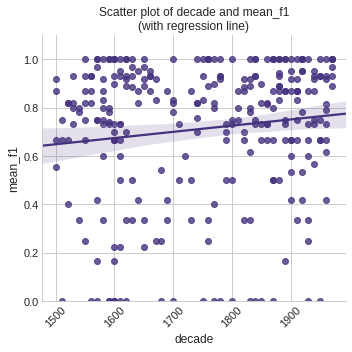

In [40]:
describe_data.describe_corpus_scatter(results_total_decade_10_df, wdir, "decade", "mean_f1", "CORDE by decades (10 texts)")

In [41]:
slope, intercept, r_value, p_value, std_err = stats.linregress(results_total_decade_10_df["decade"], results_total_decade_10_df["mean_f1"])
print(slope, intercept, r_value, p_value, std_err)

0.0002565792784231857 0.2636974284881883 0.12780348876097664 0.030130989775246614 0.00011773883737822784


## Close-up

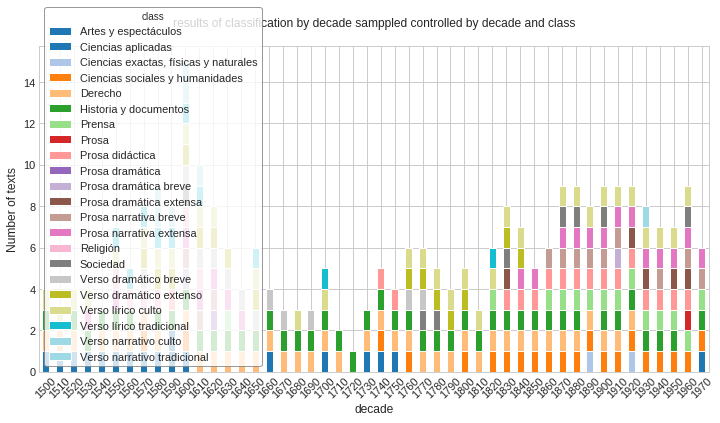

In [42]:
results_total_decade_10_df
describe_data.describe_corpus_stackedbars(results_total_decade_10_df, "class", wdir, "results of classification by decade samppled controlled")

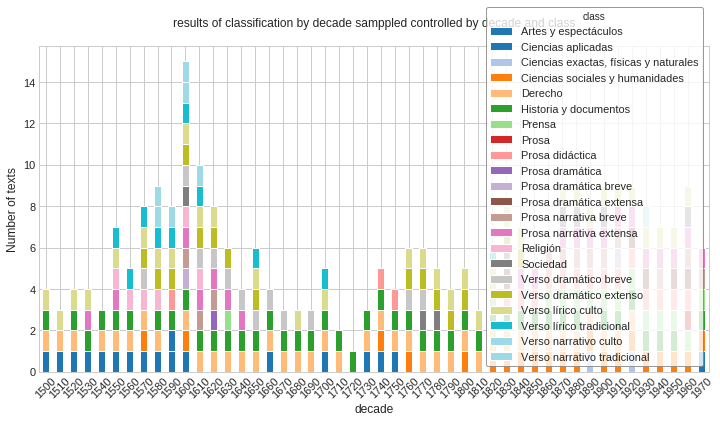

In [43]:

describe_data.describe_corpus_stackedbars(results_total_decade_10_df, "class", wdir, "results of classification by decade samppled controlled",loc_legend='lower right')


In [44]:
most_frequent_categories_lt = [category for category, value in Counter(results_total_decade_10_df["class"]).most_common(6) ]

In [61]:
Counter(results_total_decade_10_df["class"]).most_common()

[('Historia y documentos', 44),
 ('Derecho', 40),
 ('Verso lírico culto', 33),
 ('Ciencias sociales y humanidades', 21),
 ('Prosa narrativa extensa', 20),
 ('Prosa didáctica', 17),
 ('Artes y espectáculos', 16),
 ('Verso dramático extenso', 15),
 ('Prensa', 14),
 ('Verso dramático breve', 12),
 ('Prosa narrativa breve', 12),
 ('Verso lírico tradicional', 10),
 ('Sociedad', 8),
 ('Religión', 6),
 ('Prosa dramática extensa', 5),
 ('Verso narrativo tradicional', 4),
 ('Verso narrativo culto', 3),
 ('Ciencias aplicadas', 2),
 ('Prosa dramática breve', 2),
 ('Ciencias exactas, físicas y naturales', 2),
 ('Prosa dramática', 1),
 ('Prosa', 1)]

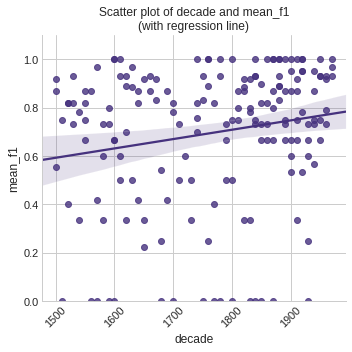

In [67]:
describe_data.describe_corpus_scatter(results_total_decade_10_df.loc[results_total_decade_10_df["class"].isin(most_frequent_categories_lt)], wdir, "decade", "mean_f1", "CORDE by decades (10 texts, after 1700)")


In [69]:
stats.linregress(results_total_decade_10_df.loc[results_total_decade_10_df["class"].isin(most_frequent_categories_lt)]["decade"],
                                                results_total_decade_10_df.loc[results_total_decade_10_df["class"].isin(most_frequent_categories_lt)]["mean_f1"])

LinregressResult(slope=0.00038673674746729443, intercept=0.012498356571889913, rvalue=0.1851648320015291, pvalue=0.014159226016272085, stderr=0.00015604797730788895)

In [40]:
results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1699]

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier,decade
0,Artes y espectáculos,1.000,1.000,1.000,1.000,1.000,0.6,0.400,LR,log,3000,True,[0.67 1. 1. 1. 1. 0.86 0.8 0.8 1. ...,9.226053e-07,archivo\nteatrbursub16 1\ndocolocosub14 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1700
0,Derecho,0.000,0.000,0.000,0.410,0.694,0.7,-0.700,LR,log,3000,True,[0.8 0.67 0.67 0.67 1. 0. 0. 0. 0. ...,3.646706e-02,archivo\ncartularsub17 0\nteatrbursub3 ...,10,3,3,"LogisticRegression(C=1.0, class_weight=None, d...",1700
0,Historia y documentos,0.819,1.000,0.694,0.410,0.694,0.7,0.119,LR,log,3000,True,[0. 0. 0. 0. 1. 0.67 1. 0. 0.86 ...,1.187742e-01,archivo\ncorfrenksub48 0\ncartularsub10 ...,10,3,3,"LogisticRegression(C=1.0, class_weight=None, d...",1700
0,Verso lírico culto,0.783,1.000,0.667,0.517,0.667,0.6,0.183,LR,log,3000,True,[1. 1. 1. 1. 0.86 0.8 0.8 1. 0.8 ...,5.477350e-05,archivo\ncedulasosub16 0\nvillancisub13 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1700
0,Verso lírico tradicional,0.833,0.875,0.875,0.750,0.792,0.6,0.233,LR,log,3000,True,[1. 1. 1. 1. 1. 1. 1. 0.67 1. ...,3.912573e-06,archivo\nromance1sub102 1\nromance1sub95 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1700
0,Derecho,0.500,0.500,0.500,0.683,0.792,0.6,-0.100,LR,log,3000,True,[1. 1. 0. 0. 0. 1. 1. 1. 0.67 ...,9.415075e-01,archivo\ncartularsub44 0\ncartularsub34 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1710
0,Historia y documentos,0.733,0.800,0.700,0.733,0.800,0.5,0.233,LR,log,3000,True,[0. 0. 0. 1. 1. 1. 1. 1. 0. ...,2.265263e-01,archivo\ncartularsub45 1\ncartularsub42 ...,10,5,3,"LogisticRegression(C=1.0, class_weight=None, d...",1710
0,Historia y documentos,0.600,0.800,0.500,0.467,0.600,0.5,0.100,LR,log,3000,True,[1. 1. 0. 0.67 0.67 0. 1. 0. 0.67 ...,5.894778e-01,archivo\ncartularsub58 1\nquitococsub2 ...,10,5,3,"LogisticRegression(C=1.0, class_weight=None, d...",1720
0,Historia y documentos,0.500,0.500,0.500,0.683,0.792,0.6,-0.100,LR,log,3000,True,[1. 0. 1. 0. 0. 1. 0.67 0. 1. ...,5.430446e-01,archivo\ncartularsub71 1\ncedulaecsub197 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1730
0,Derecho,0.333,0.500,0.250,0.433,0.583,0.6,-0.267,LR,log,3000,True,[0. 0. 0.67 0. 0. 0. 0. 1. 0.67 ...,8.519322e-03,archivo\nteatrbursub37 0\ncedulaecsub201 ...,10,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1730


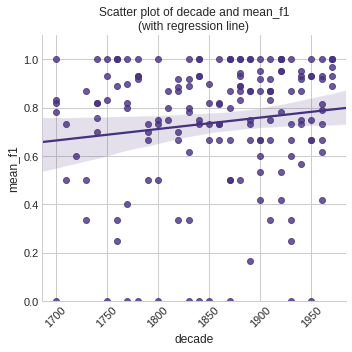

In [51]:
describe_data.describe_corpus_scatter(results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1699], wdir, "decade", "mean_f1", "CORDE by decades (10 texts, after 1700)")

In [52]:
stats.linregress(results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1699]["decade"], results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1699]["mean_f1"])

LinregressResult(slope=0.000475131824325901, intercept=-0.14369807042334903, rvalue=0.13117191731088268, pvalue=0.08724530175751688, stderr=0.0002762238243840504)

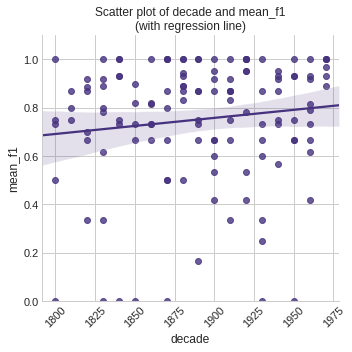

In [53]:
describe_data.describe_corpus_scatter(results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1799], wdir, "decade", "mean_f1", "CORDE by decades (10 texts, after 1800)")

In [54]:
stats.linregress(results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1799]["decade"], results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1799]["mean_f1"])

LinregressResult(slope=0.0006661132849599204, intercept=-0.5078996239030495, rvalue=0.12512899674938704, pvalue=0.15604706281705302, stderr=0.00046682952757432243)

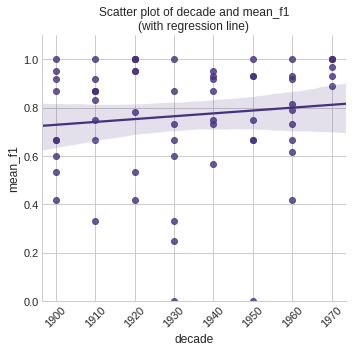

In [55]:
describe_data.describe_corpus_scatter(results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1899], wdir, "decade", "mean_f1", "CORDE by decades (10 texts, after 1800)")

In [56]:
stats.linregress(results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1899]["decade"], results_total_decade_10_df.loc[results_total_decade_10_df["decade"] > 1899]["mean_f1"])

LinregressResult(slope=0.0011831894124272576, intercept=-1.518898911207059, rvalue=0.1133766731435405, pvalue=0.37238339996474323, stderr=0.0013168167935199509)

# Classifying by Decade Controlling Text Length

In [31]:
corde_metadatos_modern_df["date"] = corde_metadatos_modern_df["prim_fecha"]

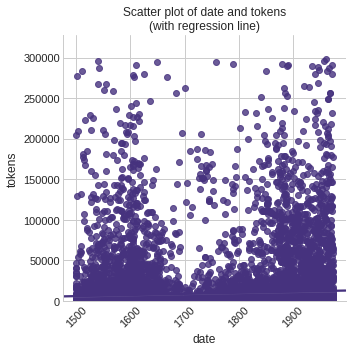

In [32]:
describe_data.describe_corpus_scatter(corde_metadatos_modern_df.loc[corde_metadatos_modern_df["tokens"] < 300000], wdir, "date","tokens","CORDE")

In [33]:
stats.linregress(corde_metadatos_modern_df["prim_fecha"], corde_metadatos_modern_df["tokens"])

LinregressResult(slope=10.415016243410868, intercept=-6012.201133513603, rvalue=0.030385562096123427, pvalue=3.2267280180610505e-05, stderr=2.504897867259239)

In [34]:
mininal_tokens_nr = corde_metadatos_modern_df["tokens"].quantile(0.25)
mininal_tokens_nr

349.0

In [35]:
maximal_tokens_nr = corde_metadatos_modern_df["tokens"].quantile(0.75)
maximal_tokens_nr

2609.0

In [37]:
corde_metadatos_modern_df.loc[(corde_metadatos_modern_df["tokens"] >= mininal_tokens_nr ) & (corde_metadatos_modern_df["tokens"] <= maximal_tokens_nr )].shape

(9366, 43)

In [52]:
for century_nr in sorted(list(set(corde_metadatos_modern_df["siglo"]))):
    print("century: ", century_nr)
    
    texts_century_lt = corde_metadatos_modern_df.loc[( corde_metadatos_modern_df["siglo"] == century_nr ) & (corde_metadatos_modern_df["tokens"] >= mininal_tokens_nr ) & (corde_metadatos_modern_df["tokens"] <= maximal_tokens_nr )].index.tolist()
    
    results_century_df = classify.classify(wdir, freq_table = corde_modern_freq_df.loc[texts_century_lt],
                  metadata = corde_metadatos_modern_df.loc[texts_century_lt], classes = classes_lt,
                  methods = ["LR"], max_MFFs = [3000], 
                  text_representations=["log"],
                  under_sample_method = "lpc-max", typographies=[True],
                                 sampling_times = 3, maximum_cases = 1000)

    results_century_df["century"] = century_nr
    
    results_century_df.to_csv(wdir + "results_century_"+str(century_nr) + ".tsv", sep="\t")


century:  16
cut_raw_features  token            de    se  una  para    la      ,    en    el     y     a  \
archivo                                                                     
actanoc1sub7   13.0   2.0  4.0   2.0   6.0   23.0   3.0   4.0  14.0   5.0   
actanoc2sub12  17.0   2.0  3.0   1.0  13.0   22.0   6.0  11.0  27.0   5.0   
actanoc3sub3   24.0   7.0  2.0   2.0   9.0   23.0   4.0   5.0  23.0   7.0   
actanoc3sub8   20.0   4.0  0.0   0.0  12.0   38.0   4.0  13.0  39.0   8.0   
agar           52.0  15.0  1.0   8.0  29.0  193.0  19.0  30.0  57.0  40.0   

token           ...     pasamos  veinticinco  vol  tam  vertical   nº  \
archivo         ...                                                     
actanoc1sub7    ...         0.0          0.0  0.0  0.0       0.0  0.0   
actanoc2sub12   ...         0.0          0.0  0.0  0.0       0.0  0.0   
actanoc3sub3    ...         0.0          0.0  0.0  0.0       0.0  0.0   
actanoc3sub8    ...         0.0          0.0  0.0  0.0       0.0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (422,) (422, 3000) lpc-max
cross validation sampling of  Artes y espectáculos


/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (422,) (422, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (422,) (422, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=150.63558978824418, pvalue=1.5998715986481278e-43)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.988
rec         0.986
prec        0.991
f1_macro    0.988
f1_micro    0.988
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.488


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 2617})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  2617
Labels shape (2617,) 
 Data shape (2617, 7000)
size after culling data: (2617, 7000) (2617,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 2616, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['rom']
(2617,)
(2617, 7000)
Counter({'0': 2616})
(2616, 7000) (2616,)
Least popupated class value:	  2616
Labels shape (2616,) 
 Data shape (2616, 6553)
size after culling data: (2616, 6553) (2616,)
typography  True
textual representation:  log
Columns that are empty:  []
(2616, 6553)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['nuevas', 'piedras', 'aragón']
After culling th

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (1000,) (1000, 3000) lpc-max
cross validation sampling of  Derecho
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (1000,) (1000, 3000) lpc-max
cross validation sampling of  Derecho
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (1000,) (1000, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=125.8853089009355, pvalue=2.8930130925418093e-41)
Class: 	 Derecho
Scores:
 	 f1          0.944
rec         0.942
prec        0.948
f1_macro    0.945
f1_micro    0.945
dtype: float64
p-value:  0.0
Baseline: 		 0.51
LR
0.43899999999999995


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 1975, '1': 642})
All your class values had mor

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (1284,) (1284, 3000) lpc-max
cross validation sampling of  Historia y documentos
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (1284,) (1284, 3000) lpc-max
cross validation sampling of  Historia y documentos
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (1284,) (1284, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=102.6596188006793, pvalue=1.0578715468984453e-38)
Class: 	 Historia y documentos
Scores:
 	 f1          0.946
rec         0.942
prec        0.951
f1_macro    0.947
f1_micro    0.947
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44599999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 2617})

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 2617})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  2617
Labels shape (2617,) 
 Data shape (2617, 7000)
size after culling data: (2617, 7000) (2617,)
typography  True
textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 2616, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Prob

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 6557)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['trata', 'nuevas', 'piedras']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.260129588726066, pvalue=2.3995808693173606e-07)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 2611,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 6557)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['trata', 'nuevas', 'piedras']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Religión
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Religión
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Religión
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.672382795444808, pvalue=4.350764232455307e-10)
Class: 	 Religión
Scores:
 	 f1          0.944
rec         1.000
prec        0.917
f1_macro    0.889
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44399999999999995


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 2609, '1': 8})
Some of your class values have less than 10 exampl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 6557)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['trata', 'nuevas', 'piedras']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.295895319360101, pvalue=2.006029738038282e-06)
Class: 	 Sociedad
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 2617})
All your class values had more than 10 examples. Con

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 2608, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(2617,)
(2617, 7000)
Counter({'0': 2608, '1': 9})
(2617, 7000) (2617,)
Least popupated class value:	  9
Labels shape (2617,) 
 Data shape (2617, 6557)
size after culling data: (2617, 6557) (2617,)
typography  True
textual representation:  log
Columns that are empty:  []
(2617, 6557)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['trata', 'nuevas', 'piedras']
method used:	 LR
(2617,)
(2617, 3000)
und

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 6557)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['trata', 'nuevas', 'piedras']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 2264, '1': 353})
All your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (706,) (706, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (706,) (706, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (706,) (706, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=143.20706219500627, pvalue=6.921318028595055e-43)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.959
rec         0.966
prec        0.953
f1_macro    0.959
f1_micro    0.959
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45899999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 2484, 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (266,) (266, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=66.65507519141751, pvalue=2.76030047092766e-33)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.940
rec         0.977
prec        0.910
f1_macro    0.936
f1_micro    0.937
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43999999999999995


analysed class:	 Verso narrativo culto
* Culling data
labels done
C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 6557)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['trata', 'nuevas', 'piedras']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.8304547985373991, pvalue=0.4441131654219258)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.4441
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2617, 6557)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['trata', 'nuevas', 'piedras']
method used:	 LR
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(2617,)
(2617, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.02719692757241, pvalue=3.8010540735232305e-06)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.792
rec         0.875
prec        0.750
f1_macro    0.708
f1_micro    0.750
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.29200000000000004
                             class  mean_f1  mean_rec  mean

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (40,) (40, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.430449208016467, pvalue=9.077825744124576e-15)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.893
rec         0.900
prec        0.933
f1_macro    0.893
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.393


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 1380})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 1380})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1380
Labels shape (1380,) 
 Data shape (1380, 7000)
size after culling data: (1380, 7000) (1380,)
typography  True
textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 1375, '1': 5}

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (858,) (858, 3000) lpc-max
cross validation sampling of  Derecho
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (858,) (858, 3000) lpc-max
cross validation sampling of  Derecho
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (858,) (858, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=150.23952676205465, pvalue=1.7266417394815889e-43)
Class: 	 Derecho
Scores:
 	 f1          0.973
rec         0.970
prec        0.977
f1_macro    0.973
f1_micro    0.973
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.473


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 1051, '1': 329})
All your class values had more than 10 examples. Co

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (658,) (658, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (658,) (658, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (658,) (658, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=78.52441123804712, pvalue=2.4436462316001346e-35)
Class: 	 Historia y documentos
Scores:
 	 f1          0.938
rec         0.930
prec        0.949
f1_macro    0.939
f1_micro    0.939
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43799999999999994


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 1199, '1': 181

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (362,) (362, 3000) lpc-max
cross validation sampling of  Prensa
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (362,) (362, 3000) lpc-max
cross validation sampling of  Prensa
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (362,) (362, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=150.70299310220187, pvalue=1.5792751442310112e-43)
Class: 	 Prensa
Scores:
 	 f1          0.989
rec         0.984
prec        0.995
f1_macro    0.989
f1_micro    0.989
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.489


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 1380})
All your class values had more than 10 examples. Congrats :)
Least popupated clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 1380})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1380
Labels shape (1380,) 
 Data shape (1380, 7000)
size after culling data: (1380, 7000) (1380,)
typography  True
textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 1378, '1': 2})
Some of your class values have less than 10 examples. We are going to c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 6564)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['papa', 'volvió', 'fiesta']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Prosa dramática breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=27.76274482107272, pvalue=7.486618311388352e-21)
Class: 	 Prosa dramática breve
Scores:
 	 f1          0.963
rec         1.000
prec        0.944
f1_macro    0.926
f1_micro    0.944
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46299999999999997


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 138

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 1380})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1380
Labels shape (1380,) 
 Data shape (1380, 7000)
size after culling data: (1380, 7000) (1380,)
typography  True
textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 1360, '1': 20})
All your class values had more than 10 examples. Con

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 1378, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(1380,)
(1380, 7000)
Counter({'0': 1378, '1': 2})
(1380, 7000) (1380,)
Least popupated class value:	  2
Labels shape (1380,) 
 Data shape (1380, 6564)
size after culling data: (1380, 6564) (1380,)
typography  True
textual representation:  log
Columns that are empty:  []
(1380, 6564)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['papa', 'volvió', 'fiesta']
method used:	 LR
(1380,)
(1380, 3000)
undersampling 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 6564)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['papa', 'volvió', 'fiesta']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=27.76274482107271, pvalue=7.486618311388404e-21)
Class: 	 Sociedad
Scores:
 	 f1          0.926
rec         1.000
prec        0.889
f1_macro    0.852
f1_micro    0.889
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42600000000000005


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 1380})
All your class values had more than 10 examples. Congrat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 1188, '1': 192})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  192
Labels shape (1380,) 
 Data shape (1380, 7000)
size after culling data: (1380, 7000) (1380,)
typography  True
textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (384,) (384, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (384,) (384, 3000) lpc-max
cross valida

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 6564)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['papa', 'volvió', 'fiesta']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.57427107756338, pvalue=1.139882064396182e-06)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 1271, '

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (218,) (218, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (218,) (218, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (218,) (218, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=58.63287442062157, pvalue=1.1078527672483025e-31)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.968
rec         0.964
prec        0.973
f1_macro    0.968
f1_micro    0.968
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46799999999999997


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 1330, '1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (100,) (100, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (100,) (100, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (100,) (100, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.94561006158666, pvalue=4.3289862578355145e-28)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.971
rec         0.980
prec        0.967
f1_macro    0.970
f1_micro    0.970
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.471


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 6564)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['papa', 'volvió', 'fiesta']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.9557740264262, pvalue=0.000780157210301091)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.857
rec         0.857
prec        0.857
f1_macro    0.905
f1_micro    0.929
dtype: float64
p-value:  0.0008
Baseline: 		 0.5
LR
0.357


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 1368, '1': 12

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1380, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
(1380,)
(1380, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso narrativo tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.1682695898557505, pvalue=1.0048905621975818e-06)
Class: 	 Verso narrativo tradicional
Scores:
 	 f1          0.847
rec         0.900
prec        0.817
f1_macro    0.840
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.347
                             class  mean_f1  mean_rec  mean_prec  f1_macro  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (102,) (102, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (102,) (102, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (102,) (102, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Artes y espectáculos
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 1673})
All your class values had more than 10 examples. Congrats 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 1673})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1673
Labels shape (1673,) 
 Data shape (1673, 7000)
size after culling data: (1673, 7000) (1673,)
typography  True
textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 1653, '1': 20

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (1650,) (1650, 3000) lpc-max
cross validation sampling of  Derecho
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (1650,) (1650, 3000) lpc-max
cross validation sampling of  Derecho
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (1650,) (1650, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=168.68359515977082, pvalue=6.031819892916777e-45)
Class: 	 Derecho
Scores:
 	 f1          0.943
rec         0.943
prec        0.945
f1_macro    0.944
f1_micro    0.944
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44299999999999995


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 1133, '1': 540})
All your class values had more t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (1080,) (1080, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (1080,) (1080, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (1080,) (1080, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=119.68049691032006, pvalue=1.2495816989838194e-40)
Class: 	 Historia y documentos
Scores:
 	 f1          0.932
rec         0.943
prec        0.924
f1_macro    0.931
f1_micro    0.931
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43200000000000005


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 1671, '

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 6550)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['fiesta', 'perder', 'miguel']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prensa
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 1673})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1673
Labels shape 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 1669, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(1673,)
(1673, 7000)
Counter({'0': 1669, '1': 4})
(1673, 7000) (1673,)
Least popupated class value:	  4
Labels shape (1673,) 
 Data shape (1673, 6550)
size after culling data: (1673, 6550) (1673,)
typography  True
textual representation:  log
Columns that are empty:  []
(1673, 6550)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['fiesta', 'perder', 'miguel']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
u

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 1673})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1673
Labels shape (1673,) 
 Data shape (1673, 7000)
size after culling data: (1673, 7000) (1673,)
typography  True
textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 1673})
All your class values had more than 10 examples. 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 1673})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1673
Labels shape (1673,) 
 Data shape (1673, 7000)
size after culling data: (1673, 7000) (1673,)
typography  True
textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 1669, '1': 4})
Some of your class values have less than 10 examples. We are going to cull

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 1666, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(1673,)
(1673, 7000)
Counter({'0': 1666, '1': 7})
(1673, 7000) (1673,)
Least popupated class value:	  7
Labels shape (1673,) 
 Data shape (1673, 6550)
size after culling data: (1673, 6550) (1673,)
typography  True
textual representation:  log
Columns that are empty:  []
(1673, 6550)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['fiesta', 'perder', 'miguel']
method used:	 LR
(1673,)
(1673, 3000)
undersa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (166,) (166, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (166,) (166, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (166,) (166, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 1574, '1': 99})
All your class values had more than 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (198,) (198, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (198,) (198, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (198,) (198, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=88.41286823760554, pvalue=7.947907755876685e-37)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.984
rec         0.979
prec        0.991
f1_macro    0.984
f1_micro    0.984
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.484


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 1666, '1': 7})
Some of 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 6550)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['fiesta', 'perder', 'miguel']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.82971786218411, pvalue=2.4563273477657007e-08)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 1669, '1': 4})
So

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 6550)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['fiesta', 'perder', 'miguel']
method used:	 LR
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(1673,)
(1673, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.3540064007726598, pvalue=0.2028976193904949)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.667
rec         0.750
prec        0.625
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.2029
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 16

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1673, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0             Artes y espectáculos    1.000     1.000      1.000     1.000   
1  Ciencias sociales y humanidades    0.913     0.900      0.967     0.920   
2                          Derecho    0.943     0.943      0.945     0.944   
3            Historia y documentos    0.932     0.943      0.924     0.931   
4                           Prensa    0.667     1.000      0.500     0.333   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     1.000       0.5        0.500              LR                 log  3000   
1     0.925       0.5        0.413              LR                 log  3000   


result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.160386507015303, pvalue=7.886241272347398e-09)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.867
rec         1.000
prec        0.800
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 1261, '1': 98})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  98
Labels shape (1359,) 
 Data shape (1359, 7000)
size after culling data: (1359, 7000) (1359,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (196,) (196, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (196,) (196, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (196,) (196, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.117311477080527, pvalue=5.5592545810555004e-18)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.843
rec         0.859
prec        0.843
f1_macro    0.842
f1_micro    0.843
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.34299999999999997


analysed class:	 Derecho
* Culling dat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (382,) (382, 3000) lpc-max
cross validation sampling of  Derecho
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (382,) (382, 3000) lpc-max
cross validation sampling of  Derecho
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (382,) (382, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=76.44936790170364, pvalue=5.293729990265797e-35)
Class: 	 Derecho
Scores:
 	 f1          0.958
rec         0.968
prec        0.950
f1_macro    0.958
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45799999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 804, '1': 555})
All your class values had more than 10 e

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (1110,) (1110, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (1110,) (1110, 3000) lpc-max
cross validation sampling of  Historia y documentos
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (1110,) (1110, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=140.4779757137785, pvalue=1.2083169573115519e-42)
Class: 	 Historia y documentos
Scores:
 	 f1          0.951
rec         0.941
prec        0.962
f1_macro    0.951
f1_micro    0.951
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45099999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 1259, '1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (200,) (200, 3000) lpc-max
cross validation sampling of  Prensa
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (200,) (200, 3000) lpc-max
cross validation sampling of  Prensa
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (200,) (200, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=49.12701318901165, pvalue=1.7810960556745827e-29)
Class: 	 Prensa
Scores:
 	 f1          0.942
rec         0.970
prec        0.920
f1_macro    0.940
f1_micro    0.940
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44199999999999995


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 1359})
All your class values had more than 10 examples. Congrats :)
Least p

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 1235, '1': 124})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  124
Labels shape (1359,) 
 Data shape (1359, 7000)
size after culling data: (1359, 7000) (1359,)
typography  True
textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (248,) (248, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (248,) (248, 3000) lpc-max
cross validation sampling of  Pros

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 1358, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['undrama']
(1359,)
(1359, 7000)
Counter({'0': 1358})
(1358, 7000) (1358,)
Least popupated class value:	  1358
Labels shape (1358,) 
 Data shape (1358, 6434)
size after culling data: (1358, 6434) (1358,)
typography  True
textual representation:  log
Columns that are empty:  []
(1358, 6434)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['qu', 'muestra', 'carácter']
After culling the class Prosa dramáti

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 1359})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1359
Labels shape (1359,) 
 Data shape (1359, 7000)
size after culling data: (1359, 7000) (1359,)
typography  True
textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 1340, '1': 19})
All your class values had more than 10 examples. Congrats :)
Least popupa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 1357, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(1359,)
(1359, 7000)
Counter({'0': 1357, '1': 2})
(1359, 7000) (1359,)
Least popupated class value:	  2
Labels shape (1359,) 
 Data shape (1359, 6434)
size after culling data: (1359, 6434) (1359,)
typography  True
textual representation:  log
Columns that are empty:  []
(1359, 6434)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['qu', 'muestra', 'carácter']
method used:	 LR
(1359,)
(1359, 3000)
undersam

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=10.56028706623775, pvalue=1.8888569045755034e-11)
Class: 	 Verso dramático extenso
Scores:
 	 f1          0.933
rec         0.900
prec        1.000
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (208,) (208, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (208,) (208, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (208,) (208, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=58.50290109068219, pvalue=1.180877880343497e-31)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.957
rec         0.961
prec        0.954
f1_macro    0.956
f1_micro    0.956
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45699999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 1298, '1'

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (122,) (122, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (122,) (122, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (122,) (122, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=61.24627410933232, pvalue=3.158821542303357e-32)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.991
rec         0.983
prec        1.000
f1_macro    0.992
f1_micro    0.992
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.491


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 13

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 6434)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['qu', 'muestra', 'carácter']
method used:	 LR
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(1359,)
(1359, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.499999999999993, pvalue=4.025677386029634e-12)
Class: 	 Verso narrativo culto
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 1359})
All your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(1359, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                                   class  mean_f1  mean_rec  mean_prec  \
0  Ciencias exactas, físicas y naturales    0.867     1.000      0.800   
1        Ciencias sociales y humanidades    0.843     0.859      0.843   
2                                Derecho    0.958     0.968      0.950   
3                  Historia y documentos    0.951     0.941      0.962   
4                                 Prensa    0.942     0.970      0.920   

   f1_macro  f1_micro  baseline  f1-baseline classifier_name  \
0     0.733     0.800       0.5        0.367              LR   
1     0.842     0.843       0.5        0.343              LR   
2     0.958     0.958       0.5        0.458              LR   
3     0.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Count

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (376,) (376, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (376,) (376, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (376,) (376, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=80.68944539930663, pvalue=1.1142936791039e-35)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.949
rec         0.952
prec        0.949
f1_macro    0.949
f1_micro    0.949
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44899999999999995


analysed class:	 Derecho
* Culling data
lab

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (166,) (166, 3000) lpc-max
cross validation sampling of  Derecho
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (166,) (166, 3000) lpc-max
cross validation sampling of  Derecho
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (166,) (166, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=75.95829139135374, pvalue=6.375791688821307e-35)
Class: 	 Derecho
Scores:
 	 f1          0.979
rec         0.962
prec        1.000
f1_macro    0.981
f1_micro    0.981
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.479


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 1762, '1': 575})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (1150,) (1150, 3000) lpc-max
cross validation sampling of  Historia y documentos
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (1150,) (1150, 3000) lpc-max
cross validation sampling of  Historia y documentos
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (1150,) (1150, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=164.01294770391593, pvalue=1.3606194634409158e-44)
Class: 	 Historia y documentos
Scores:
 	 f1          0.974
rec         0.965
prec        0.982
f1_macro    0.974
f1_micro    0.974
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.474


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 1463, '1': 874})
All y

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (1748,) (1748, 3000) lpc-max
cross validation sampling of  Prensa
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (1748,) (1748, 3000) lpc-max
cross validation sampling of  Prensa
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (1748,) (1748, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=144.21004056408395, pvalue=5.654669800807198e-43)
Class: 	 Prensa
Scores:
 	 f1          0.923
rec         0.919
prec        0.928
f1_macro    0.923
f1_micro    0.923
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42300000000000004


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 2333, '1': 4})
Some of your class values have less than 10 examples. W

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 6337)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['antigua', 'república', 'condición']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prosa
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prosa
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prosa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.865917579353056, pvalue=1.30559575305849e-07)
Class: 	 Prosa
Scores:
 	 f1          0.917
rec         1.000
prec        0.875
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.41700000000000004


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 2305, '1': 32})
All your class values had more than 10 examples. Congrat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (64,) (64, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (64,) (64, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (64,) (64, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.060751137662562, pvalue=3.0263353414848013e-15)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.807
rec         0.842
prec        0.832
f1_macro    0.803
f1_micro    0.812
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.30700000000000005


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 2337})
All your class values had mo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 2330, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(2337,)
(2337, 7000)
Counter({'0': 2330, '1': 7})
(2337, 7000) (2337,)
Least popupated class value:	  7
Labels shape (2337,) 
 Data shape (2337, 6337)
size after culling data: (2337, 6337) (2337,)
typography  True
textual representation:  log
Columns that are empty:  []
(2337, 6337)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['antigua', 'república', 'condición']
method used:	 LR
(2337,)
(2337, 3000)
u

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 2331, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(2337,)
(2337, 7000)
Counter({'0': 2331, '1': 6})
(2337, 7000) (2337,)
Least popupated class value:	  6
Labels shape (2337,) 
 Data shape (2337, 6337)
size after culling data: (2337, 6337) (2337,)
typography  True
textual representation:  log
Columns that are empty:  []
(2337, 6337)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['antigua', 'república', 'condición']
method used:	 LR
(2337,)
(2337, 3000)
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (164,) (164, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (164,) (164, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (164,) (164, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=60.28099983476621, pvalue=4.989919628727924e-32)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.957
rec         0.964
prec        0.958
f1_macro    0.956
f1_micro    0.957
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45699999999999996


analysed class:	 Prosa narrativa extensa
* Culling data
labels done
Counter({'0':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (826,) (826, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (826,) (826, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(2337,)
(2337, 3000)
undersampling lpc-max
undersampled (826,) (826, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=481.4602526721366, pvalue=3.773581627012557e-58)
Class: 	 Prosa narrativa extensa
Scores:
 	 f1          0.996
rec         0.995
prec        0.998
f1_macro    0.996
f1_micro    0.996
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.496


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 2337})
All your clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 2332, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(2337,)
(2337, 7000)
Counter({'0': 2332, '1': 5})
(2337, 7000) (2337,)
Least popupated class value:	  5
Labels shape (2337,) 
 Data shape (2337, 6337)
size after culling data: (2337, 6337) (2337,)
typography  True
textual representation:  log
Columns that are empty:  []
(2337, 6337)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['antigua', 'república', 'condición']
method used:	 LR
(2337,)
(2337, 3000)
undersampling lpc-max

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 2337})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  2337
Labels shape (2337,) 
 Data shape (2337, 7000)
size after culling data: (2337, 7000) (2337,)
typography  True
textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 2337})
All your class values had more than 10 examples. Co

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(2337, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 2336, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['toledo36']
(2337,)
(2337, 7000)
Counter({'0': 2336})
(2336, 7000) (2336,)
Least popupated class value:	  2336
Labels shape (2336,) 
 Data shape (2336, 6337)
size after culling data: (2336, 6337) (2336,)
typography  True
textual representation:  log
Columns that are empty:  []
(2336, 6337)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['antigua', 'república', 'condición']
After culling the cl

In [29]:
i = 0
import os
import glob 
for doc_str in sorted(glob.glob(wdir + "*.tsv")):
    if "results_century_" in doc_str:
        print(doc_str)
        results_df = pd.read_csv(doc_str, sep="\t", index_col=0)

        if i == 0:
            results_total_century_df = results_df
        else:
            results_total_century_df = pd.concat([results_total_century_df,results_df])
        i += 1
print(i)

results_total_century_df.sort_values(by="century", inplace=True)

/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_century_16.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_century_17.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_century_18.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_century_19.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_century_20.tsv
5


In [30]:
results_total_century_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier,century
0,Artes y espectáculos,0.988,0.986,0.991,0.988,0.988,0.500,0.488,LR,log,3000,True,[0.98 0.98 0.98 1. 1. 0.95 1. 1. 1. ...,1.599872e-43,archivo\ndocupintsub87 1\ndocmal2sub99 ...,422,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
12,Verso narrativo culto,0.667,1.000,0.500,0.333,0.500,0.500,0.167,LR,log,3000,True,[0. 0.67 0.67 1. 0.67 0.67],4.441132e-01,archivo\njauja 1\nsilvvar1sub28 ...,4,2,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
9,Verso dramático extenso,0.667,1.000,0.500,0.333,0.500,0.500,0.167,LR,log,3000,True,[0.67 0.67 0.67 0.67 0.67 0.67],0.000000e+00,archivo\nreltoledsub18 0\nvenatori ...,4,2,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
13,Verso narrativo tradicional,0.792,0.875,0.750,0.708,0.750,0.500,0.292,LR,log,3000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,3.801054e-06,archivo\nsigloorosub20 1\nsigloorosub47 ...,16,8,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
7,Sociedad,0.917,1.000,0.875,0.833,0.875,0.500,0.417,LR,log,3000,True,[1. 0. 1. 1. 1. 1. 1. 1. 0.67 ...,2.006030e-06,archivo\njcruzsub13 0\ncofradiasub9 ...,16,8,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
5,Prosa narrativa extensa,0.933,1.000,0.900,0.867,0.900,0.500,0.433,LR,log,3000,True,[0.67 0.67 0.67 1. 1. 1. 1. 1. 1. ...,2.399581e-07,archivo\ncoloqerasub15 1\ncoloqerasub2 ...,10,5,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
2,Derecho,0.944,0.942,0.948,0.945,0.945,0.505,0.439,LR,log,3000,True,[0.96 0.93 0.94 0.93 0.92 0.89 0.95 0.95 0.92 ...,2.893013e-41,archivo\njustabassub8 0\nsilvvar1sub16 ...,1000,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
4,Prosa narrativa breve,0.889,1.000,0.833,0.778,0.833,0.500,0.389,LR,log,3000,True,[0. 1. 0.67 0. 0.67 1. 1. 0.67 1. ],2.555082e-01,archivo\ncuejuansub2 1\nsanttorssub156 ...,6,3,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
6,Religión,0.944,1.000,0.917,0.889,0.917,0.500,0.444,LR,log,3000,True,[1. 1. 1. 1. 0.67 0.67 1. 1. 1. ...,4.350764e-10,archivo\navimonja 1\nvejteres ...,12,6,3,"LogisticRegression(C=1.0, class_weight=None, d...",16
3,Historia y documentos,0.946,0.942,0.951,0.947,0.947,0.500,0.446,LR,log,3000,True,[0.93 0.92 0.94 0.91 0.95 0.95 0.97 0.97 0.95 ...,1.057872e-38,archivo\ndocmexsosub5 0\nepteresasub8 ...,1284,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",16


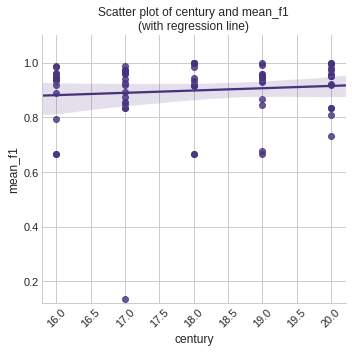

In [31]:
describe_data.describe_corpus_scatter(results_total_century_df, wdir, "century", "mean_f1", "CORDE by centuries (size of texts controlled)")

In [32]:
stats.linregress(results_total_century_df["century"], results_total_century_df["mean_f1"])

LinregressResult(slope=0.008424713425296293, intercept=0.7459386050126284, rvalue=0.09317542865016389, pvalue=0.43960648576846895, stderr=0.010837665996694022)

In [34]:
corde_metadatos_modern_df


,archivo,titulo,autor,pais,fechacre,tema,medio,formas,tokens,types,...,Prosa narrativa extensa,Religión,Sociedad,Verso dramático,Verso dramático breve,Verso dramático extenso,Verso lírico culto,Verso lírico tradicional,Verso narrativo culto,Verso narrativo tradicional
archivo,,,,,,,,,,,,,,,,,,,,,
aazorin,aazorin,Antonio Azorín,Azorín (José Martínez Ruiz),España,1903,Prosa narrativa extensa: Novela y otras formas...,Libro,46506,55549,9088,...,1,0,0,0,0,0,0,0,0,0
abacca,abacca,Invitación a filosofar,"García Bacca, Juan David",España,1940 1942,ciencias sociales y humanidades: Filosofía y é...,Libro,72409,86842,7569,...,0,0,0,0,0,0,0,0,0,0
abaddon,abaddon,Abaddón el exterminador,"Sábato, Ernesto",Argentina,1974,Prosa narrativa extensa: Novela y otras formas...,Libro,151432,176986,20650,...,1,0,0,0,0,0,0,0,0,0
abadengo,abadengo,El Abadengo de Sahagún. Contribución al estudi...,"Puyol y Alonso, Julio",España,1915,Prosa didáctica: Oratoria y discurso,Libro,77110,93321,13484,...,0,0,0,0,0,0,0,0,0,0
abajo,abajo,Los de abajo,"Azuela, Mariano",México,1916,Prosa narrativa extensa: Novela y otras formas...,Libro,35183,44511,7423,...,1,0,0,0,0,0,0,0,0,0
abate,abate,Cartas a su hermano don Carlos Andrés,"Andrés, Juan",España,1793,Historia y documentos: Cartas y relaciones,Libro,16514,18768,3270,...,0,0,0,0,0,0,0,0,0,0
abc1974sub10,abc1974sub10,"Yanguas Messía [ABC, 4 de julio de 1974]","Azcárraga, José Luis de",España,1974,Prensa,Prensa,789,960,428,...,0,0,0,0,0,0,0,0,0,0
abc1974sub100,abc1974sub100,Elección para cubrir concejalías vacantes [ABC...,Anónimo,España,1974,Prensa: Política y gobierno,Prensa,150,168,104,...,0,0,0,0,0,0,0,0,0,0
abc1974sub101,abc1974sub101,"Se hacen efectivos los despidos de Elsa [ABC, ...",Anónimo,España,1974,Prensa,Prensa,268,300,152,...,0,0,0,0,0,0,0,0,0,0


In [39]:

corde_metadatos_modern_df["decade"] = corde_metadatos_modern_df["prim_fecha"].astype(str).str.slice(0,3)+"0"

for decade_nr in sorted(list(set(corde_metadatos_modern_df["decade"]))):
    print("decade: ", decade_nr)
    
    texts_decade_lt = corde_metadatos_modern_df.loc[( corde_metadatos_modern_df["decade"] == decade_nr ) & (corde_metadatos_modern_df["tokens"] >= mininal_tokens_nr ) & (corde_metadatos_modern_df["tokens"] <= maximal_tokens_nr )].index.tolist()

    
    results_decade_df = classify.classify(wdir, freq_table = corde_modern_freq_df.loc[texts_decade_lt],
                  metadata = corde_metadatos_modern_df.loc[texts_decade_lt], classes = classes_lt,
                  methods = ["LR"], max_MFFs = [3000], 
                  text_representations=["log"],
                  under_sample_method = "lpc-max", typographies=[True],
                                 sampling_times = 3, maximum_cases = 1000)
    
    results_decade_df["decade"] = decade_nr
    results_decade_df.to_csv(wdir + "results_sample_size_controlled_decade_"+str(decade_nr) + ".tsv", sep="\t")

    

decade:  1500
cut_raw_features  token             de    se  una  para    la      ,    en    el     y     a  \
archivo                                                                      
ahbilb2bsub17   36.0   2.0  0.0   2.0  16.0   58.0  23.0  16.0   1.0   7.0   
ahbilb2bsub20   96.0  11.0  0.0   2.0  34.0  116.0  31.0  25.0   0.0  14.0   
amor            43.0  16.0  0.0  10.0  31.0  193.0  41.0  32.0  54.0  14.0   
campezsosub1   118.0  18.0  0.0   3.0  46.0   99.0  52.0  24.0  89.0  32.0   
campezsosub3    80.0   3.0  0.0   2.0  28.0   58.0  16.0  16.0   9.0   9.0   

token           ...     pasamos  veinticinco  vol  tam  vertical   nº  \
archivo         ...                                                     
ahbilb2bsub17   ...         0.0          0.0  0.0  0.0       0.0  0.0   
ahbilb2bsub20   ...         0.0          0.0  0.0  0.0       0.0  0.0   
amor            ...         0.0          0.0  0.0  0.0       0.0  0.0   
campezsosub1    ...         0.0          0.0  0.0  0.0  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(273, 4193)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['patente', 'quisiesen', 'gonçález']
method used:	 LR
(273,)
(273, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(273,)
(273, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(273,)
(273, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.269956522396435, pvalue=0.0030274785453392214)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.778
rec         0.778
prec        0.778
f1_macro    0.852
f1_micro    0.889
dtype: float64
p-value:  0.003
Baseline: 		 0.5
LR
0.278


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 273})
All your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(273, 7000)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 272, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['rom']
(273,)
(273, 7000)
Counter({'0': 272})
(272, 7000) (272,)
Least popupated class value:	  272
Labels shape (272,) 
 Data shape (272, 4169)
size after culling data: (272, 4169) (272,)
typography  True
textual representation:  log
Columns that are empty:  []
(272, 4169)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['ortiz', 'consiente', 'puercos']
After culling the class Cienci

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(273, 7000)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(273,)
(273, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Historia y documentos
(273,)
(273, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Historia y documentos
(273,)
(273, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=48.49015108025517, pvalue=2.5888825139306245e-29)
Class: 	 Historia y documentos
Scores:
 	 f1          0.951
rec         0.950
prec        0.963
f1_macro    0.952
f1_micro    0.953
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45099999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 273})
All your class value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(273, 7000)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 273})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  273
Labels shape (273,) 
 Data shape (273, 7000)
size after culling data: (273, 7000) (273,)
typography  True
textual representation:  log
Columns that are empty:  []
(273, 7000)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 272, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(273, 7000)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 273})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  273
Labels shape (273,) 
 Data shape (273, 7000)
size after culling data: (273, 7000) (273,)
typography  True
textual representation:  log
Columns that are empty:  []
(273, 7000)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 273})
All your class values had more than 10 examples. Congrat

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(273, 4193)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['patente', 'quisiesen', 'gonçález']
method used:	 LR
(273,)
(273, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(273,)
(273, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(273,)
(273, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.6854996561581048, pvalue=0.1527048880970376)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.1527
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 272, '1': 1})
Some of y

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(272, 4151)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['durar', 'coto', 'yerbas']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 272, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['sigloorosub20']
(273,)
(273, 7000)
Counter({'0': 272})
(272, 7000) (272,)
Least popupated class value:	  272
Labels shape (272,) 
 Data shape (272, 4180)
size after culling data: (272, 4180) (272,)
typography  True
textual representation:  log
Columns that are empty:  []
(272, 4180)
MFW 3000
The three first MFWs:  ['de', 'e', ',']
The three last MFWs:  ['ygual', 'trecho', 'enojos']
After culling the class Verso na

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(267, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 267})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  267
Labels shape (267,) 
 Data shape (267, 7000)
size after culling data: (267, 7000) (267,)
typography  True
textual representation:  log
Columns that are empty:  []
(267, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'1': 156, '0': 111})
A

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(267, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(267,)
(267, 3000)
undersampling lpc-max
undersampled (114,) (114, 3000) lpc-max
cross validation sampling of  Derecho
(267,)
(267, 3000)
undersampling lpc-max
undersampled (114,) (114, 3000) lpc-max
cross validation sampling of  Derecho
(267,)
(267, 3000)
undersampling lpc-max
undersampled (114,) (114, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=42.26506086289598, pvalue=1.3187547109993499e-27)
Class: 	 Derecho
Scores:
 	 f1          0.953
rec         0.980
prec        0.936
f1_macro    0.947
f1_micro    0.948
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45299999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 265, '1': 2})
Some of your class values have less than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(267, 4353)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['grita', 'prinçipe', 'garci']
method used:	 LR
(267,)
(267, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Historia y documentos
(267,)
(267, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Historia y documentos
(267,)
(267, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.999999999999997, pvalue=0.000492906660572445)
Class: 	 Historia y documentos
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.5


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 267})
All your class values had more than 10 examples

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(267, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 267})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  267
Labels shape (267,) 
 Data shape (267, 7000)
size after culling data: (267, 7000) (267,)
typography  True
textual representation:  log
Columns that are empty:  []
(267, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 267})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  267
Labels 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(267, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 266, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['dialcant']
(267,)
(267, 7000)
Counter({'0': 266})
(266, 7000) (266,)
Least popupated class value:	  266
Labels shape (266,) 
 Data shape (266, 4342)
size after culling data: (266, 4342) (266,)
typography  True
textual representation:  log
Columns that are empty:  []
(266, 4342)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['proa', 'cargados', 'supiese']
After culling the class Verso dramático bre

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(267, 4353)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['grita', 'prinçipe', 'garci']
method used:	 LR
(267,)
(267, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(267,)
(267, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(267,)
(267, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.0, pvalue=0.0004929066605724437)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 267})
All you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(267, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 267})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  267
Labels shape (267,) 
 Data shape (267, 7000)
size after culling data: (267, 7000) (267,)
typography  True
textual representation:  log
Columns that are empty:  []
(267, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0             Artes y espectáculos    1.000     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (88,) 
 Data shape (88, 7000)
size after culling data: (88, 7000) (88,)
typography  True
textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 88})
All your cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(88,)
(88, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Historia y documentos
(88,)
(88, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-inf, pvalue=0.0)
Class: 	 Historia y documentos
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
-0.5


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (88,) 
 Data shape (88, 7000)
size after culling data: (88, 7000) (88,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (88,) 
 Data shape (88, 7000)
size after culling data: (88, 7000) (88,)
typography  True
textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels sh

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 82, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(88,)
(88, 7000)
Counter({'0': 82, '1': 6})
(88, 7000) (88,)
Least popupated class value:	  6
Labels shape (88,) 
 Data shape (88, 3770)
size after culling data: (88, 3770) (88,)
typography  True
textual representation:  log
Columns that are empty:  []
(88, 3770)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['satisfecho', 'infinito', 'vengan']
method used:	 LR
(88,)
(88, 3000)
undersampling lp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(88,)
(88, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(88,)
(88, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.553105449115935, pvalue=0.0008259208564842578)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0008
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (88,) 
 Data shape (88, 7000)
size after culling data: (88, 7000) (88,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (88,) 
 Data shape (88, 7000)
size after culling data: (88, 7000) (88,)
typography  True
textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0   Artes y espectáculos    0.944     1.000     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 243})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  243
Labels shape (243,) 
 Data shape (243, 7000)
size after culling data: (243, 7000) (243,)
typography  True
textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 243})
All your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(243,)
(243, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
(243,)
(243, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
(243,)
(243, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.149257029631226, pvalue=7.212997137837952e-08)
Class: 	 Historia y documentos
Scores:
 	 f1          0.800
rec         0.900
prec        0.750
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.30000000000000004


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 243})
All your class value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 243})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  243
Labels shape (243,) 
 Data shape (243, 7000)
size after culling data: (243, 7000) (243,)
typography  True
textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 243})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  243
Labels 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 243})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  243
Labels shape (243,) 
 Data shape (243, 7000)
size after culling data: (243, 7000) (243,)
typography  True
textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 243})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  243

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 243})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  243
Labels shape (243,) 
 Data shape (243, 7000)
size after culling data: (243, 7000) (243,)
typography  True
textual representation:  log
Columns that are empty:  []
(243, 7000)
MFW 3000
The three first MFWs:  ['de', 'que', 'e']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 243})
All your class values had more than 10 ex

result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.79583152331272, pvalue=7.744988642298057e-05)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.875
rec         0.875
prec        0.875
f1_macro    0.917
f1_micro    0.938
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.375


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 163})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  163
Labels shape (163,) 
 Data shape (163, 7000)
size after culling data: (163, 7000) (163,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(163, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 163})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  163
Labels shape (163,) 
 Data shape (163, 7000)
size after culling data: (163, 7000) (163,)
typography  True
textual representation:  log
Columns that are empty:  []
(163, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 163})
All your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(163, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(163,)
(163, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
(163,)
(163, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
(163,)
(163, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.397991279209563, pvalue=9.615674248831656e-15)
Class: 	 Historia y documentos
Scores:
 	 f1          0.873
rec         0.950
prec        0.850
f1_macro    0.827
f1_micro    0.850
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.373


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 163})
All your class values had more th

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(163, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 163})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  163
Labels shape (163,) 
 Data shape (163, 7000)
size after culling data: (163, 7000) (163,)
typography  True
textual representation:  log
Columns that are empty:  []
(163, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 163})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  163
Labels 

(163,)
(163, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(163,)
(163, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.806496149231549, pvalue=1.0860967450322334e-09)
Class: 	 Verso lírico culto
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 160, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(163,)
(163, 7000)
Counter({'0': 160, '1': 3})
(163, 7000) (163,)
Least popupated class value:	  3
Labels shape (163,) 
 Data shape (163, 4354)
size afte

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(163, 4354)
MFW 3000
The three first MFWs:  ['de', ',', 'que']
The three last MFWs:  ['carreras', 'retablo', 'paris']
method used:	 LR
(163,)
(163, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(163,)
(163, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(163,)
(163, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.693182879212223, pvalue=2.3896449238470828e-05)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 163})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(163, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 163})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  163
Labels shape (163,) 
 Data shape (163, 7000)
size after culling data: (163, 7000) (163,)
typography  True
textual representation:  log
Columns that are empty:  []
(163, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0      Artes y espectáculos    0.875     0.87

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(268, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 268})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  268
Labels shape (268,) 
 Data shape (268, 7000)
size after culling data: (268, 7000) (268,)
typography  True
textual representation:  log
Columns that are empty:  []
(268, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 268})
All your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(268, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(268,)
(268, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
(268,)
(268, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
(268,)
(268, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=32.39783044096699, pvalue=2.516004280742843e-24)
Class: 	 Historia y documentos
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 268})
All your class values h

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(268, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 268})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  268
Labels shape (268,) 
 Data shape (268, 7000)
size after culling data: (268, 7000) (268,)
typography  True
textual representation:  log
Columns that are empty:  []
(268, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 268})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  268
Labels shape 

(268,)
(268, 3000)
undersampling lpc-max
undersampled (254,) (254, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(268,)
(268, 3000)
undersampling lpc-max
undersampled (254,) (254, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=73.92166356643594, pvalue=1.3967928909178657e-34)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.968
rec         0.967
prec        0.972
f1_macro    0.968
f1_micro    0.968
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46799999999999997


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 200, '1': 68})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  68
Labels shape (268,) 
 Data shape (268, 7000)
size after culling data: (268, 7000) (268,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(268, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(268,)
(268, 3000)
undersampling lpc-max
undersampled (136,) (136, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(268,)
(268, 3000)
undersampling lpc-max
undersampled (136,) (136, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(268,)
(268, 3000)
undersampling lpc-max
undersampled (136,) (136, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.98040433468872, pvalue=4.232148838942599e-28)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.953
rec         0.940
prec        0.975
f1_macro    0.955
f1_micro    0.956
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45299999999999996


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(268, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 268})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  268
Labels shape (268,) 
 Data shape (268, 7000)
size after culling data: (268, 7000) (268,)
typography  True
textual representation:  log
Columns that are empty:  []
(268, 7000)
MFW 3000
The three first MFWs:  ['que', 'de', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0      Artes y espectáculos    0.980     1.000     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(199, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 199})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  199
Labels shape (199,) 
 Data shape (199, 7000)
size after culling data: (199, 7000) (199,)
typography  True
textual representation:  log
Columns that are empty:  []
(199, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 199})
All your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(199, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(199,)
(199, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(199,)
(199, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(199,)
(199, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.01740754622509, pvalue=2.7239422616686554e-17)
Class: 	 Historia y documentos
Scores:
 	 f1          0.893
rec         0.883
prec        0.940
f1_macro    0.901
f1_micro    0.904
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.393


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 199})
All your class values had more than 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(199, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 199})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  199
Labels shape (199,) 
 Data shape (199, 7000)
size after culling data: (199, 7000) (199,)
typography  True
textual representation:  log
Columns that are empty:  []
(199, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 199})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  199
Labels shape 

textual representation:  log
Columns that are empty:  []
(198, 4477)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['apreciar', 'ordenanza', 'solares']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 170, '1': 29})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  29
Labels shape (199,) 
 Data shape (199, 7000)
size after culling data: (199, 7000) (199,)
typography  True
textual representation:  log
Columns that are empty:  []
(199, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(199,)
(199, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(199,)
(199, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross valida

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(199, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 199})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  199
Labels shape (199,) 
 Data shape (199, 7000)
size after culling data: (199, 7000) (199,)
typography  True
textual representation:  log
Columns that are empty:  []
(199, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0      Artes y espectáculos    0.920     0.900     

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 526})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  526
Labels shape (526,) 
 Data shape (526, 7000)
size after culling data: (526, 7000) (526,)
typography  True
textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 526})
All you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(526,)
(526, 3000)
undersampling lpc-max
undersampled (422,) (422, 3000) lpc-max
cross validation sampling of  Historia y documentos
(526,)
(526, 3000)
undersampling lpc-max
undersampled (422,) (422, 3000) lpc-max
cross validation sampling of  Historia y documentos
(526,)
(526, 3000)
undersampling lpc-max
undersampled (422,) (422, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=68.33853690588037, pvalue=1.3450506229624742e-33)
Class: 	 Historia y documentos
Scores:
 	 f1          0.950
rec         0.948
prec        0.953
f1_macro    0.950
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44999999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 526})
All your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 526})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  526
Labels shape (526,) 
 Data shape (526, 7000)
size after culling data: (526, 7000) (526,)
typography  True
textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 526})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  526
Lab

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 522, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(526,)
(526, 7000)
Counter({'0': 522, '1': 4})
(526, 7000) (526,)
Least popupated class value:	  4
Labels shape (526,) 
 Data shape (526, 5562)
size after culling data: (526, 5562) (526,)
typography  True
textual representation:  log
Columns that are empty:  []
(526, 5562)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['cabras', 'concluye', 'regocijo']
method used:	 LR
(526,)
(526, 3000)
undersampling lp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(525, 5559)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['regocijo', 'acudió', 'soto']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 526})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  526
Labels shape (526,) 
 Data shape (526, 7000)
size after culling data: (526, 7000) (526,)
typography  True
textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 522, '1': 4})
Some of your class values have less than 10 examples. We are g

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 483, '1': 43})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  43
Labels shape (526,) 
 Data shape (526, 7000)
size after culling data: (526, 7000) (526,)
typography  True
textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
method used:	 LR
(526,)
(526, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(526,)
(526, 3000)
undersampling lpc-max
undersampled (86,) (86, 3000) lpc-max
cross validation sa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(526, 5562)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['cabras', 'concluye', 'regocijo']
method used:	 LR
(526,)
(526, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(526,)
(526, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(526,)
(526, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.999999999999993, pvalue=3.9603725947724346e-15)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 526})
All your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 526})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  526
Labels shape (526,) 
 Data shape (526, 7000)
size after culling data: (526, 7000) (526,)
typography  True
textual representation:  log
Columns that are empty:  []
(526, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['conoce', 'dejado', 'diese']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0   Artes y espectáculos    0.977     0.975 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(417, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 417})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  417
Labels shape (417,) 
 Data shape (417, 7000)
size after culling data: (417, 7000) (417,)
typography  True
textual representation:  log
Columns that are empty:  []
(417, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 417})
All your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(417, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(417,)
(417, 3000)
undersampling lpc-max
undersampled (340,) (340, 3000) lpc-max
cross validation sampling of  Historia y documentos
(417,)
(417, 3000)
undersampling lpc-max
undersampled (340,) (340, 3000) lpc-max
cross validation sampling of  Historia y documentos
(417,)
(417, 3000)
undersampling lpc-max
undersampled (340,) (340, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=85.67459304914615, pvalue=1.9725569719091075e-36)
Class: 	 Historia y documentos
Scores:
 	 f1          0.959
rec         0.971
prec        0.950
f1_macro    0.959
f1_micro    0.959
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45899999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 417})
All your clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(417, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 417})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  417
Labels shape (417,) 
 Data shape (417, 7000)
size after culling data: (417, 7000) (417,)
typography  True
textual representation:  log
Columns that are empty:  []
(417, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 417})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  417
Labels 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(417, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 417})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  417
Labels shape (417,) 
 Data shape (417, 7000)
size after culling data: (417, 7000) (417,)
typography  True
textual representation:  log
Columns that are empty:  []
(417, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 417})
All your class values had more than 10 examples. Congrats :)
Least popupate

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(417, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(417,)
(417, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(417,)
(417, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(417,)
(417, 3000)
undersampling lpc-max
undersampled (24,) (24, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.0, pvalue=7.274433079404438e-12)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.933
rec         0.950
prec        0.950
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 416, '1': 1}

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(416, 5563)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['tocante', 'acudió', 'enojado']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 415, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(417,)
(417, 7000)
Counter({'0': 415, '1': 2})
(417, 7000) (417,)
Least popupated class value:	  2
Labels shape (417,) 
 Data shape (417, 5571)
size after culling data: (417, 5571) (417,)
typography  True
textual representation:  log
Columns that are empty:  []
(417, 5571)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['encontraron', 'convenga', 'miserias']
method used:	 LR
(417,)
(41

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(173, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(173,)
(173, 3000)
undersampling lpc-max
undersampled (74,) (74, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(173,)
(173, 3000)
undersampling lpc-max
undersampled (74,) (74, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(173,)
(173, 3000)
undersampling lpc-max
undersampled (74,) (74, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=52.83409883071737, pvalue=2.2093712406076226e-30)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.986
rec         0.975
prec        1.000
f1_macro    0.987
f1_micro    0.988
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.486


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 173})
All your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(173, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 173})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  173
Labels shape (173,) 
 Data shape (173, 7000)
size after culling data: (173, 7000) (173,)
typography  True
textual representation:  log
Columns that are empty:  []
(173, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(173, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(173,)
(173, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Historia y documentos
(173,)
(173, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Historia y documentos
(173,)
(173, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.197613605326534, pvalue=3.375073408808256e-19)
Class: 	 Historia y documentos
Scores:
 	 f1          0.920
rec         1.000
prec        0.867
f1_macro    0.893
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42000000000000004


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 173})
All your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(173, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 173})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  173
Labels shape (173,) 
 Data shape (173, 7000)
size after culling data: (173, 7000) (173,)
typography  True
textual representation:  log
Columns that are empty:  []
(173, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 173})
All your class values had more than 10 examples. Congrats :)
Least popupated class va

textual representation:  log
Columns that are empty:  []
(173, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
method used:	 LR
(173,)
(173, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(173,)
(173, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(173,)
(173, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.72199103723364, pvalue=7.46430198244665e-23)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.966
rec         1.000
prec        0.942
f1_macro    0.956
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46599999999999997


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 166, '1': 7}

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(173, 4641)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['regulares', 'canela', 'encendida']
method used:	 LR
(173,)
(173, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(173,)
(173, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(173,)
(173, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=17.34454765433026, pvalue=1.607596085691635e-13)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 173})
All your cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(173, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 168, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(173,)
(173, 7000)
Counter({'0': 168, '1': 5})
(173, 7000) (173,)
Least popupated class value:	  5
Labels shape (173,) 
 Data shape (173, 4641)
size after culling data: (173, 4641) (173,)
typography  True
textual representation:  log
Columns that are empty:  []
(173, 4641)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['regulares', 'canela', 'encendida']
method used:	 LR
(173,)
(173

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 5438)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['acaban', 'robo', 'roque']
method used:	 LR
(238,)
(238, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(238,)
(238, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(238,)
(238, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=2.066054471953989, pvalue=0.0578460632085548)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.667
rec         0.800
prec        0.600
f1_macro    0.600
f1_micro    0.700
dtype: float64
p-value:  0.0578
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 238})
All your class

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 238})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  238
Labels shape (238,) 
 Data shape (238, 7000)
size after culling data: (238, 7000) (238,)
typography  True
textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 236, '1': 2})
Some of

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(238,)
(238, 3000)
undersampling lpc-max
undersampled (78,) (78, 3000) lpc-max
cross validation sampling of  Derecho
(238,)
(238, 3000)
undersampling lpc-max
undersampled (78,) (78, 3000) lpc-max
cross validation sampling of  Derecho
(238,)
(238, 3000)
undersampling lpc-max
undersampled (78,) (78, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.699884878848508, pvalue=1.0066317548768014e-17)
Class: 	 Derecho
Scores:
 	 f1          0.882
rec         0.875
prec        0.900
f1_macro    0.882
f1_micro    0.883
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.382


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 191, '1': 47})
All your class values had more than 10 examples. Congrats :)
Least

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(238,)
(238, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Historia y documentos
(238,)
(238, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Historia y documentos
(238,)
(238, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=27.453964157466327, pvalue=2.6432310343348455e-22)
Class: 	 Historia y documentos
Scores:
 	 f1          0.867
rec         0.900
prec        0.866
f1_macro    0.858
f1_micro    0.862
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 238})
All your class values had more tha

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 238})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  238
Labels shape (238,) 
 Data shape (238, 7000)
size after culling data: (238, 7000) (238,)
typography  True
textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 238})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  238
Labels shap

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 238})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  238
Labels shape (238,) 
 Data shape (238, 7000)
size after culling data: (238, 7000) (238,)
typography  True
textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa lírica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa breve
* Culling data
labels done
Counter({'0': 225, '1': 13})
All your class values had more than 10 examples. Congrats :)


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 236, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(238,)
(238, 7000)
Counter({'0': 236, '1': 2})
(238, 7000) (238,)
Least popupated class value:	  2
Labels shape (238,) 
 Data shape (238, 5438)
size after culling data: (238, 5438) (238,)
typography  True
textual representation:  log
Columns that are empty:  []
(238, 5438)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['acaban', 'robo', 'roque']
method used:	 LR
(238,)
(238, 3000)
undersampling lpc-max
undersa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 5438)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['acaban', 'robo', 'roque']
method used:	 LR
(238,)
(238, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
(238,)
(238, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
(238,)
(238, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Sociedad
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.999999999999996, pvalue=3.0319888917756613e-09)
Class: 	 Sociedad
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 238})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  238

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 225, '1': 13})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  13
Labels shape (238,) 
 Data shape (238, 7000)
size after culling data: (238, 7000) (238,)
typography  True
textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(238,)
(238, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(238,)
(238, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 164, '1': 74})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  74
Labels shape (238,) 
 Data shape (238, 7000)
size after culling data: (238, 7000) (238,)
typography  True
textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(238,)
(238, 3000)
undersampling lpc-max
undersampled (148,) (148, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(238,)
(238, 3000)
undersampling lpc-max
undersampled (148,) (148, 3000) lpc-max
cross validation sampli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(238, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(238,)
(238, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(238,)
(238, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(238,)
(238, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=32.751533578739085, pvalue=1.8512999891066575e-24)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.931
rec         1.000
prec        0.883
f1_macro    0.912
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43100000000000005


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0':

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(237, 5420)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['atque', 'cuartel', 'mártir']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 231, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(238,)
(238, 7000)
Counter({'0': 231, '1': 7})
(238, 7000) (238,)
Least popupated class value:	  7
Labels shape (238,) 
 Data shape (238, 5438)
size after culling data: (238, 5438) (238,)
typography  True
textual representation:  log
Columns that are empty:  []
(238, 5438)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['acaban', 'robo', 'roque']
method used:	 LR
(238,)
(238, 3000)
undersamp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(214, 5256)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['prosa', 'feroz', 'asistencia']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  215
Labels shape (215,) 
 Data shape (215, 7000)
size after culling data: (215, 7000) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Historia y documentos
(215,)
(215, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Historia y documentos
(215,)
(215, 3000)
undersampling lpc-max
undersampled (94,) (94, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.647449071120427, pvalue=1.0854455315981899e-17)
Class: 	 Historia y documentos
Scores:
 	 f1          0.890
rec         0.865
prec        0.942
f1_macro    0.898
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.39


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  215
Labels shape (215,) 
 Data shape (215, 7000)
size after culling data: (215, 7000) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  215
Labels shape 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  215
Labels shape (215,) 
 Data shape (215, 7000)
size after culling data: (215, 7000) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 215})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  2

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 204, '1': 11})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  11
Labels shape (215,) 
 Data shape (215, 7000)
size after culling data: (215, 7000) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(215,)
(215, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(215, 5262)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ten', 'llamarse', 'olla']
method used:	 LR
(215,)
(215, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(215,)
(215, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(215,)
(215, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=1.540924832432473, pvalue=0.15159451343480412)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.750
rec         0.750
prec        0.750
f1_macro    0.833
f1_micro    0.875
dtype: float64
p-value:  0.1516
Baseline: 		 0.5
LR
0.25


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 214, '1': 1})
Some of

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(214, 5260)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['llamarse', 'olla', 'tomé']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 213, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(215,)
(215, 7000)
Counter({'0': 213, '1': 2})
(215, 7000) (215,)
Least popupated class value:	  2
Labels shape (215,) 
 Data shape (215, 5262)
size after culling data: (215, 5262) (215,)
typography  True
textual representation:  log
Columns that are empty:  []
(215, 5262)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['ten', 'llamarse', 'olla']
method used:	 LR
(215,)
(215, 3000)
undersampli

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(201, 5139)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['planetas', 'podéis', 'gustos']
method used:	 LR
(201,)
(201, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(201,)
(201, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
(201,)
(201, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Artes y espectáculos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=15.042887406959524, pvalue=4.900754900215708e-10)
Class: 	 Artes y espectáculos
Scores:
 	 f1          0.933
rec         1.000
prec        0.900
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 201})
All your

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 201})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  201
Labels shape (201,) 
 Data shape (201, 7000)
size after culling data: (201, 7000) (201,)
typography  True
textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 201})
All your clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(201,)
(201, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Historia y documentos
(201,)
(201, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Historia y documentos
(201,)
(201, 3000)
undersampling lpc-max
undersampled (118,) (118, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=40.94038634817395, pvalue=3.272069769153526e-27)
Class: 	 Historia y documentos
Scores:
 	 f1          0.936
rec         0.917
prec        0.969
f1_macro    0.939
f1_micro    0.940
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43600000000000005


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 201})
All your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 201})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  201
Labels shape (201,) 
 Data shape (201, 7000)
size after culling data: (201, 7000) (201,)
typography  True
textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 201})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  201
Labels sh

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 201})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  201
Labels shape (201,) 
 Data shape (201, 7000)
size after culling data: (201, 7000) (201,)
typography  True
textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 200, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 191, '1': 10})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  10
Labels shape (201,) 
 Data shape (201, 7000)
size after culling data: (201, 7000) (201,)
typography  True
textual representation:  log
Columns that are empty:  []
(201, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['dejado', 'diese', 'pérez']
method used:	 LR
(201,)
(201, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(201,)
(201, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(201, 5139)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['planetas', 'podéis', 'gustos']
method used:	 LR
(201,)
(201, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(201,)
(201, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(201,)
(201, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.499999999999993, pvalue=4.025677386029634e-12)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 200, '1': 1})
Some of

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(200, 5134)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['podéis', 'gustos', 'nido']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 199, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(201,)
(201, 7000)
Counter({'0': 199, '1': 2})
(201, 7000) (201,)
Least popupated class value:	  2
Labels shape (201,) 
 Data shape (201, 5139)
size after culling data: (201, 5139) (201,)
typography  True
textual representation:  log
Columns that are empty:  []
(201, 5139)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['planetas', 'podéis', 'gustos']
method used:	 LR
(201,)
(201, 3000)
unders

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 265})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  265
Labels shape (265,) 
 Data shape (265, 7000)
size after culling data: (265, 7000) (265,)
typography  True
textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 265})
All your class values had more than 10 ex

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(265,)
(265, 3000)
undersampling lpc-max
undersampled (102,) (102, 3000) lpc-max
cross validation sampling of  Derecho
(265,)
(265, 3000)
undersampling lpc-max
undersampled (102,) (102, 3000) lpc-max
cross validation sampling of  Derecho
(265,)
(265, 3000)
undersampling lpc-max
undersampled (102,) (102, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=85.01747557911932, pvalue=2.4639330488833444e-36)
Class: 	 Derecho
Scores:
 	 f1          0.991
rec         1.000
prec        0.983
f1_macro    0.990
f1_micro    0.990
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.491


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 243, '1': 22})
All your class values had more than 10 examples. Congrats :

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(265,)
(265, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
(265,)
(265, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
(265,)
(265, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=14.754390793178088, pvalue=5.138394509109599e-15)
Class: 	 Historia y documentos
Scores:
 	 f1          0.935
rec         1.000
prec        0.893
f1_macro    0.909
f1_micro    0.917
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43500000000000005


analysed class:	 Prensa
* Culling data
labels done
Counter({'1': 176, '0': 89})
All your c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(265,)
(265, 3000)
undersampling lpc-max
undersampled (178,) (178, 3000) lpc-max
cross validation sampling of  Prensa
(265,)
(265, 3000)
undersampling lpc-max
undersampled (178,) (178, 3000) lpc-max
cross validation sampling of  Prensa
(265,)
(265, 3000)
undersampling lpc-max
undersampled (178,) (178, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=203.65328554748584, pvalue=2.5683723212332564e-47)
Class: 	 Prensa
Scores:
 	 f1          0.995
rec         1.000
prec        0.990
f1_macro    0.994
f1_micro    0.994
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.495


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 265})
All your class values had more than 10 examples. Congrats :)
Least popupated class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 265})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  265
Labels shape (265,) 
 Data shape (265, 7000)
size after culling data: (265, 7000) (265,)
typography  True
textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 265})
All your class values had more than 10 examples. Congrats :)
Least popupated class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 265})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  265
Labels shape (265,) 
 Data shape (265, 7000)
size after culling data: (265, 7000) (265,)
typography  True
textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 263, '1': 2})
Some of your class values have less than 10

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(265, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 264, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['sigloorosub67']
(265,)
(265, 7000)
Counter({'0': 264})
(264, 7000) (264,)
Least popupated class value:	  264
Labels shape (264,) 
 Data shape (264, 5125)
size after culling data: (264, 5125) (264,)
typography  True
textual representation:  log
Columns that are empty:  []
(264, 5125)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['dirigió', 'buscan', 'ordenes']
After culling the class Ver

textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 74, '1': 29})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  29
Labels shape (103,) 
 Data shape (103, 7000)
size after culling data: (103, 7000) (103,)
typography  True
textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(103,)
(103, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Derecho
(103,)
(103, 3000)
undersampling lpc-max
undersampled (58,) (58, 3000) lpc-max
cross validation sampling of  Derecho
(103,)
(10

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(103,)
(103, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(103,)
(103, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(103,)
(103, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.77946816997217, pvalue=1.0676837956530195e-23)
Class: 	 Historia y documentos
Scores:
 	 f1          0.950
rec         0.950
prec        0.955
f1_macro    0.950
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44999999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 103})
All your class values ha

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 103})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  103
Labels shape (103,) 
 Data shape (103, 7000)
size after culling data: (103, 7000) (103,)
typography  True
textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 103})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  103
Labels shape (103

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 103})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  103
Labels shape (103,) 
 Data shape (103, 7000)
size after culling data: (103, 7000) (103,)
typography  True
textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 98, '1': 5})
Some of your class values have less than 10 examples. 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 103})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  103
Labels shape (103,) 
 Data shape (103, 7000)
size after culling data: (103, 7000) (103,)
typography  True
textual representation:  log
Columns that are empty:  []
(103, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                      class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0                   Derecho    0.980     0.967      1.0

textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(90,)
(90, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Derecho
(90,)
(90, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Derecho
(90,)
(90, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=61.03186781419104, pvalue=3.4943257870624766e-32)
Class: 	 Derecho
Scores:
 	 f1          0.986
rec         1.000
prec        0.975
f1_macro    0.983
f1_micro    0.983
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.486


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 64, '1': 26})
All your class values had more than 10 examples. Congrats :)
Least popupate

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(90,)
(90, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
(90,)
(90, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
(90,)
(90, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=23.2046394587762, pvalue=2.8209761481930845e-20)
Class: 	 Historia y documentos
Scores:
 	 f1          0.940
rec         0.900
prec        1.000
f1_macro    0.949
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43999999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 90})
All your class values had more

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 90})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  90
Labels shape (90,) 
 Data shape (90, 7000)
size after culling data: (90, 7000) (90,)
typography  True
textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 90})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  90
Labels shape (90,) 
 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 75, '1': 15})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  15
Labels shape (90,) 
 Data shape (90, 7000)
size after culling data: (90, 7000) (90,)
typography  True
textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(90,)
(90, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso dramático breve
(90,)
(90, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso dram

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 86, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(90,)
(90, 7000)
Counter({'0': 86, '1': 4})
(90, 7000) (90,)
Least popupated class value:	  4
Labels shape (90,) 
 Data shape (90, 4245)
size after culling data: (90, 4245) (90,)
typography  True
textual representation:  log
Columns that are empty:  []
(90, 4245)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['concedido', 'habrán', 'silva']
method used:	 LR
(90,)
(90, 3000)
undersampling lpc-max
unders

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(90,)
(90, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(90,)
(90, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(90,)
(90, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.928690840032966, pvalue=1.293017979894752e-07)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.900
rec         0.900
prec        0.900
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 89, '1': 1})
Some of you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0                Derecho    0.986       1.0      0.975     0.983     0.983   
1  Historia y documentos    0.940       0.9      1.000     0.949     0.950   
2               Sociedad    0.889       1.0      0.833     0.778     0.833   
3  Verso dramático breve    0.900       1.0      0.850     0.800     0.850   
4     Verso lírico culto    0.917       1.0      0.875     0.833     0.875   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5        0.486              LR                 log  3000   
1       0.5        0.440              LR                 log  3000   
2       0.5        0.389        

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(111, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 111})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  111
Labels shape (111,) 
 Data shape (111, 7000)
size after culling data: (111, 7000) (111,)
typography  True
textual representation:  log
Columns that are empty:  []
(111, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 111})
All your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(111, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(111,)
(111, 3000)
undersampling lpc-max
undersampled (108,) (108, 3000) lpc-max
cross validation sampling of  Historia y documentos
(111,)
(111, 3000)
undersampling lpc-max
undersampled (108,) (108, 3000) lpc-max
cross validation sampling of  Historia y documentos
(111,)
(111, 3000)
undersampling lpc-max
undersampled (108,) (108, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=71.35343369453217, pvalue=3.873679367362472e-34)
Class: 	 Historia y documentos
Scores:
 	 f1          0.982
rec         1.000
prec        0.967
f1_macro    0.980
f1_micro    0.980
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.482


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 107, '1': 4})
Some of your class val

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['esclavitud', 'saldrá', 'grato']
method used:	 LR
(111,)
(111, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prensa
(111,)
(111, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prensa
(111,)
(111, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Prensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 111})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  111
Labels shape (111,) 
 Data shape (111, 7000)
size after culling data: (111, 7000) (111,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(111, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 111})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  111
Labels shape (111,) 
 Data shape (111, 7000)
size after culling data: (111, 7000) (111,)
typography  True
textual representation:  log
Columns that are empty:  []
(111, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 110, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(111, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 110, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['munvi']
(111,)
(111, 7000)
Counter({'0': 110})
(110, 7000) (110,)
Least popupated class value:	  110
Labels shape (110,) 
 Data shape (110, 4479)
size after culling data: (110, 4479) (110,)
typography  True
textual representation:  log
Columns that are empty:  []
(110, 4479)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['fundador', 'violenta', 'merecer']
After culling the class Verso lírico cu

textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (88,) 
 Data shape (88, 7000)
size after culling data: (88, 7000) (88,)
typography  True
textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
method used:	 LR
(88,)
(88, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
(88,)
(88, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
(88,)
(88, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.128137495582948, pvalue=3.1149706649209285e-21)
Class: 	 Historia y documentos
Scores:
 	 f1          0.967
rec         0.950
prec        1.000
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 88})
All your class values had

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (88,) 
 Data shape (88, 7000)
size after culling data: (88, 7000) (88,)
typography  True
textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (8

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(88,)
(88, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(88,)
(88, 3000)
undersampling lpc-max
undersampled (6,) (6, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.693182879212223, pvalue=2.3896449238470828e-05)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 87, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['poessigusub3']
(88,)
(88, 7000)
Counter({'0': 87})
(87, 7000) (87,)
Least popupated class value:	  87
Labels shape (87,) 
 Data shape (87, 4005)
size

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  88
Labels shape (88,) 
 Data shape (88, 7000)
size after culling data: (88, 7000) (88,)
typography  True
textual representation:  log
Columns that are empty:  []
(88, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'que']
The three last MFWs:  ['veía', 'aspecto', 'engaño']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 88})
All your class values had more than 10 examples.

textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 35, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['tassis1']
(36,)
(36, 7000)
Counter({'0': 35})
(35, 7000) (35,)
Least popupated class value:	  35
Labels shape (35,) 
 Data shape (35, 3119)
size after culling data: (35, 3119) (35,)
typography  True
textual representation:  log
Columns that are empty:  []
(35, 3119)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['prendas', 'vicente', 'leído']
After culling the class C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(36,)
(36, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Historia y documentos
(36,)
(36, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.768453902236034, pvalue=0.001208242183844726)
Class: 	 Historia y documentos
Scores:
 	 f1          0.762
rec         0.857
prec        0.714
f1_macro    0.714
f1_micro    0.786
dtype: float64
p-value:  0.0012
Baseline: 		 0.5
LR
0.262


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 35, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['noticiassub1']
(36,)
(36, 7000)
Counter({'0': 35})
(35, 7000) (35,)
Least popupated class value:	  35
Labels shape (35,) 
 Data shape (35, 3128)
size 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 36})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  36
Labels shape (36,) 
 Data shape (36, 7000)
size after culling data: (36, 7000) (36,)
typography  True
textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 36})
All your class values had more than 10 examples. Congrats :)
Least popupated 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 28, '1': 8})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(36,)
(36, 7000)
Counter({'0': 28, '1': 8})
(36, 7000) (36,)
Least popupated class value:	  8
Labels shape (36,) 
 Data shape (36, 3172)
size after culling data: (36, 3172) (36,)
typography  True
textual representation:  log
Columns that are empty:  []
(36, 3172)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['pleitos', 'celestial', 'catalina']
method used:	 LR
(36,)
(36, 3000)
undersampling lpc-ma

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0                Derecho    0.847     0.850      0.867     0.880     0.900   
1  Historia y documentos    0.762     0.857      0.714     0.714     0.786   
2  Verso dramático breve    1.000     1.000      1.000     1.000     1.000   
3     Verso lírico culto    1.000     1.000      1.000     1.000     1.000   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5        0.347              LR                 log  3000   
1       0.5        0.262              LR                 log  3000   
2       0.5        0.500              LR                 log  3000   
3       0.5        0.500              

(33,)
(33, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Derecho
(33,)
(33, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=12.334145594283518, pvalue=4.6357753119659e-13)
Class: 	 Derecho
Scores:
 	 f1          0.967
rec         0.950
prec        1.000
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 27, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(33,)
(33, 7000)
Counter({'0': 27, '1': 6})
(33, 7000) (33,)
Least popupated class value:	  6
Labels shape (33,) 
 Data shape (33, 2847)
size after culling data: (33, 284

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(33,)
(33, 2847)
undersampling lpc-max
undersampled (12,) (12, 2847) lpc-max
cross validation sampling of  Historia y documentos
(33,)
(33, 2847)
undersampling lpc-max
undersampled (12,) (12, 2847) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.487246921155557, pvalue=0.0028209684570305736)
Class: 	 Historia y documentos
Scores:
 	 f1          0.833
rec         0.833
prec        0.833
f1_macro    0.889
f1_micro    0.917
dtype: float64
p-value:  0.0028
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 33})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  33
Labels shape (33,) 
 Data shape (33, 7000)
size after culling data: (33, 7000) (33,)
typography  True
textual representation:  log
Columns that are empty:  []
(33, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['se

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 33})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  33
Labels shape (33,) 
 Data shape (33, 7000)
size after culling data: (33, 7000) (33,)
typography  True
textual representation:  log
Columns that are empty:  []
(33, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 33})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  33
Labels shape (33,) 
 Data shape (33, 7000)
size after culling data: (33, 7000) (3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(33, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 33})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  33
Labels shape (33,) 
 Data shape (33, 7000)
size after culling data: (33, 7000) (33,)
typography  True
textual representation:  log
Columns that are empty:  []
(33, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 31, '1': 2})
Some of your class values have less than 10 examples. 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(33, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0                Derecho    0.967     0.950      1.000     0.973     0.975   
1  Historia y documentos    0.833     0.833      0.833     0.889     0.917   
2  Verso dramático breve    0.963     1.000      0.944     0.926     0.944   
3  Verso narrativo culto    1.000     1.000      1.000     1.000     1.000   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5        0.467              LR                 log  3000   
1       0.5        0.333              LR                 log  3000   
2       0.5        0.463              LR                 log  3000   
3       0.5        0.500              LR 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 176})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  176
Labels shape (176,) 
 Data shape (176, 7000)
size after culling data: (176, 7000) (176,)
typography  True
textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 176})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(176,)
(176, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Historia y documentos
(176,)
(176, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Historia y documentos
(176,)
(176, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.001727235827689, pvalue=7.2475595473329476e-12)
Class: 	 Historia y documentos
Scores:
 	 f1          0.947
rec         0.950
prec        0.967
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 176})
All your class values 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 176})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  176
Labels shape (176,) 
 Data shape (176, 7000)
size after culling data: (176, 7000) (176,)
typography  True
textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 176})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  176
Labels shape (1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 176})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  176
Labels shape (176,) 
 Data shape (176, 7000)
size after culling data: (176, 7000) (176,)
typography  True
textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 176})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  176

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(176, 3612)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['aragon', 'llegada', 'haría']
method used:	 LR
(176,)
(176, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(176,)
(176, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(176,)
(176, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 176})
All your class values had more than 10 examples. C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 176})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  176
Labels shape (176,) 
 Data shape (176, 7000)
size after culling data: (176, 7000) (176,)
typography  True
textual representation:  log
Columns that are empty:  []
(176, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                   class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0   Artes y espectáculos    1.000      1.00      1.000  

textual representation:  log
Columns that are empty:  []
(131, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 131})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  131
Labels shape (131,) 
 Data shape (131, 7000)
size after culling data: (131, 7000) (131,)
typography  True
textual representation:  log
Columns that are empty:  []
(131, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored


analysed class:	 Derecho
* Culling data
labels done
Counter({'1': 105, '0': 26})
All your class values had m

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(131, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(131,)
(131, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
(131,)
(131, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
(131,)
(131, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.64763227358024, pvalue=1.9007548176541744e-19)
Class: 	 Historia y documentos
Scores:
 	 f1          0.905
rec         0.917
prec        0.917
f1_macro    0.906
f1_micro    0.908
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.405


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 131})
All your class values had more than 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(131, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 131})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  131
Labels shape (131,) 
 Data shape (131, 7000)
size after culling data: (131, 7000) (131,)
typography  True
textual representation:  log
Columns that are empty:  []
(131, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 131})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  131
Labels shape (1

textual representation:  log
Columns that are empty:  []
(131, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 131})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  131
Labels shape (131,) 
 Data shape (131, 7000)
size after culling data: (131, 7000) (131,)
typography  True
textual representation:  log
Columns that are empty:  []
(131, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 131})
All your class values had more than 10 examples. 

textual representation:  log
Columns that are empty:  []
(124, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored


analysed class:	 Derecho
* Culling data
labels done
Counter({'1': 102, '0': 22})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  22
Labels shape (124,) 
 Data shape (124, 7000)
size after culling data: (124, 7000) (124,)
typography  True
textual representation:  log
Columns that are empty:  []
(124, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(124,)
(124, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Derecho
(124,)
(124, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Derecho
(124,)


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(124, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(124,)
(124, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Historia y documentos
(124,)
(124, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Historia y documentos
(124,)
(124, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=19.266551326067674, pvalue=4.5081413505587514e-18)
Class: 	 Historia y documentos
Scores:
 	 f1          0.90
rec         0.90
prec        0.95
f1_macro    0.88
f1_micro    0.90
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 124})
All your class values had more than 10 exam

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(124, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 124})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  124
Labels shape (124,) 
 Data shape (124, 7000)
size after culling data: (124, 7000) (124,)
typography  True
textual representation:  log
Columns that are empty:  []
(124, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 124})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  124
Labels shape (1

textual representation:  log
Columns that are empty:  []
(124, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso lírico culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 124})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  124
Labels shape (124,) 
 Data shape (124, 7000)
size after culling data: (124, 7000) (124,)
typography  True
textual representation:  log
Columns that are empty:  []
(124, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 124})
All your class values had more than 10 examples. Congra

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 90})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  90
Labels shape (90,) 
 Data shape (90, 7000)
size after culling data: (90, 7000) (90,)
typography  True
textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 90})
All your class values had more

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(90,)
(90, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Historia y documentos
(90,)
(90, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Historia y documentos
(90,)
(90, 3000)
undersampling lpc-max
undersampled (38,) (38, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=20.90711042769866, pvalue=4.917537932175201e-19)
Class: 	 Historia y documentos
Scores:
 	 f1          0.927
rec         0.950
prec        0.933
f1_macro    0.920
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42700000000000005


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 90})
All your class values had more th

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 90})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  90
Labels shape (90,) 
 Data shape (90, 7000)
size after culling data: (90, 7000) (90,)
typography  True
textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 90})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  90
Labels shape (90,) 
 Data s

textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 90})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  90
Labels shape (90,) 
 Data shape (90, 7000)
size after culling data: (90, 7000) (90,)
typography  True
textual representation:  log
Columns that are empty:  []
(90, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 90})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(87, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 87})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  87
Labels shape (87,) 
 Data shape (87, 7000)
size after culling data: (87, 7000) (87,)
typography  True
textual representation:  log
Columns that are empty:  []
(87, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 77, '1': 10})
All your class values

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


Columns that are empty:  []
(87, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(87,)
(87, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Derecho
(87,)
(87, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Derecho
(87,)
(87, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.637472313913035, pvalue=1.901927743630385e-12)
Class: 	 Derecho
Scores:
 	 f1          0.834
rec         0.808
prec        0.882
f1_macro    0.836
f1_micro    0.838
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.33399999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 69, '1': 18})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(87, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(87,)
(87, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Historia y documentos
(87,)
(87, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Historia y documentos
(87,)
(87, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=22.666666666666664, pvalue=5.3812717873168134e-20)
Class: 	 Historia y documentos
Scores:
 	 f1          0.947
rec         0.950
prec        0.967
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 87})
All your class values had more 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


Columns that are empty:  []
(87, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 87})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  87
Labels shape (87,) 
 Data shape (87, 7000)
size after culling data: (87, 7000) (87,)
typography  True
textual representation:  log
Columns that are empty:  []
(87, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 87})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  87
Labels shape (87,) 
 Data shape (87, 7000)
size after cu

textual representation:  log
Columns that are empty:  []
(87, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 87})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  87
Labels shape (87,) 
 Data shape (87, 7000)
size after culling data: (87, 7000) (87,)
typography  True
textual representation:  log
Columns that are empty:  []
(87, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 87})
All your class values had more than 10 examples. Congrats :)

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels shape (77,) 
 Data shape (77, 7000)
size after culling data: (77, 7000) (77,)
typography  True
textual representation:  log
Columns that are empty:  []
(77, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels s

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(77,)
(77, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(77,)
(77, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(77,)
(77, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.069582844786193, pvalue=6.721189767224236e-09)
Class: 	 Historia y documentos
Scores:
 	 f1          0.760
rec         0.775
prec        0.815
f1_macro    0.762
f1_micro    0.771
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.26


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels shape (77,) 
 Data sh

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels shape (77,) 
 Data shape (77, 7000)
size after culling data: (77, 7000) (77,)
typography  True
textual representation:  log
Columns that are empty:  []
(77, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 73, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(77, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels shape (77,) 
 Data shape (77, 7000)
size after culling data: (77, 7000) (77,)
typography  True
textual representation:  log
Columns that are empty:  []
(77, 7000)
MFW 3000
The three first MFWs:  ['de', ',', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least po

done!
decade:  1760
cut_raw_features  token              de    se  una  para    la      ,    en    el     y     a  \
archivo                                                                       
cartularsub133   42.0  16.0  1.0   6.0  21.0   23.0  16.0  10.0  22.0   0.0   
cartularsub134   38.0   7.0  0.0   3.0  25.0   33.0  12.0   7.0  15.0   9.0   
cartularsub136   93.0  37.0  6.0  10.0  52.0  102.0  56.0  40.0  40.0  25.0   
cartularsub137   56.0  16.0  0.0   8.0  22.0   41.0  27.0  23.0  20.0  18.0   
cartularsub138  104.0  34.0  2.0  24.0  38.0   99.0  39.0  28.0  80.0  26.0   

token            ...     pasamos  veinticinco  vol  tam  vertical   nº  \
archivo          ...                                                     
cartularsub133   ...         0.0          0.0  0.0  0.0       0.0  0.0   
cartularsub134   ...         0.0          0.0  0.0  0.0       0.0  0.0   
cartularsub136   ...         0.0          0.0  0.0  0.0       0.0  0.0   
cartularsub137   ...         0.0      

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (260,) (260, 3000) lpc-max
cross validation sampling of  Derecho
(343,)
(343, 3000)
undersampling lpc-max
undersampled (260,) (260, 3000) lpc-max
cross validation sampling of  Derecho
(343,)
(343, 3000)
undersampling lpc-max
undersampled (260,) (260, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=42.21704104286732, pvalue=1.362259850355052e-27)
Class: 	 Derecho
Scores:
 	 f1          0.955
rec         0.931
prec        0.984
f1_macro    0.958
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45499999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 256, '1': 87})
All your class values had more than 10 examples. 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (174,) (174, 3000) lpc-max
cross validation sampling of  Historia y documentos
(343,)
(343, 3000)
undersampling lpc-max
undersampled (174,) (174, 3000) lpc-max
cross validation sampling of  Historia y documentos
(343,)
(343, 3000)
undersampling lpc-max
undersampled (174,) (174, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=78.85312568696465, pvalue=2.1660235913778814e-35)
Class: 	 Historia y documentos
Scores:
 	 f1          0.979
rec         1.000
prec        0.962
f1_macro    0.978
f1_micro    0.978
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.479


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 343})
All your class values had more

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 343})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  343
Labels shape (343,) 
 Data shape (343, 7000)
size after culling data: (343, 7000) (343,)
typography  True
textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 343})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  343
Labels shape 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(343,)
(343, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(343,)
(343, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=74.00000000000003, pvalue=1.354754013600845e-34)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 330, '1': 13})
All your class value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(343,)
(343, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(343,)
(343, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(343,)
(343, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.532458477289975, pvalue=8.987028674426131e-23)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 343})
All your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 343})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  343
Labels shape (343,) 
 Data shape (343, 7000)
size after culling data: (343, 7000) (343,)
typography  True
textual representation:  log
Columns that are empty:  []
(343, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 343})
All your class values had more than 10 examples

textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 303})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  303
Labels shape (303,) 
 Data shape (303, 7000)
size after culling data: (303, 7000) (303,)
typography  True
textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 255, '1': 48})
All your class values had

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(303,)
(303, 3000)
undersampling lpc-max
undersampled (200,) (200, 3000) lpc-max
cross validation sampling of  Historia y documentos
(303,)
(303, 3000)
undersampling lpc-max
undersampled (200,) (200, 3000) lpc-max
cross validation sampling of  Historia y documentos
(303,)
(303, 3000)
undersampling lpc-max
undersampled (200,) (200, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=33.84865230801669, pvalue=7.290111454000845e-25)
Class: 	 Historia y documentos
Scores:
 	 f1          0.920
rec         0.950
prec        0.904
f1_macro    0.914
f1_micro    0.915
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.42000000000000004


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 303})
All your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 303})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  303
Labels shape (303,) 
 Data shape (303, 7000)
size after culling data: (303, 7000) (303,)
typography  True
textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 303})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  303
Labels shape 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 301, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(303,)
(303, 7000)
Counter({'0': 301, '1': 2})
(303, 7000) (303,)
Least popupated class value:	  2
Labels shape (303,) 
 Data shape (303, 5483)
size after culling data: (303, 5483) (303,)
typography  True
textual representation:  log
Columns that are empty:  []
(303, 5483)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['pretensión', 'matando', 'preparar']
method used:	 LR
(303,)
(303, 3000)
undersampling l

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(303,)
(303, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(303,)
(303, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
(303,)
(303, 3000)
undersampling lpc-max
undersampled (60,) (60, 3000) lpc-max
cross validation sampling of  Verso dramático extenso
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=74.12116046427919, pvalue=1.2922933065158802e-34)
Class: 	 Verso dramático extenso
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 288, '1': 15})
All your class valu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(303,)
(303, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(303,)
(303, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(303,)
(303, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=74.00000000000003, pvalue=1.354754013600845e-34)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.980
rec         1.000
prec        0.967
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 303})
All your class values had more t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 301, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(303,)
(303, 7000)
Counter({'0': 301, '1': 2})
(303, 7000) (303,)
Least popupated class value:	  2
Labels shape (303,) 
 Data shape (303, 5483)
size after culling data: (303, 5483) (303,)
typography  True
textual representation:  log
Columns that are empty:  []
(303, 5483)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['pretensión', 'matando', 'preparar']
method used:	 LR
(303,)
(303, 3000)
unders

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(303, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                     class  mean_f1  mean_rec  mean_prec  f1_macro  f1_micro  \
0                  Derecho    0.946     0.955      0.942     0.945     0.945   
1    Historia y documentos    0.920     0.950      0.904     0.914     0.915   
2                 Sociedad    0.889     1.000      0.833     0.778     0.833   
3    Verso dramático breve    0.667     1.000      0.500     0.333     0.500   
4  Verso dramático extenso    1.000     1.000      1.000     1.000     1.000   

   baseline  f1-baseline classifier_name text_representation   MFW  \
0       0.5        0.446              LR                 log  3000   
1       0.5        0.420              LR                 log  3000   
2       0.5        0

textual representation:  log
Columns that are empty:  []
(212, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(212,)
(212, 3000)
undersampling lpc-max
undersampled (142,) (142, 3000) lpc-max
cross validation sampling of  Derecho
(212,)
(212, 3000)
undersampling lpc-max
undersampled (142,) (142, 3000) lpc-max
cross validation sampling of  Derecho
(212,)
(212, 3000)
undersampling lpc-max
undersampled (142,) (142, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=51.49559070123308, pvalue=4.614804489441973e-30)
Class: 	 Derecho
Scores:
 	 f1          0.960
rec         0.971
prec        0.953
f1_macro    0.959
f1_micro    0.959
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 118, '1': 94})
All your class values had more than 10 examples

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(212, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(212,)
(212, 3000)
undersampling lpc-max
undersampled (188,) (188, 3000) lpc-max
cross validation sampling of  Historia y documentos
(212,)
(212, 3000)
undersampling lpc-max
undersampled (188,) (188, 3000) lpc-max
cross validation sampling of  Historia y documentos
(212,)
(212, 3000)
undersampling lpc-max
undersampled (188,) (188, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.94689008343871, pvalue=4.325383490424472e-28)
Class: 	 Historia y documentos
Scores:
 	 f1          0.934
rec         0.957
prec        0.920
f1_macro    0.928
f1_micro    0.929
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43400000000000005


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 212})
All your class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(212, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 212})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  212
Labels shape (212,) 
 Data shape (212, 7000)
size after culling data: (212, 7000) (212,)
typography  True
textual representation:  log
Columns that are empty:  []
(212, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 212})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  212
Labels sh

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(212, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(212,)
(212, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(212,)
(212, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(212,)
(212, 3000)
undersampling lpc-max
undersampled (36,) (36, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=23.878079714241988, pvalue=1.2806572504576094e-20)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.960
rec         1.000
prec        0.933
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 212})
All your clas

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(212, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 211, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['eglovir2']
(212,)
(212, 7000)
Counter({'0': 211})
(211, 7000) (211,)
Least popupated class value:	  211
Labels shape (211,) 
 Data shape (211, 5244)
size after culling data: (211, 5244) (211,)
typography  True
textual representation:  log
Columns that are empty:  []
(211, 5244)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['bastimentos', 'fuer', 'determina']
After culling the class Verso 

textual representation:  log
Columns that are empty:  []
(130, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 129, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['escritossub3']
(130,)
(130, 7000)
Counter({'0': 129})
(129, 7000) (129,)
Least popupated class value:	  129
Labels shape (129,) 
 Data shape (129, 4997)
size after culling data: (129, 4997) (129,)
typography  True
textual representation:  log
Columns that are empty:  []
(129, 4997)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['dispuso', 'toque', 'falda']
After culling t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(130, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(130,)
(130, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Historia y documentos
(130,)
(130, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Historia y documentos
(130,)
(130, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.35265660981996, pvalue=2.4330040053277046e-21)
Class: 	 Historia y documentos
Scores:
 	 f1          0.960
rec         0.967
prec        0.967
f1_macro    0.956
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 128, '1': 2})
Some of your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(130, 5007)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['reputación', 'cuestas', 'lino']
method used:	 LR
(130,)
(130, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
(130,)
(130, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
(130,)
(130, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=7.999999999999997, pvalue=0.000492906660572445)
Class: 	 Prensa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.5


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 130})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  130
Labels shap

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(130, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 130})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  130
Labels shape (130,) 
 Data shape (130, 7000)
size after culling data: (130, 7000) (130,)
typography  True
textual representation:  log
Columns that are empty:  []
(130, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 130})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(130, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(130,)
(130, 3000)
undersampling lpc-max
undersampled (98,) (98, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(130,)
(130, 3000)
undersampling lpc-max
undersampled (98,) (98, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(130,)
(130, 3000)
undersampling lpc-max
undersampled (98,) (98, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=52.456550888893794, pvalue=2.714476779108639e-30)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.978
rec         0.960
prec        1.000
f1_macro    0.980
f1_micro    0.980
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.478


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 130})
All your class values had more 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(130, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 130})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  130
Labels shape (130,) 
 Data shape (130, 7000)
size after culling data: (130, 7000) (130,)
typography  True
textual representation:  log
Columns that are empty:  []
(130, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 130})
All your class values had more than 10 examples. 

textual representation:  log
Columns that are empty:  []
(128, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 124, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(128,)
(128, 7000)
Counter({'0': 124, '1': 4})
(128, 7000) (128,)
Least popupated class value:	  4
Labels shape (128,) 
 Data shape (128, 4958)
size after culling data: (128, 4958) (128,)
typography  True
textual representation:  log
Columns that are empty:  []
(128, 4958)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['acuerda', 'fuga', 'ordeno']
method used:	 LR
(128,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(128,)
(128, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Derecho
(128,)
(128, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Derecho
(128,)
(128, 3000)
undersampling lpc-max
undersampled (52,) (52, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.261180997781874, pvalue=1.901990222133341e-17)
Class: 	 Derecho
Scores:
 	 f1          0.873
rec         0.950
prec        0.843
f1_macro    0.848
f1_micro    0.858
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.373


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 92, '1': 36})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(128,)
(128, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(128,)
(128, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
(128,)
(128, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=30.370920591020806, pvalue=1.5553685515707372e-23)
Class: 	 Historia y documentos
Scores:
 	 f1          0.940
rec         0.967
prec        0.930
f1_macro    0.936
f1_micro    0.938
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43999999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 121, '1': 7})
Some of 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 4958)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['acuerda', 'fuga', 'ordeno']
method used:	 LR
(128,)
(128, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prensa
(128,)
(128, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prensa
(128,)
(128, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.257094625259263, pvalue=7.126031010843702e-08)
Class: 	 Prensa
Scores:
 	 f1          0.905
rec         1.000
prec        0.857
f1_macro    0.810
f1_micro    0.857
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.405


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 128})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  128

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 127, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['proclam']
(128,)
(128, 7000)
Counter({'0': 127})
(127, 7000) (127,)
Least popupated class value:	  127
Labels shape (127,) 
 Data shape (127, 4939)
size after culling data: (127, 4939) (127,)
typography  True
textual representation:  log
Columns that are empty:  []
(127, 4939)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['arbitrio', 'dudar', 'doncellas']
After culling the class Prosa didáctica  can't be divided

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(128,)
(128, 3000)
undersampling lpc-max
undersampled (70,) (70, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(128,)
(128, 3000)
undersampling lpc-max
undersampled (70,) (70, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(128,)
(128, 3000)
undersampling lpc-max
undersampled (70,) (70, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.315574906024377, pvalue=1.112996490440038e-22)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.952
rec         0.950
prec        0.975
f1_macro    0.956
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 128})
All your cl

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(128, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 127, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['macamer']
(128,)
(128, 7000)
Counter({'0': 127})
(127, 7000) (127,)
Least popupated class value:	  127
Labels shape (127,) 
 Data shape (127, 4918)
size after culling data: (127, 4918) (127,)
typography  True
textual representation:  log
Columns that are empty:  []
(127, 4918)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['informado', 'exercicio', 'nombrados']
After culling the class Ver

textual representation:  log
Columns that are empty:  []
(77, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 76, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['notbarbesub5']
(77,)
(77, 7000)
Counter({'0': 76})
(76, 7000) (76,)
Least popupated class value:	  76
Labels shape (76,) 
 Data shape (76, 4024)
size after culling data: (76, 4024) (76,)
typography  True
textual representation:  log
Columns that are empty:  []
(76, 4024)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['tiernos', 'labio', 'pida']
After culling the class Cien

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(77,)
(77, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Historia y documentos
(77,)
(77, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Historia y documentos
(77,)
(77, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.346790496259688, pvalue=3.4852504332017754e-12)
Class: 	 Historia y documentos
Scores:
 	 f1          0.947
rec         0.950
prec        0.967
f1_macro    0.947
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels shap

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels shape (77,) 
 Data shape (77, 7000)
size after culling data: (77, 7000) (77,)
typography  True
textual representation:  log
Columns that are empty:  []
(77, 7000)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels shape (77,) 
 Data shape (77, 7000)
size after culling data: (77, 7000) (77,)
typography  Tru

(77,)
(77, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Verso lírico culto
(77,)
(77, 3000)
undersampling lpc-max
undersampled (26,) (26, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Verso lírico culto
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 77})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  77
Labels shape (77,) 
 Data shape (77, 7000)
size after culling data: (77, 7000) (77,)
typography  True
textual representation:  log
Columns that are empty:  []
(77, 7000)
MFW 3000


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 76, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['barpepi']
(77,)
(77, 7000)
Counter({'0': 76})
(76, 7000) (76,)
Least popupated class value:	  76
Labels shape (76,) 
 Data shape (76, 4023)
size after culling data: (76, 4023) (76,)
typography  True
textual representation:  log
Columns that are empty:  []
(76, 4023)
MFW 3000
The three first MFWs:  ['de', ',', '.']
The three last MFWs:  ['haciéndose', 'diputado', 'sacro']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed

textual representation:  log
Columns that are empty:  []
(250, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(250,)
(250, 3000)
undersampling lpc-max
undersampled (88,) (88, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(250,)
(250, 3000)
undersampling lpc-max
undersampled (88,) (88, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(250,)
(250, 3000)
undersampling lpc-max
undersampled (88,) (88, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=23.03990428815421, pvalue=3.432902819062978e-20)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.888
rec         0.905
prec        0.893
f1_macro    0.882
f1_micro    0.885
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.388


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 23

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(250, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(250,)
(250, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Derecho
(250,)
(250, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Derecho
(250,)
(250, 3000)
undersampling lpc-max
undersampled (32,) (32, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.872040839183424, pvalue=1.503436980857735e-07)
Class: 	 Derecho
Scores:
 	 f1          0.723
rec         0.750
prec        0.750
f1_macro    0.717
f1_micro    0.725
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.22299999999999998


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 143, '1': 107})
All your class values had more than 10 examples. Congr

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(250, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(250,)
(250, 3000)
undersampling lpc-max
undersampled (214,) (214, 3000) lpc-max
cross validation sampling of  Historia y documentos
(250,)
(250, 3000)
undersampling lpc-max
undersampled (214,) (214, 3000) lpc-max
cross validation sampling of  Historia y documentos
(250,)
(250, 3000)
undersampling lpc-max
undersampled (214,) (214, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=46.37848630326236, pvalue=9.267724462547963e-29)
Class: 	 Historia y documentos
Scores:
 	 f1          0.952
rec         0.953
prec        0.956
f1_macro    0.953
f1_micro    0.954
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45199999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 214, '1': 36})
All your

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(250, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(250,)
(250, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Prensa
(250,)
(250, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Prensa
(250,)
(250, 3000)
undersampling lpc-max
undersampled (72,) (72, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.45062036451206, pvalue=5.983931341499565e-28)
Class: 	 Prensa
Scores:
 	 f1          0.978
rec         1.000
prec        0.960
f1_macro    0.975
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.478


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 250})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  250
La

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(250, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 249, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['artlarrasub116']
(250,)
(250, 7000)
Counter({'0': 249})
(249, 7000) (249,)
Least popupated class value:	  249
Labels shape (249,) 
 Data shape (249, 5575)
size after culling data: (249, 5575) (249,)
typography  True
textual representation:  log
Columns that are empty:  []
(249, 5575)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['esplendor', 'vigilancia', 'apacible']
After culling the class Prosa didáctica  can't be 

(250,)
(250, 3000)
undersampling lpc-max
undersampled (18,) (18, 3000) lpc-max
cross validation sampling of  Verso lírico culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.072039577781615, pvalue=2.045123364002496e-06)
Class: 	 Verso lírico culto
Scores:
 	 f1          0.852
rec         0.889
prec        0.833
f1_macro    0.852
f1_micro    0.889
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.352


analysed class:	 Verso lírico tradicional
* Culling data
labels done
Counter({'0': 213, '1': 37})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  37
Labels shape (250,) 
 Data shape (250, 7000)
size after culling data: (250, 7000) (250,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(250, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
method used:	 LR
(250,)
(250, 3000)
undersampling lpc-max
undersampled (74,) (74, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(250,)
(250, 3000)
undersampling lpc-max
undersampled (74,) (74, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
(250,)
(250, 3000)
undersampling lpc-max
undersampled (74,) (74, 3000) lpc-max
cross validation sampling of  Verso lírico tradicional
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=42.440412710372144, pvalue=1.171715089012376e-27)
Class: 	 Verso lírico tradicional
Scores:
 	 f1          0.961
rec         0.975
prec        0.960
f1_macro    0.950
f1_micro    0.954
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46099999999999997


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 2

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(250, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 250})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  250
Labels shape (250,) 
 Data shape (250, 7000)
size after culling data: (250, 7000) (250,)
typography  True
textual representation:  log
Columns that are empty:  []
(250, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['seys', 'torno', 'hagan']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    0.888     0.905 

textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
method used:	 LR
(146,)
(146, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(146,)
(146, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(146,)
(146, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.8447153940345187, pvalue=0.0006088682091202159)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.60
rec         0.65
prec        0.60
f1_macro    0.56
f1_micro    0.60
dtype: float64
p-value:  0.0006
Baseline: 		 0.5
LR
0.09999999999999998


analysed class:	 Derecho
* Culling data
labels don

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(146, 5430)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['coronas', 'exactitud', 'violento']
method used:	 LR
(146,)
(146, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
(146,)
(146, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
(146,)
(146, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.1020829079896375, pvalue=8.855349745820274e-05)
Class: 	 Derecho
Scores:
 	 f1          0.833
rec         0.833
prec        0.833
f1_macro    0.889
f1_micro    0.917
dtype: float64
p-value:  0.0001
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 132, '1': 14})
All your class values had more than 10 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
method used:	 LR
(146,)
(146, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Historia y documentos
(146,)
(146, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Historia y documentos
(146,)
(146, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=16.58252127264698, pvalue=2.4593589464062027e-16)
Class: 	 Historia y documentos
Scores:
 	 f1          0.933
rec         0.950
prec        0.950
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43300000000000005


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 146})
All your class va

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 146})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  146
Labels shape (146,) 
 Data shape (146, 7000)
size after culling data: (146, 7000) (146,)
typography  True
textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'1': 98, '0': 48})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 146})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  146
Labels shape (146,) 
 Data shape (146, 7000)
size after culling data: (146, 7000) (146,)
typography  True
textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 146})
All your class values had more than 10 examples. C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 144, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(146,)
(146, 7000)
Counter({'0': 144, '1': 2})
(146, 7000) (146,)
Least popupated class value:	  2
Labels shape (146,) 
 Data shape (146, 5430)
size after culling data: (146, 5430) (146,)
typography  True
textual representation:  log
Columns that are empty:  []
(146, 5430)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['coronas', 'exactitud', 'violento']
method used:	 LR
(146,)
(146, 3000)
undersamp

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(145, 5427)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['violento', 'salinas', 'silva']
After culling the class Verso dramático extenso  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso lírico culto
* Culling data
labels done
Counter({'0': 140, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(146,)
(146, 7000)
Counter({'0': 140, '1': 6})
(146, 7000) (146,)
Least popupated class value:	  6
Labels shape (146,) 
 Data shape (146, 5430)
size after culling data: (146, 5430) (146,)
typography  True
textual representation:  log
Columns that are empty:  []
(146, 5430)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['coronas', 'exactitud', 'violento']
method used:	 LR
(146,)
(146, 3000)
u

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 146})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  146
Labels shape (146,) 
 Data shape (146, 7000)
size after culling data: (146, 7000) (146,)
typography  True
textual representation:  log
Columns that are empty:  []
(146, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'que']
The three last MFWs:  ['beneficio', 'duro', 'aves']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 146})
All your class values had more than 1

Least popupated class value:	  7
Labels shape (76,) 
 Data shape (76, 4164)
size after culling data: (76, 4164) (76,)
typography  True
textual representation:  log
Columns that are empty:  []
(76, 4164)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mezclado', 'onza', 'gratitud']
method used:	 LR
(76,)
(76, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(76,)
(76, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(76,)
(76, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.067971810589322, pvalue=5.595238688246964e-10)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.857
rec         1.000
prec        0.786
f1_macro    0.714
f1_micro

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(76,)
(76, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Derecho
(76,)
(76, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.150103692166944, pvalue=0.0004952569336175372)
Class: 	 Derecho
Scores:
 	 f1          0.667
rec         0.714
prec        0.643
f1_macro    0.714
f1_micro    0.786
dtype: float64
p-value:  0.0005
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'1': 42, '0': 34})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  34
Labels shape (76,) 
 Data shape (76, 7000)
size after culling data: (76, 7000) (76,)
typography  True
textual representation:  log
Columns that are empty:  []
(76, 7000)
MFW 3000


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['torno', 'hagan', 'altos']
method used:	 LR
(76,)
(76, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Historia y documentos
(76,)
(76, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Historia y documentos
(76,)
(76, 3000)
undersampling lpc-max
undersampled (68,) (68, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=22.64966975601522, pvalue=5.493432080897646e-20)
Class: 	 Historia y documentos
Scores:
 	 f1          0.980
rec         0.967
prec        1.000
f1_macro    0.983
f1_micro    0.983
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 76})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  76
Labels shape (76,) 
 Data s

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 76})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  76
Labels shape (76,) 
 Data shape (76, 7000)
size after culling data: (76, 7000) (76,)
typography  True
textual representation:  log
Columns that are empty:  []
(76, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 68, '1': 8})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic i

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 76})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  76
Labels shape (76,) 
 Data shape (76, 7000)
size after culling data: (76, 7000) (76,)
typography  True
textual representation:  log
Columns that are empty:  []
(76, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 76})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  76
Labels shape (76,) 
 Data shape (76, 7000)
size a

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(76, 4164)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['mezclado', 'onza', 'gratitud']
method used:	 LR
(76,)
(76, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(76,)
(76, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
(76,)
(76, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Verso narrativo culto
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.9999999999999996, pvalue=0.010323415480831455)
Class: 	 Verso narrativo culto
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0103
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 76})
All you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(76, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['torno', 'hagan', 'altos']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    0.857     1.000      0.786     0.714   
1                          Derecho    0.667     0.714      0.643     0.714   
2            Historia y documentos    0.980     0.967      1.000     0.983   
3                  Prosa didáctica    0.917     1.000      0.875     0.833   
4               Verso lírico culto    0.852     0.889      0.833     0.852   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.786       0.5        0.357              LR                 log  3000   
1     0.786       0.5        0.167              LR                 log  3000   
2 

(55,)
(55, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(55,)
(55, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.768453902236034, pvalue=0.001208242183844726)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.857
rec         0.857
prec        0.857
f1_macro    0.857
f1_micro    0.857
dtype: float64
p-value:  0.0012
Baseline: 		 0.5
LR
0.357


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 49, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(55,)
(55, 7000)
Counter({'0': 49, '1': 6})
(55, 7000) (55,)
Least popupated class value:	  6
Labels shape (55,) 
 Data sha

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(55,)
(55, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
(55,)
(55, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=4.553362286059401, pvalue=0.00028172951919532024)
Class: 	 Derecho
Scores:
 	 f1          0.778
rec         0.833
prec        0.750
f1_macro    0.778
f1_micro    0.833
dtype: float64
p-value:  0.0003
Baseline: 		 0.5
LR
0.278


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 45, '1': 10})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  10
Labels shape (55,) 
 Data shape (55, 7000)
size after culling data: (55, 7000) (55,)
typography  True


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(55, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
method used:	 LR
(55,)
(55, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
(55,)
(55, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
(55,)
(55, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=5.841031335203017, pvalue=2.465696656794851e-06)
Class: 	 Historia y documentos
Scores:
 	 f1          0.733
rec         0.800
prec        0.700
f1_macro    0.733
f1_micro    0.800
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.23299999999999998


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 55})
All your class values had mo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(55, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 48, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(55,)
(55, 7000)
Counter({'0': 48, '1': 7})
(55, 7000) (55,)
Least popupated class value:	  7
Labels shape (55,) 
 Data shape (55, 4506)
size after culling data: (55, 4506) (55,)
typography  True
textual representation:  log
Columns that are empty:  []
(55, 4506)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['cortó', 'marfil', 'ata']
method used:	 LR
(55,)
(55, 3000)
undersampling lpc-max
undersampled (14,) (14, 3000) l

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(55, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 55})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  55
Labels shape (55,) 
 Data shape (55, 7000)
size after culling data: (55, 7000) (55,)
typography  True
textual representation:  log
Columns that are empty:  []
(55, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 55})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(55, 7000)
MFW 3000
The three first MFWs:  [',', 'de', 'y']
The three last MFWs:  ['quarta', 'cielos', 'feliz']
After culling the class Verso narrativo tradicional  can't be divided in two groups. This category is going to be ignored
                             class  mean_f1  mean_rec  mean_prec  f1_macro  \
0  Ciencias sociales y humanidades    0.857     0.857      0.857     0.857   
1                          Derecho    0.778     0.833      0.750     0.778   
2            Historia y documentos    0.733     0.800      0.700     0.733   
3                  Prosa didáctica    0.524     0.571      0.500     0.619   
4         Verso lírico tradicional    0.961     1.000      0.935     0.945   

   f1_micro  baseline  f1-baseline classifier_name text_representation   MFW  \
0     0.857       0.5        0.357              LR                 log  3000   
1     0.833       0.5        0.278              LR                 log  3000   


(36,)
(36, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(36,)
(36, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-0.5509731650193399, pvalue=0.5888206179248339)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.556
rec         0.667
prec        0.500
f1_macro    0.500
f1_micro    0.583
dtype: float64
p-value:  0.5888
Baseline: 		 0.5
LR
0.05600000000000005


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 30, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(36,)
(36, 7000)
Counter({'0': 30, '1': 6})
(36, 7000) (36,)
Least popupated class value:	  6
Labels shape (3

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(36,)
(36, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
(36,)
(36, 3000)
undersampling lpc-max
undersampled (12,) (12, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.999999999999993, pvalue=3.9603725947724346e-15)
Class: 	 Derecho
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 35, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['venezuelsub29']
(36,)
(36, 7000)
Counter({'0': 35})
(35, 7000) (35,)
Least popupated class value:	  35
Labels shape (35,) 
 Data shape (35, 3670)
size after culling data: (35, 3670) (35,)
t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


(36,)
(36, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Prensa
(36,)
(36, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Prensa
(36,)
(36, 3000)
undersampling lpc-max
undersampled (22,) (22, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.65041303567635, pvalue=1.8940855871531962e-19)
Class: 	 Prensa
Scores:
 	 f1          0.967
rec         1.000
prec        0.950
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46699999999999997


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 36})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  36
Labels shape (36,) 
 Data shape (36, 7000)
size after culling data: (36, 7000) (36,)
typography  True
textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(36,)
(36, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(36,)
(36, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=-1.976423537605237, pvalue=0.10505740519168408)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.000
rec         0.000
prec        0.000
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.1051
Baseline: 		 0.5
LR
-0.5


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 36})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  36
Labels shape (36,) 
 Data shape (36, 7000)
size after culling data: (36, 7000) (36,)
typography  True
textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000
The three fir

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(35, 3649)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['literatura', 'cobrar', 'documentos']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 36})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  36
Labels shape (36,) 
 Data shape (36, 7000)
size after culling data: (36, 7000) (36,)
typography  True
textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 36})
All your class values had more than 10 examples.

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(36, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['particulares', 'quarta', 'cielos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 35, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['viajesalsub7']
(36,)
(36, 7000)
Counter({'0': 35})
(35, 7000) (35,)
Least popupated class value:	  35
Labels shape (35,) 
 Data shape (35, 3665)
size after culling data: (35, 3665) (35,)
typography  True
textual representation:  log
Columns that are empty:  []
(35, 3665)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['decreto', 'sentimientos', 'tenéis']
After culling the class Sociedad  can't be divided in two gro

textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 93})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  93
Labels shape (93,) 
 Data shape (93, 7000)
size after culling data: (93, 7000) (93,)
typography  True
textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 93})
All your class values had more

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
method used:	 LR
(93,)
(93, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Derecho
(93,)
(93, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Derecho
(93,)
(93, 3000)
undersampling lpc-max
undersampled (46,) (46, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=43.402841808096326, pvalue=6.175045502406693e-28)
Class: 	 Derecho
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 68, '1': 25})
All your class values had more than 10 examples. Congrats :)
Least popupate

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
method used:	 LR
(93,)
(93, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
(93,)
(93, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
(93,)
(93, 3000)
undersampling lpc-max
undersampled (50,) (50, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=28.532458477289968, pvalue=8.987028674426195e-23)
Class: 	 Historia y documentos
Scores:
 	 f1          0.980
rec         0.967
prec        1.000
f1_macro    0.983
f1_micro    0.983
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 71, '1': 22})
All your class values h

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
method used:	 LR
(93,)
(93, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Prensa
(93,)
(93, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Prensa
(93,)
(93, 3000)
undersampling lpc-max
undersampled (44,) (44, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=25.101626446648417, pvalue=3.207621182564107e-21)
Class: 	 Prensa
Scores:
 	 f1          0.980
rec         1.000
prec        0.967
f1_macro    0.973
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.48


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 93})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  9

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 90, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(93,)
(93, 7000)
Counter({'0': 90, '1': 3})
(93, 7000) (93,)
Least popupated class value:	  3
Labels shape (93,) 
 Data shape (93, 4329)
size after culling data: (93, 4329) (93,)
typography  True
textual representation:  log
Columns that are empty:  []
(93, 4329)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['obligacion', 'podremos', 'muñoz']
method used:	 LR
(93,)
(93, 3000)
undersampling lpc-max
undersampled

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 93})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  93
Labels shape (93,) 
 Data shape (93, 7000)
size after culling data: (93, 7000) (93,)
typography  True
textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 93})
All your class values had more than 10 exam

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 93})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  93
Labels shape (93,) 
 Data shape (93, 7000)
size after culling data: (93, 7000) (93,)
typography  True
textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 85, '1': 8})
Some of your class values have less than 10 examples. We are going t

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 93})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  93
Labels shape (93,) 
 Data shape (93, 7000)
size after culling data: (93, 7000) (93,)
typography  True
textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 93})
All your class values had more than 10 exam

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 93})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  93
Labels shape (93,) 
 Data shape (93, 7000)
size after culling data: (93, 7000) (93,)
typography  True
textual representation:  log
Columns that are empty:  []
(93, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['secretario', 'pasión', 'exactamente']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 93})
All your class values had more

textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 263, '1': 3})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(266,)
(266, 7000)
Counter({'0': 263, '1': 3})
(266, 7000) (266,)
Least popupated class value:	  3
Labels shape (266,) 
 Data shape (266, 5327)
size after culling data: (266, 5327) (266,)
typography  True
textual representation:  log
Columns that are empty:  []
(266, 5327)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['ande', 'huésped', 'leyó']
method used:	 LR
(266,)


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(266,)
(266, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Derecho
(266,)
(266, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Derecho
(266,)
(266, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=32.395453147245604, pvalue=2.521224532417614e-24)
Class: 	 Derecho
Scores:
 	 f1          0.966
rec         0.967
prec        0.975
f1_macro    0.966
f1_micro    0.967
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46599999999999997


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'1': 186, '0': 80})
All your class values had more than 10 examples. 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(266,)
(266, 3000)
undersampling lpc-max
undersampled (160,) (160, 3000) lpc-max
cross validation sampling of  Historia y documentos
(266,)
(266, 3000)
undersampling lpc-max
undersampled (160,) (160, 3000) lpc-max
cross validation sampling of  Historia y documentos
(266,)
(266, 3000)
undersampling lpc-max
undersampled (160,) (160, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=61.83057037399145, pvalue=2.4033710195206414e-32)
Class: 	 Historia y documentos
Scores:
 	 f1          0.987
rec         0.975
prec        1.000
f1_macro    0.987
f1_micro    0.988
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.487


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 252, '1': 14})
All your class v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(266,)
(266, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prensa
(266,)
(266, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prensa
(266,)
(266, 3000)
undersampling lpc-max
undersampled (28,) (28, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=9.181707985609329, pvalue=4.4128991045128844e-10)
Class: 	 Prensa
Scores:
 	 f1          0.900
rec         0.900
prec        0.900
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 266})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  26

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 266})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  266
Labels shape (266,) 
 Data shape (266, 7000)
size after culling data: (266, 7000) (266,)
typography  True
textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 266})
All your class values had more than 10 examples. Congrats :)
Least popupated cla

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 266})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  266
Labels shape (266,) 
 Data shape (266, 7000)
size after culling data: (266, 7000) (266,)
typography  True
textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 264, '1': 2})
Some of your class values have less than 10 examples. We are going to cull 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 266})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  266
Labels shape (266,) 
 Data shape (266, 7000)
size after culling data: (266, 7000) (266,)
typography  True
textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 266})
All your class values had more than 10 examples. C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 266})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  266
Labels shape (266,) 
 Data shape (266, 7000)
size after culling data: (266, 7000) (266,)
typography  True
textual representation:  log
Columns that are empty:  []
(266, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 266})
All your class values had more than 1

textual representation:  log
Columns that are empty:  []
(232, 5633)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['oportuno', 'diablos', 'experimentado']
method used:	 LR
(232,)
(232, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(232,)
(232, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(232,)
(232, 3000)
undersampling lpc-max
undersampled (10,) (10, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=21.499999999999993, pvalue=4.025677386029634e-12)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y huma

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(232, 5633)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['oportuno', 'diablos', 'experimentado']
method used:	 LR
(232,)
(232, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(232,)
(232, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(232,)
(232, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=6.02719692757241, pvalue=3.8010540735232305e-06)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.958
rec         1.000
prec        0.938
f1_macro    0.917
f1_micro    0.938
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45799999999999996


analysed class:	 Derecho
* Culling data


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(232,)
(232, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Derecho
(232,)
(232, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Derecho
(232,)
(232, 3000)
undersampling lpc-max
undersampled (54,) (54, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=31.288800088674083, pvalue=6.723334242568968e-24)
Class: 	 Derecho
Scores:
 	 f1          0.960
rec         0.967
prec        0.967
f1_macro    0.956
f1_micro    0.958
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45999999999999996


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'1': 120, '0': 112})
All your class values had more than 10 examples. Congra

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(232,)
(232, 3000)
undersampling lpc-max
undersampled (224,) (224, 3000) lpc-max
cross validation sampling of  Historia y documentos
(232,)
(232, 3000)
undersampling lpc-max
undersampled (224,) (224, 3000) lpc-max
cross validation sampling of  Historia y documentos
(232,)
(232, 3000)
undersampling lpc-max
undersampled (224,) (224, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=86.00425377929163, pvalue=1.7654055519510386e-36)
Class: 	 Historia y documentos
Scores:
 	 f1          0.968
rec         0.955
prec        0.983
f1_macro    0.969
f1_micro    0.969
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.46799999999999997


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 222, '1': 10})
All your 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
method used:	 LR
(232,)
(232, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prensa
(232,)
(232, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prensa
(232,)
(232, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=8.27399639795925, pvalue=4.0252081867222174e-09)
Class: 	 Prensa
Scores:
 	 f1          0.867
rec         0.900
prec        0.850
f1_macro    0.867
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.367


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 232})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  232
Labe

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 228, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(232,)
(232, 7000)
Counter({'0': 228, '1': 4})
(232, 7000) (232,)
Least popupated class value:	  4
Labels shape (232,) 
 Data shape (232, 5633)
size after culling data: (232, 5633) (232,)
typography  True
textual representation:  log
Columns that are empty:  []
(232, 5633)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['oportuno', 'diablos', 'experimentado']
method used:	 LR
(232,)
(232, 3000)
undersampling lpc-max
undersam

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 232})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  232
Labels shape (232,) 
 Data shape (232, 7000)
size after culling data: (232, 7000) (232,)
typography  True
textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 232})
All your class values had more than 10 examples. Congrats :)
Lea

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 232})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  232
Labels shape (232,) 
 Data shape (232, 7000)
size after culling data: (232, 7000) (232,)
typography  True
textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 232})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  232
L

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(231, 5624)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['tallos', 'ejemplares', 'radio']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 232})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  232
Labels shape (232,) 
 Data shape (232, 7000)
size after culling data: (232, 7000) (232,)
typography  True
textual representation:  log
Columns that are empty:  []
(232, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['altos', 'ell', 'veía']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 232})
All your class values had more than 10 exa

textual representation:  log
Columns that are empty:  []
(209, 5118)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juzgado', 'remate', 'dulzura']
method used:	 LR
(209,)
(209, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(209,)
(209, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(209,)
(209, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.999999999999999, pvalue=0.010323415480831464)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          0.833
rec         1.000
prec        0.750
f1_macro    0.667
f1_micro    0.750
dtype: float64
p-value:  0.0103
Baseline: 		 0.5
LR
0.33299999999999996


analysed class:	 Ciencias so

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 5118)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juzgado', 'remate', 'dulzura']
method used:	 LR
(209,)
(209, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(209,)
(209, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(209,)
(209, 3000)
undersampling lpc-max
undersampled (8,) (8, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.0, pvalue=0.012079839471921362)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.750
rec         1.000
prec        0.625
f1_macro    0.500
f1_micro    0.625
dtype: float64
p-value:  0.0121
Baseline: 		 0.5
LR
0.25


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 167, '1': 42})


/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(209,)
(209, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Derecho
(209,)
(209, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Derecho
(209,)
(209, 3000)
undersampling lpc-max
undersampled (84,) (84, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=42.770539512827526, pvalue=9.391141666384928e-28)
Class: 	 Derecho
Scores:
 	 f1          0.971
rec         0.950
prec        1.000
f1_macro    0.975
f1_micro    0.975
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.471


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'1': 116, '0': 93})
All your class values had more than 10 examples. Congrats :)
Least 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(209,)
(209, 3000)
undersampling lpc-max
undersampled (186,) (186, 3000) lpc-max
cross validation sampling of  Historia y documentos
(209,)
(209, 3000)
undersampling lpc-max
undersampled (186,) (186, 3000) lpc-max
cross validation sampling of  Historia y documentos
(209,)
(209, 3000)
undersampling lpc-max
undersampled (186,) (186, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=122.92096672961422, pvalue=5.766740931380684e-41)
Class: 	 Historia y documentos
Scores:
 	 f1          0.988
rec         0.978
prec        1.000
f1_macro    0.989
f1_micro    0.989
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.488


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 192, '1': 17})
All your class value

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(209,)
(209, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Prensa
(209,)
(209, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Prensa
(209,)
(209, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.80094301132747, pvalue=8.709571557078263e-18)
Class: 	 Prensa
Scores:
 	 f1          0.947
rec         1.000
prec        0.917
f1_macro    0.907
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.44699999999999995


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 209})
All your class values had more than 10 examples. Congrats :)
Least popupated class 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 207, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(209,)
(209, 7000)
Counter({'0': 207, '1': 2})
(209, 7000) (209,)
Least popupated class value:	  2
Labels shape (209,) 
 Data shape (209, 5118)
size after culling data: (209, 5118) (209,)
typography  True
textual representation:  log
Columns that are empty:  []
(209, 5118)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['juzgado', 'remate', 'dulzura']
method used:	 LR
(209,)
(209, 3000)
undersampling lpc-max
undersampled 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 209})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  209
Labels shape (209,) 
 Data shape (209, 7000)
size after culling data: (209, 7000) (209,)
typography  True
textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 209})
All your class values had more than 10 examples. Congrats 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 209})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  209
Labels shape (209,) 
 Data shape (209, 7000)
size after culling data: (209, 7000) (209,)
typography  True
textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 204, '1': 5})
Some of your class values have less than 10 examples. We are going to cull them.

P

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático breve
* Culling data
labels done
Counter({'0': 209})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  209
Labels shape (209,) 
 Data shape (209, 7000)
size after culling data: (209, 7000) (209,)
typography  True
textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso dramático breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático extenso
* Culling data
labels done
Counter({'0': 209})
All your class values had more than 10 examples. Congrats 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 209})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  209
Labels shape (209,) 
 Data shape (209, 7000)
size after culling data: (209, 7000) (209,)
typography  True
textual representation:  log
Columns that are empty:  []
(209, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 209})
All your class values had more than 10 exampl

textual representation:  log
Columns that are empty:  []
(164, 5170)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['tocado', 'estaría', 'fea']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 159, '1': 6})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(165,)
(165, 7000)
Counter({'0': 159, '1': 6})
(165, 7000) (165,)
Least popupated class value:	  6
Labels shape (165,) 
 Data shape (165, 5179)
size after culling data: (165, 5179) (165,)
typography  True
textual representation:  log
Columns that are empty:  []
(165, 5179)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hueco', 'yerba', 'tocado']
method used:	 LR
(165,)
(1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(165,)
(165, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Derecho
(165,)
(165, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Derecho
(165,)
(165, 3000)
undersampling lpc-max
undersampled (34,) (34, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=11.20964377387247, pvalue=4.654345330544555e-12)
Class: 	 Derecho
Scores:
 	 f1          0.900
rec         0.900
prec        0.900
f1_macro    0.933
f1_micro    0.950
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.4


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 100, '1': 65})
All your class values had more than 10 examples. Congrats :)
Least pop

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(165,)
(165, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Historia y documentos
(165,)
(165, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Historia y documentos
(165,)
(165, 3000)
undersampling lpc-max
undersampled (130,) (130, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=38.77678860666704, pvalue=1.537331997479697e-26)
Class: 	 Historia y documentos
Scores:
 	 f1          0.956
rec         0.924
prec        1.000
f1_macro    0.961
f1_micro    0.962
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45599999999999996


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 127, '1': 38})
All you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(165,)
(165, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Prensa
(165,)
(165, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Prensa
(165,)
(165, 3000)
undersampling lpc-max
undersampled (76,) (76, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=18.28271497969756, pvalue=1.84294956561685e-17)
Class: 	 Prensa
Scores:
 	 f1          0.896
rec         0.900
prec        0.922
f1_macro    0.896
f1_micro    0.900
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.396


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 165})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  165
La

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 155, '1': 10})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  10
Labels shape (165,) 
 Data shape (165, 7000)
size after culling data: (165, 7000) (165,)
typography  True
textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(165,)
(165, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(165,)
(165, 3000)
undersampling lpc-max
undersampled (20,) (20, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(165,

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 158, '1': 7})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(165,)
(165, 7000)
Counter({'0': 158, '1': 7})
(165, 7000) (165,)
Least popupated class value:	  7
Labels shape (165,) 
 Data shape (165, 5179)
size after culling data: (165, 5179) (165,)
typography  True
textual representation:  log
Columns that are empty:  []
(165, 5179)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hueco', 'yerba', 'tocado']
method used:	 LR
(165,)
(165, 3000)
undersampling lpc-max
u

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa dramática extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa lírica
* Culling data
labels done
Counter({'0': 163, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(165,)
(165, 7000)
Counter({'0': 163, '1': 2})
(165, 7000) (165,)
Least popupated class value:	  2
Labels shape (165,) 
 Data shape (165, 5179)
size after culling data: (165, 5179) (165,)
typography  True
textual representation:  log
Columns that are empty:  []
(165, 5179)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hueco', 'yerba', 'tocado']
method used:	 LR
(165,)
(165, 3000)
undersampling lpc-max
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
method used:	 LR
(165,)
(165, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(165,)
(165, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
(165,)
(165, 3000)
undersampling lpc-max
undersampled (30,) (30, 3000) lpc-max
cross validation sampling of  Prosa narrativa breve
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=26.774933404651623, pvalue=5.320726324205471e-22)
Class: 	 Prosa narrativa breve
Scores:
 	 f1          0.940
rec         1.000
prec        0.900
f1_macro    0.920
f1_micro    0.925
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43999999999999995


analysed class:	 Prosa narrativa extensa
* Culling data
labels done
Counter({'0': 165})
All 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 165})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  165
Labels shape (165,) 
 Data shape (165, 7000)
size after culling data: (165, 7000) (165,)
typography  True
textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 165})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 165})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  165
Labels shape (165,) 
 Data shape (165, 7000)
size after culling data: (165, 7000) (165,)
typography  True
textual representation:  log
Columns that are empty:  []
(165, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['platos', 'seys', 'torno']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 165})
All your class values had more than 10 exampl

textual representation:  log
Columns that are empty:  []
(756, 6069)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['pro', 'ven', 'males']
method used:	 LR
(756,)
(756, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(756,)
(756, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
(756,)
(756, 3000)
undersampling lpc-max
undersampled (16,) (16, 3000) lpc-max
cross validation sampling of  Ciencias exactas, físicas y naturales
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=inf, pvalue=0.0)
Class: 	 Ciencias exactas, físicas y naturales
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 6

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(756,)
(756, 3000)
undersampling lpc-max
undersampled (264,) (264, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(756,)
(756, 3000)
undersampling lpc-max
undersampled (264,) (264, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
(756,)
(756, 3000)
undersampling lpc-max
undersampled (264,) (264, 3000) lpc-max
cross validation sampling of  Ciencias sociales y humanidades
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=142.1001413945979, pvalue=8.665269150770893e-43)
Class: 	 Ciencias sociales y humanidades
Scores:
 	 f1          0.981
rec         0.985
prec        0.979
f1_macro    0.981
f1_micro    0.981
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.481


analysed class:	 Derecho
* Culling data
labels done
Counter({'0

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(756,)
(756, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Derecho
(756,)
(756, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Derecho
(756,)
(756, 3000)
undersampling lpc-max
undersampled (48,) (48, 3000) lpc-max
cross validation sampling of  Derecho
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=52.5324729504115, pvalue=2.604080504713716e-30)
Class: 	 Derecho
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.5


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 655, '1': 101})
All your class values had more than 10 examples. Congrats :)
Least popupated class

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(756,)
(756, 3000)
undersampling lpc-max
undersampled (202,) (202, 3000) lpc-max
cross validation sampling of  Historia y documentos
(756,)
(756, 3000)
undersampling lpc-max
undersampled (202,) (202, 3000) lpc-max
cross validation sampling of  Historia y documentos
(756,)
(756, 3000)
undersampling lpc-max
undersampled (202,) (202, 3000) lpc-max
cross validation sampling of  Historia y documentos
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=80.33482219303984, pvalue=1.2654193646900888e-35)
Class: 	 Historia y documentos
Scores:
 	 f1          0.971
rec         0.970
prec        0.977
f1_macro    0.970
f1_micro    0.970
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.471


analysed class:	 Prensa
* Culling data
labels done
Counter({'0': 614, '1': 142})
All your class values

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(756,)
(756, 3000)
undersampling lpc-max
undersampled (284,) (284, 3000) lpc-max
cross validation sampling of  Prensa
(756,)
(756, 3000)
undersampling lpc-max
undersampled (284,) (284, 3000) lpc-max
cross validation sampling of  Prensa
(756,)
(756, 3000)
undersampling lpc-max
undersampled (284,) (284, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=51.208769540281175, pvalue=5.416991902431988e-30)
Class: 	 Prensa
Scores:
 	 f1          0.936
rec         0.922
prec        0.952
f1_macro    0.936
f1_micro    0.936
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43600000000000005


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 756})
All your class values had more than 10 examples. Congrats :)
Least popupated c

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 752, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(756,)
(756, 7000)
Counter({'0': 752, '1': 4})
(756, 7000) (756,)
Least popupated class value:	  4
Labels shape (756,) 
 Data shape (756, 6069)
size after culling data: (756, 6069) (756,)
typography  True
textual representation:  log
Columns that are empty:  []
(756, 6069)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['pro', 'ven', 'males']
method used:	 LR
(756,)
(756, 3000)
undersampling lpc-max
undersampled (8,) (8, 30

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 756})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  756
Labels shape (756,) 
 Data shape (756, 7000)
size after culling data: (756, 7000) (756,)
typography  True
textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 756})
All your class values had more than 10 examples. Congrats :)
L

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa narrativa breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa narrativa extensa
* Culling data
labels done
Counter({'0': 416, '1': 340})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  340
Labels shape (756,) 
 Data shape (756, 7000)
size after culling data: (756, 7000) (756,)
typography  True
textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
method used:	 LR
(756,)
(756, 3000)
undersampling lpc-max
undersampled (680,) (680, 3000) lpc-max
cross validation sampling of  Prosa narrativa extensa
(756,)
(756, 3000)
undersampling lpc-max
undersampled (680,) (680, 3000) lpc-max
cross validation 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 756})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  756
Labels shape (756,) 
 Data shape (756, 7000)
size after culling data: (756, 7000) (756,)
typography  True
textual representation:  log
Columns that are empty:  []
(756, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 756})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  756
Labels 

textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  520
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 1

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Derecho  can't be divided in two groups. This category is going to be ignored


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 437, '1': 83})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  83
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (166,) (166, 3000) lpc-max
cross validation sampling of  Historia y documentos
(520,)
(520, 3000)
undersampling lpc-max
undersampled (166,) (166, 3000) lpc-max
cross validation sampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
undersampled (476,) (476, 3000) lpc-max
cross validation sampling of  Prensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (476,) (476, 3000) lpc-max
cross validation sampling of  Prensa
(520,)
(520, 3000)
undersampling lpc-max
undersampled (476,) (476, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=62.05620777534094, pvalue=2.1640956611720092e-32)
Class: 	 Prensa
Scores:
 	 f1          0.931
rec         0.937
prec        0.929
f1_macro    0.930
f1_micro    0.931
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.43100000000000005


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popup

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 511, '1': 9})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(520,)
(520, 7000)
Counter({'0': 511, '1': 9})
(520, 7000) (520,)
Least popupated class value:	  9
Labels shape (520,) 
 Data shape (520, 5947)
size after culling data: (520, 5947) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 5947)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['homenaje', 'prisioneros', 'extraños']
method used:	 LR
(520,)
(520, 3000)
undersampling lpc-max
un

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  520
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  520
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Sociedad  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso dramático
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 520})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  520
Labels shape (520,) 
 Data shape (520, 7000)
size after culling data: (520, 7000) (520,)
typography  True
textual representation:  log
Columns that are empty:  []
(520, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['audiencia', 'platos', 'seys']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 492, '1': 28})
All your class values had mo

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
After culling the class Artes y espectáculos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias aplicadas
* Culling data
labels done
Counter({'0': 254})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  254
Labels shape (254,) 
 Data shape (254, 7000)
size after culling data: (254, 7000) (254,)
typography  True
textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 254})
All your class values had more than 10 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
After culling the class Derecho  can't be divided in two groups. This category is going to be ignored


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 130, '1': 124})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  124
Labels shape (254,) 
 Data shape (254, 7000)
size after culling data: (254, 7000) (254,)
typography  True
textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
method used:	 LR
(254,)
(254, 3000)
undersampling lpc-max
undersampled (248,) (248, 3000) lpc-max
cross validation sampling of  Historia y documentos
(254,)
(254, 3000)
undersampling lpc-max
undersampled (248,) (248, 3000) lpc-max
cross validation sampling

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
method used:	 LR
(254,)
(254, 3000)
undersampling lpc-max
undersampled (236,) (236, 3000) lpc-max
cross validation sampling of  Prensa
(254,)
(254, 3000)
undersampling lpc-max
undersampled (236,) (236, 3000) lpc-max
cross validation sampling of  Prensa
(254,)
(254, 3000)
undersampling lpc-max
undersampled (236,) (236, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=71.88258154230714, pvalue=3.1302218398340446e-34)
Class: 	 Prensa
Scores:
 	 f1          0.951
rec         0.974
prec        0.933
f1_macro    0.949
f1_micro    0.949
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.45099999999999996


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 254})
All your class values had more than 10 examples. Congrats :)
Least popupa

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 250, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(254,)
(254, 7000)
Counter({'0': 250, '1': 4})
(254, 7000) (254,)
Least popupated class value:	  4
Labels shape (254,) 
 Data shape (254, 5382)
size after culling data: (254, 5382) (254,)
typography  True
textual representation:  log
Columns that are empty:  []
(254, 5382)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['cantan', 'agudas', 'trecho']
method used:	 LR
(254,)
(254, 3000)
undersampling lpc-max
undersampled

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 254})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  254
Labels shape (254,) 
 Data shape (254, 7000)
size after culling data: (254, 7000) (254,)
typography  True
textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 254})
All your class values had more than 10 examples. Con

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(254, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['américa', 'cielos', 'feliz']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 253, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['toledo36']
(254,)
(254, 7000)
Counter({'0': 253})
(253, 7000) (253,)
Least popupated class value:	  253
Labels shape (253,) 
 Data shape (253, 5372)
size after culling data: (253, 5372) (253,)
typography  True
textual representation:  log
Columns that are empty:  []
(253, 5372)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['máxima', 'ayuno', 'raras']
After culling the class Verso narrativ

textual representation:  log
Columns that are empty:  []
(197, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Ciencias aplicadas  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias exactas, físicas y naturales
* Culling data
labels done
Counter({'0': 197})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  197
Labels shape (197,) 
 Data shape (197, 7000)
size after culling data: (197, 7000) (197,)
typography  True
textual representation:  log
Columns that are empty:  []
(197, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 197})
All you

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(197, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
method used:	 LR
(197,)
(197, 3000)
undersampling lpc-max
undersampled (188,) (188, 3000) lpc-max
cross validation sampling of  Prensa
(197,)
(197, 3000)
undersampling lpc-max
undersampled (188,) (188, 3000) lpc-max
cross validation sampling of  Prensa
(197,)
(197, 3000)
undersampling lpc-max
undersampled (188,) (188, 3000) lpc-max
cross validation sampling of  Prensa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=87.06364300674782, pvalue=1.2394527793284002e-36)
Class: 	 Prensa
Scores:
 	 f1          0.973
rec         0.989
prec        0.960
f1_macro    0.972
f1_micro    0.972
dtype: float64
p-value:  0.0
Baseline: 		 0.5
LR
0.473


analysed class:	 Prosa
* Culling data
labels done
Counter({'0': 195, '1': 2})
Some of your class values have less than 10 examples. We are going to cull the

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(197, 5113)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['imitación', 'prometió', 'tinta']
method used:	 LR
(197,)
(197, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa
(197,)
(197, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa
(197,)
(197, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=0.7905694150420945, pvalue=0.465022638260757)
Class: 	 Prosa
Scores:
 	 f1          1.0
rec         1.0
prec        1.0
f1_macro    1.0
f1_micro    1.0
dtype: float64
p-value:  0.465
Baseline: 		 0.5
LR
0.5


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 195, '1': 2})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic v

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(197, 5113)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['imitación', 'prometió', 'tinta']
method used:	 LR
(197,)
(197, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(197,)
(197, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa didáctica
(197,)
(197, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa didáctica
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.952847075210472, pvalue=0.010819897411903763)
Class: 	 Prosa didáctica
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0108
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 197})
All your class values had more tha

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(197, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 197})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  197
Labels shape (197,) 
 Data shape (197, 7000)
size after culling data: (197, 7000) (197,)
typography  True
textual representation:  log
Columns that are empty:  []
(197, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Prosa dramática breve  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática extensa
* Culling data
labels done
Counter({'0': 197})
All your class values had more than 10 examples. C

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(197, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 197})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  197
Labels shape (197,) 
 Data shape (197, 7000)
size after culling data: (197, 7000) (197,)
typography  True
textual representation:  log
Columns that are empty:  []
(197, 7000)
MFW 3000
The three first MFWs:  [',', '.', 'de']
The three last MFWs:  ['aspecto', 'engaño', 'conoce']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 197})
All your class values had more than 1

textual representation:  log
Columns that are empty:  []
(127, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  127
Labels shape (127,) 
 Data shape (127, 7000)
size after culling data: (127, 7000) (127,)
typography  True
textual representation:  log
Columns that are empty:  []
(127, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Ciencias sociales y humanidades  can't be divided in two groups. This category is going to be ignored


analysed class:	 Derecho
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(127, 4374)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['carretera', 'colonias', 'comunica']
method used:	 LR
(127,)
(127, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa
(127,)
(127, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa
(127,)
(127, 3000)
undersampling lpc-max
undersampled (4,) (4, 3000) lpc-max
cross validation sampling of  Prosa
result of comparing cross-validation to baseline Ttest_1sampResult(statistic=3.999999999999999, pvalue=0.010323415480831464)
Class: 	 Prosa
Scores:
 	 f1          0.667
rec         1.000
prec        0.500
f1_macro    0.333
f1_micro    0.500
dtype: float64
p-value:  0.0103
Baseline: 		 0.5
LR
0.16700000000000004


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 10 examples. Congrats :)
Least popu

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(127, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa didáctica  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  127
Labels shape (127,) 
 Data shape (127, 7000)
size after culling data: (127, 7000) (127,)
typography  True
textual representation:  log
Columns that are empty:  []
(127, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa dramática  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa dramática breve
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 10 examples. Congrats :)
Least popupated

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(127, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  127
Labels shape (127,) 
 Data shape (127, 7000)
size after culling data: (127, 7000) (127,)
typography  True
textual representation:  log
Columns that are empty:  []
(127, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  127

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(127, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso lírico tradicional  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo culto
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  127
Labels shape (127,) 
 Data shape (127, 7000)
size after culling data: (127, 7000) (127,)
typography  True
textual representation:  log
Columns that are empty:  []
(127, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['hagan', 'altos', 'ell']
After culling the class Verso narrativo culto  can't be divided in two groups. This category is going to be ignored


analysed class:	 Verso narrativo tradicional
* Culling data
labels done
Counter({'0': 127})
All your class values had more than 10 examples. 

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(109, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Ciencias exactas, físicas y naturales  can't be divided in two groups. This category is going to be ignored


analysed class:	 Ciencias sociales y humanidades
* Culling data
labels done
Counter({'0': 105, '1': 4})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  []
(109,)
(109, 7000)
Counter({'0': 105, '1': 4})
(109, 7000) (109,)
Least popupated class value:	  4
Labels shape (109,) 
 Data shape (109, 4431)
size after culling data: (109, 4431) (109,)
typography  True
textual representation:  log
Columns that are empty:  []
(109, 4431)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['repartir', 'trabajando', 'íntima']
method u

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(109, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Derecho  can't be divided in two groups. This category is going to be ignored


analysed class:	 Historia y documentos
* Culling data
labels done
Counter({'0': 109})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  109
Labels shape (109,) 
 Data shape (109, 7000)
size after culling data: (109, 7000) (109,)
typography  True
textual representation:  log
Columns that are empty:  []
(109, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Historia y documentos  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prensa
* Culling data
labels done
Counter({'1': 91, '0': 18})
All your class values had more than 10 examples. Cong

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(109, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Prosa didáctica
* Culling data
labels done
Counter({'0': 108, '1': 1})
Some of your class values have less than 10 examples. We are going to cull them.

Problematic values:  ['1', 'n.av.', 'other', 'mixed', '?', 'unknown', 'none', 'second-person']
problematic ids:  ['allende1']
(109,)
(109, 7000)
Counter({'0': 108})
(108, 7000) (108,)
Least popupated class value:	  108
Labels shape (108,) 
 Data shape (108, 4415)
size after culling data: (108, 4415) (108,)
typography  True
textual representation:  log
Columns that are empty:  []
(108, 4415)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['celoso', 'séneca', 'asalto']
After culling the class Prosa didáctica  can't be div

/home/jose/Dropbox/Doktorarbeit/reading_robot/text2features.py:162: RuntimeWarning: divide by zero encountered in log
  corpus = np.log(corpus)


textual representation:  log
Columns that are empty:  []
(109, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Prosa narrativa extensa  can't be divided in two groups. This category is going to be ignored


analysed class:	 Religión
* Culling data
labels done
Counter({'0': 109})
All your class values had more than 10 examples. Congrats :)
Least popupated class value:	  109
Labels shape (109,) 
 Data shape (109, 7000)
size after culling data: (109, 7000) (109,)
typography  True
textual representation:  log
Columns that are empty:  []
(109, 7000)
MFW 3000
The three first MFWs:  [',', 'de', '.']
The three last MFWs:  ['exactamente', 'audiencia', 'platos']
After culling the class Religión  can't be divided in two groups. This category is going to be ignored


analysed class:	 Sociedad
* Culling data
labels done
Counter({'0': 109})
All your class values had more than 10 examples. Congrats :)
Least po

In [ ]:
i = 0
import os
import glob 
for doc_str in sorted(glob.glob(wdir + "*.tsv")):
    if "results_sample_size_controlled_decade_" in doc_str:
        print(doc_str)
        results_df = pd.read_csv(doc_str, sep="\t", index_col=0)

        if i == 0:
            results_total_century_df = results_df
        else:
            results_total_century_df = pd.concat([results_total_century_df,results_df])
        i += 1
print(i)

results_total_century_df.sort_values(by="century", inplace=True)

In [40]:
i = 0
import os
import glob 
for doc_str in sorted(glob.glob(wdir + "*.tsv")):
    if "results_sample_size_controlled_decade_" in doc_str:
        print(doc_str)
        results_df = pd.read_csv(doc_str, sep="\t", index_col=0)

        if i == 0:
            results_total_decade_df = results_df
        else:
            results_total_decade_df = pd.concat([results_total_decade_df,results_df])
        i += 1
print(i)

results_total_decade_df.sort_values(by="decade", inplace=True)

/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_sample_size_controlled_decade_1500.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_sample_size_controlled_decade_1510.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_sample_size_controlled_decade_1520.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_sample_size_controlled_decade_1530.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_sample_size_controlled_decade_1540.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_sample_size_controlled_decade_1550.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_sample_size_controlled_decade_1560.tsv
/home/jose/Dropbox/Doktorarbeit/publications/201902 Stylistics/publication/data/results_sample_size_controlled_

In [41]:
results_total_decade_df

,class,mean_f1,mean_rec,mean_prec,f1_macro,f1_micro,baseline,f1-baseline,classifier_name,text_representation,MFW,typography,f1s,test_result_pvalue,labels,sample_size,cv,sampling_times,classifier,decade
5,Verso lírico tradicional,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,[0.67 0. 1. 1. 1. 1. ],1.527049e-01,archivo\ncantradisub2 1\nsanttorssub157 ...,4,2,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
4,Verso lírico culto,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,[1. 1. 0.8 1. 1. 1. 1. 1. 1. 1. 1. 1...,2.604081e-30,archivo\ndocurel2sub850 0\npecansub10 ...,38,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
1,Derecho,0.962,0.962,0.965,0.962,0.962,0.5,0.462,LR,log,3000,True,[0.94 1. 1. 1. 1. 0.93 0.89 1. 1. ...,3.115660e-32,archivo\ndocupintsub1 0\nsilvvar1sub11 ...,160,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
2,Historia y documentos,0.951,0.950,0.963,0.952,0.953,0.5,0.451,LR,log,3000,True,[1. 1. 0.89 1. 1. 0.86 1. 1. 1. ...,2.588883e-29,archivo\ndocmal2sub67 0\ngodos ...,84,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
0,Artes y espectáculos,0.778,0.778,0.778,0.852,0.889,0.5,0.278,LR,log,3000,True,[0.67 0. 1. 0. 1. 1. 1. 1. 1. ...,3.027479e-03,archivo\ndocurel2sub855 0\ndocsand1sub1 ...,18,9,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
3,Sociedad,0.750,0.750,0.750,0.750,0.750,0.5,0.250,LR,log,3000,True,[0.67 1. 0. 1. 1. 0. 1. 0.67 1. ...,1.515945e-01,archivo\ncofradiasub6 1\ngrancasub6 ...,8,4,3,"LogisticRegression(C=1.0, class_weight=None, d...",1500
3,Historia y documentos,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,[1. 1. 1. 0.67 1. 1. ],4.929067e-04,archivo\ncisnesub164 0\ngrancasub20 1\ng...,4,2,3,"LogisticRegression(C=1.0, class_weight=None, d...",1510
5,Verso lírico culto,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. ...,5.149339e-36,archivo\ncisnesub280 0\nsilvvar1sub38 ...,76,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",1510
0,Artes y espectáculos,1.000,1.000,1.000,1.000,1.000,0.5,0.500,LR,log,3000,True,[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. ...,0.000000e+00,archivo\ndocupintsub25 1\ndocupintsub24 ...,18,9,3,"LogisticRegression(C=1.0, class_weight=None, d...",1510
1,Ciencias sociales y humanidades,0.991,0.983,1.000,0.991,0.991,0.5,0.491,LR,log,3000,True,[1. 1. 0.95 1. 1. 1. 0.95 1. 0.95 ...,6.834712e-42,archivo\ndocsand1sub5 0\ncisnesub270 ...,222,10,3,"LogisticRegression(C=1.0, class_weight=None, d...",1510


In [45]:
Counter(results_total_decade_df["class"]).most_common()

[('Historia y documentos', 45),
 ('Derecho', 43),
 ('Verso lírico culto', 33),
 ('Ciencias sociales y humanidades', 20),
 ('Verso lírico tradicional', 18),
 ('Artes y espectáculos', 17),
 ('Prensa', 17),
 ('Verso dramático breve', 15),
 ('Prosa narrativa breve', 13),
 ('Prosa didáctica', 13),
 ('Sociedad', 9),
 ('Verso narrativo tradicional', 6),
 ('Verso dramático extenso', 6),
 ('Prosa narrativa extensa', 3),
 ('Religión', 3),
 ('Verso narrativo culto', 3),
 ('Ciencias exactas, físicas y naturales', 3),
 ('Prosa dramática breve', 2),
 ('Prosa lírica', 2),
 ('Prosa', 2),
 ('Ciencias aplicadas', 1)]

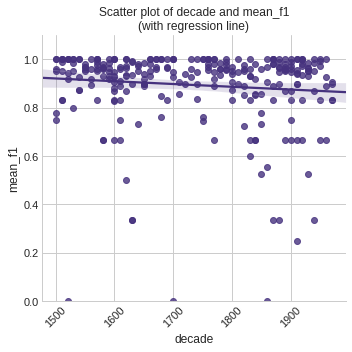

In [43]:
describe_data.describe_corpus_scatter(results_total_decade_df, wdir, "decade", "mean_f1", "CORDE by decades (size of texts controlled)")

In [44]:
stats.linregress(results_total_decade_df["decade"], results_total_decade_df["mean_f1"])

LinregressResult(slope=-0.00011467931304101273, intercept=1.0928814191029872, rvalue=-0.10099374306938848, pvalue=0.09524239043117232, stderr=6.849832391331259e-05)